In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
#plt.style.use(['dark_background'])

from fem import Fem
from atexpmesh import ArcTanExpMesh
from atplmesh import ArcTanPowerLawMesh
from source import StepSource

from symmetron import SymSolver
from physics import SymPhysics

import numpy as np
import scipy.optimize as sopt
from scipy.special import gamma

In [2]:
# common params
coupling = 'linear'
D = 2

mu = 1e0
M = 1e0
lam = 1e-1

In [3]:
num_ms = 70 # "ms" here is properly the source mass in natural units
num_x0 = 50

log_ms = np.linspace( -0.5, 6.5, num_ms, endpoint=True )
    
log_x0 = np.linspace( -6.5, 0.5, num_x0, endpoint=True )

log_x0_mg, log_ms_mg = np.meshgrid( log_x0, log_ms )

In [4]:
# initialise arrays of quantities
phi_rs_array = np.zeros_like(log_ms_mg)
grad_rs_array = np.zeros_like(log_ms_mg)
max_grad_array = np.zeros_like(log_ms_mg)
derrick1_array = np.zeros_like(log_ms_mg)
derrick2_array = np.zeros_like(log_ms_mg)
derrick3_array = np.zeros_like(log_ms_mg)
derrick4_array = np.zeros_like(log_ms_mg)
healing_array = np.zeros_like(log_ms_mg)
Healing_array = np.zeros_like(log_ms_mg)
oldcharges_array = np.zeros_like(log_ms_mg)
newcharges_array = np.zeros_like(log_ms_mg)

In [5]:
# giant loop on all the models
counter = 0
for i, l_ms in enumerate(log_ms):
    for j, l_x0 in enumerate(log_x0):
        counter +=1
        
        ms = 10.**l_ms
        x0 = 10.**l_x0
        
        # get source mass from dimensionless mass parametrisation
        if coupling=='quadratic':
            Ms=ms*mu**(2.-D)*M**2
        elif coupling=='linear':
            Ms=ms*mu**(3.-D)*M/np.sqrt(lam)
            
        # define overall physics object
        physics = SymPhysics( D, coupling, mu, lam, M,
                             Rs=x0/mu, Ms=Ms )
            
        # build mesh and source
        if x0 > 1. :
            mesh = ArcTanExpMesh( physics )
            fem = Fem( mesh, func_degree=3 )
            # more stringent tolerance is needed when x0>1
            abs_res_tol = 1e-15
        else:
            mesh = ArcTanPowerLawMesh( physics )
            fem = Fem( mesh )
            abs_res_tol = 1e-10
        source = StepSource( fem, physics )
        
        # solver
        p = SymSolver( fem, source, physics, 
                      abs_res_tol=abs_res_tol )
        p.solve()
        
        # evaluate radius for screening factors
        healing_array[i,j] = p.r_healing
        Healing_array[i,j] = p.r_healing * x0
        #r_eval = 5.* p.r_healing
        r_eval = 1e1 / x0
        
        vev = physics.Vev

        phi_rs_array[i,j] = p.Phi_rs / vev
        phi_eval = p.Phi(r_eval) / vev
        
        grad_rs_array[i,j] = p.grad_Phi_rs * x0 / (mu*vev)
        grad_eval = p.grad_Phi(r_eval) / (mu*vev)
        
        derrick1_array[i,j] = p.derrick[0]
        derrick2_array[i,j] = p.derrick[1]
        derrick3_array[i,j] = p.derrick[2]
        derrick4_array[i,j] = p.derrick[3]
        
        max_grad_array[i,j] = p.grad_Phi_max * x0/(mu*vev)
    
        p.old_analytics.compute_old_charge()
        p.compute_screening_factor()
        
        oldcharges_array[i,j] = p.old_analytics.old_charge(r_eval)
        newcharges_array[i,j] = p.screening_factor(r_eval)
        
        print '\n***************************************************'
        print '    Model %d of %d done' % ( counter, num_ms*num_x0 )
        print '    (%.2f %%)' % (float(counter)/num_ms/num_x0*100.)
        print '***************************************************\n'

initial_guess.py:282: RuntimeWarning: invalid value encountered in log
  -1./3. - x1**2/12. + C1*np.log(x1) + C2 ]


Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 3.0e-03	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 1.9e-06	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-11	rel_dphi = 1.4e-12	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 6.4e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1 of 3500 done
    (0.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 3.1e-03	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 1.9e-06	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi

Non-linear solver, iteration 2	abs_dphi = 9.4e-12	rel_dphi = 1.3e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-13	rel_dphi = 3.5e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-14	rel_dphi = 1.5e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-15	rel_dphi = 2.4e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-16	rel_dphi = 2.3e-17	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 2.8e-06	abs_res = 7.9e-11 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)

***************************************************
    Model 18 of 3500 done
    (0.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e-02	rel_dphi = 4.7e-03	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 3.0e-06	abs_res = 7.9e-11 (tol = 1.0e-10)	rel_res = 4.2e-04 (tol = 1.0e-20)

***************************************************
    Model 19 of 3500 done
    (0.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e-02	rel_dphi = 4.9e-03	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-05	rel_dphi = 3.1e-06	abs_res = 6.9e-11 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)

************************

Non-linear solver, iteration 0	abs_dphi = 5.5e-02	rel_dphi = 3.5e-02	abs_res = 6.4e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-05	rel_dphi = 2.9e-05	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)

***************************************************
    Model 38 of 3500 done
    (1.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 8.4e-02	rel_dphi = 6.0e-02	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 7.3e-05	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)

***************************************************
    Model 39 of 3500 done
    (1.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 1.1e-01	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

/Users/daniela/anaconda3/envs/phienics/lib/python2.7/site-packages/dolfin/functions/constant.py:75: ComplexWarning: Casting complex values to real discards the imaginary part
  floats = list(map(float, array.flat))


Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-02	rel_dphi = 8.9e-02	abs_res = 2.5e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.6e-05	rel_dphi = 1.5e-04	abs_res = 6.4e-13 (tol = 1.0e-15)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.2e-11	rel_dphi = 4.0e-10	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-14	rel_dphi = 2.7e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-15	rel_dphi = 8.8e-15	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-16	rel_dphi = 9.6e-16	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.2e-17	rel_dphi = 8.6e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.2e-17	rel_dphi = 5.4e-18	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.3e-15	rel_dphi = 7.3e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 54 of 3500 done
    (1.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 4.1e-03	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-05	rel_dphi = 4.2e-06	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-11	rel_dphi = 7.1e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-line

Non-linear solver, iteration 2	abs_dphi = 6.8e-11	rel_dphi = 1.0e-11	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-13	rel_dphi = 7.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-14	rel_dphi = 2.9e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-15	rel_dphi = 6.5e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-17	rel_dphi = 3.0e-18	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 13	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.3e-14	rel_dphi = 1.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab


***************************************************
    Model 68 of 3500 done
    (1.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e-02	rel_dphi = 5.5e-03	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-05	rel_dphi = 5.7e-06	abs_res = 7.0e-11 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)

***************************************************
    Model 69 of 3500 done
    (1.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e-02	rel_dphi = 5.7e-03	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-05	rel_dphi = 5.9e-06	abs_res = 8.1e-11 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)

***************************************************
    Model 70 of 3500 done
    (2.00 %)
***************************************************

Non-linear solver

Non-linear solver, iteration 1	abs_dphi = 5.6e-05	rel_dphi = 3.6e-05	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)

***************************************************
    Model 88 of 3500 done
    (2.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.8e-02	rel_dphi = 4.9e-02	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 7.2e-05	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)

***************************************************
    Model 89 of 3500 done
    (2.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 8.6e-02	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-04	rel_dphi = 1.9e-04	abs_res = 5.3e-11 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)

************************

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 3.8e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 100 of 3500 done
    (2.86 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-02	rel_dphi = 4.8e-03	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-05	rel_dphi = 7.9e-06	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-10	rel_dphi = 3.6e-11	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.4e-13	rel_dphi = 1.2e-13	abs_res = 

Non-linear solver, iteration 2	abs_dphi = 3.1e-10	rel_dphi = 4.1e-11	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-12	rel_dphi = 4.0e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.6e-14	rel_dphi = 1.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.9e-14	rel_dphi = 5.2e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-14	rel_dphi = 5.2e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.9e-14	rel_dphi = 5.2e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-14	rel_dphi = 5.2e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.2e-14	rel_dphi = 1.7e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 1	abs_dphi = 4.8e-05	rel_dphi = 1.3e-05	abs_res = 5.6e-11 (tol = 1.0e-10)	rel_res = 7.4e-05 (tol = 1.0e-20)

***************************************************
    Model 126 of 3500 done
    (3.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e-02	rel_dphi = 8.3e-03	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-05	rel_dphi = 1.4e-05	abs_res = 5.2e-11 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)

***************************************************
    Model 127 of 3500 done
    (3.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 8.9e-03	abs_res = 7.9e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-05	rel_dphi = 1.5e-05	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)

**********************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.4e-02	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-05	rel_dphi = 4.4e-05	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)

***************************************************
    Model 145 of 3500 done
    (4.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 4.1e-01	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 2.4e-12 (tol = 1.0e-10)	rel_res = 3.5e-08 (tol = 1.0e-20)

***************************************************
    Model 146 of 3500 done
    (4.17 %)
***************************************************

Calling FFC just-in-tim


***************************************************
    Model 147 of 3500 done
    (4.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.7e-03	rel_dphi = 5.2e-02	abs_res = 1.3e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-05	rel_dphi = 7.3e-05	abs_res = 2.3e-13 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-11	rel_dphi = 1.2e-10	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-14	rel_dphi = 4.0e-13	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 5.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-15	rel_dphi = 1.1e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.3e-17	rel_dphi = 5.6e-16	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	a

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-15	rel_dphi = 1.8e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.5e-13	rel_dphi = 4.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 157 of 3500 done
    (4.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 4.5e-02	rel_dphi = 7.0e-03	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-04	rel_dphi = 1.9e-05	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 1	abs_dphi = 1.2e-04	rel_dphi = 2.0e-05	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-09	rel_dphi = 2.3e-10	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-13	rel_dphi = 1.1e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 7.1e-05 (tol = 1.0e-20)

***************************************************
    Model 159 of 3500 done
    (4.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 4.7e-02	rel_dphi = 7.5e-03	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-04	rel_dphi = 2.0e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-09	rel_dphi = 2.4e-10	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	a

Non-linear solver, iteration 46	abs_dphi = 4.6e-13	rel_dphi = 7.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.6e-13	rel_dphi = 7.9e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.6e-13	rel_dphi = 7.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.6e-13	rel_dphi = 7.9e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 162 of 3500 done
    (4.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 4.6e-02	rel_dphi = 8.0e-03	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 0	abs_dphi = 3.0e-02	rel_dphi = 9.7e-03	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-05	rel_dphi = 2.5e-05	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)

***************************************************
    Model 179 of 3500 done
    (5.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.0e-02	rel_dphi = 1.0e-02	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-05	rel_dphi = 2.7e-05	abs_res = 6.4e-11 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)

***************************************************
    Model 180 of 3500 done
    (5.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.1e-02	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iter

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-02	rel_dphi = 1.9e-01	abs_res = 2.3e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-04	rel_dphi = 1.5e-03	abs_res = 1.1e-10 (tol = 1.0e-15)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-08	rel_dphi = 7.4e-08	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-13	rel_dphi = 1.3e-12	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-14	rel_dphi = 5.3e-14	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 5.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.1e-16	rel_dphi = 2.6e-15	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-16	rel_dphi = 7.0e-16	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 6	abs_dphi = 1.1e-16	rel_dphi = 7.4e-16	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 1.7e-17	rel_dphi = 2.4e-18	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-17	rel_dphi = 2.4e-18	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 204 of 3500 done
    (5.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 5.9e-02	rel_dphi = 8.4e-03	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-04	rel_dphi = 3.7e-05	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-09	rel_dphi = 1.1e-09	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-lin

Non-linear solver, iteration 2	abs_dphi = 8.1e-09	rel_dphi = 1.2e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.8e-12	rel_dphi = 1.1e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.5e-13	rel_dphi = 1.2e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.5e-14	rel_dphi = 1.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-14	rel_dphi = 1.9e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.1e-15	rel_dphi = 1.0e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-15	rel_dphi = 6.5e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 7.9e-09	rel_dphi = 1.2e-09	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-12	rel_dphi = 4.4e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.4e-13	rel_dphi = 6.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-14	rel_dphi = 8.4e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-15	rel_dphi = 1.4e-15	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-15	rel_dphi = 3.4e-16	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-15	rel_dphi = 2.0e-16	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 2	abs_dphi = 8.0e-09	rel_dphi = 1.5e-09	abs_res = 8.5e-11 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)

***************************************************
    Model 216 of 3500 done
    (6.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 5.9e-02	rel_dphi = 1.2e-02	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-04	rel_dphi = 5.1e-05	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.1e-09	rel_dphi = 1.6e-09	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-12	rel_dphi = 9.2e-13	abs_res = 8.7e-11 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)

***************************************************
    Model 217 of 3500 done
    (6.20 %)
***************************************************

Non-linear solver, iter


***************************************************
    Model 230 of 3500 done
    (6.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.0e-02	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 4.0e-05	abs_res = 4.1e-11 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)

***************************************************
    Model 231 of 3500 done
    (6.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.1e-02	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 4.3e-05	abs_res = 4.3e-11 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)

***************************************************
    Model 232 of 3500 done
    (6.63 %)
***************************************************

Non-linear sol

Non-linear solver, iteration 4	abs_dphi = 2.2e-14	rel_dphi = 9.4e-14	abs_res = 8.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-15	rel_dphi = 7.8e-15	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.5e-16	rel_dphi = 1.0e-15	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-16	rel_dphi = 1.4e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.9e-17	rel_dphi = 9.9e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.3e-16	rel_dphi = 4.3e-17	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 46	abs_dphi = 4.4e-16	rel_dphi = 6.0e-17	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.4e-16	rel_dphi = 6.0e-17	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.4e-16	rel_dphi = 6.0e-17	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.4e-16	rel_dphi = 6.0e-17	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 253 of 3500 done
    (7.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.4e-02	rel_dphi = 1.0e-02	abs_res = 4.6e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 44	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.3e-15	rel_dphi = 7.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********


***************************************************
    Model 256 of 3500 done
    (7.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.5e-02	rel_dphi = 1.1e-02	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.3e-04	rel_dphi = 7.9e-05	abs_res = 5.3e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-08	rel_dphi = 6.7e-09	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-11	rel_dphi = 2.6e-12	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-12	rel_dphi = 2.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.5e-13	rel_dphi = 6.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	a

Non-linear solver, iteration 6	abs_dphi = 2.8e-16	rel_dphi = 4.2e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.9e-14	rel_dphi = 1.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.7e-15	rel_dphi = 4.4e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 26	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.9e-15	rel_dphi = 1.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 29	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.2e-14	rel_dphi = 1.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 2	abs_dphi = 4.4e-08	rel_dphi = 1.4e-08	abs_res = 9.0e-11 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)

***************************************************
    Model 278 of 3500 done
    (7.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.4e-02	rel_dphi = 2.4e-02	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.3e-04	rel_dphi = 1.7e-04	abs_res = 6.9e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-08	rel_dphi = 1.4e-08	abs_res = 7.4e-11 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)

***************************************************
    Model 279 of 3500 done
    (7.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.4e-02	rel_dphi = 2.5e-02	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iter

Non-linear solver, iteration 1	abs_dphi = 1.0e-02	rel_dphi = 1.7e-02	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-05	rel_dphi = 2.6e-05	abs_res = 8.6e-12 (tol = 1.0e-10)	rel_res = 7.5e-08 (tol = 1.0e-20)

***************************************************
    Model 294 of 3500 done
    (8.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.4e-02	rel_dphi = 6.9e-02	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-04	rel_dphi = 3.9e-04	abs_res = 9.5e-11 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)

***************************************************
    Model 295 of 3500 done
    (8.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 6.5e-02	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iter

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 297 of 3500 done
    (8.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 1.1e-01	abs_res = 1.2e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 6.8e-04	abs_res = 3.3e-11 (tol = 1.0e-15)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-09	rel_dphi = 2.2e-08	abs_res = 8.5e-14 (tol = 1.0e-15)	rel_res = 7.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.3e-14	rel_dphi = 6.0e-13	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 7.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.7e-15	rel_dphi = 3.7e-14	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 5.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.7e-16	rel_dphi = 3.1e-15	abs_res = 8.7e-14 (tol = 1.0e-15)	

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.2e-13	rel_dphi = 4.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 305 of 3500 done
    (8.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.6e-02	rel_dphi = 1.4e-02	abs_res = 9.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 1.6e-04	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 3.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 3.7e-08	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-lin

Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 3.8e-08	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-11	rel_dphi = 4.1e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-13	rel_dphi = 4.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-13	rel_dphi = 2.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-14	rel_dphi = 5.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-14	rel_dphi = 1.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-15	rel_dphi = 3.3e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-16	rel_dphi = 7.1e-17	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********


***************************************************
    Model 314 of 3500 done
    (8.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.5e-02	rel_dphi = 1.7e-02	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 2.0e-04	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 3.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 4.7e-08	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-11	rel_dphi = 3.4e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.6e-13	rel_dphi = 1.0e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-14	rel_dphi = 5.1e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	a

Non-linear solver, iteration 6	abs_dphi = 5.6e-14	rel_dphi = 1.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.2e-14	rel_dphi = 1.0e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-14	rel_dphi = 1.0e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.1e-14	rel_dphi = 9.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.1e-14	rel_dphi = 9.6e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.1e-14	rel_dphi = 9.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.1e-14	rel_dphi = 9.6e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 9	abs_dphi = 1.0e-13	rel_dphi = 2.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.0e-14	rel_dphi = 1.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.6e-14	rel_dphi = 9.3e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-13	rel_dphi = 2.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-14	rel_dphi = 1.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.6e-14	rel_dphi = 9.3e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-13	rel_dphi = 2.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 6.0e-08	abs_res = 8.3e-11 (tol = 1.0e-10)	rel_res = 7.0e-06 (tol = 1.0e-20)

***************************************************
    Model 322 of 3500 done
    (9.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.5e-02	rel_dphi = 2.3e-02	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 2.7e-04	abs_res = 3.7e-09 (tol = 1.0e-10)	rel_res = 3.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-07	rel_dphi = 6.2e-08	abs_res = 6.5e-11 (tol = 1.0e-10)	rel_res = 5.3e-06 (tol = 1.0e-20)

***************************************************
    Model 323 of 3500 done
    (9.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.5e-02	rel_dphi = 2.4e-02	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iter

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 1.3e-02	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 9.3e-05	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-09	rel_dphi = 4.4e-09	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 7.1e-06 (tol = 1.0e-20)

***************************************************
    Model 337 of 3500 done
    (9.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 1.4e-02	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 1.0e-04	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-09	rel_dphi = 4.7e-09	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 5.5e-06 (tol = 1.0e-20)

*******************************

Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 351 of 3500 done
    (10.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 2.6e-03	abs_re

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 2.6e-03	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 2.4e-05	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 1.7e-09	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.2e-12	rel_dphi = 1.1e-12	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 6.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-12	rel_dphi = 1.4e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.0e-13	rel_dphi = 9.4e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 6.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.8e-13	rel_dphi = 9.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.8e-13	rel_dphi = 2.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 28	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.3e-15	rel_dphi = 7.9e-16	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 49	abs_dphi = 2.8e-13	rel_dphi = 4.5e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.7e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 360 of 3500 done
    (10.29 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 3.2e-03	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 2.9e-05	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 2.0e-09	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-12	rel_dphi = 2.7e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-lin

Non-linear solver, iteration 3	abs_dphi = 5.6e-12	rel_dphi = 9.5e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-13	rel_dphi = 1.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-14	rel_dphi = 4.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-15	rel_dphi = 2.6e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-16	rel_dphi = 5.6e-17	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 8.9e-14	rel_dphi = 1.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-13	rel_dphi = 1.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-13	rel_dphi = 2.0e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-13	rel_dphi = 2.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-13	rel_dphi = 2.0e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-13	rel_dphi = 2.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-13	rel_dphi = 2.0e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 14	abs_dphi = 2.2e-13	rel_dphi = 4.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-13	rel_dphi = 4.3e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-13	rel_dphi = 4.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-13	rel_dphi = 4.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.2e-13	rel_dphi = 4.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-13	rel_dphi = 4.3e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-13	rel_dphi = 4.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 4.4e-03	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 3.9e-05	abs_res = 2.3e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 2.8e-09	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)

***************************************************
    Model 371 of 3500 done
    (10.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 4.5e-03	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 4.1e-05	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-08	rel_dphi = 3.0e-09	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 2	abs_dphi = 1.2e-08	rel_dphi = 5.7e-09	abs_res = 3.5e-11 (tol = 1.0e-10)	rel_res = 6.7e-06 (tol = 1.0e-20)

***************************************************
    Model 385 of 3500 done
    (11.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.8e-02	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-03	rel_dphi = 1.1e-03	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 8.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 6.8e-07	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)

***************************************************
    Model 386 of 3500 done
    (11.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 6.1e-02	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, it

Non-linear solver, iteration 13	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 7.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-16	rel_dphi = 1.4e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 8.9e-16	rel_dphi = 1.1e-16	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 402 of 3500 done
    (11.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 2.1e-03	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 2.3e-05	abs_res = 2.9e-10 (tol = 1.0e-10)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 2.3e-09	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 2.3e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-11	rel_dphi = 3.2e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-12	rel_dphi = 5.4e-13	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)

***************************************************
    Model 404 of 3500 done
    (11.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 2.2e-03	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 2.4e-05	abs_res = 2.9e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 2.4e-09	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 3	abs_dphi = 3.5e-11	rel_dphi = 5.0e-12	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-12	rel_dphi = 2.6e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-13	rel_dphi = 2.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-14	rel_dphi = 9.3e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-14	rel_dphi = 4.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-14	rel_dphi = 2.0e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.0e-15	rel_dphi = 1.1e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 1.1e-15	rel_dphi = 1.6e-16	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-16	rel_dphi = 3.3e-17	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.5e-14	rel_dphi = 8.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 24	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.4e-15	rel_dphi = 6.9e-16	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 31	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.3e-18	rel_dphi = 6.9e-19	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 38	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-14	rel_dphi = 3.5e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 45	abs_dphi = 1.1e-14	rel_dphi = 1.8e-15	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-14	rel_dphi = 1.8e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-14	rel_dphi = 1.8e-15	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-14	rel_dphi = 1.8e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-14	rel_dphi = 1.8e-15	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 412 of 3500 done
    (11.77 %)
***************************************************

Non


***************************************************
    Model 413 of 3500 done
    (11.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 2.8e-03	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 3.0e-05	abs_res = 3.2e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 3.0e-09	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-12	rel_dphi = 6.3e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-12	rel_dphi = 1.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-13	rel_dphi = 4.0e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	


***************************************************
    Model 415 of 3500 done
    (11.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.0e-03	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 3.2e-05	abs_res = 3.3e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 3.1e-09	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-12	rel_dphi = 5.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-13	rel_dphi = 2.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-13	rel_dphi = 2.3e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 3.5e-09	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.7e-12	rel_dphi = 2.0e-12	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.0e-13	rel_dphi = 1.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-13	rel_dphi = 3.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-14	rel_dphi = 1.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.8e-14	rel_dphi = 5.5e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-14	rel_dphi = 2.5e-15	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 48	abs_dphi = 2.2e-15	rel_dphi = 4.8e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.2e-15	rel_dphi = 4.8e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 420 of 3500 done
    (12.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.6e-03	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 3.8e-05	abs_res = 3.6e-10 (tol = 1.0e-10)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 3.8e-09	abs_res = 9.1e-11 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)

*****

Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 7.3e-05	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-08	rel_dphi = 7.7e-09	abs_res = 4.6e-11 (tol = 1.0e-10)	rel_res = 7.3e-06 (tol = 1.0e-20)

***************************************************
    Model 434 of 3500 done
    (12.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 7.3e-03	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-04	rel_dphi = 7.7e-05	abs_res = 4.9e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 7.8e-09	abs_res = 2.9e-11 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)

***************************************************
    Model 435 of 3500 done
    (12.43 %)
***************************************************

Non-linear solver, it

Non-linear solver, iteration 8	abs_dphi = 1.4e-16	rel_dphi = 5.4e-16	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.6e-17	rel_dphi = 6.0e-16	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.6e-14	rel_dphi = 7.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-14	rel_dphi = 6.8e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
**********************************


***************************************************
    Model 453 of 3500 done
    (12.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 1.7e-03	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-04	rel_dphi = 2.1e-05	abs_res = 3.9e-10 (tol = 1.0e-10)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-08	rel_dphi = 2.8e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-11	rel_dphi = 4.4e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.2e-13	rel_dphi = 7.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 3.0e-14	rel_dphi = 4.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.9e-14	rel_dphi = 8.2e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-14	rel_dphi = 3.6e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-14	rel_dphi = 2.9e-15	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-14	rel_dphi = 1.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-14	rel_dphi = 4.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.9e-14	rel_dphi = 8.2e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 8.9e-16	rel_dphi = 1.4e-16	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 5.5e-13	rel_dphi = 8.8e-14	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.5e-13	rel_dphi = 8.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 461 of 3500 done
    (13.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 2.1e-03	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 2.6e-05	abs_res = 4.3e-10 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-08	rel_dphi = 3.5e-09	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 2	abs_dphi = 2.1e-08	rel_dphi = 3.6e-09	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-11	rel_dphi = 5.8e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-12	rel_dphi = 4.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.1e-14	rel_dphi = 1.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-14	rel_dphi = 2.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-14	rel_dphi = 2.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-14	rel_dphi = 2.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 7.4e-14	rel_dphi = 1.3e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-14	rel_dphi = 3.1e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-13	rel_dphi = 2.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-13	rel_dphi = 3.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-14	rel_dphi = 1.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-14	rel_dphi = 2.0e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-13	rel_dphi = 2.5e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 13	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-15	rel_dphi = 7.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 2	abs_dphi = 2.1e-08	rel_dphi = 4.8e-09	abs_res = 9.7e-11 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)

***************************************************
    Model 472 of 3500 done
    (13.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 3.0e-03	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 3.7e-05	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-08	rel_dphi = 4.8e-09	abs_res = 7.8e-11 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)

***************************************************
    Model 473 of 3500 done
    (13.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 3.2e-03	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, it

Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 8.4e-05	abs_res = 7.3e-10 (tol = 1.0e-10)	rel_res = 9.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-08	rel_dphi = 1.2e-08	abs_res = 3.7e-11 (tol = 1.0e-10)	rel_res = 4.8e-06 (tol = 1.0e-20)

***************************************************
    Model 487 of 3500 done
    (13.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e-02	rel_dphi = 7.4e-03	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-04	rel_dphi = 9.2e-05	abs_res = 7.3e-10 (tol = 1.0e-10)	rel_res = 9.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.2e-08	rel_dphi = 1.3e-08	abs_res = 2.9e-11 (tol = 1.0e-10)	rel_res = 3.8e-06 (tol = 1.0e-20)

***************************************************
    Model 488 of 3500 done
    (13.94 %)
***************************************************

Non-linear solver, it

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 40	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.4e-17	rel_dphi = 2.7e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 6.2e-13	rel_dphi = 7.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.6e-13	rel_dphi = 8.3e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.7e-13	rel_dphi = 8.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 501 of 3500 done
    (14.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.4e-03	rel_dphi = 1.2e-03	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 1.5e-05	abs_res

Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 1.5e-05	abs_res = 3.7e-10 (tol = 1.0e-10)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 2.2e-09	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-12	rel_dphi = 2.0e-13	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.8e-13	rel_dphi = 9.0e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-13	rel_dphi = 2.5e-14	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.1e-14	rel_dphi = 6.8e-15	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-14	rel_dphi = 2.4e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 5.1e-12	rel_dphi = 6.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-12	rel_dphi = 6.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.2e-12	rel_dphi = 7.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-12	rel_dphi = 7.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.1e-12	rel_dphi = 6.9e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.8e-12	rel_dphi = 6.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-12	rel_dphi = 7.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 47	abs_dphi = 2.8e-14	rel_dphi = 3.9e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.8e-14	rel_dphi = 3.9e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.8e-14	rel_dphi = 3.9e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 505 of 3500 done
    (14.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.4e-03	rel_dphi = 1.3e-03	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 1.6e-05	abs_res = 3.8e-10 (tol = 1.0e-10)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 1.6e-05	abs_res = 3.8e-10 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 2.4e-09	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-11	rel_dphi = 4.6e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-12	rel_dphi = 1.8e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 2.3e-13	rel_dphi = 3.4e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.0e-13	rel_dphi = 9.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.9e-13	rel_dphi = 5.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-13	rel_dphi = 3.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-13	rel_dphi = 9.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-13	rel_dphi = 5.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-13	rel_dphi = 3.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.2e-15	rel_dphi = 9.5e-16	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-13	rel_dphi = 3.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.3e-15	rel_dphi = 2.1e-16	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.8e-15	rel_dphi = 1.6e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 9.9e-13	rel_dphi = 1.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.6e-13	rel_dphi = 1.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.5e-13	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 9.8e-13	rel_dphi = 1.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.9e-13	rel_dphi = 1.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 9.6e-13	rel_dphi = 1.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.5e-13	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
**********************************


***************************************************
    Model 514 of 3500 done
    (14.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.3e-03	rel_dphi = 1.7e-03	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 2.0e-05	abs_res = 4.1e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-08	rel_dphi = 2.9e-09	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-11	rel_dphi = 3.1e-12	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-12	rel_dphi = 2.9e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.7e-13	rel_dphi = 6.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 2.9e-13	rel_dphi = 5.4e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-13	rel_dphi = 4.2e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-13	rel_dphi = 3.7e-14	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-13	rel_dphi = 2.4e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.0e-14	rel_dphi = 9.2e-15	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-14	rel_dphi = 4.1e-15	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.9e-14	rel_dphi = 7.1e-15	abs_res = 2.6e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 3.3e-09	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-11	rel_dphi = 8.8e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-12	rel_dphi = 3.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.8e-13	rel_dphi = 9.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-14	rel_dphi = 5.4e-15	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)

***************************************************
    Model 518 of 3500 done
    (14.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.3e-03	rel_dphi = 1.9e-03	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	


***************************************************
    Model 530 of 3500 done
    (15.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.3e-03	rel_dphi = 3.2e-03	abs_res = 6.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 3.8e-05	abs_res = 5.1e-10 (tol = 1.0e-10)	rel_res = 8.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-08	rel_dphi = 5.7e-09	abs_res = 6.6e-11 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)

***************************************************
    Model 531 of 3500 done
    (15.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.4e-03	rel_dphi = 3.4e-03	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-04	rel_dphi = 4.1e-05	abs_res = 5.4e-10 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, it

Non-linear solver, iteration 2	abs_dphi = 3.9e-06	rel_dphi = 6.4e-06	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 3.4e-07 (tol = 1.0e-20)

***************************************************
    Model 545 of 3500 done
    (15.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 3.8e-01	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-02	rel_dphi = 5.1e-02	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-04	rel_dphi = 8.3e-04	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-08	rel_dphi = 2.3e-07	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 1.7e-08 (tol = 1.0e-20)

***************************************************
    Model 546 of 3500 done
    (15.60 %)
***************************************************

Calling FFC just-in-t


***************************************************
    Model 547 of 3500 done
    (15.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.7e-02	rel_dphi = 1.6e-01	abs_res = 5.3e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.2e-04	rel_dphi = 4.2e-03	abs_res = 3.5e-09 (tol = 1.0e-15)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-07	rel_dphi = 2.7e-06	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-13	rel_dphi = 1.3e-12	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.9e-14	rel_dphi = 2.9e-13	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.8e-15	rel_dphi = 5.1e-14	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 5.6e-17	rel_dphi = 5.7e-16	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 3.4e-12	rel_dphi = 4.3e-13	abs_res = 2.5e-10 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-12	rel_dphi = 3.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.1e-12	rel_dphi = 3.9e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-12	rel_dphi = 4.1e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-12	rel_dphi = 4.2e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-12	rel_dphi = 3.9e-13	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.1e-12	rel_dphi = 3.9e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 8.0e-13	rel_dphi = 1.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-12	rel_dphi = 2.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.1e-13	rel_dphi = 1.2e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.0e-13	rel_dphi = 1.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-12	rel_dphi = 2.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.1e-13	rel_dphi = 1.2e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.0e-13	rel_dphi = 1.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 4.5e-13	rel_dphi = 6.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.7e-13	rel_dphi = 5.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.1e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 555 of 3500 done
    (15.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.4e-02	rel_dphi = 4.8e-03	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-05	rel_dphi = 9.8e-06	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-10	rel_dphi = 8.2e-11	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.1e-05 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 2	abs_dphi = 5.8e-10	rel_dphi = 8.4e-11	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.1e-12	rel_dphi = 1.3e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-12	rel_dphi = 2.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.6e-14	rel_dphi = 1.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-14	rel_dphi = 8.5e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.1e-14	rel_dphi = 1.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-14	rel_dphi = 2.6e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 8.2e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.3e-13	rel_dphi = 1.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.8e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.9e-13	rel_dphi = 1.2e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 2.6e-12	rel_dphi = 3.9e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.0e-12	rel_dphi = 3.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.8e-12	rel_dphi = 2.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-12	rel_dphi = 3.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-12	rel_dphi = 3.9e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-12	rel_dphi = 3.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-12	rel_dphi = 2.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 8.2e-13	rel_dphi = 1.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.8e-12	rel_dphi = 2.7e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 9.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-12	rel_dphi = 3.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.1e-12	rel_dphi = 3.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.1e-12	rel_dphi = 3.2e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.2e-12	rel_dphi = 3.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.8e-15	rel_dphi = 2.8e-16	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 25	abs_dphi = 9.2e-13	rel_dphi = 1.5e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 7.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.7e-13	rel_dphi = 1.1e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-13	rel_dphi = 3.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-12	rel_dphi = 1.7e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-12	rel_dphi = 2.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.5e-13	rel_dphi = 1.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.9e-13	rel_dphi = 4.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.5e-14	rel_dphi = 6.1e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 39	abs_dphi = 1.5e-12	rel_dphi = 2.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.2e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.4e-12	rel_dphi = 2.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.7e-12	rel_dphi = 3.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.5e-12	rel_dphi = 2.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.2e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.4e-12	rel_dphi = 2.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab


***************************************************
    Model 568 of 3500 done
    (16.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.5e-02	rel_dphi = 7.1e-03	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-05	rel_dphi = 1.5e-05	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-10	rel_dphi = 1.7e-10	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)

***************************************************
    Model 569 of 3500 done
    (16.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.5e-02	rel_dphi = 7.3e-03	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-05	rel_dphi = 1.5e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, it

Non-linear solver, iteration 0	abs_dphi = 2.7e-02	rel_dphi = 1.3e-02	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.5e-05	rel_dphi = 1.7e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-09	rel_dphi = 6.7e-10	abs_res = 3.9e-11 (tol = 1.0e-10)	rel_res = 9.1e-06 (tol = 1.0e-20)

***************************************************
    Model 587 of 3500 done
    (16.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e-02	rel_dphi = 1.3e-02	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-05	rel_dphi = 1.4e-05	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-09	rel_dphi = 1.0e-09	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 6.3e-06 (tol = 1.0e-20)

******************************

Non-linear solver, iteration 19	abs_dphi = 1.8e-15	rel_dphi = 6.0e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 5.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-15	rel_dphi = 4.0e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 5.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-15	rel_dphi = 3.7e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.2e-16	rel_dphi = 2.4e-15	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.4e-16	rel_dphi = 1.5e-15	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 6.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.4e-16	rel_dphi = 1.5e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 5.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-16	rel_dphi = 9.1e-16	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 33	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-15	rel_dphi = 1.7e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 40	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.5e-15	rel_dphi = 8.5e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 1.4e-12	rel_dphi = 1.7e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.1e-13	rel_dphi = 5.1e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.0e-13	rel_dphi = 5.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 601 of 3500 done
    (17.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 2.0e-02	abs_res = 8.0e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-03	rel_dphi = 1.0e-03	abs_res

Non-linear solver, iteration 1	abs_dphi = 7.9e-03	rel_dphi = 1.0e-03	abs_res = 9.8e-08 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-05	rel_dphi = 3.7e-06	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-10	rel_dphi = 3.3e-11	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-11	rel_dphi = 1.7e-12	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-12	rel_dphi = 2.2e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.0e-13	rel_dphi = 1.2e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-13	rel_dphi = 6.1e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 6.2e-12	rel_dphi = 8.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.8e-12	rel_dphi = 7.7e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.0e-12	rel_dphi = 8.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.3e-12	rel_dphi = 8.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-12	rel_dphi = 7.4e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-12	rel_dphi = 5.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-12	rel_dphi = 5.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 7.1e-13	rel_dphi = 9.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-13	rel_dphi = 7.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.7e-13	rel_dphi = 9.2e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.6e-13	rel_dphi = 9.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-13	rel_dphi = 7.7e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-12	rel_dphi = 1.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 6.4e-12	rel_dphi = 9.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-12	rel_dphi = 7.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.3e-12	rel_dphi = 8.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.3e-12	rel_dphi = 1.0e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.9e-12	rel_dphi = 9.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.2e-12	rel_dphi = 1.1e-12	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.2e-12	rel_dphi = 8.6e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 6.7e-13	rel_dphi = 9.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-12	rel_dphi = 2.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-12	rel_dphi = 2.4e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.9e-12	rel_dphi = 2.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-12	rel_dphi = 1.9e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-12	rel_dphi = 2.4e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 6.8e-13	rel_dphi = 9.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.7e-13	rel_dphi = 8.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.8e-13	rel_dphi = 8.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.5e-13	rel_dphi = 1.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.0e-13	rel_dphi = 1.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 7.1e-13	rel_dphi = 1.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.2e-13	rel_dphi = 7.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 15	abs_dphi = 5.3e-12	rel_dphi = 8.2e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.7e-12	rel_dphi = 8.7e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.4e-12	rel_dphi = 1.3e-12	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-12	rel_dphi = 1.2e-12	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.4e-12	rel_dphi = 8.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.9e-12	rel_dphi = 9.1e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.6e-12	rel_dphi = 1.2e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 4.0e-13	rel_dphi = 6.2e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.8e-13	rel_dphi = 2.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-12	rel_dphi = 2.4e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-13	rel_dphi = 5.3e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-13	rel_dphi = 1.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 16	abs_dphi = 5.1e-13	rel_dphi = 8.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-13	rel_dphi = 5.6e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-13	rel_dphi = 2.3e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-13	rel_dphi = 6.2e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.8e-13	rel_dphi = 8.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.1e-14	rel_dphi = 8.6e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.7e-14	rel_dphi = 6.2e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 7.9e-13	rel_dphi = 1.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-13	rel_dphi = 3.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.0e-13	rel_dphi = 5.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-12	rel_dphi = 3.5e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.9e-12	rel_dphi = 5.0e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.2e-12	rel_dphi = 3.8e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.0e-13	rel_dphi = 1.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 1.6e-12	rel_dphi = 2.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-12	rel_dphi = 2.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-12	rel_dphi = 3.0e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-12	rel_dphi = 2.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-12	rel_dphi = 2.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.6e-12	rel_dphi = 4.6e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.3e-12	rel_dphi = 4.0e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 6	abs_dphi = 4.1e-13	rel_dphi = 8.5e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-14	rel_dphi = 1.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-13	rel_dphi = 2.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-13	rel_dphi = 2.9e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.7e-14	rel_dphi = 1.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.8e-14	rel_dphi = 1.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-13	rel_dphi = 2.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 1	abs_dphi = 8.0e-03	rel_dphi = 1.9e-03	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-05	rel_dphi = 6.7e-06	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-10	rel_dphi = 2.3e-10	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-11	rel_dphi = 3.7e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.7e-12	rel_dphi = 8.8e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-12	rel_dphi = 4.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.8e-13	rel_dphi = 1.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 7.1e-03	rel_dphi = 3.4e-03	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-05	rel_dphi = 1.1e-05	abs_res = 3.3e-11 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)

***************************************************
    Model 637 of 3500 done
    (18.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 7.1e-02	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-03	rel_dphi = 3.5e-03	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 8.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-05	rel_dphi = 1.1e-05	abs_res = 3.2e-11 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)

***************************************************
    Model 638 of 3500 done
    (18.23 %)
***************************************************

Non-linear solver, it

Non-linear solver, iteration 21	abs_dphi = 2.6e-13	rel_dphi = 8.4e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.3e-13	rel_dphi = 1.1e-12	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-13	rel_dphi = 4.8e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-13	rel_dphi = 3.8e-13	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-13	rel_dphi = 6.2e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-13	rel_dphi = 8.8e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.4e-13	rel_dphi = 1.1e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 28	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-18	rel_dphi = 3.5e-17	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 35	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 8.3e-17	rel_dphi = 8.0e-16	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 42	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.1e-17	rel_dphi = 3.8e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 49	abs_dphi = 4.1e-12	rel_dphi = 4.5e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 651 of 3500 done
    (18.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 1.4e-01	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-01	rel_dphi = 7.5e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-01	rel_dphi = 4.1e-02	abs_res = 8.6e-03 (tol = 1.0e-10)	rel_res = 9.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 3.0e-02	abs_res =

Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 3.2e-02	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 3.4e-02	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 5.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 1.5e-02	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 2.5e-03	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-04	rel_dphi = 5.4e-05	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-07	rel_dphi = 2.7e-08	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-11	rel_dphi = 3.5e-12	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 1.5e-12	rel_dphi = 1.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-12	rel_dphi = 1.2e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-12	rel_dphi = 1.4e-13	abs_res = 8.9e-11 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)

***************************************************
    Model 654 of 3500 done
    (18.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.3e-01	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 1	abs_dphi = 6.7e-01	rel_dphi = 7.8e-02	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-01	rel_dphi = 4.2e-02	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 3.3e-02	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 7.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 3.6e-02	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 6.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 1.7e-02	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 3.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-02	rel_dphi = 3.2e-03	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 7.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.2e-04	rel_dphi = 8.5e-05	abs_res = 3.2e-09 (tol = 1.0e-10)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 1.3e-08	rel_dphi = 1.6e-09	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-11	rel_dphi = 3.6e-12	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.4e-12	rel_dphi = 7.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-12	rel_dphi = 2.5e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-12	rel_dphi = 4.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-12	rel_dphi = 5.4e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-12	rel_dphi = 4.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 2.6e-13	rel_dphi = 3.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-12	rel_dphi = 1.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-12	rel_dphi = 4.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.5e-13	rel_dphi = 3.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.7e-13	rel_dphi = 4.6e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-13	rel_dphi = 2.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 5.9e-12	rel_dphi = 7.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.1e-12	rel_dphi = 6.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.0e-12	rel_dphi = 6.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.7e-12	rel_dphi = 7.2e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.1e-12	rel_dphi = 7.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.8e-12	rel_dphi = 7.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.6e-12	rel_dphi = 8.3e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.7e-12	rel_dphi = 4.7e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-12	rel_dphi = 2.3e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.0e-13	rel_dphi = 1.2e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.6e-13	rel_dphi = 8.4e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.5e-12	rel_dphi = 3.3e-13	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.2e-12	rel_dphi = 2.8e-13	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 4.9e-12	rel_dphi = 6.3e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.4e-12	rel_dphi = 5.7e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.7e-12	rel_dphi = 3.5e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.8e-12	rel_dphi = 4.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.7e-12	rel_dphi = 7.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.7e-12	rel_dphi = 7.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.7e-12	rel_dphi = 6.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 2.1e-12	rel_dphi = 2.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.3e-12	rel_dphi = 4.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.8e-12	rel_dphi = 5.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-12	rel_dphi = 2.1e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.5e-13	rel_dphi = 7.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.3e-13	rel_dphi = 5.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
**********************************


***************************************************
    Model 663 of 3500 done
    (18.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 1.7e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-01	rel_dphi = 9.4e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-01	rel_dphi = 5.1e-02	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 9.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 3.9e-02	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 7.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-01	rel_dphi = 4.4e-02	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 6.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 2.2e-02	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 6.7e-03	rel_dphi = 9.8e-04	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.9e-05	rel_dphi = 5.7e-06	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-09	rel_dphi = 2.2e-10	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-11	rel_dphi = 2.3e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-12	rel_dphi = 4.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-12	rel_dphi = 2.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.7e-13	rel_dphi = 9.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 7.1e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-13	rel_dphi = 5.2e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-13	rel_dphi = 3.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-13	rel_dphi = 7.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-12	rel_dphi = 2.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.7e-12	rel_dphi = 4.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.6e-12	rel_dphi = 3.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 11	abs_dphi = 5.2e-12	rel_dphi = 8.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-12	rel_dphi = 5.6e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-13	rel_dphi = 2.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.9e-14	rel_dphi = 1.2e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.6e-13	rel_dphi = 7.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.3e-13	rel_dphi = 9.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 4.5e-02	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.2e-02	rel_dphi = 1.6e-02	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-02	rel_dphi = 1.8e-03	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-04	rel_dphi = 1.8e-05	abs_res = 8.8e-11 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)

***************************************************
    Model 671 of 3500 done
    (19.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.0e-01	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-01	rel_dphi = 1.1e-01	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	

Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 3.1e-03	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-04	rel_dphi = 4.4e-05	abs_res = 3.7e-10 (tol = 1.0e-10)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-08	rel_dphi = 9.7e-09	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)

***************************************************
    Model 677 of 3500 done
    (19.34 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 2.4e-01	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-01	rel_dphi = 1.3e-01	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 6.6e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	


***************************************************
    Model 683 of 3500 done
    (19.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 3.0e-01	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-01	rel_dphi = 1.6e-01	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-01	rel_dphi = 8.8e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 1.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 7.5e-02	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 7.6e-02	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 5.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 3.1e-02	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 2	abs_dphi = 2.7e-01	rel_dphi = 1.0e-01	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 1.1e-01	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 6.9e-02	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.3e-02	rel_dphi = 1.6e-02	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 4.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-03	rel_dphi = 8.9e-04	abs_res = 8.4e-08 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.4e-06	rel_dphi = 2.0e-06	abs_res = 2.2e-11 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)

***************************************************
    Model 690 of 3500 done
    (19.71 %)
***************************************************

Non-linear solver, iteration 0	

Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 4.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.3e-02	rel_dphi = 3.9e-02	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 9.9e-03	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-03	rel_dphi = 4.6e-04	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-06	rel_dphi = 8.0e-07	abs_res = 8.8e-12 (tol = 1.0e-10)	rel_res = 4.6e-11 (tol = 1.0e-20)

***************************************************
    Model 696 of 3500 done
    (19.89 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-02	rel_dphi = 7.3e-02	abs_res = 7.5e-06 (tol = 1.0e-15)

Non-linear solver, iteration 0	abs_dphi = 7.2e-02	rel_dphi = 3.3e-01	abs_res = 6.1e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-02	rel_dphi = 7.0e-02	abs_res = 2.2e-06 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-04	rel_dphi = 2.7e-03	abs_res = 3.3e-09 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-07	rel_dphi = 4.1e-06	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-12	rel_dphi = 9.3e-12	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-13	rel_dphi = 7.4e-13	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-14	rel_dphi = 9.6e-14	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.9e-15	rel_dphi = 1.7e-14	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-15	rel_dphi = 3.1e-14	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.9e-15	rel_dphi = 4.3e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.9e-15	rel_dphi = 5.2e-14	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.5e-15	rel_dphi = 5.7e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-15	rel_dphi = 6.1e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.3e-15	rel_dphi = 6.4e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.9e-17	rel_dphi = 8.5e-16	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-12	rel_dphi = 1.5e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.6e-12	rel_dphi = 1.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-12	rel_dphi = 1.6e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-12	rel_dphi = 1.9e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 28	abs_dphi = 9.9e-13	rel_dphi = 1.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.1e-12	rel_dphi = 4.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-12	rel_dphi = 3.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.3e-12	rel_dphi = 2.6e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.4e-12	rel_dphi = 2.8e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.1e-12	rel_dphi = 5.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.4e-12	rel_dphi = 3.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 35	abs_dphi = 1.9e-13	rel_dphi = 2.2e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.5e-13	rel_dphi = 2.9e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.6e-13	rel_dphi = 3.0e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.0e-13	rel_dphi = 4.7e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.8e-13	rel_dphi = 5.6e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.8e-13	rel_dphi = 3.3e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.8e-13	rel_dphi = 2.1e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 15	abs_dphi = 3.5e-13	rel_dphi = 4.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.2e-13	rel_dphi = 9.8e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-13	rel_dphi = 1.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.3e-14	rel_dphi = 6.4e-15	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.8e-13	rel_dphi = 2.2e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.2e-13	rel_dphi = 7.5e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.4e-13	rel_dphi = 5.3e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.3e-12	rel_dphi = 1.6e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.4e-13	rel_dphi = 9.3e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.1e-13	rel_dphi = 8.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.6e-13	rel_dphi = 5.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-12	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 8.0e-13	rel_dphi = 1.0e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.3e-13	rel_dphi = 8.0e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.9e-13	rel_dphi = 8.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.6e-12	rel_dphi = 2.0e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.3e-13	rel_dphi = 9.2e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-13	rel_dphi = 4.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.7e-13	rel_dphi = 8.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.8e-12	rel_dphi = 3.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.8e-12	rel_dphi = 3.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.9e-12	rel_dphi = 2.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.9e-12	rel_dphi = 2.4e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.5e-12	rel_dphi = 3.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.8e-12	rel_dphi = 3.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 6.7e-13	rel_dphi = 8.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.2e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.8e-13	rel_dphi = 1.3e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.2e-13	rel_dphi = 6.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.1e-13	rel_dphi = 4.1e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.5e-13	rel_dphi = 6.0e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.4e-12	rel_dphi = 1.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
**********************************


***************************************************
    Model 710 of 3500 done
    (20.29 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.5e-01	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-01	rel_dphi = 8.0e-02	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-01	rel_dphi = 4.2e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 2.9e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 6.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 2.9e-02	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.6e-02	rel_dphi = 1.2e-02	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 1.5e-03	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-04	rel_dphi = 2.1e-05	abs_res = 3.4e-10 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-08	rel_dphi = 4.9e-09	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-11	rel_dphi = 6.5e-12	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-12	rel_dphi = 4.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.7e-13	rel_dphi = 3.8e-14	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-13	rel_dphi = 3.4e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 6.4e-13	rel_dphi = 9.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-13	rel_dphi = 3.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-13	rel_dphi = 2.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.1e-13	rel_dphi = 7.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.3e-13	rel_dphi = 1.1e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-13	rel_dphi = 5.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 43	abs_dphi = 2.1e-12	rel_dphi = 3.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.9e-12	rel_dphi = 2.8e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.6e-12	rel_dphi = 2.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.0e-12	rel_dphi = 1.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.0e-12	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 13	abs_dphi = 8.9e-13	rel_dphi = 1.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.0e-12	rel_dphi = 3.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-12	rel_dphi = 2.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-12	rel_dphi = 3.6e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.7e-12	rel_dphi = 4.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-12	rel_dphi = 4.5e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-12	rel_dphi = 5.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 9	abs_dphi = 2.9e-11	rel_dphi = 5.2e-12	abs_res = 9.5e-11 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)

***************************************************
    Model 721 of 3500 done
    (20.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 1.9e-01	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-01	rel_dphi = 1.0e-01	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.9e-01	rel_dphi = 5.3e-02	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 3.9e-02	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 6.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 3.6e-02	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	

Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 2.2e-03	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-04	rel_dphi = 3.0e-05	abs_res = 3.9e-10 (tol = 1.0e-10)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-08	rel_dphi = 7.0e-09	abs_res = 6.9e-11 (tol = 1.0e-10)	rel_res = 7.9e-10 (tol = 1.0e-20)

***************************************************
    Model 727 of 3500 done
    (20.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 2.5e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-01	rel_dphi = 1.3e-01	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-01	rel_dphi = 6.9e-02	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 7	abs_dphi = 2.7e-04	rel_dphi = 7.3e-05	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-07	rel_dphi = 3.2e-08	abs_res = 5.1e-11 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)

***************************************************
    Model 733 of 3500 done
    (20.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 3.0e-01	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.4e-01	rel_dphi = 1.6e-01	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 8.1e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 6.2e-02	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 6.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	


***************************************************
    Model 739 of 3500 done
    (21.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 3.9e-01	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.7e-01	rel_dphi = 2.2e-01	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 1.2e-01	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 9.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 7.9e-02	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 7.8e-02	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.1e-02	rel_dphi = 3.1e-02	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 1	abs_dphi = 4.5e-01	rel_dphi = 2.5e-01	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-01	rel_dphi = 1.5e-01	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-01	rel_dphi = 9.0e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 3.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 6.6e-02	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.2e-02	rel_dphi = 2.4e-02	abs_res = 8.6e-05 (tol = 1.0e-10)	rel_res = 7.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-03	rel_dphi = 3.4e-03	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-04	rel_dphi = 6.5e-05	abs_res = 8.2e-10 (tol = 1.0e-10)	rel_res = 7.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

initial_guess.py:187: RuntimeWarning: invalid value encountered in log
  [ 0., -np.log(x2), -1. ]])


Non-linear solver, iteration 0	abs_dphi = 6.0e-01	rel_dphi = 3.8e-01	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.9e-01	rel_dphi = 2.4e-01	abs_res = 5.0e-03 (tol = 1.0e-15)	rel_res = 2.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-01	rel_dphi = 1.4e-01	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-01	rel_dphi = 8.2e-02	abs_res = 3.6e-04 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.0e-02	rel_dphi = 5.6e-02	abs_res = 1.4e-04 (tol = 1.0e-15)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.4e-02	rel_dphi = 2.1e-02	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.7e-03	rel_dphi = 3.5e-03	abs_res = 4.9e-07 (tol = 1.0e-15)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.8e-12	rel_dphi = 1.1e-11	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-13	rel_dphi = 8.4e-13	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-12	rel_dphi = 6.4e-12	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.4e-13	rel_dphi = 3.7e-12	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-12	rel_dphi = 4.6e-12	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-12	rel_dphi = 4.8e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.7e-13	rel_dphi = 3.0e-12	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 8.1e-15	rel_dphi = 6.5e-14	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.8e-15	rel_dphi = 6.2e-14	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.4e-15	rel_dphi = 6.0e-14	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.4e-15	rel_dphi = 6.0e-14	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-15	rel_dphi = 6.2e-14	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.9e-15	rel_dphi = 6.3e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.8e-15	rel_dphi = 6.2e-14	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.3e-17	rel_dphi = 1.4e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 28	abs_dphi = 2.0e-12	rel_dphi = 2.3e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-12	rel_dphi = 1.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.9e-13	rel_dphi = 9.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.3e-13	rel_dphi = 9.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.2e-12	rel_dphi = 2.5e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-12	rel_dphi = 2.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.5e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 35	abs_dphi = 1.5e-12	rel_dphi = 1.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.1e-13	rel_dphi = 7.2e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-12	rel_dphi = 2.6e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.4e-12	rel_dphi = 2.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 3.0e-12	rel_dphi = 3.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.8e-12	rel_dphi = 4.4e-13	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 42	abs_dphi = 5.9e-14	rel_dphi = 7.0e-15	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.2e-14	rel_dphi = 7.4e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.2e-13	rel_dphi = 1.5e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.9e-13	rel_dphi = 3.4e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.2e-13	rel_dphi = 2.6e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.3e-13	rel_dphi = 2.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.1e-13	rel_dphi = 2.5e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 37	abs_dphi = 4.0e-12	rel_dphi = 4.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.3e-12	rel_dphi = 4.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.0e-12	rel_dphi = 4.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.8e-12	rel_dphi = 7.2e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.2e-12	rel_dphi = 4.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.4e-13	rel_dphi = 1.0e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.4e-12	rel_dphi = 4.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 44	abs_dphi = 5.5e-12	rel_dphi = 7.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.8e-12	rel_dphi = 4.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.5e-13	rel_dphi = 4.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.9e-12	rel_dphi = 2.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.6e-12	rel_dphi = 2.0e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********


***************************************************
    Model 757 of 3500 done
    (21.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.4e-01	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-01	rel_dphi = 7.5e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 4.0e-02	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 7.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 2.0e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 4.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 2.2e-02	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 3.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-02	rel_dphi = 1.0e-02	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 2.0e-03	abs_res = 7.5e-06 (tol = 1.0e-10)	rel_res = 8.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-04	rel_dphi = 5.7e-05	abs_res = 5.5e-09 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-07	rel_dphi = 5.1e-08	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.0e-12	rel_dphi = 1.2e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-12	rel_dphi = 2.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-12	rel_dphi = 2.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-12	rel_dphi = 2.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 8.9e-13	rel_dphi = 1.2e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.0e-13	rel_dphi = 9.9e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.5e-13	rel_dphi = 9.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.0e-13	rel_dphi = 9.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.3e-13	rel_dphi = 8.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.6e-13	rel_dphi = 1.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-13	rel_dphi = 2.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 1.5e-12	rel_dphi = 2.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.6e-13	rel_dphi = 1.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.5e-13	rel_dphi = 1.2e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-12	rel_dphi = 2.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.8e-13	rel_dphi = 1.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.8e-13	rel_dphi = 9.6e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 2.3e-13	rel_dphi = 3.3e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.9e-13	rel_dphi = 5.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.7e-13	rel_dphi = 1.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-12	rel_dphi = 3.2e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.7e-12	rel_dphi = 3.9e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-12	rel_dphi = 2.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.9e-12	rel_dphi = 2.8e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 8.6e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.6e-13	rel_dphi = 5.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.0e-13	rel_dphi = 7.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.6e-12	rel_dphi = 2.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.5e-12	rel_dphi = 2.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.7e-13	rel_dphi = 1.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.9e-13	rel_dphi = 1.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 1.9e-12	rel_dphi = 2.9e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.3e-12	rel_dphi = 3.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.3e-12	rel_dphi = 5.1e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.1e-12	rel_dphi = 4.7e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.6e-12	rel_dphi = 4.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.4e-12	rel_dphi = 3.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.0e-12	rel_dphi = 3.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 34	abs_dphi = 6.0e-12	rel_dphi = 9.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.4e-12	rel_dphi = 1.0e-12	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 7.3e-12	rel_dphi = 1.2e-12	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 7.0e-12	rel_dphi = 1.1e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.5e-12	rel_dphi = 1.0e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.9e-12	rel_dphi = 1.1e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 7.3e-12	rel_dphi = 1.2e-12	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 2	abs_dphi = 2.9e-01	rel_dphi = 5.2e-02	abs_res = 7.3e-03 (tol = 1.0e-10)	rel_res = 7.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 2.8e-02	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 2.9e-02	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.0e-02	rel_dphi = 1.3e-02	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-02	rel_dphi = 1.9e-03	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 4.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-04	rel_dphi = 3.8e-05	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.5e-08	rel_dphi = 1.7e-08	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 9.9e-10 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 6.6e-02	abs_res = 9.2e-03 (tol = 1.0e-10)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 3.3e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 3.6e-02	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 3.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.3e-02	rel_dphi = 1.8e-02	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 3.3e-03	abs_res = 9.1e-06 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.2e-04	rel_dphi = 9.1e-05	abs_res = 6.6e-09 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.6e-07	rel_dphi = 7.9e-08	abs_res = 8.1e-11 (tol = 1.0e-10)	rel_res = 7.0e-10 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 2	abs_dphi = 2.6e-01	rel_dphi = 7.5e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 7.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 4.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 4.1e-02	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.0e-02	rel_dphi = 1.4e-02	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.5e-03	rel_dphi = 1.6e-03	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.3e-05	rel_dphi = 1.5e-05	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-09	rel_dphi = 1.8e-09	abs_res = 4.8e-11 (tol = 1.0e-10)	rel_res = 5.7e-10 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 1.2e-01	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-01	rel_dphi = 5.8e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 3.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 6.2e-02	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 3.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.2e-02	rel_dphi = 3.4e-02	abs_res = 6.8e-04 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 6.8e-03	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-04	rel_dphi = 2.4e-04	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.3e-07	rel_dphi = 3.4e-07	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 2	abs_dphi = 2.7e-01	rel_dphi = 1.5e-01	abs_res = 7.3e-03 (tol = 1.0e-10)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-01	rel_dphi = 7.6e-02	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 5.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 6.7e-02	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-02	rel_dphi = 2.4e-02	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-03	rel_dphi = 2.8e-03	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-05	rel_dphi = 3.4e-05	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-08	rel_dphi = 5.9e-09	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)

****************************************

initial_guess.py:290: RuntimeWarning: invalid value encountered in log
  [ 0., 0., -np.log(x2), -1. ]])


Non-linear solver, iteration 2	abs_dphi = 2.4e-01	rel_dphi = 1.5e-01	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 6.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-01	rel_dphi = 7.4e-02	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.8e-02	rel_dphi = 5.0e-02	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-02	rel_dphi = 1.3e-02	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-03	rel_dphi = 9.6e-04	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-06	rel_dphi = 4.5e-06	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 8.7e-11 (tol = 1.0e-20)

***************************************************
    Model 796 of 3500 done
    (22.74 %)
***************************************************

Calling FFC just-in-time (JIT) 


***************************************************
    Model 797 of 3500 done
    (22.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 2.1e+00	abs_res = 3.0e-03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 1.6e+00	abs_res = 1.0e-03 (tol = 1.0e-15)	rel_res = 3.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-01	rel_dphi = 1.5e+00	abs_res = 4.2e-04 (tol = 1.0e-15)	rel_res = 1.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 2.7e+00	abs_res = 4.4e-04 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.1e-01	rel_dphi = 7.9e+00	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 1.2e+01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-01	rel_dphi = 3.0e+00	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 3.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 6	abs_dphi = 1.4e-13	rel_dphi = 1.0e-12	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.2e-14	rel_dphi = 6.4e-13	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-13	rel_dphi = 7.6e-13	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-13	rel_dphi = 8.5e-13	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-13	rel_dphi = 7.9e-13	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-13	rel_dphi = 7.1e-13	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-13	rel_dphi = 1.0e-12	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 1.9e-16	rel_dphi = 3.0e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-16	rel_dphi = 2.4e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-16	rel_dphi = 2.0e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-17	rel_dphi = 1.1e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.6e-17	rel_dphi = 8.7e-16	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-17	rel_dphi = 4.3e-16	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-17	rel_dphi = 4.3e-16	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 1.5e-13	rel_dphi = 1.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-13	rel_dphi = 1.7e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-13	rel_dphi = 1.6e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-13	rel_dphi = 2.0e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.4e-13	rel_dphi = 3.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.0e-13	rel_dphi = 4.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-12	rel_dphi = 1.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 2.0e-12	rel_dphi = 2.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-12	rel_dphi = 1.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-12	rel_dphi = 1.7e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.5e-12	rel_dphi = 1.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-12	rel_dphi = 1.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.0e-13	rel_dphi = 9.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.4e-13	rel_dphi = 1.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 1.8e-12	rel_dphi = 2.2e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.0e-12	rel_dphi = 3.7e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.8e-12	rel_dphi = 3.4e-13	abs_res = 2.3e-10 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.7e-12	rel_dphi = 3.3e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.4e-12	rel_dphi = 2.9e-13	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.0e-13	rel_dphi = 7.2e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.6e-13	rel_dphi = 6.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 18	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-13	rel_dphi = 5.5e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-13	rel_dphi = 3.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-13	rel_dphi = 1.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.1e-13	rel_dphi = 5.1e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.5e-13	rel_dphi = 4.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.9e-13	rel_dphi = 3.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 1.4e-13	rel_dphi = 1.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.9e-13	rel_dphi = 3.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.6e-13	rel_dphi = 3.4e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.7e-13	rel_dphi = 4.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.3e-13	rel_dphi = 6.8e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.1e-13	rel_dphi = 9.1e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.0e-13	rel_dphi = 7.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 1.3e-12	rel_dphi = 1.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.8e-13	rel_dphi = 7.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.7e-13	rel_dphi = 1.1e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.4e-13	rel_dphi = 7.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.8e-13	rel_dphi = 7.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 39	abs_dphi = 2.9e-13	rel_dphi = 3.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.3e-13	rel_dphi = 3.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.5e-13	rel_dphi = 2.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.4e-13	rel_dphi = 4.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.0e-12	rel_dphi = 1.4e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 7.8e-13	rel_dphi = 1.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.2e-13	rel_dphi = 4.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 46	abs_dphi = 2.5e-13	rel_dphi = 3.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 7.3e-13	rel_dphi = 1.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 7.0e-13	rel_dphi = 9.6e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.3e-13	rel_dphi = 3.1e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 809 of 3500 done
    (23.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.6e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.6e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-01	rel_dphi = 8.4e-02	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 4.6e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-01	rel_dphi = 2.3e-02	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 1.9e-02	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.0e-02	rel_dphi = 1.3e-02	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 3.5e-03	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.9e-03	rel_dphi = 4.3e-04	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-05	rel_dphi = 3.0e-06	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-09	rel_dphi = 1.6e-10	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-11	rel_dphi = 2.8e-12	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-12	rel_dphi = 1.9e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-12	rel_dphi = 1.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-12	rel_dphi = 2.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 29	abs_dphi = 1.8e-12	rel_dphi = 2.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-12	rel_dphi = 3.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-12	rel_dphi = 3.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-12	rel_dphi = 2.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.2e-13	rel_dphi = 4.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.6e-13	rel_dphi = 7.0e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.9e-13	rel_dphi = 8.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 28	abs_dphi = 1.8e-12	rel_dphi = 2.8e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.7e-10 (tol = 1.0e-20)

***************************************************
    Model 815 of 3500 done
    (23.29 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.8e-01	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-01	rel_dphi = 9.3e-02	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 5.0e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 2.5e-02	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 2.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 2.1e-02	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5

Non-linear solver, iteration 5	abs_dphi = 7.5e-02	rel_dphi = 1.3e-02	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 2.7e-03	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-04	rel_dphi = 1.1e-04	abs_res = 2.2e-08 (tol = 1.0e-10)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-06	rel_dphi = 1.7e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-11	rel_dphi = 5.0e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-12	rel_dphi = 4.7e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.4e-13	rel_dphi = 5.9e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 6	abs_dphi = 3.1e-02	rel_dphi = 6.0e-03	abs_res = 6.5e-05 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-03	rel_dphi = 4.8e-04	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-05	rel_dphi = 2.8e-06	abs_res = 6.6e-11 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)

***************************************************
    Model 822 of 3500 done
    (23.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-01	rel_dphi = 1.2e-01	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-01	rel_dphi = 6.6e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 6	abs_dphi = 2.8e-02	rel_dphi = 6.6e-03	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-03	rel_dphi = 4.6e-04	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.0e-06	rel_dphi = 2.2e-06	abs_res = 5.5e-11 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)

***************************************************
    Model 828 of 3500 done
    (23.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 2.8e-01	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-01	rel_dphi = 1.5e-01	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-01	rel_dphi = 8.2e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 6	abs_dphi = 2.8e-02	rel_dphi = 8.7e-03	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 3.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.0e-03	rel_dphi = 6.1e-04	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.3e-06	rel_dphi = 2.9e-06	abs_res = 3.6e-11 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)

***************************************************
    Model 834 of 3500 done
    (23.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 3.6e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-01	rel_dphi = 2.0e-01	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.3e-01	rel_dphi = 1.1e-01	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 6	abs_dphi = 2.6e-02	rel_dphi = 1.1e-02	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.7e-03	rel_dphi = 7.3e-04	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-06	rel_dphi = 3.1e-06	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 9.4e-11 (tol = 1.0e-20)

***************************************************
    Model 840 of 3500 done
    (24.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.1e-01	rel_dphi = 4.3e-01	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-01	rel_dphi = 2.6e-01	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-01	rel_dphi = 1.4e-01	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 6	abs_dphi = 2.0e-03	rel_dphi = 1.4e-03	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-05	rel_dphi = 9.8e-06	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)

***************************************************
    Model 846 of 3500 done
    (24.17 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.1e-01	rel_dphi = 4.0e-01	abs_res = 2.7e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-01	rel_dphi = 2.6e-01	abs_res = 7.7e-03 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-01	rel_dphi = 1.6e-01	abs_res = 1.9e-03 (tol = 1.0e-15)	rel_res = 6.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.8e-02	rel_dphi = 7.8e-02	abs_res = 3.2e-04 (tol = 1.0e-15)

Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.9e-01	abs_res = 3.7e-03 (tol = 1.0e-15)	rel_res = 2.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 1.5e-01	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 1.6e-01	abs_res = 6.8e-04 (tol = 1.0e-15)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e+00	rel_dphi = 1.3e+00	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-01	rel_dphi = 4.3e-01	abs_res = 3.9e-02 (tol = 1.0e-15)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-01	rel_dphi = 2.8e-01	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-01	rel_dphi = 1.8e-01	abs_res = 2.8e-03 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 4.4e-13	rel_dphi = 2.5e-12	abs_res = 3.0e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.0e-13	rel_dphi = 3.4e-12	abs_res = 2.9e-13 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-13	rel_dphi = 7.9e-13	abs_res = 2.5e-13 (tol = 1.0e-15)	rel_res = 9.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-13	rel_dphi = 1.8e-12	abs_res = 2.9e-13 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.1e-14	rel_dphi = 4.0e-13	abs_res = 3.0e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-13	rel_dphi = 7.3e-13	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-13	rel_dphi = 1.1e-12	abs_res = 3.0e-13 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 8.5e-16	rel_dphi = 1.2e-14	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-15	rel_dphi = 1.6e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-15	rel_dphi = 1.9e-14	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-15	rel_dphi = 2.4e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-15	rel_dphi = 3.1e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-15	rel_dphi = 2.7e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-15	rel_dphi = 3.4e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 24	abs_dphi = 3.7e-12	rel_dphi = 4.4e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.5e-12	rel_dphi = 4.2e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.3e-12	rel_dphi = 3.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.1e-12	rel_dphi = 3.7e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.3e-12	rel_dphi = 3.9e-13	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.3e-12	rel_dphi = 3.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-12	rel_dphi = 3.8e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 31	abs_dphi = 5.2e-13	rel_dphi = 6.2e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-13	rel_dphi = 1.6e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.1e-13	rel_dphi = 2.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.3e-13	rel_dphi = 3.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.1e-13	rel_dphi = 3.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 7.0e-13	rel_dphi = 8.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.9e-13	rel_dphi = 5.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 38	abs_dphi = 2.1e-12	rel_dphi = 2.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.0e-12	rel_dphi = 2.5e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-12	rel_dphi = 2.1e-13	abs_res = 2.3e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.6e-12	rel_dphi = 1.9e-13	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.5e-12	rel_dphi = 1.8e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.6e-12	rel_dphi = 1.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.8e-12	rel_dphi = 2.2e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 24	abs_dphi = 2.2e-12	rel_dphi = 2.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.5e-12	rel_dphi = 3.2e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.3e-12	rel_dphi = 3.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.8e-12	rel_dphi = 3.6e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.3e-12	rel_dphi = 3.0e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.2e-12	rel_dphi = 1.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-12	rel_dphi = 2.2e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 8.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 31	abs_dphi = 6.7e-13	rel_dphi = 8.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.8e-13	rel_dphi = 7.5e-14	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 4.5e-10 (tol = 1.0e-20)

***************************************************
    Model 856 of 3500 done
    (24.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 1.5e-01	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 8.2e-02	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-01	rel_dphi = 4.6e-02	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 8.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-01	rel_dphi = 2.4e-02	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 2.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 4	abs_dphi = 9.5e-02	rel_dphi = 1.3e-02	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.4e-02	rel_dphi = 1.3e-02	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 7.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.3e-02	rel_dphi = 5.9e-03	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 7.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.2e-03	rel_dphi = 8.5e-04	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-04	rel_dphi = 1.6e-05	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-08	rel_dphi = 6.3e-09	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.8e-11	rel_dphi = 6.6e-12	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 11	abs_dphi = 1.9e-12	rel_dphi = 2.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-12	rel_dphi = 3.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-12	rel_dphi = 3.4e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-12	rel_dphi = 2.1e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-12	rel_dphi = 2.5e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-12	rel_dphi = 3.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.0e-12	rel_dphi = 4.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.1e-13	rel_dphi = 1.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.2e-13	rel_dphi = 7.3e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.5e-13	rel_dphi = 7.7e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 6.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 1.6e-13	rel_dphi = 2.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.3e-13	rel_dphi = 7.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.8e-13	rel_dphi = 5.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-13	rel_dphi = 5.2e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.8e-13	rel_dphi = 2.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.3e-13	rel_dphi = 6.3e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.3e-13	rel_dphi = 7.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 34	abs_dphi = 3.2e-13	rel_dphi = 4.8e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-13	rel_dphi = 2.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.8e-14	rel_dphi = 1.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.7e-13	rel_dphi = 4.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.8e-13	rel_dphi = 5.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.3e-13	rel_dphi = 6.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.2e-13	rel_dphi = 1.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 21	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 7.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.3e-13	rel_dphi = 1.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.4e-13	rel_dphi = 6.9e-14	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)

***************************************************
    Model 864 of 3500 done
    (24.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 1.9e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 1.0e-01	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 5.6e-02	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 8.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-01	rel_dphi = 1.2e-01	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 6.6e-02	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 3.6e-02	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 2.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.4e-02	rel_dphi = 1.8e-02	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.5e-02	rel_dphi = 1.8e-02	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.5e-02	rel_dphi = 8.4e-03	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 8.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 8.8e-02	rel_dphi = 2.0e-02	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.5e-02	rel_dphi = 7.8e-03	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 5.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-03	rel_dphi = 9.1e-04	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 6.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-05	rel_dphi = 1.1e-05	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.8e-09	rel_dphi = 2.0e-09	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)

***************************************************
    Model 875 of 3500 done
    (25.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 2.6e-01	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	


***************************************************
    Model 880 of 3500 done
    (25.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 3.2e-01	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 1.7e-01	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-01	rel_dphi = 9.7e-02	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 8.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-01	rel_dphi = 5.2e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 2.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.5e-02	rel_dphi = 2.7e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.2e-02	rel_dphi = 2.6e-02	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 4	abs_dphi = 9.6e-02	rel_dphi = 3.6e-02	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-02	rel_dphi = 3.0e-02	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 5.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-02	rel_dphi = 9.8e-03	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-03	rel_dphi = 8.4e-04	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-05	rel_dphi = 5.7e-06	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)

***************************************************
    Model 886 of 3500 done
    (25.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 4.1e-01	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	


***************************************************
    Model 891 of 3500 done
    (25.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 8.7e-01	rel_dphi = 4.4e-01	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-01	rel_dphi = 2.8e-01	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 1.6e-01	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-01	rel_dphi = 8.5e-02	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.2e-02	rel_dphi = 4.7e-02	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.8e-02	rel_dphi = 4.0e-02	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 8	abs_dphi = 2.5e-12	rel_dphi = 2.9e-12	abs_res = 3.6e-13 (tol = 1.0e-15)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-13	rel_dphi = 4.4e-13	abs_res = 3.5e-13 (tol = 1.0e-15)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-13	rel_dphi = 1.6e-13	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-13	rel_dphi = 2.3e-13	abs_res = 3.3e-13 (tol = 1.0e-15)	rel_res = 9.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.5e-14	rel_dphi = 7.5e-14	abs_res = 3.2e-13 (tol = 1.0e-15)	rel_res = 9.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-14	rel_dphi = 3.6e-14	abs_res = 2.6e-13 (tol = 1.0e-15)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-14	rel_dphi = 3.3e-14	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 3.1e-12	rel_dphi = 6.2e-13	abs_res = 4.0e-13 (tol = 1.0e-15)	rel_res = 4.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.4e-13	rel_dphi = 1.1e-13	abs_res = 3.0e-13 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.3e-13	rel_dphi = 6.7e-14	abs_res = 2.6e-13 (tol = 1.0e-15)	rel_res = 2.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-13	rel_dphi = 2.8e-14	abs_res = 2.8e-13 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-13	rel_dphi = 2.1e-14	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.3e-14	rel_dphi = 1.7e-14	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-13	rel_dphi = 2.3e-14	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 4.3e-14	rel_dphi = 6.8e-13	abs_res = 2.6e-13 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.7e-14	rel_dphi = 9.1e-13	abs_res = 2.5e-13 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.4e-14	rel_dphi = 1.3e-12	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.4e-13	rel_dphi = 3.9e-12	abs_res = 2.3e-13 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-13	rel_dphi = 2.3e-12	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.8e-14	rel_dphi = 1.2e-12	abs_res = 2.3e-13 (tol = 1.0e-15)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.9e-14	rel_dphi = 9.4e-13	abs_res = 2.4e-13 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 1.5e-13	rel_dphi = 1.9e-12	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.1e-13	rel_dphi = 2.5e-12	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.9e-13	rel_dphi = 7.1e-12	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.5e-14	rel_dphi = 1.1e-12	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.3e-14	rel_dphi = 1.1e-12	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-13	rel_dphi = 1.7e-12	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.4e-13	rel_dphi = 6.5e-12	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 9.0e-13	rel_dphi = 1.1e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.2e-13	rel_dphi = 4.9e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.8e-13	rel_dphi = 3.3e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.8e-13	rel_dphi = 2.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.3e-13	rel_dphi = 1.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.7e-13	rel_dphi = 4.4e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.6e-13	rel_dphi = 4.3e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 5.7e-13	rel_dphi = 6.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.3e-13	rel_dphi = 7.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.9e-13	rel_dphi = 4.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-13	rel_dphi = 1.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.2e-13	rel_dphi = 5.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.4e-13	rel_dphi = 1.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.7e-13	rel_dphi = 8.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.6e-10 (tol = 1.0e-20)
**********************************


***************************************************
    Model 903 of 3500 done
    (25.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 1.5e-01	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-01	rel_dphi = 8.0e-02	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 4.5e-02	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 2.5e-02	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.7e-02	rel_dphi = 1.2e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 6.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.7e-02	rel_dphi = 9.8e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	

Non-linear solver, iteration 34	abs_dphi = 7.1e-13	rel_dphi = 9.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.3e-13	rel_dphi = 1.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.3e-12	rel_dphi = 1.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.0e-12	rel_dphi = 1.3e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.4e-13	rel_dphi = 4.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-13	rel_dphi = 2.8e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.0e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 6.6e-13	rel_dphi = 8.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.1e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.3e-12	rel_dphi = 1.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.5e-13	rel_dphi = 1.2e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.8e-13	rel_dphi = 9.0e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 7.0e-13	rel_dphi = 9.2e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.3e-13	rel_dphi = 7.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.3e-12	rel_dphi = 1.7e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 907 of 3500 done
    (25.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 1.6e-01	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.4e-01	rel_dphi = 8.8e-02	abs_res = 9.4e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-01	rel_dphi = 4.9e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 2.7e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-02	rel_dphi = 1.3e-02	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.7e-02	rel_dphi = 1.1e-02	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.5e-02	rel_dphi = 6.5e-03	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.1e-03	rel_dphi = 1.3e-03	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-04	rel_dphi = 4.7e-05	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 4.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-07	rel_dphi = 6.3e-08	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 32	abs_dphi = 3.8e-13	rel_dphi = 5.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.0e-12	rel_dphi = 2.9e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.1e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.9e-13	rel_dphi = 5.7e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.9e-13	rel_dphi = 4.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.6e-13	rel_dphi = 5.3e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.9e-12	rel_dphi = 2.8e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 25	abs_dphi = 1.1e-13	rel_dphi = 1.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.5e-14	rel_dphi = 1.0e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-13	rel_dphi = 2.6e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-13	rel_dphi = 1.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-13	rel_dphi = 5.5e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.3e-13	rel_dphi = 9.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.5e-13	rel_dphi = 5.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 1.9e-03	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-04	rel_dphi = 8.4e-05	abs_res = 3.1e-08 (tol = 1.0e-10)	rel_res = 8.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-06	rel_dphi = 1.7e-07	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)

***************************************************
    Model 916 of 3500 done
    (26.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.1e-01	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-01	rel_dphi = 1.2e-01	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-01	rel_dphi = 6.6e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.5e-01	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.7e-01	rel_dphi = 1.3e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-01	rel_dphi = 7.6e-02	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 4.3e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-01	rel_dphi = 2.2e-02	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.0e-02	rel_dphi = 1.6e-02	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 5.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-02	rel_dphi = 1.2e-02	abs_res = 7.5e-04 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 5.2e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-01	rel_dphi = 2.7e-02	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.0e-02	rel_dphi = 1.9e-02	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-02	rel_dphi = 1.5e-02	abs_res = 9.1e-04 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-02	rel_dphi = 4.6e-03	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-03	rel_dphi = 3.6e-04	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.9e-06	rel_dphi = 2.1e-06	abs_res = 6.3e-11 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 8	abs_dphi = 3.3e-03	rel_dphi = 9.3e-04	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-05	rel_dphi = 1.2e-05	abs_res = 2.8e-10 (tol = 1.0e-10)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.4e-09	rel_dphi = 2.1e-09	abs_res = 4.1e-11 (tol = 1.0e-10)	rel_res = 5.4e-11 (tol = 1.0e-20)

***************************************************
    Model 932 of 3500 done
    (26.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 3.7e-01	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 2.0e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 1.1e-01	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3

Non-linear solver, iteration 1	abs_dphi = 6.3e-01	rel_dphi = 2.6e-01	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-01	rel_dphi = 1.5e-01	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-01	rel_dphi = 8.2e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-01	rel_dphi = 4.1e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.7e-02	rel_dphi = 3.2e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.0e-02	rel_dphi = 2.1e-02	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 5.0e-03	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 4.0e-02	rel_dphi = 2.1e-02	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.1e-03	rel_dphi = 4.3e-03	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-04	rel_dphi = 1.5e-04	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-07	rel_dphi = 1.9e-07	abs_res = 8.9e-12 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)

***************************************************
    Model 943 of 3500 done
    (26.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.9e-01	rel_dphi = 4.6e-01	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.2e-01	rel_dphi = 3.0e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	

Non-linear solver, iteration 23	abs_dphi = 1.9e-13	rel_dphi = 1.5e-13	abs_res = 3.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.2e-14	rel_dphi = 6.0e-14	abs_res = 3.4e-13 (tol = 1.0e-15)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.6e-14	rel_dphi = 6.3e-14	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-13	rel_dphi = 1.6e-13	abs_res = 3.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.1e-13	rel_dphi = 1.7e-13	abs_res = 2.6e-13 (tol = 1.0e-15)	rel_res = 3.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-13	rel_dphi = 2.3e-13	abs_res = 2.8e-13 (tol = 1.0e-15)	rel_res = 3.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.0e-13	rel_dphi = 1.6e-13	abs_res = 3.0e-13 (tol = 1.0e-15)	rel_res = 3.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 1.1e-13	rel_dphi = 5.3e-15	abs_res = 2.7e-13 (tol = 1.0e-15)	rel_res = 2.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-13	rel_dphi = 9.1e-15	abs_res = 2.4e-13 (tol = 1.0e-15)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.8e-13	rel_dphi = 8.4e-15	abs_res = 2.4e-13 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.8e-13	rel_dphi = 8.7e-15	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.9e-13	rel_dphi = 9.3e-15	abs_res = 2.4e-13 (tol = 1.0e-15)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.0e-13	rel_dphi = 9.5e-15	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.5e-13	rel_dphi = 7.0e-15	abs_res = 2.4e-13 (tol = 1.0e-15)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 37	abs_dphi = 8.7e-02	rel_dphi = 9.9e-01	abs_res = 1.0e-03 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.7e-01	rel_dphi = 1.9e+00	abs_res = 9.8e-04 (tol = 1.0e-15)	rel_res = 2.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.3e-01	rel_dphi = 4.9e+00	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 5.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.3e-01	rel_dphi = 1.4e+00	abs_res = 6.3e-03 (tol = 1.0e-15)	rel_res = 1.8e+00 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.1e-02	rel_dphi = 1.0e+00	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 5.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.6e-02	rel_dphi = 9.8e-01	abs_res = 9.3e-04 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.7e-01	rel_dphi = 3.0e+00	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 3.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 44	abs_dphi = 1.1e-13	rel_dphi = 1.0e-12	abs_res = 2.0e-13 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.1e-13	rel_dphi = 1.1e-12	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.0e-13	rel_dphi = 1.9e-12	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-13	rel_dphi = 1.1e-12	abs_res = 2.3e-13 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.4e-13	rel_dphi = 1.3e-12	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-13	rel_dphi = 1.6e-12	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 5.7e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 951 of 3500 done
    (27.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 1.5e-01	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-01	rel_dphi = 8.3e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-01	rel_dphi = 4.8e-02	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 2.7e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 1.5e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.9e-02	rel_dphi = 7.3e-03	abs_res = 1.9e-03 (tol = 1.0e-10)

Non-linear solver, iteration 6	abs_dphi = 5.0e-02	rel_dphi = 6.3e-03	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 2.3e-03	abs_res = 5.4e-05 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-03	rel_dphi = 2.1e-04	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-05	rel_dphi = 1.9e-06	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-09	rel_dphi = 1.5e-10	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-11	rel_dphi = 1.5e-12	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.5e-13	rel_dphi = 8.2e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 6.5e-13	rel_dphi = 8.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.6e-13	rel_dphi = 1.2e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.1e-13	rel_dphi = 9.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.7e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.8e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.3e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 41	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.3e-13	rel_dphi = 3.0e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.0e-13	rel_dphi = 5.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-13	rel_dphi = 2.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.7e-13	rel_dphi = 3.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.4e-13	rel_dphi = 4.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.4e-13	rel_dphi = 3.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 3.6e-13	rel_dphi = 4.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.7e-13	rel_dphi = 6.3e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 956 of 3500 done
    (27.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 1.8e-01	abs_res = 8.1e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.4e-01	rel_dphi = 9.9e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 5.7e-02	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 2	abs_dphi = 3.9e-01	rel_dphi = 5.4e-02	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 3.1e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 1.7e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.0e-02	rel_dphi = 8.3e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.5e-02	rel_dphi = 7.7e-03	abs_res = 9.6e-04 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 3.4e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-03	rel_dphi = 4.4e-04	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 6.1e-05	rel_dphi = 8.7e-06	abs_res = 6.0e-10 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-08	rel_dphi = 2.7e-09	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.8e-12	rel_dphi = 8.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.5e-13	rel_dphi = 9.3e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-12	rel_dphi = 1.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 20	abs_dphi = 2.1e-13	rel_dphi = 3.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-13	rel_dphi = 4.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.5e-13	rel_dphi = 6.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-13	rel_dphi = 5.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.3e-13	rel_dphi = 7.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-13	rel_dphi = 3.9e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-13	rel_dphi = 3.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 5	abs_dphi = 5.9e-02	rel_dphi = 9.3e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 8.8e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-02	rel_dphi = 4.0e-03	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-03	rel_dphi = 5.5e-04	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 3.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.3e-05	rel_dphi = 9.9e-06	abs_res = 6.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-08	rel_dphi = 3.2e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-12	rel_dphi = 4.6e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 12	abs_dphi = 1.1e-12	rel_dphi = 1.9e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-12	rel_dphi = 2.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.4e-13	rel_dphi = 1.4e-13	abs_res = 9.5e-11 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)

***************************************************
    Model 966 of 3500 done
    (27.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-01	rel_dphi = 1.2e-01	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-01	rel_dphi = 6.8e-02	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 6	abs_dphi = 5.3e-02	rel_dphi = 1.1e-02	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-02	rel_dphi = 4.5e-03	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-03	rel_dphi = 5.2e-04	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-05	rel_dphi = 7.1e-06	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 3.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.6e-09	rel_dphi = 1.3e-09	abs_res = 8.1e-11 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)

***************************************************
    Model 971 of 3500 done
    (27.74 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 2.5e-01	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1

Non-linear solver, iteration 6	abs_dphi = 5.5e-02	rel_dphi = 1.3e-02	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 5.7e-03	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-03	rel_dphi = 7.2e-04	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-05	rel_dphi = 1.1e-05	abs_res = 4.7e-10 (tol = 1.0e-10)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-08	rel_dphi = 2.8e-09	abs_res = 5.3e-11 (tol = 1.0e-10)	rel_res = 7.8e-11 (tol = 1.0e-20)

***************************************************
    Model 976 of 3500 done
    (27.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 3.0e-01	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1

Non-linear solver, iteration 6	abs_dphi = 5.5e-02	rel_dphi = 1.6e-02	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-02	rel_dphi = 7.3e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-03	rel_dphi = 9.5e-04	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.4e-05	rel_dphi = 1.6e-05	abs_res = 6.4e-10 (tol = 1.0e-10)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-08	rel_dphi = 4.5e-09	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 5.0e-11 (tol = 1.0e-20)

***************************************************
    Model 981 of 3500 done
    (28.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 3.8e-01	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1

Non-linear solver, iteration 6	abs_dphi = 6.0e-02	rel_dphi = 2.1e-02	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.4e-02	rel_dphi = 1.2e-02	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.4e-03	rel_dphi = 2.3e-03	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 8.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-04	rel_dphi = 7.7e-05	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 9.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-07	rel_dphi = 8.1e-08	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)

***************************************************
    Model 986 of 3500 done
    (28.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 4.4e-01	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1

Non-linear solver, iteration 8	abs_dphi = 1.8e-03	rel_dphi = 8.7e-04	abs_res = 9.6e-07 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-05	rel_dphi = 8.1e-06	abs_res = 8.4e-11 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)

***************************************************
    Model 991 of 3500 done
    (28.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.1e-01	rel_dphi = 4.7e-01	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-01	rel_dphi = 3.1e-01	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-01	rel_dphi = 1.9e-01	abs_res = 7.4e-02 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 1.1e-01	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	

Non-linear solver, iteration 1	abs_dphi = 3.6e-01	rel_dphi = 3.0e-01	abs_res = 4.0e-02 (tol = 1.0e-15)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-01	rel_dphi = 2.0e-01	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 8.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 1.2e-01	abs_res = 3.0e-03 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.1e-02	rel_dphi = 6.8e-02	abs_res = 5.8e-04 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-02	rel_dphi = 2.2e-02	abs_res = 6.8e-05 (tol = 1.0e-15)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.4e-03	rel_dphi = 4.5e-03	abs_res = 3.0e-06 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-04	rel_dphi = 2.1e-04	abs_res = 6.4e-09 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 9.2e-02	rel_dphi = 1.6e-02	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 6.9e-03	abs_res = 1.5e-04 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.1e-03	rel_dphi = 1.3e-03	abs_res = 7.0e-06 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.1e-04	rel_dphi = 9.2e-05	abs_res = 3.6e-08 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-06	rel_dphi = 4.3e-07	abs_res = 9.4e-13 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-11	rel_dphi = 9.1e-12	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 6.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.6e-13	rel_dphi = 8.1e-14	abs_res = 2.1e-13 (tol = 1.0e-15)	rel_res = 6.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 3.1e-01	rel_dphi = 1.6e+00	abs_res = 9.5e-02 (tol = 1.0e-15)	rel_res = 8.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-01	rel_dphi = 1.0e+00	abs_res = 2.8e-02 (tol = 1.0e-15)	rel_res = 2.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-01	rel_dphi = 7.0e-01	abs_res = 8.7e-03 (tol = 1.0e-15)	rel_res = 7.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.9e-02	rel_dphi = 5.0e-01	abs_res = 2.9e-03 (tol = 1.0e-15)	rel_res = 2.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.5e-02	rel_dphi = 4.3e-01	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.0e-01	rel_dphi = 9.9e-01	abs_res = 9.3e-04 (tol = 1.0e-15)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-01	rel_dphi = 1.4e+00	abs_res = 2.4e-02 (tol = 1.0e-15)	rel_res = 2.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 4.8e-01	rel_dphi = 3.0e+00	abs_res = 3.7e-02 (tol = 1.0e-15)	rel_res = 3.5e+01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-01	rel_dphi = 8.6e-01	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 9.9e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.7e-02	rel_dphi = 5.4e-01	abs_res = 2.6e-03 (tol = 1.0e-15)	rel_res = 2.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.5e-02	rel_dphi = 2.8e-01	abs_res = 4.3e-04 (tol = 1.0e-15)	rel_res = 4.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-02	rel_dphi = 7.2e-02	abs_res = 2.1e-05 (tol = 1.0e-15)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.7e-04	rel_dphi = 4.1e-03	abs_res = 5.8e-08 (tol = 1.0e-15)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-06	rel_dphi = 1.2e-05	abs_res = 4.6e-13 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 6.2e-13	rel_dphi = 7.4e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.9e-13	rel_dphi = 5.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.5e-13	rel_dphi = 9.0e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-12	rel_dphi = 1.8e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-12	rel_dphi = 1.4e-13	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.0e-13	rel_dphi = 9.6e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.6e-13	rel_dphi = 1.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 2.5e-12	rel_dphi = 3.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.4e-12	rel_dphi = 3.0e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.3e-12	rel_dphi = 2.9e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.4e-12	rel_dphi = 3.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.5e-12	rel_dphi = 3.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.4e-12	rel_dphi = 2.9e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.2e-12	rel_dphi = 2.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 7.6e-13	rel_dphi = 9.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.1e-13	rel_dphi = 1.1e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.6e-13	rel_dphi = 9.5e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.1e-13	rel_dphi = 7.7e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 7.9e-13	rel_dphi = 9.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.9e-13	rel_dphi = 1.1e-13	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 7.2e-13	rel_dphi = 9.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 31	abs_dphi = 2.8e-13	rel_dphi = 3.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.6e-13	rel_dphi = 4.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.3e-13	rel_dphi = 4.3e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.8e-13	rel_dphi = 5.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.8e-13	rel_dphi = 5.0e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.3e-13	rel_dphi = 4.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.4e-13	rel_dphi = 4.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 14	abs_dphi = 8.4e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.5e-13	rel_dphi = 1.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.8e-13	rel_dphi = 1.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.5e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.2e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.6e-13	rel_dphi = 1.2e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 8	abs_dphi = 9.2e-03	rel_dphi = 1.3e-03	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-04	rel_dphi = 8.4e-05	abs_res = 7.4e-08 (tol = 1.0e-10)	rel_res = 7.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-06	rel_dphi = 3.0e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.0e-11	rel_dphi = 4.4e-12	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-12	rel_dphi = 3.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-13	rel_dphi = 5.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 7.4e-07	rel_dphi = 1.2e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-11	rel_dphi = 3.0e-12	abs_res = 9.8e-11 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)

***************************************************
    Model 1012 of 3500 done
    (28.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 2.0e-01	abs_res = 9.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.1e-01	rel_dphi = 1.1e-01	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 6.5e-02	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 3.8e-02	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 7	abs_dphi = 3.4e-02	rel_dphi = 5.8e-03	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.8e-03	rel_dphi = 1.5e-03	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-04	rel_dphi = 9.1e-05	abs_res = 6.8e-08 (tol = 1.0e-10)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-06	rel_dphi = 3.0e-07	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-11	rel_dphi = 3.8e-12	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-12	rel_dphi = 1.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-13	rel_dphi = 3.3e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 1	abs_dphi = 7.2e-01	rel_dphi = 1.3e-01	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 7.5e-02	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 4.4e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 2.5e-02	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.8e-02	rel_dphi = 1.3e-02	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-02	rel_dphi = 8.6e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.4e-02	rel_dphi = 6.2e-03	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 4.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 2.8e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.2e-01	rel_dphi = 1.6e-01	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-01	rel_dphi = 8.9e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 5.2e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 2.9e-02	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.0e-02	rel_dphi = 1.5e-02	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-02	rel_dphi = 1.0e-02	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 3.4e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-01	rel_dphi = 1.9e-01	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-01	rel_dphi = 1.1e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 6.3e-02	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 3.6e-02	abs_res = 9.3e-03 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.1e-02	rel_dphi = 1.8e-02	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-02	rel_dphi = 1.2e-02	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 4.1e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.1e-01	rel_dphi = 2.3e-01	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 1.4e-01	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 7.8e-02	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 4.4e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.8e-02	rel_dphi = 2.2e-02	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-02	rel_dphi = 1.5e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 4.7e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-01	rel_dphi = 2.9e-01	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-01	rel_dphi = 1.7e-01	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-01	rel_dphi = 9.8e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 5.6e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.6e-02	rel_dphi = 2.8e-02	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.6e-02	rel_dphi = 2.0e-02	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 8.5e-01	rel_dphi = 4.7e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.6e-01	rel_dphi = 3.1e-01	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.6e-01	rel_dphi = 2.0e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.2e-01	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 6.5e-02	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 7.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.7e-02	rel_dphi = 3.2e-02	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.1e-02	rel_dphi = 2.3e-02	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 13	abs_dphi = 3.9e-13	rel_dphi = 6.1e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 6.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-13	rel_dphi = 5.7e-13	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 6.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-13	rel_dphi = 6.0e-13	abs_res = 2.2e-13 (tol = 1.0e-15)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.4e-13	rel_dphi = 5.3e-13	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-13	rel_dphi = 3.7e-13	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-13	rel_dphi = 4.4e-13	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 7.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.0e-13	rel_dphi = 6.2e-13	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 7.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 9.4e-14	rel_dphi = 2.5e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.1e-14	rel_dphi = 1.4e-14	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-13	rel_dphi = 3.0e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 9.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.4e-14	rel_dphi = 1.7e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.2e-14	rel_dphi = 2.2e-14	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-13	rel_dphi = 4.6e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.0e-13	rel_dphi = 2.8e-14	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 6.4e-14	rel_dphi = 2.3e-13	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.5e-14	rel_dphi = 3.3e-13	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 6.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-13	rel_dphi = 3.8e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 5.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.3e-13	rel_dphi = 4.7e-13	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 6.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.2e-14	rel_dphi = 2.9e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.6e-14	rel_dphi = 2.3e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 5.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-13	rel_dphi = 4.5e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 5.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 1.8e-13	rel_dphi = 5.6e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-13	rel_dphi = 5.1e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.5e-13	rel_dphi = 4.7e-12	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.4e-13	rel_dphi = 7.7e-12	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.4e-13	rel_dphi = 1.1e-11	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.6e-13	rel_dphi = 5.1e-12	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.0e-13	rel_dphi = 3.3e-12	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 3.5e-13	rel_dphi = 4.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.2e-13	rel_dphi = 2.7e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.5e-13	rel_dphi = 3.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.6e-13	rel_dphi = 3.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.9e-13	rel_dphi = 3.6e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.1e-13	rel_dphi = 3.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.8e-13	rel_dphi = 4.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 1.2e-13	rel_dphi = 1.5e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-13	rel_dphi = 1.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1052 of 3500 done
    (30.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 1.7e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-01	rel_dphi = 9.5e-02	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 5.5e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 5.6e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 3.3e-02	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-01	rel_dphi = 1.9e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-02	rel_dphi = 1.0e-02	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.8e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-02	rel_dphi = 4.5e-03	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 2.1e-03	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 2.6e-03	rel_dphi = 3.4e-04	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.5e-05	rel_dphi = 7.2e-06	abs_res = 8.8e-10 (tol = 1.0e-10)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-08	rel_dphi = 3.5e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-12	rel_dphi = 4.3e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.2e-13	rel_dphi = 8.2e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.0e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 48	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.1e-13	rel_dphi = 6.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 8.4e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1056 of 3500 done
    (30.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 1.9e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-01	rel_dphi = 1.0e-01	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 6.0e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 2	abs_dphi = 4.5e-01	rel_dphi = 6.3e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-01	rel_dphi = 3.7e-02	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-01	rel_dphi = 2.1e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.4e-02	rel_dphi = 1.2e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.0e-02	rel_dphi = 5.7e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-02	rel_dphi = 5.1e-03	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-02	rel_dphi = 2.6e-03	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 7.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 1.6e-13	rel_dphi = 2.4e-14	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-13	rel_dphi = 3.3e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.0e-13	rel_dphi = 3.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 9.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-13	rel_dphi = 3.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-13	rel_dphi = 4.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-13	rel_dphi = 2.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-13	rel_dphi = 2.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 5.1e-13	rel_dphi = 7.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-13	rel_dphi = 2.7e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.0e-13	rel_dphi = 6.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.9e-13	rel_dphi = 7.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.4e-13	rel_dphi = 6.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-13	rel_dphi = 7.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.2e-13	rel_dphi = 6.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 17	abs_dphi = 1.3e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-12	rel_dphi = 2.0e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 8.2e-11 (tol = 1.0e-20)

***************************************************
    Model 1063 of 3500 done
    (30.37 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 2.2e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-01	rel_dphi = 1.2e-01	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-01	rel_dphi = 7.0e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 4.1e-02	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 11	abs_dphi = 4.9e-08	rel_dphi = 8.8e-09	abs_res = 8.4e-11 (tol = 1.0e-10)	rel_res = 4.7e-11 (tol = 1.0e-20)

***************************************************
    Model 1067 of 3500 done
    (30.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 2.4e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-01	rel_dphi = 1.4e-01	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-01	rel_dphi = 7.9e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 4.6e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 2.6e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 7.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 10	abs_dphi = 3.3e-05	rel_dphi = 6.7e-06	abs_res = 3.8e-10 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.6e-09	rel_dphi = 2.0e-09	abs_res = 7.3e-11 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)

***************************************************
    Model 1071 of 3500 done
    (30.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 2.8e-01	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-01	rel_dphi = 1.6e-01	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-01	rel_dphi = 9.3e-02	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-01	rel_dphi = 5.5e-02	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 5	abs_dphi = 8.2e-02	rel_dphi = 2.0e-02	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-02	rel_dphi = 9.4e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 7.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-02	rel_dphi = 8.6e-03	abs_res = 9.9e-04 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-02	rel_dphi = 4.2e-03	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-03	rel_dphi = 6.7e-04	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.3e-05	rel_dphi = 1.5e-05	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.4e-08	rel_dphi = 8.3e-09	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 2.9e-11 (tol = 1.0e-20)

**************************************

Non-linear solver, iteration 1	abs_dphi = 7.4e-01	rel_dphi = 2.3e-01	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 1.3e-01	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 7.7e-02	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.0e-02	rel_dphi = 2.4e-02	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 1.1e-02	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 8.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.5e-02	rel_dphi = 1.1e-02	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 2.4e-03	rel_dphi = 8.7e-04	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.6e-05	rel_dphi = 1.7e-05	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-08	rel_dphi = 6.8e-09	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)

***************************************************
    Model 1085 of 3500 done
    (31.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 4.6e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.4e-01	rel_dphi = 2.8e-01	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.3e-01	rel_dphi = 1.7e-01	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 5	abs_dphi = 7.7e-02	rel_dphi = 3.6e-02	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.5e-02	rel_dphi = 1.6e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 8.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-02	rel_dphi = 1.5e-02	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-02	rel_dphi = 6.4e-03	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-03	rel_dphi = 8.1e-04	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 7.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-05	rel_dphi = 1.2e-05	abs_res = 3.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.6e-09	rel_dphi = 2.6e-09	abs_res = 8.4e-12 (tol = 1.0e-10)	rel_res = 3.5e-12 (tol = 1.0e-20)

**************************************

Non-linear solver, iteration 3	abs_dphi = 2.0e-01	rel_dphi = 1.4e-01	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 8.1e-02	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 5.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.6e-02	rel_dphi = 3.8e-02	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 1.8e-02	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 6.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 9.3e-03	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-03	rel_dphi = 1.4e-03	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-05	rel_dphi = 3.1e-05	abs_res = 1.7e-09 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 39	abs_dphi = 2.0e-14	rel_dphi = 3.1e-14	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 6.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.0e-13	rel_dphi = 1.6e-13	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 5.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.2e-13	rel_dphi = 1.9e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 5.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.6e-14	rel_dphi = 7.0e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.0e-14	rel_dphi = 7.7e-14	abs_res = 1.8e-13 (tol = 1.0e-15)	rel_res = 5.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 7.8e-14	rel_dphi = 1.2e-13	abs_res = 1.9e-13 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.8e-14	rel_dphi = 5.7e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 46	abs_dphi = 2.7e-13	rel_dphi = 8.5e-14	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.9e-13	rel_dphi = 9.1e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.4e-13	rel_dphi = 7.7e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.2e-13	rel_dphi = 7.0e-14	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1098 of 3500 done
    (31.37 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 6.1e-01	abs_res = 6.4e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non

Non-linear solver, iteration 0	abs_dphi = 5.4e-02	rel_dphi = 2.1e+00	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.9e-02	rel_dphi = 1.8e+00	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 5.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-01	rel_dphi = 3.6e+01	abs_res = 2.2e+00 (tol = 1.0e-15)	rel_res = 1.0e+03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-01	rel_dphi = 1.2e+01	abs_res = 6.4e-01 (tol = 1.0e-15)	rel_res = 3.1e+02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 7.7e+00	abs_res = 1.9e-01 (tol = 1.0e-15)	rel_res = 9.1e+01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 5.1e+00	abs_res = 5.5e-02 (tol = 1.0e-15)	rel_res = 2.7e+01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-02	rel_dphi = 3.3e+00	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 7.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 3.0e-02	rel_dphi = 3.6e-03	abs_res = 9.0e-04 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-02	rel_dphi = 2.9e-03	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.8e-03	rel_dphi = 9.5e-04	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 9.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.7e-04	rel_dphi = 8.1e-05	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.6e-06	rel_dphi = 5.6e-07	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-10	rel_dphi = 3.0e-11	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-12	rel_dphi = 2.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 8.1e-13	rel_dphi = 1.0e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-13	rel_dphi = 1.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-13	rel_dphi = 2.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.1e-13	rel_dphi = 7.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-12	rel_dphi = 1.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-12	rel_dphi = 1.9e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 6.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 1.7e-12	rel_dphi = 2.2e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-12	rel_dphi = 2.1e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 6.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-12	rel_dphi = 2.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-12	rel_dphi = 2.3e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.8e-12	rel_dphi = 2.2e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-12	rel_dphi = 2.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-12	rel_dphi = 2.2e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 28	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-13	rel_dphi = 1.9e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-13	rel_dphi = 1.6e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-13	rel_dphi = 1.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.5e-14	rel_dphi = 1.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.1e-14	rel_dphi = 1.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.0e-14	rel_dphi = 1.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 28	abs_dphi = 7.7e-13	rel_dphi = 1.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.2e-13	rel_dphi = 1.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.3e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.4e-13	rel_dphi = 1.2e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.0e-13	rel_dphi = 9.6e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 7.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 8	abs_dphi = 2.3e-02	rel_dphi = 3.2e-03	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.1e-03	rel_dphi = 1.0e-03	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.5e-04	rel_dphi = 7.8e-05	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.2e-06	rel_dphi = 4.5e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-10	rel_dphi = 1.6e-11	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.1e-12	rel_dphi = 5.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-13	rel_dphi = 6.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 31	abs_dphi = 1.8e-13	rel_dphi = 2.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-13	rel_dphi = 2.0e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 6.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-13	rel_dphi = 2.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.0e-13	rel_dphi = 6.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-13	rel_dphi = 2.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-13	rel_dphi = 2.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 5.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.5e-13	rel_dphi = 3.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 5	abs_dphi = 8.6e-02	rel_dphi = 1.4e-02	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.3e-02	rel_dphi = 7.1e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.9e-02	rel_dphi = 4.7e-03	abs_res = 8.7e-04 (tol = 1.0e-10)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 3.2e-03	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 9.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.1e-03	rel_dphi = 8.3e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 4.5e-05	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.0e-07	rel_dphi = 1.3e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 1.0e-02	rel_dphi = 1.8e-03	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 1.9e-04	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-05	rel_dphi = 2.2e-06	abs_res = 8.1e-11 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)

***************************************************
    Model 1117 of 3500 done
    (31.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 2.6e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-01	rel_dphi = 1.4e-01	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-01	rel_dphi = 8.4e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 3.4e-02	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.2e-02	rel_dphi = 1.9e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.8e-02	rel_dphi = 1.0e-02	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 5.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-02	rel_dphi = 6.2e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-02	rel_dphi = 4.8e-03	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.2e-03	rel_dphi = 1.5e-03	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 8.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.7e-04	rel_dphi = 1.2e-04	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 1126 of 3500 done
    (32.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 3.7e-01	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.8e-01	rel_dphi = 2.1e-01	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 1.3e-01	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 7.6e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 4.5e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 2.7e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 5	abs_dphi = 8.2e-02	rel_dphi = 2.6e-02	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.1e-02	rel_dphi = 1.3e-02	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.9e-02	rel_dphi = 9.1e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 5.8e-03	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 8.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-03	rel_dphi = 1.3e-03	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-04	rel_dphi = 5.9e-05	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 7.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.7e-07	rel_dphi = 1.2e-07	abs_res = 5.2e-11 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)

**************************************

Non-linear solver, iteration 11	abs_dphi = 6.7e-07	rel_dphi = 2.5e-07	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)

***************************************************
    Model 1135 of 3500 done
    (32.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 4.8e-01	abs_res = 9.3e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.0e-01	rel_dphi = 3.1e-01	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.4e-01	rel_dphi = 1.8e-01	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-01	rel_dphi = 1.1e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 6.8e-02	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 4.0e-02	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.3e-02	rel_dphi = 2.0e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.8e-02	rel_dphi = 1.3e-02	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-02	rel_dphi = 8.8e-03	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-03	rel_dphi = 2.2e-03	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-04	rel_dphi = 1.1e-04	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.9e-07	rel_dphi = 2.8e-07	abs_res = 7.5e-12 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)

**************************************

Non-linear solver, iteration 0	abs_dphi = 7.1e-01	rel_dphi = 4.8e-01	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.7e-01	rel_dphi = 3.2e-01	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-01	rel_dphi = 2.1e-01	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-01	rel_dphi = 1.4e-01	abs_res = 6.6e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 8.6e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.7e-02	rel_dphi = 4.6e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 1.6e-02	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 35	abs_dphi = 1.7e-13	rel_dphi = 2.7e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.8e-13	rel_dphi = 3.0e-13	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.3e-13	rel_dphi = 3.8e-13	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-13	rel_dphi = 2.9e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.1e-13	rel_dphi = 1.8e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.5e-13	rel_dphi = 2.4e-13	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.0e-13	rel_dphi = 3.3e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 42	abs_dphi = 1.6e-13	rel_dphi = 5.7e-14	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 8.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.9e-13	rel_dphi = 6.8e-14	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.1e-13	rel_dphi = 7.4e-14	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 7.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.7e-13	rel_dphi = 6.2e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.8e-13	rel_dphi = 6.5e-14	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.6e-13	rel_dphi = 5.8e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 8.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.6e-13	rel_dphi = 5.7e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 49	abs_dphi = 1.4e-13	rel_dphi = 3.5e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1149 of 3500 done
    (32.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.3e-02	rel_dphi = 9.8e-01	abs_res = 4.6e-03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-02	rel_dphi = 7.1e-01	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 3.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-02	rel_dphi = 9.7e-01	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-01	rel_dphi = 2.3e+00	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 2.6e+00 (tol = 1.0e-20)
Non-li

Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 3.5e-02	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 2.1e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.9e-02	rel_dphi = 1.2e-02	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.5e-02	rel_dphi = 6.8e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-02	rel_dphi = 3.2e-03	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 2.7e-03	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 1.5e-03	abs_res = 8.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 2.2e-03	rel_dphi = 2.7e-04	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.4e-05	rel_dphi = 8.1e-06	abs_res = 2.1e-09 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-08	rel_dphi = 6.9e-09	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-12	rel_dphi = 2.7e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.0e-13	rel_dphi = 1.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-12	rel_dphi = 2.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-12	rel_dphi = 3.8e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 2.4e-13	rel_dphi = 3.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-12	rel_dphi = 4.8e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-12	rel_dphi = 3.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.0e-13	rel_dphi = 3.8e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 4.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.7e-12	rel_dphi = 4.7e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 1.6e-03	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 2.7e-04	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.4e-05	rel_dphi = 7.3e-06	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.0e-08	rel_dphi = 5.3e-09	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.3e-12	rel_dphi = 1.2e-12	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-12	rel_dphi = 2.1e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-12	rel_dphi = 1.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 1.8e-12	rel_dphi = 2.5e-13	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-12	rel_dphi = 2.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.1e-12	rel_dphi = 2.9e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-12	rel_dphi = 2.8e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-12	rel_dphi = 3.0e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-12	rel_dphi = 2.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-12	rel_dphi = 2.6e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 1.3e-13	rel_dphi = 1.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-13	rel_dphi = 4.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-13	rel_dphi = 3.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.7e-13	rel_dphi = 7.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.8e-13	rel_dphi = 2.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-13	rel_dphi = 3.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab


***************************************************
    Model 1159 of 3500 done
    (33.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 2.2e-01	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-01	rel_dphi = 1.2e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 7.3e-02	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 4.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 2.6e-02	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 1.5e-02	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 6	abs_dphi = 5.4e-02	rel_dphi = 8.4e-03	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 6.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-02	rel_dphi = 4.0e-03	abs_res = 8.7e-04 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 3.4e-03	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 1.8e-03	abs_res = 8.6e-05 (tol = 1.0e-10)	rel_res = 2.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 3.0e-04	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.3e-05	rel_dphi = 8.2e-06	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-08	rel_dphi = 5.8e-09	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 1.1e-11	rel_dphi = 1.7e-12	abs_res = 9.7e-11 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)

***************************************************
    Model 1162 of 3500 done
    (33.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 2.3e-01	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-01	rel_dphi = 1.3e-01	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-01	rel_dphi = 7.7e-02	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 4.6e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 2.7e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 44	abs_dphi = 5.2e-13	rel_dphi = 8.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 8.2e-13	rel_dphi = 1.4e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 8.9e-13	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.2e-12	rel_dphi = 1.9e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.4e-13	rel_dphi = 1.5e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.4e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***********

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 2.7e-01	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-01	rel_dphi = 1.5e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 9.1e-02	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 5.4e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 3.2e-02	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 1.9e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 1.0e-02	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 6.0e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 3.6e-02	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.5e-02	rel_dphi = 2.1e-02	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-02	rel_dphi = 1.1e-02	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 6.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 5.2e-03	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-02	rel_dphi = 4.6e-03	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-02	rel_dphi = 2.2e-03	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 7	abs_dphi = 2.7e-02	rel_dphi = 6.8e-03	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 5.5e-03	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-02	rel_dphi = 3.1e-03	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-03	rel_dphi = 5.9e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.8e-05	rel_dphi = 1.9e-05	abs_res = 4.1e-09 (tol = 1.0e-10)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-08	rel_dphi = 2.0e-08	abs_res = 5.1e-11 (tol = 1.0e-10)	rel_res = 9.3e-12 (tol = 1.0e-20)

***************************************************
    Model 1176 of 3500 done
    (33.60 %)
***************************************************

Non-linear solver, iteratio

Non-linear solver, iteration 11	abs_dphi = 4.6e-04	rel_dphi = 1.3e-04	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-06	rel_dphi = 7.4e-07	abs_res = 3.2e-11 (tol = 1.0e-10)	rel_res = 3.5e-12 (tol = 1.0e-20)

***************************************************
    Model 1180 of 3500 done
    (33.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 4.3e-01	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-01	rel_dphi = 2.5e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-01	rel_dphi = 1.5e-01	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 8.8e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.0e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-01	rel_dphi = 1.7e-01	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-01	rel_dphi = 1.0e-01	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 6.2e-02	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.4e-02	rel_dphi = 3.6e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-02	rel_dphi = 2.0e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 6.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 9.1e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 5.1e-02	rel_dphi = 2.3e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 6.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-02	rel_dphi = 1.1e-02	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 9.2e-03	abs_res = 7.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.1e-03	rel_dphi = 4.2e-03	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 5.6e-04	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-05	rel_dphi = 9.4e-06	abs_res = 4.4e-10 (tol = 1.0e-10)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-09	rel_dphi = 2.8e-09	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)

*************************************

Non-linear solver, iteration 11	abs_dphi = 3.5e-06	rel_dphi = 2.0e-06	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)

***************************************************
    Model 1193 of 3500 done
    (34.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.8e-01	rel_dphi = 4.9e-01	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.2e-01	rel_dphi = 3.2e-01	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 2.1e-01	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-01	rel_dphi = 1.4e-01	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 8.9e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 19	abs_dphi = 4.7e-14	rel_dphi = 8.0e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.5e-14	rel_dphi = 9.4e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-13	rel_dphi = 2.5e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-13	rel_dphi = 2.2e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.8e-14	rel_dphi = 1.2e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.6e-14	rel_dphi = 1.5e-13	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-13	rel_dphi = 2.4e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 26	abs_dphi = 3.9e-14	rel_dphi = 1.5e-14	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.5e-14	rel_dphi = 1.3e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.4e-14	rel_dphi = 8.9e-15	abs_res = 8.7e-14 (tol = 1.0e-15)	rel_res = 4.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-14	rel_dphi = 5.1e-15	abs_res = 8.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.8e-14	rel_dphi = 6.8e-15	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 4.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.5e-14	rel_dphi = 9.4e-15	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.2e-14	rel_dphi = 1.2e-14	abs_res = 8.6e-14 (tol = 1.0e-15)	rel_res = 4.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 33	abs_dphi = 4.8e-14	rel_dphi = 1.1e-13	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.0e-14	rel_dphi = 8.8e-14	abs_res = 8.8e-14 (tol = 1.0e-15)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.6e-14	rel_dphi = 1.7e-13	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.9e-14	rel_dphi = 1.3e-13	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.2e-14	rel_dphi = 2.7e-14	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-14	rel_dphi = 4.8e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 8.1e-14	rel_dphi = 1.8e-13	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 40	abs_dphi = 1.6e-13	rel_dphi = 1.7e-12	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.8e-13	rel_dphi = 2.0e-12	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 9.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.3e-14	rel_dphi = 9.9e-13	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 9.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.8e-14	rel_dphi = 2.0e-13	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.5e-14	rel_dphi = 1.6e-13	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.0e-14	rel_dphi = 3.2e-13	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 7.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.2e-14	rel_dphi = 6.6e-13	abs_res = 8.8e-14 (tol = 1.0e-15)	rel_res = 8.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 1.2e-12	rel_dphi = 1.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.3e-12	rel_dphi = 2.8e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1201 of 3500 done
    (34.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 1.9e-01	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 1.1e-01	abs_re

Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 1.1e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-01	rel_dphi = 6.4e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 3.8e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 2.3e-02	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 1.3e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-02	rel_dphi = 7.7e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.1e-02	rel_dphi = 4.0e-03	abs_res = 9.1e-04 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 2.4e-03	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 8.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-02	rel_dphi = 2.0e-03	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.2e-03	rel_dphi = 6.9e-04	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.9e-04	rel_dphi = 6.5e-05	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.0e-06	rel_dphi = 5.3e-07	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-10	rel_dphi = 4.0e-11	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.2e-13	rel_dphi = 1.1e-13	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)

***********************************

Non-linear solver, iteration 10	abs_dphi = 2.4e-03	rel_dphi = 3.4e-04	abs_res = 4.0e-06 (tol = 1.0e-10)	rel_res = 9.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-04	rel_dphi = 1.4e-05	abs_res = 7.2e-09 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-07	rel_dphi = 2.5e-08	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-12	rel_dphi = 1.3e-12	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-13	rel_dphi = 3.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.4e-13	rel_dphi = 6.2e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-12	rel_dphi = 1.8e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 2.3e-12	rel_dphi = 3.3e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-12	rel_dphi = 3.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-12	rel_dphi = 3.4e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-12	rel_dphi = 3.4e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-12	rel_dphi = 3.5e-13	abs_res = 9.1e-11 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)

***************************************************
    Model 1207 of 3500 done
    (34.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 2.3e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 1	abs_dphi = 8.2e-01	rel_dphi = 1.2e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-01	rel_dphi = 7.3e-02	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 4.3e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 2.6e-02	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 1.5e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.7e-02	rel_dphi = 8.6e-03	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-02	rel_dphi = 4.4e-03	abs_res = 8.8e-04 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 1.7e-12	rel_dphi = 2.6e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.5e-13	rel_dphi = 1.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-12	rel_dphi = 1.7e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.6e-12	rel_dphi = 4.0e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-12	rel_dphi = 2.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.4e-13	rel_dphi = 1.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.5e-12	rel_dphi = 2.3e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 13	abs_dphi = 1.4e-10	rel_dphi = 2.3e-11	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.1e-13	rel_dphi = 1.0e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-13	rel_dphi = 8.4e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.0e-13	rel_dphi = 9.8e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.3e-13	rel_dphi = 7.0e-14	abs_res = 9.0e-11 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)

***************************************************
    Model 1213 of 3500 done
    (34.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 2.5e-01	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 10	abs_dphi = 5.1e-03	rel_dphi = 9.3e-04	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.6e-04	rel_dphi = 8.5e-05	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-06	rel_dphi = 6.5e-07	abs_res = 6.9e-11 (tol = 1.0e-10)	rel_res = 9.3e-12 (tol = 1.0e-20)

***************************************************
    Model 1217 of 3500 done
    (34.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 2.8e-01	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 1.6e-01	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-01	rel_dphi = 9.6e-02	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 3.2e-01	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 1.8e-01	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.9e-01	rel_dphi = 1.1e-01	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 6.4e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 3.8e-02	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 2.2e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.8e-02	rel_dphi = 1.3e-02	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 4.5e-02	abs_res = 6.3e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 2.7e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.1e-02	rel_dphi = 1.5e-02	abs_res = 5.4e-03 (tol = 1.0e-10)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-02	rel_dphi = 8.1e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 4.5e-03	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 8.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-02	rel_dphi = 3.7e-03	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 3.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.9e-03	rel_dphi = 1.2e-03	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 4.0e-02	rel_dphi = 1.1e-02	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-02	rel_dphi = 5.3e-03	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 6.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-02	rel_dphi = 5.0e-03	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 4.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.8e-03	rel_dphi = 2.5e-03	abs_res = 8.2e-05 (tol = 1.0e-10)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-03	rel_dphi = 4.0e-04	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-05	rel_dphi = 9.8e-06	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 8.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-08	rel_dphi = 5.9e-09	abs_res = 2.7e-11 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)

************************************

Non-linear solver, iteration 9	abs_dphi = 1.4e-02	rel_dphi = 5.1e-03	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.6e-03	rel_dphi = 1.6e-03	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.7e-04	rel_dphi = 1.3e-04	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.3e-06	rel_dphi = 8.3e-07	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)

***************************************************
    Model 1234 of 3500 done
    (35.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 4.8e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-01	rel_dphi = 3.1e-01	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteratio


***************************************************
    Model 1238 of 3500 done
    (35.37 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 4.9e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-01	rel_dphi = 3.2e-01	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-01	rel_dphi = 2.1e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-01	rel_dphi = 1.3e-01	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 7.7e-02	abs_res = 8.9e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 4.6e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 1.4e-01	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 9.0e-02	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.7e-02	rel_dphi = 5.0e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-02	rel_dphi = 2.8e-02	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-02	rel_dphi = 1.3e-02	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-02	rel_dphi = 8.6e-03	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.8e-03	rel_dphi = 4.4e-03	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 3.2e-02	abs_res = 6.6e-03 (tol = 1.0e-15)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 2.0e-02	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 9.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.2e-03	rel_dphi = 1.2e-02	abs_res = 7.4e-05 (tol = 1.0e-15)	rel_res = 6.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-03	rel_dphi = 4.4e-03	abs_res = 1.0e-05 (tol = 1.0e-15)	rel_res = 8.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.1e-04	rel_dphi = 5.2e-04	abs_res = 1.5e-07 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-06	rel_dphi = 7.2e-06	abs_res = 3.1e-11 (tol = 1.0e-15)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.4e-10	rel_dphi = 1.4e-09	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 7.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 9.0e-14	rel_dphi = 3.6e-14	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-13	rel_dphi = 5.2e-14	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-14	rel_dphi = 3.2e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 2.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.9e-14	rel_dphi = 7.7e-15	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.5e-14	rel_dphi = 2.2e-14	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-13	rel_dphi = 5.2e-14	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 3.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.6e-14	rel_dphi = 2.7e-14	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 3.0e-14	rel_dphi = 6.2e-14	abs_res = 8.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-14	rel_dphi = 3.5e-14	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-14	rel_dphi = 8.1e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-14	rel_dphi = 2.4e-14	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.8e-14	rel_dphi = 3.7e-14	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.0e-14	rel_dphi = 6.1e-14	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.6e-14	rel_dphi = 9.5e-14	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 5.9e-14	rel_dphi = 5.1e-13	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-14	rel_dphi = 1.3e-13	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.8e-14	rel_dphi = 4.1e-13	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.2e-14	rel_dphi = 5.3e-13	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.8e-14	rel_dphi = 1.5e-13	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-14	rel_dphi = 1.4e-13	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.2e-14	rel_dphi = 2.8e-13	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 3.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 37	abs_dphi = 3.3e-13	rel_dphi = 4.1e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.9e-13	rel_dphi = 3.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.8e-13	rel_dphi = 3.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.1e-13	rel_dphi = 7.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.4e-13	rel_dphi = 5.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.1e-13	rel_dphi = 2.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.9e-13	rel_dphi = 2.4e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 27	abs_dphi = 7.3e-14	rel_dphi = 9.5e-15	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-14	rel_dphi = 1.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.1e-13	rel_dphi = 6.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.2e-13	rel_dphi = 5.5e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.9e-13	rel_dphi = 2.5e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-13	rel_dphi = 2.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 17	abs_dphi = 1.3e-12	rel_dphi = 1.8e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-13	rel_dphi = 5.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-13	rel_dphi = 6.2e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.9e-13	rel_dphi = 5.3e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.7e-13	rel_dphi = 5.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.8e-13	rel_dphi = 5.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 8.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.6e-13	rel_dphi = 4.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 24	abs_dphi = 4.2e-14	rel_dphi = 5.9e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.4e-14	rel_dphi = 4.8e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-14	rel_dphi = 2.5e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-13	rel_dphi = 2.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-13	rel_dphi = 3.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.5e-13	rel_dphi = 3.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.2e-13	rel_dphi = 8.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 31	abs_dphi = 1.6e-13	rel_dphi = 2.3e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-13	rel_dphi = 2.4e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.6e-13	rel_dphi = 2.3e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-13	rel_dphi = 2.5e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-13	rel_dphi = 1.7e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.9e-13	rel_dphi = 4.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.5e-13	rel_dphi = 7.8e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 38	abs_dphi = 1.0e-13	rel_dphi = 1.5e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.8e-14	rel_dphi = 8.4e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.2e-14	rel_dphi = 1.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.9e-13	rel_dphi = 2.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.6e-14	rel_dphi = 1.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 7.0e-14	rel_dphi = 1.0e-14	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.6e-14	rel_dphi = 5.3e-15	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 14	abs_dphi = 1.7e-11	rel_dphi = 2.6e-12	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 9.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-12	rel_dphi = 4.7e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-13	rel_dphi = 1.1e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.9e-13	rel_dphi = 9.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-12	rel_dphi = 2.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.9e-13	rel_dphi = 9.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-13	rel_dphi = 3.9e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 3.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 2.0e-02	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-02	rel_dphi = 1.2e-02	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-02	rel_dphi = 6.8e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-02	rel_dphi = 3.4e-03	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-02	rel_dphi = 2.4e-03	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.7e-03	rel_dphi = 1.6e-03	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 8.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 1267 of 3500 done
    (36.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 2.9e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.9e-01	rel_dphi = 1.7e-01	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-01	rel_dphi = 1.0e-01	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 6.1e-02	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 3.7e-02	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 2.2e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-01	rel_dphi = 1.9e-01	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 1.1e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 6.8e-02	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 4.1e-02	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 2.4e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-02	rel_dphi = 1.4e-02	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =


***************************************************
    Model 1275 of 3500 done
    (36.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 3.9e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-01	rel_dphi = 2.2e-01	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 1.3e-01	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 8.0e-02	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 4.8e-02	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6


***************************************************
    Model 1279 of 3500 done
    (36.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 4.5e-01	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-01	rel_dphi = 2.7e-01	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-01	rel_dphi = 1.7e-01	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.6e-01	rel_dphi = 1.0e-01	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 6.2e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 3.8e-02	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6


***************************************************
    Model 1283 of 3500 done
    (36.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 4.8e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-01	rel_dphi = 3.1e-01	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 1.9e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 1.1e-01	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 6.8e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 4.1e-02	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6


***************************************************
    Model 1287 of 3500 done
    (36.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 4.9e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-01	rel_dphi = 3.3e-01	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-01	rel_dphi = 2.1e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 1.3e-01	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 7.8e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 4.7e-02	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 0	abs_dphi = 9.2e-01	rel_dphi = 4.9e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-01	rel_dphi = 1.4e-01	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.1e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.7e-02	rel_dphi = 5.2e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.8e-02	rel_dphi = 3.1e-02	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 9.5e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 7.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-02	rel_dphi = 6.1e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.6e-02	rel_dphi = 3.5e-02	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-02	rel_dphi = 1.5e-02	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-03	rel_dphi = 4.9e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 1.2e-03	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.4e-05	rel_dphi = 5.8e-05	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1297 of 3500 done
    (37.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 4.9e-01	abs_res = 3.9e+01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.9e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-01	rel_dphi = 2.2e-01	abs_res = 3.5e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 1.0e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.8e-02	abs_res = 3.0e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.5e-02	abs_res = 9.0e-02 (tol = 1.0e-15

Non-linear solver, iteration 6	abs_dphi = 8.1e-02	rel_dphi = 1.6e-01	abs_res = 3.4e-03 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-01	rel_dphi = 4.1e-01	abs_res = 3.4e-02 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-02	rel_dphi = 1.2e-01	abs_res = 9.9e-03 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-02	rel_dphi = 7.5e-02	abs_res = 2.6e-03 (tol = 1.0e-15)	rel_res = 3.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 4.2e-02	abs_res = 4.7e-04 (tol = 1.0e-15)	rel_res = 5.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.5e-03	rel_dphi = 1.5e-02	abs_res = 3.4e-05 (tol = 1.0e-15)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.5e-04	rel_dphi = 1.5e-03	abs_res = 2.5e-07 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 8.8e-15	rel_dphi = 6.5e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-14	rel_dphi = 2.7e-13	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-14	rel_dphi = 9.3e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-14	rel_dphi = 1.1e-13	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-14	rel_dphi = 1.0e-13	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.2e-15	rel_dphi = 6.8e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.6e-15	rel_dphi = 6.4e-14	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 6.0e-13	rel_dphi = 7.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.3e-13	rel_dphi = 6.6e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.0e-13	rel_dphi = 7.6e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.3e-13	rel_dphi = 9.2e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.9e-13	rel_dphi = 8.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.5e-13	rel_dphi = 9.5e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.7e-13	rel_dphi = 8.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 3.3e-14	rel_dphi = 4.3e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.7e-14	rel_dphi = 4.7e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 8.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-13	rel_dphi = 4.8e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 9.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.1e-13	rel_dphi = 9.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-12	rel_dphi = 1.7e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 34	abs_dphi = 1.7e-12	rel_dphi = 2.2e-13	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-12	rel_dphi = 2.5e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.2e-12	rel_dphi = 2.9e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.1e-12	rel_dphi = 2.7e-13	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.0e-12	rel_dphi = 2.6e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.9e-12	rel_dphi = 2.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.8e-12	rel_dphi = 2.3e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 9.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 2.9e-03	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 1.6e-03	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.8e-03	rel_dphi = 1.2e-03	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-03	rel_dphi = 4.1e-04	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 7.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.5e-04	rel_dphi = 3.5e-05	abs_res = 7.0e-08 (tol = 1.0e-10)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-06	rel_dphi = 2.3e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.0e-11	rel_dphi = 1.1e-11	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 4.7e-13	rel_dphi = 6.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.5e-13	rel_dphi = 8.0e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.0e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-13	rel_dphi = 1.0e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.6e-13	rel_dphi = 1.4e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-12	rel_dphi = 1.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 25	abs_dphi = 2.3e-13	rel_dphi = 3.5e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-13	rel_dphi = 4.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 8.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.0e-13	rel_dphi = 6.0e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 8.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.1e-13	rel_dphi = 3.1e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-13	rel_dphi = 1.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.9e-13	rel_dphi = 2.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-13	rel_dphi = 2.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 17	abs_dphi = 7.9e-13	rel_dphi = 1.2e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 7.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-12	rel_dphi = 1.6e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.9e-13	rel_dphi = 1.4e-13	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 5.3e-12 (tol = 1.0e-20)

***************************************************
    Model 1311 of 3500 done
    (37.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 2.6e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.4e-01	rel_dphi = 1.5e-01	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 9.0e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 2.0e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 1.2e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.0e-02	rel_dphi = 6.9e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-02	rel_dphi = 3.7e-03	abs_res = 8.4e-04 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 1.9e-03	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.2e-03	rel_dphi = 1.6e-03	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 9.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-03	rel_dphi = 5.7e-04	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 8.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 3.8e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 2.3e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 1.4e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-02	rel_dphi = 7.9e-03	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 4.2e-03	abs_res = 9.1e-04 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 2.2e-03	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.4e-03	rel_dphi = 1.8e-03	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 4.4e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 2.7e-02	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.2e-02	rel_dphi = 1.6e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.2e-02	rel_dphi = 9.2e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 4.9e-03	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 2.5e-03	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.7e-03	rel_dphi = 2.1e-03	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 5.0e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 3.0e-02	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.9e-02	rel_dphi = 1.8e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.9e-02	rel_dphi = 1.0e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-02	rel_dphi = 5.4e-03	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 2.9e-03	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.0e-03	rel_dphi = 2.3e-03	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 6.0e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 3.6e-02	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 2.1e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.0e-02	rel_dphi = 1.2e-02	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 6.6e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 3.4e-03	abs_res = 5.0e-04 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.3e-03	rel_dphi = 2.9e-03	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 9.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 7.0e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 4.2e-02	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.9e-02	rel_dphi = 2.5e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.0e-02	rel_dphi = 1.5e-02	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-02	rel_dphi = 7.7e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 4.0e-03	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.1e-03	rel_dphi = 3.3e-03	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 9.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 8.0e-02	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 4.9e-02	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.6e-02	rel_dphi = 2.9e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 1.7e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 8.6e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 4.8e-03	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.1e-03	rel_dphi = 3.6e-03	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 9.3e-02	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 5.6e-02	abs_res = 5.6e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.2e-02	rel_dphi = 3.3e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-02	rel_dphi = 1.9e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 9.6e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-02	rel_dphi = 5.3e-03	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.5e-03	rel_dphi = 3.5e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 5.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 6	abs_dphi = 5.0e-02	rel_dphi = 3.8e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-02	rel_dphi = 1.9e-02	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 9.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-03	rel_dphi = 5.2e-03	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-03	rel_dphi = 2.2e-03	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-04	rel_dphi = 2.6e-04	abs_res = 5.1e-07 (tol = 1.0e-10)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.4e-06	rel_dphi = 3.4e-06	abs_res = 8.6e-11 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)

***************************************************
    Model 1346 of 3500 done
    (38.46 %)
***************************************************

Calling FFC just-in-time (JI


***************************************************
    Model 1347 of 3500 done
    (38.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 5.7e+01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-01	rel_dphi = 2.2e-01	abs_res = 5.0e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.8e-02	abs_res = 4.4e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.5e-02	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 6	abs_dphi = 4.0e-02	rel_dphi = 7.6e-02	abs_res = 2.2e-03 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-01	rel_dphi = 4.3e-01	abs_res = 2.3e-01 (tol = 1.0e-15)	rel_res = 1.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.6e-02	rel_dphi = 1.4e-01	abs_res = 6.6e-02 (tol = 1.0e-15)	rel_res = 4.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-02	rel_dphi = 9.5e-02	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 5.9e-02	abs_res = 5.1e-03 (tol = 1.0e-15)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.2e-02	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 7.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.3e-03	rel_dphi = 1.4e-02	abs_res = 1.2e-04 (tol = 1.0e-15)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 3.4e-02	abs_res = 6.0e-05 (tol = 1.0e-15)	rel_res = 9.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 9.9e-03	abs_res = 4.8e-06 (tol = 1.0e-15)	rel_res = 7.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-04	rel_dphi = 7.1e-04	abs_res = 2.7e-08 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-07	rel_dphi = 4.2e-06	abs_res = 9.3e-13 (tol = 1.0e-15)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.0e-11	rel_dphi = 1.3e-10	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.1e-14	rel_dphi = 5.4e-13	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-14	rel_dphi = 3.1e-13	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-13	rel_dphi = 2.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-13	rel_dphi = 2.2e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-13	rel_dphi = 2.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-13	rel_dphi = 2.6e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 6.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-13	rel_dphi = 2.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-13	rel_dphi = 2.3e-14	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 27	abs_dphi = 9.3e-14	rel_dphi = 1.2e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.4e-14	rel_dphi = 9.5e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.4e-14	rel_dphi = 7.0e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.3e-13	rel_dphi = 1.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-13	rel_dphi = 1.8e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 4.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.8e-13	rel_dphi = 2.3e-14	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.4e-13	rel_dphi = 3.1e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 5.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 16	abs_dphi = 1.1e-12	rel_dphi = 1.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-12	rel_dphi = 1.9e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-13	rel_dphi = 1.1e-13	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 5.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-13	rel_dphi = 1.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-13	rel_dphi = 2.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-13	rel_dphi = 1.3e-13	abs_res = 9.3e-11 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)

***************************************************
    Model 1354 of 3500 done
    (38.69 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 2.8e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 1.7e-02	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-02	rel_dphi = 1.0e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-02	rel_dphi = 5.9e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-02	rel_dphi = 3.3e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 1.5e-03	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.4e-03	rel_dphi = 1.2e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 9.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 9.0e-03	rel_dphi = 1.3e-03	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-03	rel_dphi = 1.1e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.3e-03	rel_dphi = 3.4e-04	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-04	rel_dphi = 2.9e-05	abs_res = 5.9e-08 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-06	rel_dphi = 1.9e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.4e-11	rel_dphi = 9.5e-12	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-12	rel_dphi = 1.7e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 9.8e-01	rel_dphi = 1.6e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-01	rel_dphi = 9.5e-02	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.6e-01	rel_dphi = 5.8e-02	abs_res = 9.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 3.5e-02	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 2.2e-02	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.2e-02	rel_dphi = 1.3e-02	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-02	rel_dphi = 7.8e-03	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 2.3e-04	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 9.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-05	rel_dphi = 1.0e-05	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-07	rel_dphi = 2.1e-08	abs_res = 6.4e-11 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)

***************************************************
    Model 1365 of 3500 done
    (39.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 2.9e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 1.7e-01	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 1.0e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 5.0e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 2.5e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.7e-03	rel_dphi = 1.8e-03	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 1.1e-03	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 2.5e-04	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 8.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.3e-05	rel_dphi = 1.1e-05	abs_res = 5.0e-09 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.9e-08	rel_dphi = 2.0e-08	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)

***********************************

Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 4.8e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 2.9e-02	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-02	rel_dphi = 1.7e-02	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.4e-02	rel_dphi = 1.0e-02	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 5.8e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 2.9e-03	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.7e-03	rel_dphi = 2.0e-03	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 9.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 4.4e-01	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 2.6e-01	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 1.6e-01	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 9.6e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 5.9e-02	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 3.6e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.5e-02	rel_dphi = 2.2e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 12	abs_dphi = 1.6e-03	rel_dphi = 4.8e-04	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-05	rel_dphi = 2.7e-05	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-07	rel_dphi = 8.3e-08	abs_res = 2.8e-11 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)

***************************************************
    Model 1380 of 3500 done
    (39.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 4.8e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.2e-01	rel_dphi = 3.0e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 1.8e-01	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 9.0e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 4.4e-03	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.6e-03	rel_dphi = 3.1e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.3e-03	rel_dphi = 1.9e-03	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-03	rel_dphi = 4.1e-04	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 7.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-05	rel_dphi = 1.6e-05	abs_res = 5.2e-09 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.1e-08	rel_dphi = 2.6e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 3.3e-13 (tol = 1.0e-20)

***********************************

Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 8.3e-02	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 5.1e-02	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-02	rel_dphi = 3.1e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.2e-02	rel_dphi = 1.8e-02	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-02	rel_dphi = 1.0e-02	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 5.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 5.0e-03	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.3e-03	rel_dphi = 3.6e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 8.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 0	abs_dphi = 9.2e-01	rel_dphi = 5.0e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.1e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 2.2e-01	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-01	rel_dphi = 1.5e-01	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 9.5e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 5.9e-02	abs_res = 8.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.3e-02	rel_dphi = 3.4e-02	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 6.3e-01	rel_dphi = 4.9e-01	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 9.2e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 9.7e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.1e-02	rel_dphi = 6.3e-02	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.1e-02	rel_dphi = 4.0e-02	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 45	abs_dphi = 3.7e-14	rel_dphi = 5.4e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.7e-14	rel_dphi = 5.3e-14	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 3.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.6e-14	rel_dphi = 5.3e-14	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.8e-14	rel_dphi = 5.6e-14	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 4.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.0e-14	rel_dphi = 5.8e-14	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 4.8e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1397 of 3500 done
   


***************************************************
    Model 1398 of 3500 done
    (39.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e-01	rel_dphi = 5.2e-01	abs_res = 2.3e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-01	rel_dphi = 3.4e-01	abs_res = 6.9e-01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 2.3e-01	abs_res = 2.1e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.4e-02	rel_dphi = 1.5e-01	abs_res = 6.1e-02 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.6e-02	rel_dphi = 1.0e-01	abs_res = 1.8e-02 (tol = 1.0e-15)	rel_res = 7.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.9e-02	rel_dphi = 7.0e-02	abs_res = 5.8e-03 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 6	abs_dphi = 4.6e-02	rel_dphi = 2.9e-01	abs_res = 5.2e-02 (tol = 1.0e-15)	rel_res = 4.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-02	rel_dphi = 1.9e-01	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 1.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 1.1e-01	abs_res = 3.9e-03 (tol = 1.0e-15)	rel_res = 3.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.4e-03	rel_dphi = 5.9e-02	abs_res = 7.4e-04 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.8e-03	rel_dphi = 3.6e-02	abs_res = 1.4e-04 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 1.9e-02	abs_res = 3.1e-05 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-04	rel_dphi = 5.1e-03	abs_res = 1.9e-06 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 3.2e-04	rel_dphi = 4.1e-05	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 4.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.5e-06	rel_dphi = 5.7e-07	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.7e-10	rel_dphi = 1.2e-10	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.1e-13	rel_dphi = 5.2e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-13	rel_dphi = 2.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.4e-13	rel_dphi = 4.3e-14	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1401 of 3500 done
    (40.03 %)
***********

Non-linear solver, iteration 21	abs_dphi = 2.1e-12	rel_dphi = 2.8e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-12	rel_dphi = 1.8e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-12	rel_dphi = 1.6e-13	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-12	rel_dphi = 2.3e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-12	rel_dphi = 2.1e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 3.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 5.2e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 3.2e-02	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 1.9e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.4e-02	rel_dphi = 1.2e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-02	rel_dphi = 7.1e-03	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 4.2e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 2.3e-03	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 2.0e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.1e-02	rel_dphi = 1.2e-02	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-02	rel_dphi = 7.4e-03	abs_res = 9.3e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 4.3e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-02	rel_dphi = 2.4e-03	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.1e-03	rel_dphi = 1.1e-03	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 5.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.4e-03	rel_dphi = 9.7e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 2.8e-03	abs_res = 9.7e-04 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.3e-03	rel_dphi = 1.3e-03	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-03	rel_dphi = 1.1e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-03	rel_dphi = 6.2e-04	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 5.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.2e-04	rel_dphi = 1.2e-04	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-05	rel_dphi = 3.8e-06	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-08	rel_dphi = 3.9e-09	abs_res = 8.6e-11 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)

**********************************

Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 3.9e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 2.4e-02	abs_res = 9.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.7e-02	rel_dphi = 1.4e-02	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.6e-02	rel_dphi = 8.5e-03	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-02	rel_dphi = 4.9e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-02	rel_dphi = 2.6e-03	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.9e-03	rel_dphi = 1.3e-03	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 3.5e-01	abs_res = 5.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-01	rel_dphi = 2.0e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-01	rel_dphi = 1.2e-01	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 7.4e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 4.5e-02	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 2.8e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.0e-02	rel_dphi = 1.7e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 6.1e-03	rel_dphi = 1.4e-03	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.5e-03	rel_dphi = 5.8e-04	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.9e-04	rel_dphi = 6.8e-05	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-06	rel_dphi = 8.6e-07	abs_res = 4.0e-11 (tol = 1.0e-10)	rel_res = 8.1e-13 (tol = 1.0e-20)

***************************************************
    Model 1423 of 3500 done
    (40.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 4.1e-01	abs_res = 9.4e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 2.4e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 6	abs_dphi = 9.1e-02	rel_dphi = 2.3e-02	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.5e-02	rel_dphi = 1.4e-02	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 8.5e-03	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 4.8e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.3e-03	rel_dphi = 2.4e-03	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-03	rel_dphi = 1.8e-03	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.5e-03	rel_dphi = 1.2e-03	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 4.9e-01	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-01	rel_dphi = 3.1e-01	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-01	rel_dphi = 1.9e-01	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.2e-01	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 7.1e-02	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 4.4e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-02	rel_dphi = 2.7e-02	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 6.1e-03	rel_dphi = 2.2e-03	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.5e-03	rel_dphi = 9.1e-04	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-04	rel_dphi = 1.1e-04	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-06	rel_dphi = 1.4e-06	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1434 of 3500 done
    (40.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 6.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.6e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 7	abs_dphi = 4.4e-02	rel_dphi = 2.0e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-02	rel_dphi = 1.1e-02	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-02	rel_dphi = 6.0e-03	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.7e-03	rel_dphi = 3.0e-03	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.4e-03	rel_dphi = 2.4e-03	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-03	rel_dphi = 8.2e-04	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-04	rel_dphi = 7.4e-05	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 2	abs_dphi = 4.0e-01	rel_dphi = 2.2e-01	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-01	rel_dphi = 1.5e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.6e-02	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.1e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.3e-02	rel_dphi = 3.5e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.1e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-02	rel_dphi = 1.2e-02	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 5.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =


***************************************************
    Model 1445 of 3500 done
    (41.29 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.3e-01	rel_dphi = 4.9e-01	abs_res = 5.8e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 5.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 9.7e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.2e-02	rel_dphi = 6.4e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 44	abs_dphi = 2.3e-14	rel_dphi = 3.3e-14	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.5e-14	rel_dphi = 2.1e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.9e-15	rel_dphi = 1.3e-14	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.0e-14	rel_dphi = 1.5e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-14	rel_dphi = 1.6e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.1e-14	rel_dphi = 1.6e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 


***************************************************
    Model 1448 of 3500 done
    (41.37 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e-01	rel_dphi = 5.1e-01	abs_res = 3.9e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-01	rel_dphi = 3.4e-01	abs_res = 1.2e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 2.3e-01	abs_res = 3.4e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.5e-02	rel_dphi = 1.5e-01	abs_res = 1.0e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.7e-02	rel_dphi = 1.0e-01	abs_res = 3.1e-02 (tol = 1.0e-15)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.9e-02	rel_dphi = 6.9e-02	abs_res = 9.4e-03 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 5.4e-01	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 9.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-02	rel_dphi = 1.5e-01	abs_res = 5.5e-03 (tol = 1.0e-15)	rel_res = 2.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 9.2e-02	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.5e-03	rel_dphi = 4.4e-02	abs_res = 1.9e-04 (tol = 1.0e-15)	rel_res = 9.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-03	rel_dphi = 1.1e-02	abs_res = 7.5e-06 (tol = 1.0e-15)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-04	rel_dphi = 6.2e-04	abs_res = 1.6e-08 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-07	rel_dphi = 1.5e-06	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 1.2e-03	rel_dphi = 1.5e-04	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.0e-05	rel_dphi = 1.0e-05	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-07	rel_dphi = 4.5e-08	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.7e-12	rel_dphi = 9.8e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-12	rel_dphi = 1.3e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1451 of 3500 done
    (41.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 2.2e-01	abs_res = 6.6e+01 (tol = 1.

Non-linear solver, iteration 17	abs_dphi = 1.2e-12	rel_dphi = 1.5e-13	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.0e-13	rel_dphi = 5.4e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-13	rel_dphi = 4.7e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-13	rel_dphi = 5.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-13	rel_dphi = 5.7e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.7e-13	rel_dphi = 4.9e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.4e-13	rel_dphi = 4.5e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 24	abs_dphi = 5.5e-14	rel_dphi = 7.5e-15	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.6e-14	rel_dphi = 1.0e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-13	rel_dphi = 1.8e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-13	rel_dphi = 2.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-13	rel_dphi = 1.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-13	rel_dphi = 2.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-13	rel_dphi = 2.3e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 47	abs_dphi = 2.1e-13	rel_dphi = 2.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.7e-13	rel_dphi = 3.7e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.6e-13	rel_dphi = 9.1e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1455 of 3500 done
    (41.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 2.5e-01	abs_res = 8.4e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.5e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-

Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.5e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-01	rel_dphi = 9.2e-02	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 5.7e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 3.5e-02	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 2.1e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.4e-02	rel_dphi = 1.3e-02	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-02	rel_dphi = 7.8e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 8.4e-02	rel_dphi = 1.4e-02	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-02	rel_dphi = 8.4e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 5.0e-03	abs_res = 4.3e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 2.8e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.7e-03	rel_dphi = 1.4e-03	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 9.1e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-03	rel_dphi = 6.4e-04	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 14	abs_dphi = 5.3e-05	rel_dphi = 9.6e-06	abs_res = 7.8e-09 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-07	rel_dphi = 2.8e-08	abs_res = 8.7e-11 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)

***************************************************
    Model 1465 of 3500 done
    (41.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 3.2e-01	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-01	rel_dphi = 1.9e-01	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.0e-01	rel_dphi = 1.1e-01	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 6.8e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 6	abs_dphi = 8.4e-02	rel_dphi = 1.7e-02	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-02	rel_dphi = 1.0e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 6.2e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 3.5e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.8e-03	rel_dphi = 1.8e-03	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 1.1e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.9e-03	rel_dphi = 7.9e-04	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 15	abs_dphi = 5.5e-07	rel_dphi = 1.2e-07	abs_res = 7.0e-11 (tol = 1.0e-10)	rel_res = 7.4e-13 (tol = 1.0e-20)

***************************************************
    Model 1472 of 3500 done
    (42.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 4.0e-01	abs_res = 7.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-01	rel_dphi = 2.3e-01	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.9e-01	rel_dphi = 1.4e-01	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.6e-01	rel_dphi = 8.6e-02	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 5.3e-02	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 1.3e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 7.9e-03	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 4.5e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.7e-03	rel_dphi = 2.3e-03	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 1.5e-03	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-03	rel_dphi = 1.0e-03	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-03	rel_dphi = 2.7e-04	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d


***************************************************
    Model 1479 of 3500 done
    (42.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 4.9e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.1e-01	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 1.9e-01	abs_res = 9.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.1e-01	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 7.1e-02	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 4.3e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 1.0e-02	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 5.9e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.6e-03	rel_dphi = 3.0e-03	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 1.9e-03	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.7e-03	rel_dphi = 1.3e-03	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.6e-04	rel_dphi = 3.3e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-05	rel_dphi = 1.9e-05	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.0e-01	rel_dphi = 3.3e-01	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-01	rel_dphi = 2.2e-01	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-01	rel_dphi = 1.4e-01	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 8.7e-02	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 5.4e-02	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.1e-02	rel_dphi = 3.3e-02	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 1.5e-02	rel_dphi = 7.4e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.4e-03	rel_dphi = 3.6e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.0e-03	rel_dphi = 2.4e-03	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-03	rel_dphi = 1.3e-03	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-04	rel_dphi = 2.5e-04	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-05	rel_dphi = 7.7e-06	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-08	rel_dphi = 7.4e-09	abs_res = 3.5e-12 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)

**********************************

Non-linear solver, iteration 3	abs_dphi = 2.3e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-01	rel_dphi = 9.8e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 6.4e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-02	rel_dphi = 4.1e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.4e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 1.3e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-02	rel_dphi = 6.6e-03	abs_res = 8.1e-04 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 15	abs_dphi = 2.2e-14	rel_dphi = 1.9e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.7e-15	rel_dphi = 3.9e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.2e-15	rel_dphi = 3.5e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 2.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-14	rel_dphi = 8.7e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-14	rel_dphi = 1.1e-14	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-14	rel_dphi = 1.9e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-14	rel_dphi = 2.4e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.3e-14	rel_dphi = 5.6e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.0e-15	rel_dphi = 2.2e-15	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.9e-15	rel_dphi = 2.6e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-15	rel_dphi = 1.9e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.8e-15	rel_dphi = 4.3e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-14	rel_dphi = 4.8e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.6e-15	rel_dphi = 3.8e-15	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 29	abs_dphi = 1.1e-14	rel_dphi = 2.0e-14	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 4.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.2e-15	rel_dphi = 9.0e-15	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 5.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.6e-15	rel_dphi = 1.3e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 3.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.9e-14	rel_dphi = 3.3e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 3.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.8e-14	rel_dphi = 3.1e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.9e-14	rel_dphi = 3.4e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 3.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.7e-14	rel_dphi = 4.8e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 4.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 2.3e-14	rel_dphi = 1.3e-13	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 6.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.6e-14	rel_dphi = 1.5e-13	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 8.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.9e-14	rel_dphi = 1.7e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 7.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.7e-14	rel_dphi = 1.6e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 7.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.6e-14	rel_dphi = 9.2e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 7.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.1e-15	rel_dphi = 2.3e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 7.7e-15	rel_dphi = 4.4e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 7.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 16	abs_dphi = 4.7e-09	rel_dphi = 6.1e-10	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.2e-13	rel_dphi = 5.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-13	rel_dphi = 5.6e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.4e-13	rel_dphi = 7.0e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.0e-13	rel_dphi = 2.6e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-13	rel_dphi = 2.2e-14	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 9.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1502 of 3500 done
    (42.91 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 2.4e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.4e-01	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-01	rel_dphi = 8.5e-02	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 5.2e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 3.2e-02	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 2.0e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-02	rel_dphi = 1.2e-02	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 2.1e-04	rel_dphi = 3.0e-05	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-06	rel_dphi = 4.5e-07	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)

***************************************************
    Model 1506 of 3500 done
    (43.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 2.6e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.5e-01	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-01	rel_dphi = 9.1e-02	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 5.6e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 15	abs_dphi = 1.4e-05	rel_dphi = 2.2e-06	abs_res = 6.9e-10 (tol = 1.0e-10)	rel_res = 5.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-08	rel_dphi = 2.3e-09	abs_res = 9.7e-11 (tol = 1.0e-10)	rel_res = 7.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1509 of 3500 done
    (43.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 2.7e-01	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.6e-01	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 9.7e-02	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 5.9e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 3.0e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.8e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 1.1e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 6.6e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 4.0e-02	abs_res = 9.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 2.5e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-02	rel_dphi = 1.5e-02	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 5.2e-02	rel_dphi = 9.8e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 5.9e-03	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-02	rel_dphi = 3.4e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.9e-03	rel_dphi = 1.9e-03	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.5e-03	rel_dphi = 8.5e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.9e-03	rel_dphi = 7.4e-04	abs_res = 9.0e-05 (tol = 1.0e-10)	rel_res = 8.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-03	rel_dphi = 3.3e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 15	abs_dphi = 7.1e-06	rel_dphi = 1.5e-06	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.7e-09	rel_dphi = 7.6e-10	abs_res = 5.5e-11 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1519 of 3500 done
    (43.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 3.7e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.2e-01	rel_dphi = 1.3e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 8.1e-02	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 5.6e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 3.4e-02	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-02	rel_dphi = 2.1e-02	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.3e-02	rel_dphi = 1.3e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-02	rel_dphi = 7.6e-03	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 4.4e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-02	rel_dphi = 2.4e-03	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.0e-02	rel_dphi = 2.8e-03	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.8e-03	rel_dphi = 1.3e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-03	rel_dphi = 1.1e-03	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-03	rel_dphi = 5.3e-04	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-04	rel_dphi = 8.0e-05	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.4e-06	rel_dphi = 1.7e-06	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-09	rel_dphi = 8.1e-10	abs_res = 2.7e-11 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 16	abs_dphi = 4.5e-09	rel_dphi = 1.3e-09	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1529 of 3500 done
    (43.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 4.9e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.1e-01	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 1.9e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-01	rel_dphi = 1.2e-01	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 7.3e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 8.0e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 5.0e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-02	rel_dphi = 3.1e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.4e-02	rel_dphi = 1.9e-02	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 1.1e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 6.6e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 3.7e-03	abs_res = 9.1e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.0e-02	rel_dphi = 4.1e-03	abs_res = 9.0e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.8e-03	rel_dphi = 1.9e-03	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.0e-03	rel_dphi = 1.6e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 7.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-03	rel_dphi = 7.4e-04	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-04	rel_dphi = 1.1e-04	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.7e-06	rel_dphi = 2.2e-06	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 9.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-09	rel_dphi = 9.6e-10	abs_res = 6.5e-12 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 1	abs_dphi = 6.9e-01	rel_dphi = 3.3e-01	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-01	rel_dphi = 2.2e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 1.5e-01	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-01	rel_dphi = 9.7e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.2e-02	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.7e-02	rel_dphi = 3.7e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.8e-02	rel_dphi = 2.3e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 6.8e-03	rel_dphi = 4.0e-03	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.5e-03	rel_dphi = 2.1e-03	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-03	rel_dphi = 1.2e-03	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.8e-04	rel_dphi = 2.2e-04	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-05	rel_dphi = 7.0e-06	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-08	rel_dphi = 7.0e-09	abs_res = 1.7e-12 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)

***************************************************
    Model 1543 of 3500 done
    (44.09 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 4	abs_dphi = 1.2e-01	rel_dphi = 9.8e-02	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.8e-02	rel_dphi = 6.5e-02	abs_res = 7.1e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-02	rel_dphi = 4.3e-02	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.4e-02	rel_dphi = 2.8e-02	abs_res = 5.7e-03 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-02	rel_dphi = 1.7e-02	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 4.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.8e-03	rel_dphi = 8.2e-03	abs_res = 2.1e-04 (tol = 1.0e-15)	rel_res = 6.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 2.0e-03	abs_res = 8.8e-06 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 11	abs_dphi = 8.9e-03	rel_dphi = 3.9e-03	abs_res = 2.4e-04 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.5e-03	rel_dphi = 1.1e-03	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-04	rel_dphi = 7.3e-05	abs_res = 4.1e-08 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.6e-07	rel_dphi = 2.9e-07	abs_res = 5.2e-13 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.3e-12	rel_dphi = 4.1e-12	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 7.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-14	rel_dphi = 6.7e-15	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 7.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.7e-15	rel_dphi = 2.5e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 7.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 4.3e-15	rel_dphi = 7.4e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.1e-15	rel_dphi = 1.4e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-14	rel_dphi = 2.0e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-15	rel_dphi = 7.5e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.2e-15	rel_dphi = 1.1e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 2.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-14	rel_dphi = 2.5e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 2.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.3e-14	rel_dphi = 4.0e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 4.8e-15	rel_dphi = 2.6e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.3e-15	rel_dphi = 2.3e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-14	rel_dphi = 7.9e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 3.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.6e-14	rel_dphi = 1.4e-13	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-14	rel_dphi = 9.5e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.7e-15	rel_dphi = 3.1e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-14	rel_dphi = 1.1e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 2.1e-13	rel_dphi = 2.6e-14	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.9e-14	rel_dphi = 1.2e-14	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 9.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-13	rel_dphi = 1.7e-14	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.8e-13	rel_dphi = 4.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.9e-13	rel_dphi = 2.4e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.9e-14	rel_dphi = 1.1e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 8.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.1e-14	rel_dphi = 5.2e-15	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 21	abs_dphi = 3.2e-13	rel_dphi = 4.3e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-13	rel_dphi = 2.9e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-13	rel_dphi = 1.7e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.7e-14	rel_dphi = 3.6e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.4e-14	rel_dphi = 3.3e-15	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 8.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-14	rel_dphi = 3.5e-15	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 8.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.0e-14	rel_dphi = 5.5e-15	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 7.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 11	abs_dphi = 5.7e-03	rel_dphi = 8.2e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 5.0e-04	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 3.5e-04	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-04	rel_dphi = 9.4e-05	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-05	rel_dphi = 5.7e-06	abs_res = 6.3e-09 (tol = 1.0e-10)	rel_res = 4.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-07	rel_dphi = 2.0e-08	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 6.5e-13 (tol = 1.0e-20)

***************************************************
    Model 1556 of 3500 done
    (44.46 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 14	abs_dphi = 9.8e-04	rel_dphi = 1.5e-04	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.0e-05	rel_dphi = 1.4e-05	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.2e-07	rel_dphi = 1.1e-07	abs_res = 7.9e-11 (tol = 1.0e-10)	rel_res = 3.9e-13 (tol = 1.0e-20)

***************************************************
    Model 1559 of 3500 done
    (44.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 2.9e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 1.7e-01	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.4e-01	rel_dphi = 1.0e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 6.4e-01	rel_dphi = 1.1e-01	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-01	rel_dphi = 6.8e-02	abs_res = 4.9e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 4.2e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 2.6e-02	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 1.6e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.6e-02	rel_dphi = 9.8e-03	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-02	rel_dphi = 5.9e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 3.2e-02	rel_dphi = 6.2e-03	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 3.7e-03	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 2.1e-03	abs_res = 8.1e-04 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-03	rel_dphi = 1.1e-03	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 6.5e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-03	rel_dphi = 4.4e-04	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-04	rel_dphi = 1.1e-04	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 9.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 7.3e-04	rel_dphi = 1.5e-04	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.0e-05	rel_dphi = 1.0e-05	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-07	rel_dphi = 4.5e-08	abs_res = 5.6e-11 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)

***************************************************
    Model 1569 of 3500 done
    (44.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 3.9e-01	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 2.3e-01	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-01	rel_dphi = 1.4e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 6.4e-01	rel_dphi = 1.5e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-01	rel_dphi = 9.5e-02	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 5.9e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 3.6e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.3e-02	rel_dphi = 2.2e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.7e-02	rel_dphi = 1.4e-02	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-02	rel_dphi = 8.2e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 3.4e-02	rel_dphi = 9.2e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 5.5e-03	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 3.1e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.1e-03	rel_dphi = 1.6e-03	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 9.3e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 6.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-03	rel_dphi = 7.1e-04	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.3e-04	rel_dphi = 2.2e-04	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 8.3e-04	rel_dphi = 2.5e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.4e-05	rel_dphi = 1.9e-05	abs_res = 2.2e-08 (tol = 1.0e-10)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-07	rel_dphi = 1.1e-07	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 8.1e-14 (tol = 1.0e-20)

***************************************************
    Model 1579 of 3500 done
    (45.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.6e+00	rel_dphi = 4.9e-01	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.2e-01	abs_res = 7.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 2.0e-01	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.1e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.3e-01	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 8.3e-02	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 5.1e-02	abs_res = 6.5e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.1e-02	rel_dphi = 3.2e-02	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.6e-02	rel_dphi = 1.9e-02	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-02	rel_dphi = 1.2e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 3.4e-02	rel_dphi = 1.3e-02	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 7.9e-03	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 4.6e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.1e-03	rel_dphi = 2.4e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 1.3e-03	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-03	rel_dphi = 1.0e-03	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.8e-04	rel_dphi = 3.0e-04	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 4.8e-04	rel_dphi = 2.2e-04	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 7.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-05	rel_dphi = 1.0e-05	abs_res = 4.2e-09 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.6e-08	rel_dphi = 2.1e-08	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 9.6e-15 (tol = 1.0e-20)

***************************************************
    Model 1589 of 3500 done
    (45.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 5.0e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-01	rel_dphi = 3.3e-01	abs_res = 8.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 1.5e-01	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.8e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.5e-02	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.2e-02	rel_dphi = 4.2e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.5e-02	rel_dphi = 2.6e-02	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-02	rel_dphi = 1.5e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-02	rel_dphi = 8.9e-03	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 13	abs_dphi = 9.4e-06	rel_dphi = 7.3e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 6.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-08	rel_dphi = 8.5e-09	abs_res = 5.6e-13 (tol = 1.0e-10)	rel_res = 2.3e-15 (tol = 1.0e-20)

***************************************************
    Model 1596 of 3500 done
    (45.60 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 4.9e-01	abs_res = 1.9e+01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-02	rel_dphi = 1.5e-01	abs_res = 4.8e-01 (tol = 1.0e-

Non-linear solver, iteration 3	abs_dphi = 3.4e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.8e-02	abs_res = 4.5e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 1.3e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 4.0e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-02	rel_dphi = 2.9e-02	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-02	rel_dphi = 1.9e-02	abs_res = 3.5e-02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.3e-02	abs_res = 9.9e-03 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 5.6e-02	rel_dphi = 9.6e-02	abs_res = 7.0e-03 (tol = 1.0e-15)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 3.2e-02	abs_res = 1.9e-03 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 1.9e-02	abs_res = 4.0e-04 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 7.7e-03	abs_res = 4.1e-05 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.2e-04	rel_dphi = 1.1e-03	abs_res = 6.0e-07 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.9e-06	rel_dphi = 1.7e-05	abs_res = 1.3e-10 (tol = 1.0e-15)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-09	rel_dphi = 3.8e-09	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 17	abs_dphi = 2.9e-15	rel_dphi = 1.5e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-15	rel_dphi = 1.5e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-14	rel_dphi = 5.9e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-14	rel_dphi = 6.9e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.3e-15	rel_dphi = 3.4e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-15	rel_dphi = 5.5e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.2e-15	rel_dphi = 1.2e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 24	abs_dphi = 3.5e-12	rel_dphi = 4.5e-13	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-12	rel_dphi = 4.0e-13	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1601 of 3500 done
    (45.74 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 2.5e-01	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 1.5e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.1e-01	rel_dphi = 9.2e-02	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-01	rel_dphi = 5.7e-02	abs_res = 1.1e+01 (tol = 1.0e-

Non-linear solver, iteration 15	abs_dphi = 1.6e-04	rel_dphi = 2.3e-05	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-06	rel_dphi = 4.3e-07	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 4.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1604 of 3500 done
    (45.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 2.6e-01	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 1.5e-01	abs_res = 8.8e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-01	rel_dphi = 9.4e-02	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-01	rel_dphi = 5.8e-02	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 16	abs_dphi = 2.0e-06	rel_dphi = 3.1e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 5.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.0e-10	rel_dphi = 7.6e-11	abs_res = 9.2e-11 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1607 of 3500 done
    (45.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 2.8e-01	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 1.7e-01	abs_res = 8.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.6e-01	rel_dphi = 1.0e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-01	rel_dphi = 6.2e-02	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration


***************************************************
    Model 1610 of 3500 done
    (46.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 3.1e-01	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 1.8e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 1.1e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 6.8e-02	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 4.2e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 2.6e-02	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 2.0e-01	abs_res = 9.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-01	rel_dphi = 1.2e-01	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-01	rel_dphi = 7.4e-02	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 4.6e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 2.8e-02	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.8e-02	rel_dphi = 1.7e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-02	rel_dphi = 1.1e-02	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 3.1e-02	abs_res = 7.2e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.6e-02	rel_dphi = 1.9e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.9e-02	rel_dphi = 1.2e-02	abs_res = 6.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.6e-02	rel_dphi = 7.1e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 4.3e-03	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 2.5e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-03	rel_dphi = 1.4e-03	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 8	abs_dphi = 3.7e-02	rel_dphi = 7.9e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 4.8e-03	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 2.8e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.4e-03	rel_dphi = 1.6e-03	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-03	rel_dphi = 7.7e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.7e-03	rel_dphi = 5.7e-04	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 3.3e-04	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 12	abs_dphi = 3.3e-03	rel_dphi = 8.0e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-03	rel_dphi = 6.3e-04	abs_res = 7.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-03	rel_dphi = 3.3e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-04	rel_dphi = 5.5e-05	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.9e-06	rel_dphi = 1.4e-06	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.1e-09	rel_dphi = 9.9e-10	abs_res = 4.2e-11 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1623 of 3500 done
    (46.37 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.0e-05	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 9.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.4e-06	rel_dphi = 1.5e-06	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 6.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-09	rel_dphi = 9.5e-10	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 6.3e-14 (tol = 1.0e-20)

***************************************************
    Model 1626 of 3500 done
    (46.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 4.8e-01	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.0e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-01	rel_dphi = 1.8e-01	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio


***************************************************
    Model 1629 of 3500 done
    (46.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 6.3e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.1e-01	rel_dphi = 2.1e-01	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-01	rel_dphi = 1.3e-01	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 8.0e-02	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 5.0e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 2	abs_dphi = 6.2e-01	rel_dphi = 2.2e-01	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-01	rel_dphi = 1.4e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 8.5e-02	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 5.3e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-02	rel_dphi = 3.3e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.0e-02	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.6e-02	rel_dphi = 1.2e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 3.6e-02	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.2e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-02	rel_dphi = 1.4e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-02	rel_dphi = 8.4e-03	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 5.0e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-03	rel_dphi = 2.8e-03	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 1.3e-03	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 9.0e-03	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 5.3e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.2e-03	rel_dphi = 2.9e-03	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-03	rel_dphi = 1.3e-03	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-03	rel_dphi = 1.0e-03	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.1e-04	rel_dphi = 4.2e-04	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-04	rel_dphi = 4.9e-05	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 3.9e-05	rel_dphi = 2.1e-05	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-07	rel_dphi = 1.0e-07	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 3.0e-15 (tol = 1.0e-20)

***************************************************
    Model 1642 of 3500 done
    (46.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 8.6e-01	rel_dphi = 5.0e-01	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.7e-01	rel_dphi = 3.3e-01	abs_res = 9.7e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.8e-01	rel_dphi = 2.2e-01	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 1.5e-01	abs_res = 8.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 5	abs_dphi = 8.4e-02	rel_dphi = 6.5e-02	abs_res = 8.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.3e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-02	rel_dphi = 2.8e-02	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-02	rel_dphi = 1.8e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-02	rel_dphi = 9.8e-03	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.5e-03	rel_dphi = 3.5e-03	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-03	rel_dphi = 1.1e-03	abs_res = 5.9e-05 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 48	abs_dphi = 2.4e-14	rel_dphi = 4.7e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.2e-14	rel_dphi = 6.2e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 6.9e-16 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1647 of 3500 done
    (47.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 9.5e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-01	rel_dphi = 2.2e-01	abs_res

Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.8e-02	rel_dphi = 1.5e-01	abs_res = 7.3e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.9e-02	rel_dphi = 1.0e-01	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.9e-02	rel_dphi = 6.7e-02	abs_res = 6.5e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-02	rel_dphi = 4.5e-02	abs_res = 2.0e-02 (tol = 1.0e-15)	rel_res = 6.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 3.1e-02	abs_res = 6.1e-03 (tol = 1.0e-15)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 3.1e-02	abs_res = 2.4e-03 (tol = 1.0e-15)	rel_res = 8.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.0e-01	abs_res = 7.0e-03 (tol = 1.0e-15)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 6.5e-02	abs_res = 1.9e-03 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.3e-03	rel_dphi = 3.9e-02	abs_res = 4.1e-04 (tol = 1.0e-15)	rel_res = 2.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.1e-03	rel_dphi = 1.6e-02	abs_res = 4.4e-05 (tol = 1.0e-15)	rel_res = 2.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-04	rel_dphi = 2.6e-03	abs_res = 8.0e-07 (tol = 1.0e-15)	rel_res = 5.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.0e-05	rel_dphi = 5.4e-05	abs_res = 2.8e-10 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-09	rel_dphi = 2.0e-08	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 7.8e-05	rel_dphi = 1.0e-05	abs_res = 3.8e-08 (tol = 1.0e-10)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-07	rel_dphi = 1.1e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-10	rel_dphi = 1.5e-11	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.4e-13	rel_dphi = 7.0e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 3.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-13	rel_dphi = 3.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-13	rel_dphi = 1.4e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-13	rel_dphi = 1.8e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 5.7e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 3.5e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 2.2e-02	abs_res = 9.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 1.4e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-02	rel_dphi = 8.4e-03	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-02	rel_dphi = 5.1e-03	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-02	rel_dphi = 3.1e-03	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 1.8e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.4e-03	rel_dphi = 1.0e-03	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.8e-03	rel_dphi = 5.4e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 3.0e-04	abs_res = 6.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-03	rel_dphi = 2.2e-04	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.7e-04	rel_dphi = 6.6e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.3e-05	rel_dphi = 4.7e-06	abs_res = 7.2e-09 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 3.2e-04	abs_res = 6.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 2.3e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.4e-04	rel_dphi = 6.7e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-05	rel_dphi = 4.4e-06	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-07	rel_dphi = 1.8e-08	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.3e-12	rel_dphi = 9.5e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-12	rel_dphi = 3.3e-13	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 11	abs_dphi = 8.0e-03	rel_dphi = 1.3e-03	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.2e-03	rel_dphi = 6.9e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 3.5e-04	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-03	rel_dphi = 2.9e-04	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 7.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.5e-04	rel_dphi = 1.1e-04	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 6.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.4e-05	rel_dphi = 1.0e-05	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 6.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.8e-07	rel_dphi = 9.4e-08	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 12	abs_dphi = 4.4e-03	rel_dphi = 7.6e-04	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 3.7e-04	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-03	rel_dphi = 3.2e-04	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.0e-04	rel_dphi = 1.2e-04	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 7.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.4e-05	rel_dphi = 1.3e-05	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.8e-07	rel_dphi = 1.4e-07	abs_res = 7.4e-11 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)

***************************************************
    Model 1663 of 3500 done
    (47.51 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 15	abs_dphi = 4.8e-04	rel_dphi = 9.4e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.5e-05	rel_dphi = 6.8e-06	abs_res = 9.0e-09 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-07	rel_dphi = 3.4e-08	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)

***************************************************
    Model 1666 of 3500 done
    (47.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 3.7e-01	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 1.4e-01	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio


***************************************************
    Model 1669 of 3500 done
    (47.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 4.1e-01	abs_res = 5.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 2.5e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.9e-01	rel_dphi = 1.5e-01	abs_res = 5.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-01	rel_dphi = 9.3e-02	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 5.8e-02	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 3.6e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 2	abs_dphi = 6.7e-01	rel_dphi = 1.7e-01	abs_res = 4.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 1.0e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 6.3e-02	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 3.9e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-02	rel_dphi = 2.4e-02	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-02	rel_dphi = 1.5e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.7e-02	rel_dphi = 9.1e-03	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.8e-02	rel_dphi = 2.7e-02	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-02	rel_dphi = 1.7e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.7e-02	rel_dphi = 1.0e-02	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 6.2e-03	abs_res = 9.2e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 3.7e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.7e-03	rel_dphi = 2.1e-03	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 8	abs_dphi = 3.7e-02	rel_dphi = 1.1e-02	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 6.8e-03	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 4.1e-03	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.6e-03	rel_dphi = 2.3e-03	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.0e-03	rel_dphi = 1.2e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 6.5e-04	abs_res = 9.2e-05 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 5.1e-04	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 4.6e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.9e-03	rel_dphi = 2.7e-03	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.2e-03	rel_dphi = 1.4e-03	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 7.2e-04	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-03	rel_dphi = 5.9e-04	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.2e-04	rel_dphi = 2.1e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.9e-05	rel_dphi = 2.0e-05	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 8.1e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 6.0e-04	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.5e-04	rel_dphi = 1.7e-04	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-05	rel_dphi = 1.2e-05	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-07	rel_dphi = 5.3e-08	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 6.1e-15 (tol = 1.0e-20)

***************************************************
    Model 1685 of 3500 done
    (48.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 8.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 16	abs_dphi = 3.4e-05	rel_dphi = 1.5e-05	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-07	rel_dphi = 7.4e-08	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 2.4e-15 (tol = 1.0e-20)

***************************************************
    Model 1688 of 3500 done
    (48.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 7.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-01	rel_dphi = 3.3e-01	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 2.2e-01	abs_res = 6.4e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 1.5e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 0	abs_dphi = 9.3e-01	rel_dphi = 5.0e-01	abs_res = 6.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 2.2e-01	abs_res = 5.7e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-01	rel_dphi = 1.5e-01	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-01	rel_dphi = 9.8e-02	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-01	rel_dphi = 6.5e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.0e-02	rel_dphi = 4.3e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 9.8e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-02	rel_dphi = 4.4e-02	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.7e-02	rel_dphi = 1.8e-02	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-02	rel_dphi = 1.1e-02	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.8e-03	rel_dphi = 5.2e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.8e-03	rel_dphi = 2.5e-03	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 1.4e-15	rel_dphi = 2.4e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 4.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-15	rel_dphi = 5.4e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.2e-15	rel_dphi = 3.6e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 4.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.7e-15	rel_dphi = 2.8e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 4.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.5e-15	rel_dphi = 5.8e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.8e-15	rel_dphi = 2.9e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 4.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.5e-15	rel_dphi = 4.2e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 36	abs_dphi = 5.3e-15	rel_dphi = 2.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 9.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.4e-15	rel_dphi = 2.8e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.2e-14	rel_dphi = 5.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.4e-15	rel_dphi = 1.4e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 8.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.8e-15	rel_dphi = 7.7e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.0e-15	rel_dphi = 8.6e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.3e-15	rel_dphi = 1.0e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 43	abs_dphi = 5.0e-15	rel_dphi = 8.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 8.1e-15	rel_dphi = 1.4e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.6e-15	rel_dphi = 1.1e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-15	rel_dphi = 2.6e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.6e-15	rel_dphi = 4.3e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.0e-15	rel_dphi = 1.0e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 3.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.7e-15	rel_dphi = 9.6e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.8e-16 (tol = 1.0e-20)
**********************************


***************************************************
    Model 1700 of 3500 done
    (48.57 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 2.5e-01	abs_res = 6.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 1.5e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-01	rel_dphi = 9.2e-02	abs_res = 5.8e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-01	rel_dphi = 5.7e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 3.5e-02	abs_res = 5.1e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 2.2e-02	abs_res = 1.5e+00 (tol = 1.0e-10

Non-linear solver, iteration 17	abs_dphi = 7.1e-06	rel_dphi = 9.8e-07	abs_res = 4.2e-10 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.3e-09	rel_dphi = 1.3e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.0e-13	rel_dphi = 4.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-13	rel_dphi = 1.7e-14	abs_res = 9.8e-11 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)

***************************************************
    Model 1703 of 3500 done
    (48.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 2.7e-01	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 1.6e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 1.5e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 3.5e-05	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 6.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-05	rel_dphi = 1.6e-06	abs_res = 9.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.0e-08	rel_dphi = 3.0e-09	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-12	rel_dphi = 2.2e-13	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-13	rel_dphi = 3.4e-14	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.5e-13	rel_dphi = 6.6e-14	abs_res = 8.0e-11 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 3.8e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 2.3e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 1.4e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.9e-03	rel_dphi = 7.8e-04	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 3.8e-04	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 9.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 2.7e-04	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 1.6e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 8	abs_dphi = 4.0e-02	rel_dphi = 6.9e-03	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 4.2e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 2.5e-03	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.8e-03	rel_dphi = 1.5e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-03	rel_dphi = 8.6e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.5e-03	rel_dphi = 4.3e-04	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 2.9e-04	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 7.3e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 4.5e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 2.7e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.4e-03	rel_dphi = 1.6e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.8e-03	rel_dphi = 9.0e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-03	rel_dphi = 4.4e-04	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 9.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 3.1e-04	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 6.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 8.5e-03	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 5.2e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 3.2e-03	abs_res = 5.4e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.4e-03	rel_dphi = 1.9e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.4e-03	rel_dphi = 1.1e-03	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-03	rel_dphi = 5.6e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 3.5e-04	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 6.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 9.6e-03	abs_res = 7.5e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 5.9e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 3.6e-03	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.8e-03	rel_dphi = 2.2e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.7e-03	rel_dphi = 1.3e-03	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-03	rel_dphi = 6.7e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 3.8e-04	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 6.2e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 3.8e-03	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.8e-03	rel_dphi = 2.2e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-03	rel_dphi = 1.3e-03	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.5e-03	rel_dphi = 6.3e-04	abs_res = 9.2e-05 (tol = 1.0e-10)	rel_res = 9.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 4.3e-04	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 2.8e-04	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 6.8e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 4.1e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 2.4e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.8e-03	rel_dphi = 1.4e-03	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 6.7e-04	abs_res = 8.6e-05 (tol = 1.0e-10)	rel_res = 9.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 4.7e-04	abs_res = 5.9e-05 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 2.9e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 8.1e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 5.0e-03	abs_res = 9.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 3.0e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 1.8e-03	abs_res = 7.7e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 9.6e-04	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 5.0e-04	abs_res = 8.7e-05 (tol = 1.0e-10)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 4.4e-04	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 8.4e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 5.1e-03	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 3.0e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.9e-03	rel_dphi = 1.7e-03	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 8.4e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 9.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 5.8e-04	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 3.5e-04	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 5.6e-03	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 3.4e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.9e-03	rel_dphi = 1.9e-03	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 9.4e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 9.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-03	rel_dphi = 6.4e-04	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.9e-04	rel_dphi = 3.9e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-04	rel_dphi = 8.3e-05	abs_res = 6.9e-07 (tol = 1.0e-10)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 6.1e-03	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.1e-03	rel_dphi = 3.7e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.5e-03	rel_dphi = 2.1e-03	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 9.7e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 6.8e-04	abs_res = 6.8e-05 (tol = 1.0e-10)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.8e-04	rel_dphi = 3.5e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 9.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 5.9e-05	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 12	abs_dphi = 3.8e-03	rel_dphi = 2.0e-03	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 3.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-03	rel_dphi = 8.5e-04	abs_res = 9.4e-05 (tol = 1.0e-10)	rel_res = 9.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-03	rel_dphi = 6.3e-04	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-04	rel_dphi = 2.1e-04	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.5e-05	rel_dphi = 1.9e-05	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.5e-07	rel_dphi = 1.3e-07	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)

***************************************************
    Model 1742 of 3500 done
    (49.77 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 16	abs_dphi = 8.0e-08	rel_dphi = 5.4e-08	abs_res = 4.7e-13 (tol = 1.0e-10)	rel_res = 5.8e-16 (tol = 1.0e-20)

***************************************************
    Model 1745 of 3500 done
    (49.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.4e-01	rel_dphi = 5.0e-01	abs_res = 9.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-01	rel_dphi = 3.3e-01	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 8.6e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.8e-02	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 40	abs_dphi = 1.3e-14	rel_dphi = 2.1e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.4e-15	rel_dphi = 8.7e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.7e-15	rel_dphi = 7.5e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.2e-15	rel_dphi = 2.0e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.7e-15	rel_dphi = 6.0e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-14	rel_dphi = 2.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.6e-15	rel_dphi = 1.0e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 1.8e-15	rel_dphi = 7.6e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.3e-15	rel_dphi = 1.4e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 5.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.3e-15	rel_dphi = 4.0e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.8e-18 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1748 of 3500 done
    (49.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 5.0e-01	abs_res = 7.4e+01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.4e-01	abs_res = 2.2e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-

Non-linear solver, iteration 1	abs_dphi = 6.6e-02	rel_dphi = 3.4e-01	abs_res = 1.2e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.4e-02	rel_dphi = 2.3e-01	abs_res = 3.7e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 1.5e-01	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 1.0e-01	abs_res = 3.3e-02 (tol = 1.0e-15)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.8e-02	abs_res = 9.9e-03 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 8.6e-02	abs_res = 8.2e-03 (tol = 1.0e-15)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 7.8e-02	abs_res = 4.1e-03 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 4.0e-02	rel_dphi = 5.3e-03	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 3.3e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 2.0e-03	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.0e-03	rel_dphi = 1.2e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-03	rel_dphi = 6.9e-04	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-03	rel_dphi = 3.7e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-03	rel_dphi = 1.8e-04	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 21	abs_dphi = 1.5e-13	rel_dphi = 2.1e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-13	rel_dphi = 2.9e-14	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.4e-13	rel_dphi = 4.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.6e-13	rel_dphi = 5.0e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.4e-13	rel_dphi = 4.7e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-13	rel_dphi = 3.9e-14	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-13	rel_dphi = 2.2e-14	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 6.2e-03	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 3.8e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.3e-03	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-03	rel_dphi = 1.4e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.8e-03	rel_dphi = 8.3e-04	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-03	rel_dphi = 4.6e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 2.2e-04	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 1.7e-02	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 1.0e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 6.4e-03	abs_res = 6.6e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 3.9e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 2.4e-03	abs_res = 5.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.2e-03	rel_dphi = 1.4e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.3e-03	rel_dphi = 8.3e-04	abs_res = 5.0e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 1.8e-02	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-02	rel_dphi = 1.1e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 7.0e-03	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 4.3e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.6e-03	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.4e-03	rel_dphi = 1.6e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-03	rel_dphi = 9.2e-04	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 2.0e-02	abs_res = 8.6e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-02	rel_dphi = 1.2e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 7.6e-03	abs_res = 7.5e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 4.7e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.8e-03	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.3e-03	rel_dphi = 1.7e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-03	rel_dphi = 1.0e-03	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 2.2e-02	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-02	rel_dphi = 1.3e-02	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 8.3e-03	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 5.1e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 3.1e-03	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.3e-03	rel_dphi = 1.9e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.4e-03	rel_dphi = 1.1e-03	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 2.4e-02	abs_res = 9.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.8e-02	rel_dphi = 1.5e-02	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 9.3e-03	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 5.7e-03	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 3.5e-03	abs_res = 7.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.5e-03	rel_dphi = 2.1e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.6e-03	rel_dphi = 1.2e-03	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 4.2e-02	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 2.6e-02	abs_res = 6.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-02	rel_dphi = 1.6e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-02	rel_dphi = 9.8e-03	abs_res = 6.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-02	rel_dphi = 6.0e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 3.6e-03	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.4e-03	rel_dphi = 2.1e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 4.7e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-02	rel_dphi = 1.8e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 1.1e-02	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 6.7e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 4.1e-03	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.5e-03	rel_dphi = 2.4e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 5.2e-02	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 3.2e-02	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.5e-02	rel_dphi = 2.0e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-02	rel_dphi = 1.2e-02	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 7.6e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 4.6e-03	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.0e-03	rel_dphi = 2.8e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 8.8e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 5.6e-02	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 3.5e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.2e-02	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 1.4e-02	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 8.5e-03	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 5.2e-03	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.6e-02	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.0e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.1e-02	rel_dphi = 3.7e-02	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.7e-02	rel_dphi = 2.3e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-02	rel_dphi = 1.4e-02	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 8.9e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 5.4e-03	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 9.8e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.5e-02	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-02	rel_dphi = 4.1e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.5e-02	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.7e-02	rel_dphi = 1.6e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-02	rel_dphi = 1.0e-02	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 6.2e-03	abs_res = 9.5e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.9e-01	rel_dphi = 9.9e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.6e-02	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.5e-02	rel_dphi = 4.3e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.5e-02	rel_dphi = 2.8e-02	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 1.7e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-02	rel_dphi = 1.1e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 6.6e-03	abs_res = 9.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.6e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.1e-02	rel_dphi = 4.4e-02	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-02	rel_dphi = 2.9e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-02	rel_dphi = 1.9e-02	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.1e-02	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-02	rel_dphi = 6.4e-03	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.2e-03	rel_dphi = 3.8e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 3.4e-03	rel_dphi = 7.4e-03	abs_res = 4.0e-03 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-03	rel_dphi = 5.3e-03	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 4.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-03	rel_dphi = 5.0e-03	abs_res = 8.7e-04 (tol = 1.0e-15)	rel_res = 3.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.0e-03	rel_dphi = 6.5e-03	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-02	rel_dphi = 2.3e-02	abs_res = 3.3e-02 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 7.5e-03	abs_res = 9.6e-03 (tol = 1.0e-15)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 4.9e-03	abs_res = 2.7e-03 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 4.8e-07	rel_dphi = 2.1e-07	abs_res = 1.2e-12 (tol = 1.0e-15)	rel_res = 3.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-11	rel_dphi = 5.3e-12	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.1e-15	rel_dphi = 3.5e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.5e-15	rel_dphi = 2.8e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 2.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.1e-15	rel_dphi = 2.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.1e-15	rel_dphi = 2.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.4e-15	rel_dphi = 2.7e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 23	abs_dphi = 2.3e-15	rel_dphi = 3.9e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-15	rel_dphi = 2.2e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.5e-16	rel_dphi = 9.2e-16	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 7.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.1e-16	rel_dphi = 1.0e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 9.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.8e-16	rel_dphi = 1.3e-15	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 7.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.3e-16	rel_dphi = 1.6e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 8.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.0e-15	rel_dphi = 3.3e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 8.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 30	abs_dphi = 5.6e-16	rel_dphi = 2.9e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-15	rel_dphi = 8.5e-15	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.4e-16	rel_dphi = 2.2e-15	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-15	rel_dphi = 7.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.9e-16	rel_dphi = 4.5e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-16	rel_dphi = 2.6e-15	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 9.1e-16	rel_dphi = 4.6e-15	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 14	abs_dphi = 2.2e-03	rel_dphi = 2.9e-04	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 1.4e-04	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.5e-04	rel_dphi = 1.2e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.9e-04	rel_dphi = 5.1e-05	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-05	rel_dphi = 6.1e-06	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.0e-07	rel_dphi = 8.0e-08	abs_res = 9.0e-11 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)

***************************************************
    Model 1802 of 3500 done
    (51.49 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 2.4e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 1.5e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.2e-03	rel_dphi = 8.9e-04	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.6e-03	rel_dphi = 5.1e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-03	rel_dphi = 2.7e-04	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 1.5e-04	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.1e-04	rel_dphi = 1.2e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 7	abs_dphi = 6.9e-02	rel_dphi = 1.1e-02	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 6.7e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 4.1e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.5e-03	abs_res = 9.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.8e-03	rel_dphi = 1.5e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.8e-03	rel_dphi = 9.1e-04	abs_res = 8.1e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 5.2e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 4.9e-02	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 3.0e-02	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 1.9e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-02	rel_dphi = 1.2e-02	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 7.3e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 4.5e-03	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.8e-03	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 6.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-01	rel_dphi = 1.4e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 8.5e-02	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 5.3e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 3.3e-02	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 2.1e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-02	rel_dphi = 1.3e-02	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 19	abs_dphi = 1.2e-08	rel_dphi = 2.3e-09	abs_res = 5.3e-11 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)

***************************************************
    Model 1816 of 3500 done
    (51.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 4.1e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 2.4e-01	abs_res = 6.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-01	rel_dphi = 1.5e-01	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 9.3e-02	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 5.8e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 16	abs_dphi = 6.9e-04	rel_dphi = 1.5e-04	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 3.6e-05	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.2e-06	rel_dphi = 1.8e-06	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 5.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.9e-08	rel_dphi = 4.3e-09	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 2.0e-14 (tol = 1.0e-20)

***************************************************
    Model 1819 of 3500 done
    (51.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 4.4e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 2.7e-01	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 13	abs_dphi = 3.4e-03	rel_dphi = 8.1e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 4.1e-04	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 2.6e-04	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.3e-04	rel_dphi = 1.8e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-04	rel_dphi = 4.7e-05	abs_res = 6.2e-07 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-05	rel_dphi = 2.7e-06	abs_res = 2.1e-09 (tol = 1.0e-10)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-08	rel_dphi = 8.7e-09	abs_res = 2.6e-11 (tol = 1.0e-10)	rel_res = 1.2e-14 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 4.3e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.7e-03	rel_dphi = 2.6e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.8e-03	rel_dphi = 1.5e-03	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 8.8e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 4.5e-04	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 2.8e-04	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.1e-04	rel_dphi = 1.9e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 4.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 7	abs_dphi = 7.1e-02	rel_dphi = 2.1e-02	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 1.3e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 7.9e-03	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 4.9e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 3.0e-03	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.2e-03	rel_dphi = 1.8e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.6e-03	rel_dphi = 1.0e-03	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 8.8e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 5.6e-02	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 3.5e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.8e-02	rel_dphi = 2.2e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 1.4e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 8.5e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 5.2e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 3.3e-01	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-01	rel_dphi = 1.5e-01	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-01	rel_dphi = 9.6e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.0e-02	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 3.8e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.4e-02	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =


***************************************************
    Model 1836 of 3500 done
    (52.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 9.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.8e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.5e-02	abs_res = 8.0e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 17	abs_dphi = 9.6e-05	rel_dphi = 4.4e-05	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 8.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-06	rel_dphi = 1.3e-06	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 8.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.5e-09	rel_dphi = 1.2e-09	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 3.4e-16 (tol = 1.0e-20)

***************************************************
    Model 1839 of 3500 done
    (52.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 5.0e-01	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-01	rel_dphi = 3.3e-01	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.6e-01	rel_dphi = 2.2e-01	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 15	abs_dphi = 7.7e-04	rel_dphi = 4.1e-04	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-04	rel_dphi = 1.6e-04	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-05	rel_dphi = 1.6e-05	abs_res = 3.5e-08 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.1e-07	rel_dphi = 1.7e-07	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)

***************************************************
    Model 1842 of 3500 done
    (52.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 8.7e-01	rel_dphi = 5.0e-01	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.8e-01	rel_dphi = 3.3e-01	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 15	abs_dphi = 1.7e-04	rel_dphi = 1.2e-04	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 8.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-05	rel_dphi = 7.9e-06	abs_res = 7.3e-09 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.0e-08	rel_dphi = 3.5e-08	abs_res = 3.8e-13 (tol = 1.0e-10)	rel_res = 1.9e-16 (tol = 1.0e-20)

***************************************************
    Model 1845 of 3500 done
    (52.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.5e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-01	rel_dphi = 3.3e-01	abs_res = 7.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)


initial_guess.py:180: RuntimeWarning: invalid value encountered in double_scalars
  return x2/6. - C1/x2 + np.sqrt(2.)/6. * kv(1,np.sqrt(2)*x2) / kv(0,np.sqrt(2)*x2)


Non-linear solver, iteration 2	abs_dphi = 2.9e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 6.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 6.6e-02	abs_res = 5.9e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.7e-02	rel_dphi = 4.4e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 1.9e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 43	abs_dphi = 5.3e-15	rel_dphi = 1.1e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.5e-15	rel_dphi = 1.1e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.3e-15	rel_dphi = 1.3e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.7e-15	rel_dphi = 1.4e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.1e-15	rel_dphi = 1.2e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.2e-15	rel_dphi = 1.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.5e-15	rel_dphi = 7.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.6e-17 (tol = 1.0e-20)
**********************************


***************************************************
    Model 1848 of 3500 done
    (52.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 5.6e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-01	rel_dphi = 2.2e-01	abs_res = 1.7e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-02	rel_dphi = 1.5e-01	abs_res = 5.0e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 9.9e-02	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.0e-02	rel_dphi = 6.6e-02	abs_res = 4.4e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 7.4e-02	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 5.2e-02	abs_res = 3.8e-03 (tol = 1.0e-15)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-02	rel_dphi = 6.3e-02	abs_res = 5.7e-03 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-02	rel_dphi = 9.2e-02	abs_res = 1.3e-02 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 5.6e-02	abs_res = 3.5e-03 (tol = 1.0e-15)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.8e-03	rel_dphi = 1.9e-02	abs_res = 6.3e-04 (tol = 1.0e-15)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-03	rel_dphi = 7.4e-03	abs_res = 3.7e-05 (tol = 1.0e-15)	rel_res = 3.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 3.7e-03	rel_dphi = 4.9e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.0e-03	rel_dphi = 2.7e-04	abs_res = 9.7e-05 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.4e-04	rel_dphi = 1.2e-04	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.8e-04	rel_dphi = 1.0e-04	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-04	rel_dphi = 4.9e-05	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 7.3e-06	abs_res = 4.9e-08 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 1.5e-07	abs_res = 8.2e-11 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 1.6e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-02	rel_dphi = 1.0e-02	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 6.2e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 3.8e-03	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 2.4e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-03	rel_dphi = 1.4e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.9e-03	rel_dphi = 8.6e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 7.4e-01	rel_dphi = 1.1e-01	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 7.2e-02	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 4.5e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 2.8e-02	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 1.7e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-02	rel_dphi = 1.1e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 6.7e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =


***************************************************
    Model 1859 of 3500 done
    (53.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 3.4e-01	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 2.0e-01	abs_res = 9.4e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-01	rel_dphi = 1.3e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-01	rel_dphi = 7.9e-02	abs_res = 8.3e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 4.9e-02	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 3.1e-02	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 17	abs_dphi = 3.9e-04	rel_dphi = 6.9e-05	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 9.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.2e-05	rel_dphi = 1.1e-05	abs_res = 7.1e-08 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-06	rel_dphi = 2.5e-07	abs_res = 6.4e-11 (tol = 1.0e-10)	rel_res = 2.0e-14 (tol = 1.0e-20)

***************************************************
    Model 1862 of 3500 done
    (53.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 3.7e-01	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 7.8e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-01	rel_dphi = 1.4e-01	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 14	abs_dphi = 2.0e-03	rel_dphi = 3.9e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.4e-04	rel_dphi = 1.8e-04	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.8e-04	rel_dphi = 1.5e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-04	rel_dphi = 7.2e-05	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 9.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.7e-05	rel_dphi = 1.1e-05	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-06	rel_dphi = 2.3e-07	abs_res = 6.0e-11 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)

***************************************************
    Model 1865 of 3500 done
    (53.29 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 2.2e-03	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.3e-03	rel_dphi = 1.3e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.7e-03	rel_dphi = 7.8e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.1e-03	rel_dphi = 4.3e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.6e-04	rel_dphi = 2.0e-04	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.9e-04	rel_dphi = 1.7e-04	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.9e-04	rel_dphi = 8.2e-05	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 9.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 8	abs_dphi = 4.9e-02	rel_dphi = 1.1e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 6.8e-03	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 4.2e-03	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 2.6e-03	abs_res = 8.0e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.1e-03	rel_dphi = 1.6e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.2e-03	rel_dphi = 9.5e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-03	rel_dphi = 5.4e-04	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 7.6e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 4.8e-02	abs_res = 8.1e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 3.0e-02	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.2e-02	rel_dphi = 1.9e-02	abs_res = 7.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-02	rel_dphi = 1.2e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 7.1e-03	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 4.4e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-01	rel_dphi = 2.1e-01	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 1.3e-01	abs_res = 9.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 8.3e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 5.2e-02	abs_res = 8.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 3.3e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.2e-02	rel_dphi = 2.0e-02	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 18	abs_dphi = 3.9e-05	rel_dphi = 1.2e-05	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.4e-07	rel_dphi = 1.7e-07	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 3.6e-15 (tol = 1.0e-20)

***************************************************
    Model 1879 of 3500 done
    (53.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 7.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-01	rel_dphi = 2.2e-01	abs_res = 6.2e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.4e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 14	abs_dphi = 2.0e-03	rel_dphi = 6.8e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.3e-04	rel_dphi = 3.1e-04	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.7e-04	rel_dphi = 2.6e-04	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 6.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-04	rel_dphi = 1.2e-04	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-05	rel_dphi = 1.8e-05	abs_res = 7.3e-08 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 3.7e-07	abs_res = 3.0e-11 (tol = 1.0e-10)	rel_res = 7.4e-15 (tol = 1.0e-20)

***************************************************
    Model 1882 of 3500 done
    (53.77 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 11	abs_dphi = 8.8e-03	rel_dphi = 3.6e-03	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-03	rel_dphi = 2.1e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-03	rel_dphi = 1.2e-03	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-03	rel_dphi = 6.3e-04	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.0e-04	rel_dphi = 3.3e-04	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.7e-04	rel_dphi = 2.3e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 4.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 6.4e-05	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 8	abs_dphi = 3.8e-02	rel_dphi = 1.7e-02	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-02	rel_dphi = 1.1e-02	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 6.7e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.3e-03	rel_dphi = 4.1e-03	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.6e-03	rel_dphi = 2.5e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 1.5e-03	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-03	rel_dphi = 7.8e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.6e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.7e-02	rel_dphi = 2.9e-02	abs_res = 8.9e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.6e-02	rel_dphi = 1.8e-02	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.1e-02	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 7.1e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.7e-03	rel_dphi = 4.4e-03	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 1.5e-01	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 9.9e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 6.6e-02	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 4.4e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.6e-02	rel_dphi = 2.9e-02	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 1.9e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 1.2e-02	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 4	abs_dphi = 4.6e-02	rel_dphi = 9.8e-02	abs_res = 4.1e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-02	rel_dphi = 6.5e-02	abs_res = 1.2e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-02	rel_dphi = 4.3e-02	abs_res = 3.6e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.8e-02	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.3e-03	rel_dphi = 1.8e-02	abs_res = 3.1e-02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-03	rel_dphi = 9.7e-03	abs_res = 9.2e-03 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-03	rel_dphi = 4.9e-03	abs_res = 2.6e-03 (tol = 1.0e-15)	rel_res = 4.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.7e-03	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.6e-03	rel_dphi = 3.7e-03	abs_res = 4.2e-03 (tol = 1.0e-15)	rel_res = 4.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 2.2e-03	abs_res = 9.8e-04 (tol = 1.0e-15)	rel_res = 9.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-03	rel_dphi = 1.0e-03	abs_res = 1.4e-04 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.8e-04	rel_dphi = 2.5e-04	abs_res = 5.3e-06 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-05	rel_dphi = 1.3e-05	abs_res = 1.0e-08 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.4e-08	rel_dphi = 3.2e-08	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 4.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 2.8e-06	rel_dphi = 4.7e-06	abs_res = 3.5e-10 (tol = 1.0e-15)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.2e-10	rel_dphi = 1.2e-09	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-15	rel_dphi = 4.0e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-15	rel_dphi = 2.5e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-15	rel_dphi = 3.0e-15	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 2.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-15	rel_dphi = 2.9e-15	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 2.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-15	rel_dphi = 2.8e-15	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 25	abs_dphi = 5.2e-16	rel_dphi = 2.6e-15	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-15	rel_dphi = 6.7e-15	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 3.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.1e-15	rel_dphi = 1.5e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.6e-16	rel_dphi = 2.8e-15	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 3.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-15	rel_dphi = 8.5e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 9.3e-16	rel_dphi = 4.7e-15	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.8e-15	rel_dphi = 1.9e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 32	abs_dphi = 4.5e-13	rel_dphi = 6.1e-14	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1901 of 3500 done
    (54.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 2.9e-01	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 1.8e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-01	rel_dphi = 1.1e-01	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 6.9e-02	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 4.4e-02	abs_res = 5.3e+01 (tol = 1.0e-1

Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 4.3e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 2.7e-02	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 1.7e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 1.1e-02	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-02	rel_dphi = 6.5e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 4.1e-03	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 2.5e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 20	abs_dphi = 3.9e-08	rel_dphi = 5.9e-09	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-12	rel_dphi = 2.0e-13	abs_res = 8.1e-11 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)

***************************************************
    Model 1906 of 3500 done
    (54.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 3.2e-01	abs_res = 4.0e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 1.9e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-01	rel_dphi = 1.2e-01	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-01	rel_dphi = 7.4e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 6.5e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-03	rel_dphi = 3.7e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 3.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-03	rel_dphi = 2.0e-04	abs_res = 4.6e-05 (tol = 1.0e-10)	rel_res = 9.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.7e-04	rel_dphi = 1.1e-04	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.1e-04	rel_dphi = 8.3e-05	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-04	rel_dphi = 2.6e-05	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-05	rel_dphi = 2.0e-06	abs_res = 3.5e-09 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 7	abs_dphi = 7.5e-02	rel_dphi = 1.3e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 8.3e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 5.1e-03	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 3.2e-03	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 2.0e-03	abs_res = 7.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.7e-03	rel_dphi = 1.2e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 7.1e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.4e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 1.5e-01	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-01	rel_dphi = 9.4e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 5.9e-02	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 3.7e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 2.3e-02	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.5e-02	rel_dphi = 1.4e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 17	abs_dphi = 5.1e-04	rel_dphi = 1.1e-04	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-04	rel_dphi = 3.3e-05	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-05	rel_dphi = 2.6e-06	abs_res = 4.0e-09 (tol = 1.0e-10)	rel_res = 7.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.4e-08	rel_dphi = 1.5e-08	abs_res = 4.1e-11 (tol = 1.0e-10)	rel_res = 7.7e-15 (tol = 1.0e-20)

***************************************************
    Model 1917 of 3500 done
    (54.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 4.4e-01	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.7e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 2.5e-03	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 1.5e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-03	rel_dphi = 9.0e-04	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-03	rel_dphi = 5.2e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 3.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-03	rel_dphi = 2.7e-04	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.7e-04	rel_dphi = 1.5e-04	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 4.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.0e-04	rel_dphi = 1.1e-04	abs_res = 8.3e-06 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 4.7e-02	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-02	rel_dphi = 1.8e-02	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 1.1e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 7.0e-03	abs_res = 7.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 4.3e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 2.6e-03	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph


***************************************************
    Model 1925 of 3500 done
    (55.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-01	rel_dphi = 2.1e-01	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-01	rel_dphi = 1.3e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 8.2e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 5.1e-02	abs_res = 9.6e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 15	abs_dphi = 1.2e-03	rel_dphi = 3.4e-04	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 9.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.6e-04	rel_dphi = 2.0e-04	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.9e-04	rel_dphi = 1.5e-04	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-04	rel_dphi = 4.3e-05	abs_res = 6.3e-07 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-05	rel_dphi = 3.1e-06	abs_res = 3.1e-09 (tol = 1.0e-10)	rel_res = 5.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.9e-08	rel_dphi = 1.5e-08	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)

***************************************************
    Model 1928 of 3500 done
    (55.09 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 9.2e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 5.7e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 3.5e-03	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 2.1e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 1.3e-03	abs_res = 8.7e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-03	rel_dphi = 7.4e-04	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 3.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-03	rel_dphi = 3.9e-04	abs_res = 6.0e-05 (tol = 1.0e-10)	rel_res = 9.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 3	abs_dphi = 4.0e-01	rel_dphi = 1.5e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 9.8e-02	abs_res = 5.7e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 6.4e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 3.9e-02	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.9e-02	rel_dphi = 2.5e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 1.6e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.0e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 20	abs_dphi = 4.8e-08	rel_dphi = 1.9e-08	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 1.8e-16 (tol = 1.0e-20)

***************************************************
    Model 1936 of 3500 done
    (55.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 9.0e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 3.3e-01	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 7.9e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 6.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 14	abs_dphi = 2.1e-03	rel_dphi = 9.4e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 4.7e-04	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 8.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.1e-04	rel_dphi = 2.8e-04	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-04	rel_dphi = 1.7e-04	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-05	rel_dphi = 3.6e-05	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-06	rel_dphi = 1.5e-06	abs_res = 5.1e-10 (tol = 1.0e-10)	rel_res = 6.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.1e-09	rel_dphi = 2.3e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 9	abs_dphi = 2.3e-02	rel_dphi = 1.2e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 7.3e-03	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 4.6e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.3e-03	rel_dphi = 2.9e-03	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-03	rel_dphi = 1.7e-03	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-03	rel_dphi = 9.4e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.9e-04	rel_dphi = 4.2e-04	abs_res = 4.5e-05 (tol = 1.0e-10)	rel_res = 6.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.2e-02	rel_dphi = 2.9e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 1.9e-02	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-02	rel_dphi = 1.3e-02	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 8.0e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.5e-03	rel_dphi = 4.5e-03	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.5e-03	rel_dphi = 2.4e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 26	abs_dphi = 8.5e-16	rel_dphi = 1.7e-15	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 9.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.3e-15	rel_dphi = 4.8e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 9.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.3e-15	rel_dphi = 4.8e-15	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 9.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-15	rel_dphi = 3.5e-15	abs_res = 9.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-15	rel_dphi = 2.5e-15	abs_res = 8.1e-15 (tol = 1.0e-15)	rel_res = 8.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-15	rel_dphi = 2.3e-15	abs_res = 9.0e-15 (tol = 1.0e-15)	rel_res = 9.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.1e-15	rel_dphi = 4.2e-15	abs_res = 7.5e-15 (tol = 1.0e-15)	rel_res = 8.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 33	abs_dphi = 2.0e-15	rel_dphi = 8.6e-16	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 4.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-15	rel_dphi = 5.7e-16	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 4.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-15	rel_dphi = 7.1e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.5e-15	rel_dphi = 6.4e-16	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 4.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 7.8e-16	rel_dphi = 3.3e-16	abs_res = 7.0e-15 (tol = 1.0e-15)	rel_res = 4.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-15	rel_dphi = 7.8e-16	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 3.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-15	rel_dphi = 6.1e-16	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 3.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 40	abs_dphi = 1.2e-15	rel_dphi = 1.9e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.9e-15	rel_dphi = 3.1e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.2e-15	rel_dphi = 3.7e-15	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.2e-15	rel_dphi = 2.0e-15	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.8e-15	rel_dphi = 2.9e-15	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 9.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-15	rel_dphi = 2.1e-15	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-15	rel_dphi = 2.6e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 2.8e-15	rel_dphi = 1.4e-14	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.8e-15	rel_dphi = 1.9e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.2e-15	rel_dphi = 2.1e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-16 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 1950 of 3500 done
    (55.71 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 2.9e-01	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 1.7e-01	abs_re

Non-linear solver, iteration 7	abs_dphi = 7.6e-02	rel_dphi = 1.1e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 6.7e-03	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 4.2e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 2.6e-03	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 1.6e-03	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-03	rel_dphi = 9.8e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.2e-03	rel_dphi = 5.9e-04	abs_res = 9.0e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 2.2e-04	abs_res = 9.5e-05 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.4e-04	rel_dphi = 1.1e-04	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-04	rel_dphi = 7.7e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.2e-04	rel_dphi = 4.7e-05	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.2e-05	rel_dphi = 1.1e-05	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-06	rel_dphi = 4.6e-07	abs_res = 2.6e-10 (tol = 1.0e-10)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.6e-09	rel_dphi = 8.3e-10	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 7.9e-15 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 7	abs_dphi = 7.7e-02	rel_dphi = 1.2e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 7.7e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 4.8e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 3.0e-03	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 1.8e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.0e-03	rel_dphi = 1.1e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.2e-03	rel_dphi = 6.7e-04	abs_res = 9.9e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.2e-01	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-01	rel_dphi = 1.4e-01	abs_res = 7.1e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 8.6e-02	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 5.4e-02	abs_res = 6.2e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 3.4e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 2.1e-02	abs_res = 5.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.8e-02	rel_dphi = 1.3e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 6.0e-04	rel_dphi = 1.1e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.8e-04	rel_dphi = 8.9e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.3e-04	rel_dphi = 4.2e-05	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.3e-05	rel_dphi = 6.2e-06	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 4.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.6e-07	rel_dphi = 1.2e-07	abs_res = 5.4e-11 (tol = 1.0e-10)	rel_res = 8.1e-15 (tol = 1.0e-20)

***************************************************
    Model 1963 of 3500 done
    (56.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 4.0e-01	abs_res = 8.3e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 6.0e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 3.7e-03	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 2.3e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.8e-03	rel_dphi = 1.4e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.1e-03	rel_dphi = 8.3e-04	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-03	rel_dphi = 4.9e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-03	rel_dphi = 2.7e-04	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 2	abs_dphi = 7.9e-01	rel_dphi = 1.8e-01	abs_res = 7.0e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-01	rel_dphi = 1.1e-01	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 6.9e-02	abs_res = 6.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 4.3e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 2.7e-02	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.6e-02	rel_dphi = 1.7e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 1.1e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 18	abs_dphi = 3.9e-04	rel_dphi = 8.9e-05	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-04	rel_dphi = 2.6e-05	abs_res = 4.2e-07 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.7e-06	rel_dphi = 1.8e-06	abs_res = 1.9e-09 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.4e-08	rel_dphi = 7.8e-09	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)

***************************************************
    Model 1971 of 3500 done
    (56.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 4.9e-01	abs_res = 7.7e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.1e-01	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 3.0e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.2e-03	rel_dphi = 1.9e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 1.1e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-03	rel_dphi = 6.7e-04	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 3.8e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.2e-04	rel_dphi = 1.8e-04	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-04	rel_dphi = 1.3e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 8.7e-02	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 5.5e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 3.5e-02	abs_res = 6.1e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.6e-02	rel_dphi = 2.2e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 1.4e-02	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 8.5e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 5.2e-03	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 20	abs_dphi = 1.7e-06	rel_dphi = 5.3e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-09	rel_dphi = 5.5e-10	abs_res = 6.7e-12 (tol = 1.0e-10)	rel_res = 6.6e-16 (tol = 1.0e-20)

***************************************************
    Model 1979 of 3500 done
    (56.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 5.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 1.5e-01	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 12	abs_dphi = 7.0e-03	rel_dphi = 2.3e-03	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.2e-03	rel_dphi = 1.4e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.5e-03	rel_dphi = 8.4e-04	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-03	rel_dphi = 4.7e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.7e-04	rel_dphi = 2.2e-04	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.0e-04	rel_dphi = 1.7e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.7e-04	rel_dphi = 9.1e-05	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.2e-02	abs_res = 5.6e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.4e-02	rel_dphi = 2.6e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 1.6e-02	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.0e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 6.5e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 4.0e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 2.5e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-01	rel_dphi = 3.3e-01	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-01	rel_dphi = 2.2e-01	abs_res = 9.7e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-01	rel_dphi = 1.5e-01	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 9.9e-02	abs_res = 8.5e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.8e-02	rel_dphi = 4.3e-02	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 5.2e-04	rel_dphi = 2.5e-04	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.0e-04	rel_dphi = 1.9e-04	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-04	rel_dphi = 7.3e-05	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.6e-05	rel_dphi = 7.6e-06	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.6e-07	rel_dphi = 7.6e-08	abs_res = 1.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)

***************************************************
    Model 1990 of 3500 done
    (56.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.8e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 7.8e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.9e-03	rel_dphi = 4.7e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-03	rel_dphi = 2.9e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-03	rel_dphi = 1.8e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 9.9e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.0e-04	rel_dphi = 4.7e-04	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 7.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.9e-04	rel_dphi = 2.3e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 1.9e-02	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.4e-03	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 4.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.6e-03	rel_dphi = 5.1e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-03	rel_dphi = 2.6e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 2.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 1.1e-03	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 46	abs_dphi = 2.1e-15	rel_dphi = 4.3e-15	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 4.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.3e-15	rel_dphi = 2.6e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 4.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.4e-16	rel_dphi = 1.7e-15	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 4.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 8.2e-16	rel_dphi = 1.7e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-18 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1997 of 3500 done
    (57.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_r

Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 5.0e-01	abs_res = 7.8e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 6.9e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 9.9e-02	abs_res = 6.0e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.0e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 5.3e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 5.6e-02	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 6.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.9e-03	rel_dphi = 3.4e-02	abs_res = 8.3e-03 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.3e-03	rel_dphi = 4.1e-02	abs_res = 7.1e-03 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-02	rel_dphi = 5.7e-02	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.8e-02	rel_dphi = 1.4e-01	abs_res = 4.8e-02 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.3e-03	rel_dphi = 4.6e-02	abs_res = 1.4e-02 (tol = 1.0e-15)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 3.1e-02	abs_res = 4.1e-03 (tol = 1.0e-15)	rel_res = 9.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 3.6e-04	abs_res = 4.4e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 2.1e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.3e-04	rel_dphi = 1.1e-04	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.1e-04	rel_dphi = 5.6e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.4e-04	rel_dphi = 4.7e-05	abs_res = 5.6e-06 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-04	rel_dphi = 1.7e-05	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 1.6e-06	abs_res = 4.8e-09 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 7.3e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 4.6e-02	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 2.9e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 1.8e-02	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.7e-02	rel_dphi = 1.1e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 7.1e-03	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 4.4e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 17	abs_dphi = 4.1e-04	rel_dphi = 6.4e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.3e-04	rel_dphi = 5.1e-05	abs_res = 5.3e-06 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-04	rel_dphi = 1.7e-05	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.9e-06	rel_dphi = 1.5e-06	abs_res = 3.4e-09 (tol = 1.0e-10)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.1e-08	rel_dphi = 1.1e-08	abs_res = 6.8e-11 (tol = 1.0e-10)	rel_res = 6.2e-15 (tol = 1.0e-20)

***************************************************
    Model 2006 of 3500 done
    (57.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 3.4e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 8.2e-03	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 5.2e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 3.2e-03	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 2.0e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.4e-03	rel_dphi = 1.2e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 7.4e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 4.5e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_


***************************************************
    Model 2011 of 3500 done
    (57.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 3.9e-01	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.4e-01	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-01	rel_dphi = 1.5e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 9.2e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-01	rel_dphi = 5.8e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 3.6e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 8.6e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 5.2e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 3.0e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.5e-04	rel_dphi = 1.6e-04	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.1e-04	rel_dphi = 7.9e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-04	rel_dphi = 6.7e-05	abs_res = 6.9e-06 (tol = 1.0e-10)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-04	rel_dphi = 2.5e-05	abs_res = 7.0e-07 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 4	abs_dphi = 3.2e-01	rel_dphi = 6.7e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 4.2e-02	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 2.7e-02	abs_res = 9.2e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 1.7e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 1.0e-02	abs_res = 8.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 6.5e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 4.1e-03	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 18	abs_dphi = 3.5e-04	rel_dphi = 7.8e-05	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-04	rel_dphi = 2.9e-05	abs_res = 7.0e-07 (tol = 1.0e-10)	rel_res = 5.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-05	rel_dphi = 2.9e-06	abs_res = 6.7e-09 (tol = 1.0e-10)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-07	rel_dphi = 2.7e-08	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)

***************************************************
    Model 2019 of 3500 done
    (57.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 4.8e-01	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.0e-01	abs_res = 4.0e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 7.5e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 4.7e-03	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 2.9e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.1e-03	rel_dphi = 1.8e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-03	rel_dphi = 1.1e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-03	rel_dphi = 6.4e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 3.7e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-01	rel_dphi = 2.1e-01	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.3e-01	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 8.5e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 5.3e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 3.4e-02	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 7.6e-04	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 4.4e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.3e-04	rel_dphi = 2.4e-04	abs_res = 4.5e-05 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.1e-04	rel_dphi = 1.2e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.4e-04	rel_dphi = 9.7e-05	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-04	rel_dphi = 3.5e-05	abs_res = 7.2e-07 (tol = 1.0e-10)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 3.4e-06	abs_res = 6.5e-09 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 5	abs_dphi = 2.1e-01	rel_dphi = 6.0e-02	abs_res = 6.6e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 3.9e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.6e-02	rel_dphi = 2.5e-02	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 1.6e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 1.0e-02	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 6.3e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 3.9e-03	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 18	abs_dphi = 3.4e-04	rel_dphi = 1.1e-04	abs_res = 8.2e-06 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-04	rel_dphi = 4.1e-05	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 3.9e-06	abs_res = 6.7e-09 (tol = 1.0e-10)	rel_res = 4.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-08	rel_dphi = 3.3e-08	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 2.7e-16 (tol = 1.0e-20)

***************************************************
    Model 2032 of 3500 done
    (58.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.1e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 6.7e-03	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-02	rel_dphi = 4.2e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.4e-03	rel_dphi = 2.6e-03	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-03	rel_dphi = 1.6e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-03	rel_dphi = 9.2e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-03	rel_dphi = 5.2e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-01	rel_dphi = 3.3e-01	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-01	rel_dphi = 1.5e-01	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 2.4e-03	rel_dphi = 1.1e-03	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-03	rel_dphi = 6.5e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-04	rel_dphi = 3.3e-04	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-04	rel_dphi = 1.8e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-04	rel_dphi = 1.1e-04	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.5e-05	rel_dphi = 2.6e-05	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-06	rel_dphi = 1.2e-06	abs_res = 5.2e-10 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 6	abs_dphi = 7.5e-02	rel_dphi = 4.4e-02	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 1.9e-02	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.1e-03	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.1e-03	rel_dphi = 4.8e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.1e-03	rel_dphi = 3.0e-03	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 1	abs_dphi = 4.2e-01	rel_dphi = 3.3e-01	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.4e-02	rel_dphi = 6.6e-02	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.7e-02	rel_dphi = 2.9e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 40	abs_dphi = 6.9e-16	rel_dphi = 1.4e-15	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 2.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.8e-16	rel_dphi = 1.2e-15	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.5e-16	rel_dphi = 7.1e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 7.5e-16	rel_dphi = 1.5e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.1e-16	rel_dphi = 8.4e-16	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 3.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.8e-16	rel_dphi = 1.2e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 2.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.8e-16	rel_dphi = 1.4e-15	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 4.0e-16	rel_dphi = 1.7e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.8e-16	rel_dphi = 2.0e-16	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-15	rel_dphi = 7.1e-16	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 2048 of 3500 done
    (58.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 3.7e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-

Non-linear solver, iteration 1	abs_dphi = 6.7e-02	rel_dphi = 3.3e-01	abs_res = 2.1e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 6.4e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-02	rel_dphi = 1.5e-01	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 5.6e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 1.7e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 4.9e-02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-03	rel_dphi = 3.0e-02	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 6.9e-03	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 4.3e-03	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 2.7e-03	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 1.7e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.5e-03	rel_dphi = 1.0e-03	abs_res = 7.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-03	rel_dphi = 6.3e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-03	rel_dphi = 3.8e-04	abs_res = 6.3e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 17	abs_dphi = 4.6e-04	rel_dphi = 6.6e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.2e-04	rel_dphi = 4.6e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.9e-04	rel_dphi = 2.7e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-05	rel_dphi = 5.7e-06	abs_res = 6.8e-08 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-06	rel_dphi = 2.2e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 6.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-09	rel_dphi = 3.1e-10	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 6.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.5e-13	rel_dphi = 6.4e-14	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 7.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 21	abs_dphi = 2.7e-06	rel_dphi = 4.0e-07	abs_res = 3.2e-10 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.8e-09	rel_dphi = 1.0e-09	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 4.8e-15 (tol = 1.0e-20)

***************************************************
    Model 2055 of 3500 done
    (58.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 3.4e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.1e-01	abs_res = 5.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.3e-01	rel_dphi = 1.3e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 8.0e-02	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 5.2e-03	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 3.2e-03	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 2.0e-03	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 1.2e-03	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-03	rel_dphi = 7.6e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-03	rel_dphi = 4.6e-04	abs_res = 7.5e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-03	rel_dphi = 2.7e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 21	abs_dphi = 1.9e-06	rel_dphi = 3.2e-07	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 8.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.4e-09	rel_dphi = 5.7e-10	abs_res = 7.2e-11 (tol = 1.0e-10)	rel_res = 3.7e-15 (tol = 1.0e-20)

***************************************************
    Model 2060 of 3500 done
    (58.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 3.9e-01	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.4e-01	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.4e-01	rel_dphi = 1.5e-01	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-01	rel_dphi = 9.2e-02	abs_res = 5.3e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 5.9e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 3.7e-03	abs_res = 8.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 2.3e-03	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.4e-03	rel_dphi = 1.4e-03	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 8.6e-04	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 5.2e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 3.0e-04	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 22	abs_dphi = 3.8e-09	rel_dphi = 7.5e-10	abs_res = 4.6e-11 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)

***************************************************
    Model 2065 of 3500 done
    (59.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 4.5e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 2.7e-01	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-01	rel_dphi = 1.7e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 1.1e-01	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-01	rel_dphi = 6.7e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 2.8e-03	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.9e-03	rel_dphi = 1.7e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.9e-03	rel_dphi = 1.0e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-03	rel_dphi = 6.4e-04	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 3.8e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-03	rel_dphi = 2.2e-04	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.1e-04	rel_dphi = 1.1e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab


***************************************************
    Model 2070 of 3500 done
    (59.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 4.9e-01	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.2e-01	abs_res = 9.9e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-01	rel_dphi = 2.0e-01	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.3e-01	abs_res = 8.7e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 7.9e-02	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 5.0e-02	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 12	abs_dphi = 7.3e-03	rel_dphi = 1.9e-03	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 1.1e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 6.9e-04	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 4.0e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.6e-04	rel_dphi = 2.2e-04	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.0e-04	rel_dphi = 1.0e-04	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 7.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.0e-04	rel_dphi = 7.9e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 5.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-01	rel_dphi = 2.2e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-01	rel_dphi = 1.4e-01	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-01	rel_dphi = 8.8e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 5.6e-02	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 3.5e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.7e-02	rel_dphi = 2.2e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 2.8e-03	rel_dphi = 8.3e-04	abs_res = 9.6e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-03	rel_dphi = 4.9e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.5e-04	rel_dphi = 2.8e-04	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.7e-04	rel_dphi = 1.4e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.2e-04	rel_dphi = 9.5e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.9e-04	rel_dphi = 5.7e-05	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-05	rel_dphi = 1.2e-05	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 4.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.5e-01	rel_dphi = 1.5e-01	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 9.8e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.3e-02	abs_res = 6.0e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 3.9e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.8e-02	rel_dphi = 2.5e-02	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 1.6e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 2.6e-03	rel_dphi = 9.5e-04	abs_res = 9.7e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 5.6e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.5e-04	rel_dphi = 3.1e-04	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.0e-04	rel_dphi = 1.4e-04	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.0e-04	rel_dphi = 1.1e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 4.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-04	rel_dphi = 5.4e-05	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-05	rel_dphi = 8.5e-06	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 4	abs_dphi = 2.5e-01	rel_dphi = 9.9e-02	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 6.6e-02	abs_res = 7.9e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.3e-02	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.8e-02	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-02	rel_dphi = 1.8e-02	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.1e-02	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 7.3e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 16	abs_dphi = 8.4e-04	rel_dphi = 3.7e-04	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-04	rel_dphi = 1.7e-04	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-04	rel_dphi = 1.2e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-04	rel_dphi = 5.7e-05	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-05	rel_dphi = 8.0e-06	abs_res = 3.0e-08 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.2e-07	rel_dphi = 1.4e-07	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 3.5e-16 (tol = 1.0e-20)

***************************************************
    Model 2088 of 3500 done
    (59.66 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 7	abs_dphi = 5.7e-02	rel_dphi = 2.9e-02	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-02	rel_dphi = 1.9e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-02	rel_dphi = 1.3e-02	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 7.8e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.7e-03	rel_dphi = 4.9e-03	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.2e-03	rel_dphi = 3.2e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-03	rel_dphi = 2.0e-03	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d


***************************************************
    Model 2093 of 3500 done
    (59.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 8.0e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.3e-01	rel_dphi = 3.3e-01	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-01	rel_dphi = 1.5e-01	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 6.6e-02	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 15	abs_dphi = 3.4e-04	rel_dphi = 2.7e-04	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 8.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 1.0e-04	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-05	rel_dphi = 2.5e-05	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 9.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-06	rel_dphi = 1.1e-06	abs_res = 4.6e-10 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.7e-09	rel_dphi = 2.1e-09	abs_res = 1.3e-13 (tol = 1.0e-10)	rel_res = 5.2e-18 (tol = 1.0e-20)

***************************************************
    Model 2096 of 3500 done
    (59.89 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 3.7e+03 (tol = 1.

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 6.7e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 2.2e-01	abs_res = 5.9e+03 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 1.7e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 5.2e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 1.5e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 4.5e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 2.9e-02	abs_res = 4.0e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-02	rel_dphi = 2.0e-02	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.0e-03	rel_dphi = 1.3e-02	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.4e-03	rel_dphi = 8.8e-03	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 5.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.7e-03	rel_dphi = 7.7e-03	abs_res = 3.6e-03 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-02	rel_dphi = 1.7e-02	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-02	rel_dphi = 2.0e-02	abs_res = 2.8e-02 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 1.4e-03	rel_dphi = 7.0e-03	abs_res = 2.8e-04 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.8e-04	rel_dphi = 2.4e-03	abs_res = 9.1e-06 (tol = 1.0e-15)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.4e-05	rel_dphi = 2.2e-04	abs_res = 5.0e-08 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.2e-07	rel_dphi = 1.6e-06	abs_res = 2.3e-12 (tol = 1.0e-15)	rel_res = 2.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-11	rel_dphi = 7.7e-11	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-15	rel_dphi = 6.7e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 3.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-15	rel_dphi = 7.6e-15	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 8.5e-06	rel_dphi = 1.2e-06	abs_res = 3.8e-09 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.5e-08	rel_dphi = 1.2e-08	abs_res = 8.8e-11 (tol = 1.0e-10)	rel_res = 3.5e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2101 of 3500 done
    (60.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 3.2e-01	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 1.9e-01	abs_res = 8.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-01	rel_dphi = 1.2e-01	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-01	rel_dphi = 7.5e-02	abs_res = 7.5e+02 (tol = 1.0e-

Non-linear solver, iteration 8	abs_dphi = 5.2e-02	rel_dphi = 7.8e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 4.9e-03	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 3.0e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 1.9e-03	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.9e-03	rel_dphi = 1.2e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.9e-03	rel_dphi = 7.2e-04	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 4.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 9.4e-05	rel_dphi = 1.5e-05	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-05	rel_dphi = 1.7e-06	abs_res = 6.9e-09 (tol = 1.0e-10)	rel_res = 2.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-07	rel_dphi = 2.3e-08	abs_res = 7.1e-11 (tol = 1.0e-10)	rel_res = 2.4e-15 (tol = 1.0e-20)

***************************************************
    Model 2106 of 3500 done
    (60.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 3.6e-01	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.2e-01	abs_res = 8.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-01	rel_dphi = 1.3e-01	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 8.9e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 5.6e-03	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 3.5e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 2.2e-03	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-03	rel_dphi = 1.4e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-03	rel_dphi = 8.3e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 5.1e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 1.0e-04	rel_dphi = 1.8e-05	abs_res = 6.7e-07 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-05	rel_dphi = 2.4e-06	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-07	rel_dphi = 3.8e-08	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 1.8e-15 (tol = 1.0e-20)

***************************************************
    Model 2111 of 3500 done
    (60.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 4.1e-01	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.5e-01	abs_res = 9.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-01	rel_dphi = 1.6e-01	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 8	abs_dphi = 5.4e-02	rel_dphi = 1.0e-02	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.4e-02	rel_dphi = 6.5e-03	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 4.1e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 2.5e-03	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-03	rel_dphi = 1.6e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-03	rel_dphi = 9.7e-04	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-03	rel_dphi = 5.9e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 8.1e-05	rel_dphi = 1.7e-05	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.3e-06	rel_dphi = 1.7e-06	abs_res = 4.3e-09 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-08	rel_dphi = 1.7e-08	abs_res = 4.0e-11 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)

***************************************************
    Model 2116 of 3500 done
    (60.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 4.7e-01	abs_res = 3.5e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.9e-01	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-01	rel_dphi = 1.8e-01	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 1.2e-02	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 7.5e-03	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 4.7e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 2.9e-03	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-03	rel_dphi = 1.8e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-03	rel_dphi = 1.1e-03	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 6.9e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 1.5e-04	rel_dphi = 3.5e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 3.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.2e-05	rel_dphi = 7.3e-06	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-06	rel_dphi = 2.8e-07	abs_res = 1.0e-10 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.8e-09	rel_dphi = 4.1e-10	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 3.8e-16 (tol = 1.0e-20)

***************************************************
    Model 2121 of 3500 done
    (60.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 5.0e-01	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 9.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 7	abs_dphi = 8.6e-02	rel_dphi = 2.2e-02	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.4e-02	rel_dphi = 1.4e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.4e-02	rel_dphi = 8.7e-03	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 5.5e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 3.4e-03	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-03	rel_dphi = 2.1e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 1.3e-03	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 19	abs_dphi = 1.9e-04	rel_dphi = 5.5e-05	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.8e-05	rel_dphi = 1.6e-05	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 8.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.1e-06	rel_dphi = 1.2e-06	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 4.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.0e-08	rel_dphi = 5.7e-09	abs_res = 8.9e-12 (tol = 1.0e-10)	rel_res = 3.2e-16 (tol = 1.0e-20)

***************************************************
    Model 2126 of 3500 done
    (60.74 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 3.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.5e-02	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-02	rel_dphi = 1.6e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.0e-02	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 6.3e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 3.9e-03	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.1e-03	rel_dphi = 2.4e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-03	rel_dphi = 1.5e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 18	abs_dphi = 2.6e-04	rel_dphi = 8.4e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-04	rel_dphi = 7.4e-05	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.5e-05	rel_dphi = 3.1e-05	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-05	rel_dphi = 3.7e-06	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 2.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-07	rel_dphi = 5.1e-08	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 9.3e-17 (tol = 1.0e-20)

***************************************************
    Model 2131 of 3500 done
    (60.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.3e-02	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.5e-02	rel_dphi = 2.8e-02	abs_res = 9.6e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 1.7e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 1.1e-02	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 7.1e-03	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 4.5e-03	abs_res = 7.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 2.8e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 18	abs_dphi = 2.5e-04	rel_dphi = 9.8e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-04	rel_dphi = 8.5e-05	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.8e-05	rel_dphi = 3.4e-05	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-05	rel_dphi = 3.9e-06	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-07	rel_dphi = 4.8e-08	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 3.0e-17 (tol = 1.0e-20)

***************************************************
    Model 2136 of 3500 done
    (61.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 5.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 6	abs_dphi = 9.6e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.4e-02	rel_dphi = 2.9e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 1.9e-02	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.2e-02	abs_res = 8.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 7.7e-03	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.0e-03	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.9e-03	rel_dphi = 3.2e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 18	abs_dphi = 2.2e-04	rel_dphi = 1.1e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 6.9e-05	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 6.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-05	rel_dphi = 1.5e-05	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-06	rel_dphi = 6.1e-07	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-09	rel_dphi = 9.9e-10	abs_res = 3.2e-13 (tol = 1.0e-10)	rel_res = 6.9e-18 (tol = 1.0e-20)

***************************************************
    Model 2141 of 3500 done
    (61.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.4e-01	rel_dphi = 5.0e-01	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 1.9e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 1.3e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.5e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.6e-03	rel_dphi = 5.4e-03	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-03	rel_dphi = 3.2e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-03	rel_dphi = 1.9e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-03	rel_dphi = 1.2e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 3.9e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+02 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 3.4e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 1.0e+01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 8.8e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 4.6e-02	rel_dphi = 2.0e-02	abs_res = 6.3e+00 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 1.3e-02	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.7e-03	abs_res = 5.6e-01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 1.6e-01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-03	rel_dphi = 3.8e-03	abs_res = 4.8e-02 (tol = 1.0e-15)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.9e-03	rel_dphi = 2.5e-03	abs_res = 1.4e-02 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 1.6e-03	abs_res = 3.8e-03 (tol = 1.0e-15)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 6.2e-03	rel_dphi = 1.0e-02	abs_res = 3.9e-02 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.1e-03	rel_dphi = 6.7e-03	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-03	rel_dphi = 4.3e-03	abs_res = 3.1e-03 (tol = 1.0e-15)	rel_res = 9.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-03	rel_dphi = 2.3e-03	abs_res = 6.6e-04 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-04	rel_dphi = 8.2e-04	abs_res = 6.2e-05 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.6e-05	rel_dphi = 9.2e-05	abs_res = 7.1e-07 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.4e-07	rel_dphi = 1.1e-06	abs_res = 9.1e-11 (tol = 1.0e-15)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.4e-16	rel_dphi = 6.8e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.3e-16	rel_dphi = 1.2e-15	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-17	rel_dphi = 2.3e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-16	rel_dphi = 1.1e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.4e-16	rel_dphi = 1.2e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.2e-17	rel_dphi = 4.1e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-16	rel_dphi = 6.5e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 7.8e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 4.9e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 3.1e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 2.0e-02	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.8e-02	rel_dphi = 1.2e-02	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 7.8e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 4.9e-03	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 7.6e-04	abs_res = 5.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-03	rel_dphi = 4.7e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 2.8e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 1.7e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.4e-04	rel_dphi = 9.5e-05	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.2e-04	rel_dphi = 4.8e-05	abs_res = 9.8e-06 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-04	rel_dphi = 3.0e-05	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 23	abs_dphi = 6.0e-09	rel_dphi = 9.3e-10	abs_res = 8.4e-11 (tol = 1.0e-10)	rel_res = 1.8e-15 (tol = 1.0e-20)

***************************************************
    Model 2156 of 3500 done
    (61.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 3.7e-01	abs_res = 4.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.2e-01	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-01	rel_dphi = 1.4e-01	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 8.7e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 5.5e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 9.3e-03	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 5.8e-03	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 3.7e-03	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 2.3e-03	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.4e-03	rel_dphi = 1.4e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-03	rel_dphi = 8.8e-04	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 5.4e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 18	abs_dphi = 3.3e-04	rel_dphi = 6.0e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.1e-04	rel_dphi = 3.7e-05	abs_res = 6.5e-06 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-04	rel_dphi = 2.5e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.7e-05	rel_dphi = 6.6e-06	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-06	rel_dphi = 3.7e-07	abs_res = 3.3e-10 (tol = 1.0e-10)	rel_res = 6.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.5e-09	rel_dphi = 1.2e-09	abs_res = 6.6e-11 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)

***************************************************
    Model 2161 of 3500 done
    (61.74 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 6.8e-02	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.3e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 2.7e-02	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.8e-02	rel_dphi = 1.7e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 1.1e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 6.8e-03	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 4.2e-03	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 14	abs_dphi = 3.1e-03	rel_dphi = 6.5e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 3.9e-04	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 2.3e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.3e-04	rel_dphi = 1.3e-04	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.1e-04	rel_dphi = 6.6e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-04	rel_dphi = 4.2e-05	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 2.7e-05	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 3.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab


***************************************************
    Model 2168 of 3500 done
    (61.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 4.9e-01	abs_res = 5.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.1e-01	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-01	rel_dphi = 2.0e-01	abs_res = 5.0e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.2e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 7.8e-02	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.9e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 8.5e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 5.4e-03	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 3.4e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 2.1e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.7e-03	rel_dphi = 1.3e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 8.1e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 5.0e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 19	abs_dphi = 2.0e-04	rel_dphi = 5.1e-05	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-04	rel_dphi = 2.9e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 2.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-05	rel_dphi = 5.7e-06	abs_res = 4.3e-08 (tol = 1.0e-10)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.5e-07	rel_dphi = 1.9e-07	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)

***************************************************
    Model 2173 of 3500 done
    (62.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 6.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 5.8e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 3.7e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.3e-02	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.1e-02	rel_dphi = 1.5e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 9.3e-03	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 5.8e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 3.6e-03	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 3.4e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.5e-04	rel_dphi = 1.9e-04	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.3e-04	rel_dphi = 9.7e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-04	rel_dphi = 6.0e-05	abs_res = 8.0e-06 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-04	rel_dphi = 4.1e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 3.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-05	rel_dphi = 1.0e-05	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-06	rel_dphi = 5.7e-07	abs_res = 3.6e-10 (tol = 1.0e-10)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.3e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 2.2e-01	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 1.5e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 9.8e-02	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.5e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 4.1e-02	abs_res = 4.5e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.1e-02	rel_dphi = 2.6e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 4.5e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.0e-03	rel_dphi = 2.8e-03	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.9e-03	rel_dphi = 1.8e-03	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 1.1e-03	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 6.6e-04	abs_res = 8.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 3.9e-04	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.2e-04	rel_dphi = 2.2e-04	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 9.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 21	abs_dphi = 1.2e-05	rel_dphi = 4.8e-06	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 3.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-07	rel_dphi = 8.8e-08	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)

***************************************************
    Model 2185 of 3500 done
    (62.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 8.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.6e-01	rel_dphi = 3.3e-01	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.7e-01	rel_dphi = 2.2e-01	abs_res = 7.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.5e-01	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.9e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-02	rel_dphi = 1.9e-02	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 1.2e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 7.7e-03	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.0e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.2e-03	rel_dphi = 3.2e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 2.0e-03	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 19	abs_dphi = 1.7e-04	rel_dphi = 8.2e-05	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 9.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.5e-05	rel_dphi = 4.0e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-05	rel_dphi = 6.2e-06	abs_res = 3.0e-08 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.8e-07	rel_dphi = 1.3e-07	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 1.8e-16 (tol = 1.0e-20)

***************************************************
    Model 2190 of 3500 done
    (62.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.8e-01	rel_dphi = 5.0e-01	abs_res = 7.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 1.9e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 9.6e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 8.5e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.3e-03	rel_dphi = 5.5e-03	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-03	rel_dphi = 3.2e-03	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.5e-03	rel_dphi = 2.1e-03	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 20	abs_dphi = 9.1e-07	rel_dphi = 6.2e-07	abs_res = 2.7e-10 (tol = 1.0e-10)	rel_res = 5.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-09	rel_dphi = 1.1e-09	abs_res = 1.2e-13 (tol = 1.0e-10)	rel_res = 2.2e-18 (tol = 1.0e-20)

***************************************************
    Model 2195 of 3500 done
    (62.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.4e-01	rel_dphi = 5.0e-01	abs_res = 6.5e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 5.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 34	abs_dphi = 6.0e-05	rel_dphi = 1.2e-04	abs_res = 3.3e-07 (tol = 1.0e-15)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-06	rel_dphi = 1.0e-05	abs_res = 2.5e-09 (tol = 1.0e-15)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.7e-08	rel_dphi = 1.7e-07	abs_res = 7.4e-13 (tol = 1.0e-15)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.6e-12	rel_dphi = 1.9e-11	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 5.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.3e-16	rel_dphi = 8.5e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.0e-16	rel_dphi = 4.0e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 6.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.9e-16	rel_dphi = 5.8e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 4.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 41	abs_dphi = 1.6e-16	rel_dphi = 6.6e-17	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.2e-17	rel_dphi = 3.5e-17	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.8e-17	rel_dphi = 2.9e-17	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.0e-16	rel_dphi = 4.3e-17	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-16	rel_dphi = 5.7e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.4e-16	rel_dphi = 5.9e-17	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 2.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.3e-16	rel_dphi = 5.6e-17	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 48	abs_dphi = 2.3e-16	rel_dphi = 3.7e-16	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 5.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.4e-16	rel_dphi = 3.9e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.7e-19 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 2199 of 3500 done
    (62.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-02	rel_dphi = 3.3e-01	abs_res = 8.8e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 2.6e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 2	abs_dphi = 8.8e-01	rel_dphi = 1.2e-01	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 7.7e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 4.9e-02	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 3.1e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 1.9e-02	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.8e-02	rel_dphi = 1.2e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 7.8e-03	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 2.0e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.6e-03	rel_dphi = 1.3e-03	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.4e-03	rel_dphi = 7.8e-04	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-03	rel_dphi = 4.8e-04	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 2.9e-04	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 1.8e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-04	rel_dphi = 1.0e-04	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 21	abs_dphi = 8.2e-05	rel_dphi = 1.2e-05	abs_res = 6.7e-07 (tol = 1.0e-10)	rel_res = 8.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-05	rel_dphi = 2.1e-06	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-07	rel_dphi = 5.8e-08	abs_res = 6.8e-11 (tol = 1.0e-10)	rel_res = 8.4e-16 (tol = 1.0e-20)

***************************************************
    Model 2205 of 3500 done
    (63.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 3.7e-01	abs_res = 7.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.2e-01	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-01	rel_dphi = 1.4e-01	abs_res = 6.5e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 2.3e-02	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.9e-02	rel_dphi = 1.5e-02	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.6e-02	rel_dphi = 9.3e-03	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 5.9e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 3.7e-03	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 2.3e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-03	rel_dphi = 1.4e-03	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 2.2e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.3e-04	rel_dphi = 1.3e-04	abs_res = 8.4e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.1e-04	rel_dphi = 7.1e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.9e-04	rel_dphi = 3.3e-05	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 7.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-04	rel_dphi = 2.7e-05	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.7e-05	rel_dphi = 1.3e-05	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 7.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 2.1e-06	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.7e-01	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-01	rel_dphi = 1.7e-01	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.1e-01	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 6.7e-02	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.2e-02	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 2.7e-02	abs_res = 4.7e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.7e-02	rel_dphi = 1.7e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 2.8e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.8e-03	rel_dphi = 1.8e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.4e-03	rel_dphi = 1.1e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-03	rel_dphi = 6.8e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 4.1e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 2.5e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.3e-04	rel_dphi = 1.5e-04	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 21	abs_dphi = 7.7e-05	rel_dphi = 1.6e-05	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 7.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 2.6e-06	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.9e-07	rel_dphi = 6.1e-08	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 2.7e-16 (tol = 1.0e-20)

***************************************************
    Model 2217 of 3500 done
    (63.34 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 4.9e-01	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.1e-01	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-01	rel_dphi = 2.0e-01	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 3.3e-02	abs_res = 6.4e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.0e-02	rel_dphi = 2.1e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-02	rel_dphi = 1.3e-02	abs_res = 5.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-02	rel_dphi = 8.3e-03	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 5.2e-03	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 3.3e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.8e-03	rel_dphi = 2.0e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 5.0e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 3.0e-04	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.2e-04	rel_dphi = 1.8e-04	abs_res = 9.2e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.0e-04	rel_dphi = 9.8e-05	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.8e-04	rel_dphi = 4.5e-05	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 7.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-04	rel_dphi = 3.7e-05	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.2e-05	rel_dphi = 1.8e-05	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 6.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 9.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-01	rel_dphi = 2.2e-01	abs_res = 8.2e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-01	rel_dphi = 1.4e-01	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.1e-02	abs_res = 7.2e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 5.8e-02	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 3.7e-02	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 6.3e-03	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 3.9e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.6e-03	rel_dphi = 2.5e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.3e-03	rel_dphi = 1.5e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-03	rel_dphi = 9.4e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 5.8e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 3.5e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 20	abs_dphi = 1.5e-04	rel_dphi = 4.6e-05	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 4.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.6e-05	rel_dphi = 2.3e-05	abs_res = 7.8e-07 (tol = 1.0e-10)	rel_res = 7.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 3.7e-06	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.8e-07	rel_dphi = 8.5e-08	abs_res = 9.7e-12 (tol = 1.0e-10)	rel_res = 9.2e-17 (tol = 1.0e-20)

***************************************************
    Model 2229 of 3500 done
    (63.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 9.9e-02	abs_res = 8.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.5e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 4.3e-02	abs_res = 7.4e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.1e-02	rel_dphi = 2.7e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-02	rel_dphi = 1.7e-02	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.1e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 7.2e-03	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 1.2e-03	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 7.2e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 4.4e-04	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.0e-04	rel_dphi = 2.6e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.8e-04	rel_dphi = 1.4e-04	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-04	rel_dphi = 6.3e-05	abs_res = 9.2e-06 (tol = 1.0e-10)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-04	rel_dphi = 5.2e-05	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 4.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab


***************************************************
    Model 2236 of 3500 done
    (63.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 1.3e-02	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 8.1e-03	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.1e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.1e-03	rel_dphi = 3.3e-03	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-03	rel_dphi = 2.1e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-03	rel_dphi = 1.3e-03	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 8.2e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 7.2e-05	abs_res = 8.3e-06 (tol = 1.0e-10)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.5e-05	rel_dphi = 4.8e-05	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-05	rel_dphi = 1.2e-05	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-06	rel_dphi = 6.6e-07	abs_res = 4.2e-10 (tol = 1.0e-10)	rel_res = 3.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.6e-09	rel_dphi = 1.8e-09	abs_res = 2.2e-13 (tol = 1.0e-10)	rel_res = 1.9e-18 (tol = 1.0e-20)

***************************************************
    Model 2241 of 3500 done
    (64.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.4e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 6	abs_dphi = 6.9e-02	rel_dphi = 4.4e-02	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.6e-02	rel_dphi = 2.9e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 1.9e-02	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 1.3e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.6e-03	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-03	rel_dphi = 5.6e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.6e-03	rel_dphi = 3.6e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 5.1e-06	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-07	rel_dphi = 9.6e-08	abs_res = 7.5e-12 (tol = 1.0e-10)	rel_res = 7.0e-17 (tol = 1.0e-20)

***************************************************
    Model 2246 of 3500 done
    (64.17 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 3.3e+03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 9.9e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 2.9e+02 (tol = 1.0e-

Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 7.1e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 2.1e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 6.2e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 1.8e+02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.9e-02	rel_dphi = 2.9e-02	abs_res = 5.5e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.6e-02	rel_dphi = 2.0e-02	abs_res = 1.6e+01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 1.3e-02	abs_res = 4.8e+00 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 40	abs_dphi = 1.0e-15	rel_dphi = 1.7e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-16	rel_dphi = 9.2e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 7.4e-17	rel_dphi = 1.2e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.7e-17	rel_dphi = 1.6e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 6.5e-16	rel_dphi = 1.1e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.6e-16	rel_dphi = 5.9e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.3e-16	rel_dphi = 2.1e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 47	abs_dphi = 8.5e-17	rel_dphi = 4.2e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 4.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.6e-16	rel_dphi = 1.3e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 4.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 7.0e-17	rel_dphi = 3.4e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-18 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************

***************************************************
    Model 2250 of 3500 done
    (64.29 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 3.3e-01	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.0e-01	abs_re

Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 2.1e-01	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-01	rel_dphi = 1.3e-01	abs_res = 9.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 8.4e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-01	rel_dphi = 5.3e-02	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 3.3e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 2.1e-02	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.1e-02	rel_dphi = 1.3e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 5.7e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 3.6e-03	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.3e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 1.4e-03	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 8.8e-04	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-03	rel_dphi = 5.5e-04	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 3.4e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 17	abs_dphi = 7.8e-04	rel_dphi = 1.3e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.5e-04	rel_dphi = 7.3e-05	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-04	rel_dphi = 3.8e-05	abs_res = 8.8e-06 (tol = 1.0e-10)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 2.1e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 3.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-05	rel_dphi = 1.6e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.1e-05	rel_dphi = 5.0e-06	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-06	rel_dphi = 3.9e-07	abs_res = 6.6e-10 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab


***************************************************
    Model 2259 of 3500 done
    (64.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 4.2e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.6e-01	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.1e-01	rel_dphi = 1.6e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.0e-01	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-01	rel_dphi = 6.4e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 4.0e-02	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 7	abs_dphi = 9.3e-02	rel_dphi = 1.7e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.9e-02	rel_dphi = 1.1e-02	abs_res = 8.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 6.9e-03	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 4.3e-03	abs_res = 7.0e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.7e-03	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 1.7e-03	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.7e-03	rel_dphi = 1.1e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 4.3e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 2.6e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.9e-04	rel_dphi = 1.6e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-04	rel_dphi = 9.0e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-04	rel_dphi = 4.8e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 2.5e-05	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 3.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-04	rel_dphi = 2.0e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 23	abs_dphi = 1.6e-06	rel_dphi = 3.3e-07	abs_res = 3.1e-10 (tol = 1.0e-10)	rel_res = 2.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.8e-09	rel_dphi = 1.2e-09	abs_res = 3.6e-11 (tol = 1.0e-10)	rel_res = 3.0e-16 (tol = 1.0e-20)

***************************************************
    Model 2266 of 3500 done
    (64.74 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 4.9e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.1e-01	abs_res = 4.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-01	rel_dphi = 1.9e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.2e-01	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 5.2e-02	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 3.3e-02	abs_res = 9.7e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.2e-02	rel_dphi = 2.1e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.8e-02	rel_dphi = 1.3e-02	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 8.4e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 5.3e-03	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 3.3e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 13	abs_dphi = 6.2e-03	rel_dphi = 1.4e-03	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.9e-03	rel_dphi = 8.8e-04	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 5.5e-04	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 3.4e-04	abs_res = 7.7e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.9e-04	rel_dphi = 2.0e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.3e-04	rel_dphi = 1.2e-04	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.9e-04	rel_dphi = 6.7e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 8.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 21	abs_dphi = 8.1e-05	rel_dphi = 2.1e-05	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 9.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-05	rel_dphi = 5.0e-06	abs_res = 5.2e-08 (tol = 1.0e-10)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.2e-07	rel_dphi = 2.4e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.0e-09	rel_dphi = 5.3e-10	abs_res = 8.3e-12 (tol = 1.0e-10)	rel_res = 7.2e-17 (tol = 1.0e-20)

***************************************************
    Model 2273 of 3500 done
    (64.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 1.5e-01	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.5e-02	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-01	rel_dphi = 6.0e-02	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 3.9e-02	abs_res = 7.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.6e-02	rel_dphi = 2.5e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.4e-02	rel_dphi = 1.6e-02	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.4e-02	rel_dphi = 9.9e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 12	abs_dphi = 8.9e-03	rel_dphi = 2.6e-03	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.6e-03	rel_dphi = 1.6e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 1.0e-03	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 6.3e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 3.8e-04	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.7e-04	rel_dphi = 2.3e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.5e-04	rel_dphi = 1.3e-04	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 20	abs_dphi = 1.5e-04	rel_dphi = 4.3e-05	abs_res = 6.9e-06 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 3.7e-05	abs_res = 4.6e-06 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.8e-05	rel_dphi = 2.0e-05	abs_res = 8.1e-07 (tol = 1.0e-10)	rel_res = 2.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-05	rel_dphi = 3.5e-06	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 7.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.6e-07	rel_dphi = 1.0e-07	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 6.7e-17 (tol = 1.0e-20)

***************************************************
    Model 2280 of 3500 done
    (65.14 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 1.5e-01	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.6e-02	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.8e-02	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 1.8e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 7.6e-03	abs_res = 7.1e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 4.9e-03	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 3.1e-03	abs_res = 6.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.8e-03	rel_dphi = 2.0e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 1.2e-03	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 7.5e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 4.5e-04	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 19	abs_dphi = 2.3e-04	rel_dphi = 9.4e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-04	rel_dphi = 5.0e-05	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.1e-05	rel_dphi = 3.7e-05	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.7e-05	rel_dphi = 1.1e-05	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-06	rel_dphi = 7.6e-07	abs_res = 8.2e-10 (tol = 1.0e-10)	rel_res = 3.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.7e-09	rel_dphi = 3.5e-09	abs_res = 4.6e-13 (tol = 1.0e-10)	rel_res = 2.0e-18 (tol = 1.0e-20)

***************************************************
    Model 2287 of 3500 done
    (65.34 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 1.5e-01	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 9.9e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 6.6e-02	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-02	rel_dphi = 2.9e-02	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 1.9e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.3e-02	abs_res = 3.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 2.2e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-03	rel_dphi = 1.4e-03	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 8.8e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-03	rel_dphi = 5.5e-04	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.0e-04	rel_dphi = 3.2e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.3e-04	rel_dphi = 1.8e-04	abs_res = 4.5e-05 (tol = 1.0e-10)	rel_res = 2.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 7.5e-05	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab


***************************************************
    Model 2294 of 3500 done
    (65.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 11	abs_dphi = 2.7e-03	rel_dphi = 5.4e-03	abs_res = 2.8e-02 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-03	rel_dphi = 3.1e-03	abs_res = 8.2e-03 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-04	rel_dphi = 1.4e-03	abs_res = 2.4e-03 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-04	rel_dphi = 9.3e-04	abs_res = 7.2e-04 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-04	rel_dphi = 6.2e-04	abs_res = 2.1e-04 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 5.0e-04	abs_res = 5.3e-05 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.4e-04	rel_dphi = 4.8e-04	abs_res = 2.9e-05 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 2.0e-04	rel_dphi = 8.7e-05	abs_res = 8.3e-06 (tol = 1.0e-15)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-05	rel_dphi = 6.0e-06	abs_res = 2.8e-08 (tol = 1.0e-15)	rel_res = 6.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-07	rel_dphi = 5.5e-08	abs_res = 3.2e-12 (tol = 1.0e-15)	rel_res = 7.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.9e-11	rel_dphi = 2.9e-11	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 4.2e-21 (tol = 1.0e-20)

***************************************************
    Model 2298 of 3500 done
    (65.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.0e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 3.9e+03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 6.6e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 5.8e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 1.7e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 5.1e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-03	rel_dphi = 2.9e-02	abs_res = 1.5e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-03	rel_dphi = 2.0e-02	abs_res = 4.5e-02 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 5.3e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 3.3e-03	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.1e-03	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 1.3e-03	abs_res = 7.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.7e-03	rel_dphi = 8.1e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-03	rel_dphi = 5.0e-04	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 3.1e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 2.0e-04	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.2e-04	rel_dphi = 1.2e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.8e-04	rel_dphi = 7.2e-05	abs_res = 5.4e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.7e-04	rel_dphi = 4.0e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 8.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 1.9e-05	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.8e-05	rel_dphi = 1.4e-05	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.2e-05	rel_dphi = 7.7e-06	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 24	abs_dphi = 4.9e-07	rel_dphi = 7.5e-08	abs_res = 5.8e-11 (tol = 1.0e-10)	rel_res = 2.8e-16 (tol = 1.0e-20)

***************************************************
    Model 2305 of 3500 done
    (65.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 3.8e-01	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.3e-01	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.2e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-01	rel_dphi = 9.3e-02	abs_res = 4.9e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 5.9e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 2.5e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.4e-02	rel_dphi = 1.6e-02	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-02	rel_dphi = 1.0e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-02	rel_dphi = 6.3e-03	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 4.0e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.5e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.4e-03	rel_dphi = 1.6e-03	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 5.9e-03	rel_dphi = 1.0e-03	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-03	rel_dphi = 6.5e-04	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 4.0e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 2.5e-04	abs_res = 7.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.4e-04	rel_dphi = 1.5e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-04	rel_dphi = 8.8e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-04	rel_dphi = 5.0e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 21	abs_dphi = 1.0e-04	rel_dphi = 1.9e-05	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.8e-05	rel_dphi = 1.1e-05	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 2.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-05	rel_dphi = 2.2e-06	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 9.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-07	rel_dphi = 7.8e-08	abs_res = 4.3e-11 (tol = 1.0e-10)	rel_res = 2.0e-16 (tol = 1.0e-20)

***************************************************
    Model 2312 of 3500 done
    (66.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 4.6e-01	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.8e-01	abs_res = 5.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 3	abs_dphi = 5.8e-01	rel_dphi = 1.2e-01	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 7.6e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 4.8e-02	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 3.0e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.5e-02	rel_dphi = 1.9e-02	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-02	rel_dphi = 1.2e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-02	rel_dphi = 7.7e-03	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 3.2e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-03	rel_dphi = 2.0e-03	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.9e-03	rel_dphi = 1.3e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-03	rel_dphi = 7.9e-04	abs_res = 9.0e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 4.9e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 3.0e-04	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.4e-04	rel_dphi = 1.8e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 19	abs_dphi = 2.8e-04	rel_dphi = 6.4e-05	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-04	rel_dphi = 3.1e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-05	rel_dphi = 2.2e-05	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.6e-05	rel_dphi = 1.3e-05	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-05	rel_dphi = 2.5e-06	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 8.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-07	rel_dphi = 8.3e-08	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 9.9e-17 (tol = 1.0e-20)

***************************************************
    Model 2319 of 3500 done
    (66.26 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 5.0e-01	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 6.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-01	rel_dphi = 2.2e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.4e-01	abs_res = 5.9e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-01	rel_dphi = 8.9e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 5.7e-02	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 3.6e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 6.0e-02	rel_dphi = 1.6e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-02	rel_dphi = 9.8e-03	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 6.2e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 3.9e-03	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.6e-03	rel_dphi = 2.5e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-03	rel_dphi = 1.5e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-03	rel_dphi = 9.6e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 3.6e-04	abs_res = 6.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.6e-04	rel_dphi = 2.2e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.4e-04	rel_dphi = 1.3e-04	abs_res = 5.4e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-04	rel_dphi = 6.8e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 8.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-04	rel_dphi = 3.0e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.8e-05	rel_dphi = 2.5e-05	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.6e-05	rel_dphi = 1.0e-05	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 24	abs_dphi = 2.8e-07	rel_dphi = 8.2e-08	abs_res = 1.5e-11 (tol = 1.0e-10)	rel_res = 6.0e-17 (tol = 1.0e-20)

***************************************************
    Model 2328 of 3500 done
    (66.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 8.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-01	rel_dphi = 2.2e-01	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-01	rel_dphi = 1.5e-01	abs_res = 7.0e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.8e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.6e-02	abs_res = 6.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 4.3e-02	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.6e-02	rel_dphi = 2.8e-02	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.4e-02	rel_dphi = 1.8e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 1.1e-02	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 7.4e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 4.7e-03	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 13	abs_dphi = 5.5e-03	rel_dphi = 2.0e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 1.2e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 7.6e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 4.7e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.0e-04	rel_dphi = 2.8e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.7e-04	rel_dphi = 1.7e-04	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.6e-04	rel_dphi = 9.2e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 8.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 21	abs_dphi = 7.9e-05	rel_dphi = 3.2e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.7e-05	rel_dphi = 1.1e-05	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.5e-06	rel_dphi = 1.0e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 7.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-08	rel_dphi = 7.6e-09	abs_res = 8.2e-13 (tol = 1.0e-10)	rel_res = 3.8e-18 (tol = 1.0e-20)

***************************************************
    Model 2335 of 3500 done
    (66.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 3.4e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 3	abs_dphi = 3.3e-01	rel_dphi = 1.5e-01	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-01	rel_dphi = 9.9e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.9e-02	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 1.9e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.3e-02	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.5e-03	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.2e-03	rel_dphi = 3.4e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-03	rel_dphi = 2.2e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 1.4e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 9.1e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 5.7e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.3e-04	rel_dphi = 3.5e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 19	abs_dphi = 1.9e-04	rel_dphi = 1.0e-04	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 6.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.4e-05	rel_dphi = 4.5e-05	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.5e-05	rel_dphi = 2.9e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 5.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 7.2e-06	abs_res = 7.8e-08 (tol = 1.0e-10)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.6e-07	rel_dphi = 3.5e-07	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 6.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-09	rel_dphi = 8.1e-10	abs_res = 1.2e-13 (tol = 1.0e-10)	rel_res = 4.0e-19 (tol = 1.0e-20)

***************************************************
    Model 2342 of 3500 done
    (66.91 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.2e-02	rel_dphi = 2.9e-02	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 15	abs_dphi = 3.1e-04	rel_dphi = 6.2e-04	abs_res = 3.4e-04 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-04	rel_dphi = 4.2e-04	abs_res = 9.3e-05 (tol = 1.0e-15)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.0e-04	rel_dphi = 3.9e-04	abs_res = 2.3e-05 (tol = 1.0e-15)	rel_res = 8.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.1e-04	rel_dphi = 4.1e-04	abs_res = 2.9e-05 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-04	rel_dphi = 1.5e-03	abs_res = 6.9e-04 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 5.1e-04	abs_res = 1.9e-04 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 3.4e-04	abs_res = 5.4e-05 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.6e-13	rel_dphi = 6.8e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.9e-21 (tol = 1.0e-20)

***************************************************
    Model 2348 of 3500 done
    (67.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 2.1e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 6.2e+03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 1.8e+03 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-02	rel_dphi = 1.5e-01	abs_res = 5.4e+02 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 2.8e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 8.2e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-03	rel_dphi = 2.9e-02	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-03	rel_dphi = 2.0e-02	abs_res = 7.2e-02 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-03	rel_dphi = 1.3e-02	abs_res = 2.2e-02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 1.5e-02	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 9.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-03	rel_dphi = 1.6e-02	abs_res = 1.3e-02 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 21	abs_dphi = 8.1e-05	rel_dphi = 1.1e-05	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 9.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.3e-05	rel_dphi = 9.0e-06	abs_res = 9.4e-07 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.1e-05	rel_dphi = 3.0e-06	abs_res = 7.8e-08 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 2.5e-07	abs_res = 5.3e-10 (tol = 1.0e-10)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.2e-08	rel_dphi = 1.7e-09	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 3.7e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2351 of 3500 done
    (67.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 3.6e-01	abs_res = 3.1e+05 (tol = 1.


***************************************************
    Model 2353 of 3500 done
    (67.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 3.7e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.3e-01	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.4e-01	rel_dphi = 1.4e-01	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-01	rel_dphi = 9.0e-02	abs_res = 7.2e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 5.7e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 3.6e-02	abs_res = 6.3e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 3.8e-02	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 2.4e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-02	rel_dphi = 1.5e-02	abs_res = 6.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.1e-02	rel_dphi = 9.8e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 6.2e-03	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 3.9e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.5e-03	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 2.6e-03	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.7e-03	rel_dphi = 1.6e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 1.0e-03	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 6.4e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 4.0e-04	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 2.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.8e-04	rel_dphi = 1.5e-04	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 8.9e-04	rel_dphi = 1.6e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-04	rel_dphi = 9.5e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-04	rel_dphi = 5.6e-05	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 9.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-04	rel_dphi = 3.0e-05	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.1e-05	rel_dphi = 1.4e-05	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-05	rel_dphi = 1.2e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.6e-05	rel_dphi = 4.7e-06	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 4.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 2.7e-05	rel_dphi = 5.1e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-06	rel_dphi = 5.6e-07	abs_res = 1.7e-09 (tol = 1.0e-10)	rel_res = 4.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-08	rel_dphi = 6.2e-09	abs_res = 4.5e-11 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)

***************************************************
    Model 2362 of 3500 done
    (67.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 4.7e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.9e-01	abs_res = 8.4e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.3e-01	rel_dphi = 1.8e-01	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 9.4e-01	rel_dphi = 1.9e-01	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-01	rel_dphi = 1.2e-01	abs_res = 9.0e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 7.8e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 4.9e-02	abs_res = 7.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 3.1e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-02	rel_dphi = 2.0e-02	abs_res = 6.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.2e-02	rel_dphi = 1.3e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 6.2e-02	rel_dphi = 1.3e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 8.4e-03	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 5.3e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 3.4e-03	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.8e-03	rel_dphi = 2.1e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 1.3e-03	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 8.3e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 8.7e-04	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 5.4e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 3.3e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.9e-04	rel_dphi = 2.0e-04	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-04	rel_dphi = 1.2e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-04	rel_dphi = 7.1e-05	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 9.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-04	rel_dphi = 3.8e-05	abs_res = 8.4e-06 (tol = 1.0e-10)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 2.0e-04	rel_dphi = 4.6e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.6e-05	rel_dphi = 2.2e-05	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 6.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-05	rel_dphi = 1.8e-05	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 4.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-05	rel_dphi = 9.6e-06	abs_res = 4.2e-07 (tol = 1.0e-10)	rel_res = 7.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.4e-06	rel_dphi = 1.7e-06	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-07	rel_dphi = 4.8e-08	abs_res = 9.7e-12 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)

***************************************************
    Model 2371 of 3500 done
    (67.74 %)
***************************************************

Non-linear solver, itera


***************************************************
    Model 2373 of 3500 done
    (67.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-01	rel_dphi = 2.2e-01	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.5e-02	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.0e-02	abs_res = 9.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.3e-02	abs_res = 6.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 4.0e-02	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.9e-02	rel_dphi = 2.6e-02	abs_res = 5.7e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-02	rel_dphi = 1.6e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-02	rel_dphi = 1.0e-02	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 6.6e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 4.2e-03	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 4.5e-03	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-03	rel_dphi = 2.8e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-03	rel_dphi = 1.8e-03	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-03	rel_dphi = 1.1e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 6.9e-04	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 4.2e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.8e-04	rel_dphi = 2.6e-04	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 3.0e-04	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-04	rel_dphi = 1.8e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-04	rel_dphi = 1.1e-04	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 6.3e-05	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-04	rel_dphi = 3.1e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 5.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-05	rel_dphi = 2.4e-05	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.9e-05	rel_dphi = 1.4e-05	abs_res = 7.2e-07 (tol = 1.0e-10)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 2.4e-05	rel_dphi = 8.1e-06	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.3e-06	rel_dphi = 7.9e-07	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 3.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-08	rel_dphi = 7.0e-09	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 2.4e-18 (tol = 1.0e-20)

***************************************************
    Model 2382 of 3500 done
    (68.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.4e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 2.2e-01	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 9.0e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 7.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.2e-02	rel_dphi = 2.9e-02	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 1.9e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.3e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.2e-03	abs_res = 9.4e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-03	rel_dphi = 3.4e-03	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.5e-03	rel_dphi = 2.2e-03	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 1.4e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 9.0e-04	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 9.2e-04	abs_res = 5.8e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 5.8e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.7e-04	rel_dphi = 3.6e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-04	rel_dphi = 2.1e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.7e-04	rel_dphi = 1.2e-04	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 8.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 6.1e-05	abs_res = 9.4e-06 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.3e-05	rel_dphi = 3.4e-05	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 23	abs_dphi = 6.1e-06	rel_dphi = 3.1e-06	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 3.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.6e-07	rel_dphi = 8.3e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 2.8e-17 (tol = 1.0e-20)

***************************************************
    Model 2391 of 3500 done
    (68.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.2e-01	rel_dphi = 5.0e-01	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 2.2e-01	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-01	rel_dphi = 1.5e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 5	abs_dphi = 1.0e-01	rel_dphi = 6.6e-02	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-02	rel_dphi = 2.9e-02	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 2.0e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-02	rel_dphi = 1.3e-02	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.7e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.2e-03	rel_dphi = 5.7e-03	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 8.0e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.3e-04	rel_dphi = 4.1e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.9e-04	rel_dphi = 2.2e-04	abs_res = 8.5e-05 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 9.4e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 3.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 3.0e-05	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-05	rel_dphi = 1.0e-05	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 4.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-06	rel_dphi = 8.1e-07	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 2.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2397 of 3500 done
    (68.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 1.1e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 3.3e+05 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 2.2e-01	abs_res = 9.7e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 2.9e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 8.5e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 2.5e+03 (tol = 1.0e-15

Non-linear solver, iteration 34	abs_dphi = 3.2e-16	rel_dphi = 5.3e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.4e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.9e-17	rel_dphi = 6.4e-17	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.0e-16	rel_dphi = 3.2e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.3e-16	rel_dphi = 2.2e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-20 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.3e-16	rel_dphi = 3.7e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.4e-20 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.8e-16	rel_dphi = 3.0e-16	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 3.7e-20 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.5e-16	rel_dphi = 2.4e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 4.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 14	abs_dphi = 3.9e-03	rel_dphi = 5.5e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 3.4e-04	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 2.1e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.0e-04	rel_dphi = 1.3e-04	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-04	rel_dphi = 7.8e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-04	rel_dphi = 4.6e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-04	rel_dphi = 2.6e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 19	abs_dphi = 3.3e-04	rel_dphi = 4.9e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-04	rel_dphi = 2.8e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.2e-05	rel_dphi = 1.4e-05	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 5.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.3e-05	rel_dphi = 9.4e-06	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 3.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-05	rel_dphi = 5.7e-06	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 8.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.2e-06	rel_dphi = 1.2e-06	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.4e-07	rel_dphi = 5.0e-08	abs_res = 8.9e-11 (tol = 1.0e-10)	rel_res = 2.0e-16 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 25	abs_dphi = 5.9e-07	rel_dphi = 9.2e-08	abs_res = 7.8e-11 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)

***************************************************
    Model 2405 of 3500 done
    (68.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 4.0e-01	abs_res = 4.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 2.5e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.6e-01	rel_dphi = 1.5e-01	abs_res = 4.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.1e-01	rel_dphi = 9.8e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-01	rel_dphi = 6.2e-02	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 4	abs_dphi = 3.9e-01	rel_dphi = 6.6e-02	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 4.2e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 2.7e-02	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-02	rel_dphi = 1.7e-02	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-02	rel_dphi = 1.1e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 6.8e-03	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 4.3e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 7.2e-03	abs_res = 9.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 4.6e-03	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 2.9e-03	abs_res = 8.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-02	rel_dphi = 1.8e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.4e-03	rel_dphi = 1.1e-03	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 7.1e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 4.4e-04	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 4.7e-04	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 2.9e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.5e-04	rel_dphi = 1.8e-04	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.7e-04	rel_dphi = 1.1e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-04	rel_dphi = 6.5e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-04	rel_dphi = 3.7e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.8e-05	rel_dphi = 1.8e-05	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 5.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 9.7e-05	rel_dphi = 1.9e-05	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 5.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.4e-05	rel_dphi = 1.3e-05	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-05	rel_dphi = 8.3e-06	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.0e-05	rel_dphi = 2.0e-06	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.9e-07	rel_dphi = 9.9e-08	abs_res = 6.1e-11 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)

***************************************************
    Model 2414 of 3500 done
    (68.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 4.9e-01	abs_res = 5.5e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.2e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-01	rel_dphi = 2.1e-01	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.1e-01	rel_dphi = 1.3e-01	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-01	rel_dphi = 8.4e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 5.3e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 3.4e-02	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 5.6e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 3.6e-02	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.3e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-02	rel_dphi = 1.4e-02	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 9.1e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 5.8e-03	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 3.6e-03	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.9e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 2.5e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.8e-03	rel_dphi = 1.6e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-03	rel_dphi = 9.9e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 6.2e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 3.9e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 2.4e-04	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 3.7e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-04	rel_dphi = 2.3e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.2e-04	rel_dphi = 1.4e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-04	rel_dphi = 8.0e-05	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-04	rel_dphi = 4.4e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.0e-05	rel_dphi = 2.1e-05	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.0e-05	rel_dphi = 1.5e-05	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 21	abs_dphi = 9.3e-05	rel_dphi = 2.5e-05	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 5.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.3e-05	rel_dphi = 1.7e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.9e-05	rel_dphi = 1.0e-05	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 8.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.6e-06	rel_dphi = 2.3e-06	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.7e-07	rel_dphi = 9.8e-08	abs_res = 3.9e-11 (tol = 1.0e-10)	rel_res = 6.4e-17 (tol = 1.0e-20)

***************************************************
    Model 2425 of 3500 done
    (69.29 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 4.5e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 6.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-01	rel_dphi = 2.2e-01	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.9e-02	abs_res = 4.9e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.5e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 4.3e-02	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 8.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-02	rel_dphi = 2.9e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-02	rel_dphi = 1.8e-02	abs_res = 7.3e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-02	rel_dphi = 1.2e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 7.6e-03	abs_res = 6.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 4.9e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 3.1e-03	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 5.0e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-03	rel_dphi = 3.2e-03	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 2.0e-03	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 1.3e-03	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 8.1e-04	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 5.0e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.2e-04	rel_dphi = 3.1e-04	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 8.9e-04	rel_dphi = 3.3e-04	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-04	rel_dphi = 2.0e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-04	rel_dphi = 1.2e-04	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-04	rel_dphi = 6.7e-05	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.9e-05	rel_dphi = 3.2e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 5.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.1e-05	rel_dphi = 2.2e-05	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 3.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.5e-05	rel_dphi = 1.3e-05	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 3.4e-05	rel_dphi = 1.3e-05	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 6.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.6e-06	rel_dphi = 2.6e-06	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-07	rel_dphi = 8.7e-08	abs_res = 2.2e-11 (tol = 1.0e-10)	rel_res = 2.5e-17 (tol = 1.0e-20)

***************************************************
    Model 2436 of 3500 done
    (69.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 9.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 3.3e-01	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 8.5e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 2.2e-01	abs_res = 6.8e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 1.5e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 9.9e-02	abs_res = 5.9e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 6.6e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-02	rel_dphi = 4.4e-02	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-02	rel_dphi = 2.9e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 1.9e-02	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.6e-03	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.7e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.3e-03	rel_dphi = 3.7e-03	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-03	rel_dphi = 2.3e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 1.5e-03	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 2.5e-03	rel_dphi = 1.4e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-03	rel_dphi = 9.4e-04	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-03	rel_dphi = 6.0e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.4e-04	rel_dphi = 3.7e-04	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.9e-04	rel_dphi = 2.3e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-04	rel_dphi = 1.3e-04	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-04	rel_dphi = 6.2e-05	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 22	abs_dphi = 3.7e-06	rel_dphi = 2.5e-06	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.1e-08	rel_dphi = 6.3e-08	abs_res = 9.0e-12 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)

***************************************************
    Model 2445 of 3500 done
    (69.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 6.4e-01	rel_dphi = 5.0e-01	abs_res = 6.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.2e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-01	rel_dphi = 2.2e-01	abs_res = 5.9e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 32	abs_dphi = 2.0e-16	rel_dphi = 4.0e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-20 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-16	rel_dphi = 2.3e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-17	rel_dphi = 1.4e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.1e-17	rel_dphi = 1.2e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.4e-17	rel_dphi = 1.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.0e-17	rel_dphi = 1.2e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-17	rel_dphi = 1.1e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 15	abs_dphi = 4.4e-03	rel_dphi = 7.3e-03	abs_res = 4.4e-02 (tol = 1.0e-15)	rel_res = 8.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.9e-03	rel_dphi = 1.3e-02	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-03	rel_dphi = 4.2e-03	abs_res = 6.0e-02 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-03	rel_dphi = 2.8e-03	abs_res = 1.8e-02 (tol = 1.0e-15)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-03	rel_dphi = 1.8e-03	abs_res = 4.8e-03 (tol = 1.0e-15)	rel_res = 9.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.1e-04	rel_dphi = 1.0e-03	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-04	rel_dphi = 3.7e-04	abs_res = 1.2e-04 (tol = 1.0e-15)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 5.0e-05	rel_dphi = 7.2e-06	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.3e-05	rel_dphi = 6.2e-06	abs_res = 7.6e-07 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-05	rel_dphi = 2.4e-06	abs_res = 8.1e-08 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.8e-06	rel_dphi = 2.6e-07	abs_res = 8.9e-10 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-08	rel_dphi = 2.8e-09	abs_res = 6.1e-11 (tol = 1.0e-10)	rel_res = 9.3e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2451 of 3500 done
    (70.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 3.7e-01	abs_res = 7.9e+05 (tol = 1.

Non-linear solver, iteration 25	abs_dphi = 2.2e-06	rel_dphi = 3.3e-07	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.9e-08	rel_dphi = 4.4e-09	abs_res = 6.3e-11 (tol = 1.0e-10)	rel_res = 8.8e-17 (tol = 1.0e-20)

***************************************************
    Model 2453 of 3500 done
    (70.09 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 3.9e-01	abs_res = 7.1e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.4e-01	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-01	rel_dphi = 1.5e-01	abs_res = 6.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-01	rel_dphi = 9.5e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.5e-01	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.8e-01	rel_dphi = 1.6e-01	abs_res = 6.7e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-01	rel_dphi = 1.0e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-01	rel_dphi = 6.4e-02	abs_res = 5.9e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 4.1e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 2.6e-02	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 1.6e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 4.3e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 2.7e-02	abs_res = 5.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 1.7e-02	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-02	rel_dphi = 1.1e-02	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-02	rel_dphi = 7.0e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 4.5e-03	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 2.8e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 4.1e-02	rel_dphi = 7.4e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 4.7e-03	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.0e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-02	rel_dphi = 1.9e-03	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.6e-03	rel_dphi = 1.2e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 7.4e-04	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 4.6e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 13	abs_dphi = 6.6e-03	rel_dphi = 1.3e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 7.9e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 4.9e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 3.1e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.9e-04	rel_dphi = 1.9e-04	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.1e-04	rel_dphi = 1.2e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-04	rel_dphi = 6.9e-05	abs_res = 8.0e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 17	abs_dphi = 9.9e-04	rel_dphi = 2.0e-04	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.1e-04	rel_dphi = 1.2e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-04	rel_dphi = 7.3e-05	abs_res = 8.2e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-04	rel_dphi = 4.3e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-04	rel_dphi = 2.4e-05	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 7.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.3e-05	rel_dphi = 1.1e-05	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.6e-05	rel_dphi = 9.2e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 21	abs_dphi = 1.1e-04	rel_dphi = 2.3e-05	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 6.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.0e-05	rel_dphi = 1.1e-05	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-05	rel_dphi = 9.0e-06	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.6e-05	rel_dphi = 3.4e-06	abs_res = 8.5e-08 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-06	rel_dphi = 3.5e-07	abs_res = 8.4e-10 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-08	rel_dphi = 3.4e-09	abs_res = 2.0e-11 (tol = 1.0e-10)	rel_res = 2.7e-17 (tol = 1.0e-20)

***************************************************
    Model 2466 of 3500 done
    (70.46 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 25	abs_dphi = 4.1e-06	rel_dphi = 8.9e-07	abs_res = 5.4e-09 (tol = 1.0e-10)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.0e-07	rel_dphi = 2.2e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 1.3e-17 (tol = 1.0e-20)

***************************************************
    Model 2468 of 3500 done
    (70.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 5.0e-01	abs_res = 9.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.6e-01	rel_dphi = 2.2e-01	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.1e-01	rel_dphi = 1.4e-01	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.6e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.3e-01	rel_dphi = 1.5e-01	abs_res = 3.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 9.2e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 6.0e-02	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.8e-02	abs_res = 9.6e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.5e-02	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.1e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 3.9e-02	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-02	rel_dphi = 2.5e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.2e-02	rel_dphi = 1.6e-02	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 1.0e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 6.5e-03	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 4.1e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 1.1e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 6.9e-03	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 4.4e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-02	rel_dphi = 2.8e-03	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.5e-03	rel_dphi = 1.7e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 1.1e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 6.8e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 13	abs_dphi = 6.4e-03	rel_dphi = 1.8e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 1.2e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 7.2e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 4.5e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-04	rel_dphi = 2.8e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.9e-04	rel_dphi = 1.7e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-04	rel_dphi = 1.0e-04	abs_res = 9.0e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 17	abs_dphi = 9.8e-04	rel_dphi = 3.0e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.0e-04	rel_dphi = 1.8e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-04	rel_dphi = 1.1e-04	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-04	rel_dphi = 6.4e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-04	rel_dphi = 3.5e-05	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 7.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.3e-05	rel_dphi = 1.6e-05	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.6e-05	rel_dphi = 1.4e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 20	abs_dphi = 2.1e-04	rel_dphi = 6.8e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-04	rel_dphi = 3.7e-05	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 7.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.1e-05	rel_dphi = 1.7e-05	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.5e-05	rel_dphi = 1.4e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.9e-05	rel_dphi = 6.1e-06	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.3e-06	rel_dphi = 7.6e-07	abs_res = 2.3e-09 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-08	rel_dphi = 1.1e-08	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 24	abs_dphi = 1.5e-05	rel_dphi = 5.4e-06	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-06	rel_dphi = 5.5e-07	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-08	rel_dphi = 5.2e-09	abs_res = 7.1e-13 (tol = 1.0e-10)	rel_res = 6.1e-19 (tol = 1.0e-20)

***************************************************
    Model 2483 of 3500 done
    (70.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 3.3e-01	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.2e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 3.3e-01	abs_res = 4.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.5e-01	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 6.6e-02	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 9.2e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.4e-02	rel_dphi = 2.9e-02	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.9e-02	rel_dphi = 4.4e-02	abs_res = 8.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.9e-02	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 1.9e-02	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.3e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 8.6e-03	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.6e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.3e-02	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 8.6e-03	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.7e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 3.7e-03	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.8e-03	rel_dphi = 2.3e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-03	rel_dphi = 1.5e-03	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 9.7e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 14	abs_dphi = 2.8e-03	rel_dphi = 1.5e-03	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 9.7e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 6.3e-04	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.5e-04	rel_dphi = 4.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-04	rel_dphi = 2.5e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-04	rel_dphi = 1.5e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.6e-04	rel_dphi = 8.4e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 1.1e-04	rel_dphi = 6.7e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.7e-05	rel_dphi = 2.3e-05	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-05	rel_dphi = 1.4e-05	abs_res = 6.2e-07 (tol = 1.0e-10)	rel_res = 8.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-06	rel_dphi = 2.9e-06	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-07	rel_dphi = 1.1e-07	abs_res = 3.7e-11 (tol = 1.0e-10)	rel_res = 4.9e-17 (tol = 1.0e-20)

***************************************************
    Model 2494 of 3500 done
    (71.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 8.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 1.0e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 3.0e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 9.0e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 7.9e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 2.3e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.8e-03	rel_dphi = 2.0e-02	abs_res = 6.9e+00 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 1.3e-02	abs_res = 5.0e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.7e-03	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 4.4e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-03	rel_dphi = 3.9e-03	abs_res = 1.3e+00 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-03	rel_dphi = 2.6e-03	abs_res = 3.8e-01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 1.7e-03	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 3.3e-02 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 13	abs_dphi = 3.0e-03	rel_dphi = 1.5e-02	abs_res = 3.8e-02 (tol = 1.0e-15)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.5e-03	rel_dphi = 2.2e-02	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-02	rel_dphi = 5.2e-02	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.5e-03	rel_dphi = 1.7e-02	abs_res = 5.8e-02 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.4e-03	rel_dphi = 1.2e-02	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-03	rel_dphi = 7.7e-03	abs_res = 5.0e-03 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-03	rel_dphi = 5.0e-03	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 2.5e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 1.5e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-04	rel_dphi = 9.4e-05	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-04	rel_dphi = 5.7e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 3.4e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 2.0e-05	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-05	rel_dphi = 1.0e-05	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 19	abs_dphi = 3.7e-04	rel_dphi = 5.8e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 3.5e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 2.0e-05	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.4e-05	rel_dphi = 1.0e-05	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-05	rel_dphi = 6.2e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.6e-05	rel_dphi = 4.1e-06	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.6e-06	rel_dphi = 1.0e-06	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 22	abs_dphi = 6.6e-05	rel_dphi = 1.1e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-05	rel_dphi = 6.5e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-05	rel_dphi = 4.5e-06	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.4e-06	rel_dphi = 1.2e-06	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.4e-07	rel_dphi = 7.2e-08	abs_res = 7.0e-11 (tol = 1.0e-10)	rel_res = 5.8e-17 (tol = 1.0e-20)

***************************************************
    Model 2506 of 3500 done
    (71.60 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 4.3e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 26	abs_dphi = 4.5e-07	rel_dphi = 7.7e-08	abs_res = 7.5e-11 (tol = 1.0e-10)	rel_res = 6.0e-17 (tol = 1.0e-20)

***************************************************
    Model 2508 of 3500 done
    (71.66 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 4.6e-01	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.8e-01	abs_res = 5.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.8e-01	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-01	rel_dphi = 1.1e-01	abs_res = 4.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 7.2e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 4.7e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.0e-01	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.9e-01	rel_dphi = 1.9e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.3e-01	rel_dphi = 1.2e-01	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 7.5e-02	abs_res = 9.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 4.8e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 3.1e-02	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 6.2e-01	rel_dphi = 1.2e-01	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 7.9e-02	abs_res = 8.8e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 5.0e-02	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 3.2e-02	abs_res = 7.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.0e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-02	rel_dphi = 1.3e-02	abs_res = 6.8e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-02	rel_dphi = 8.2e-03	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 3.4e-02	abs_res = 9.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.2e-02	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-02	rel_dphi = 1.4e-02	abs_res = 8.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 8.7e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 5.6e-03	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.5e-03	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 2.2e-03	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 9	abs_dphi = 4.2e-02	rel_dphi = 9.2e-03	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 5.8e-03	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.7e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 2.3e-03	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.8e-03	rel_dphi = 1.5e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-03	rel_dphi = 9.2e-04	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 5.8e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 3.9e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 2.4e-03	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.8e-03	rel_dphi = 1.5e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-03	rel_dphi = 9.7e-04	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 6.1e-04	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 3.8e-04	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 2.3e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 13	abs_dphi = 7.3e-03	rel_dphi = 1.7e-03	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.6e-03	rel_dphi = 1.1e-03	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.9e-03	rel_dphi = 6.6e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 4.2e-04	abs_res = 8.0e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.6e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 1.6e-04	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 9.9e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 4.1e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-04	rel_dphi = 2.5e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.9e-04	rel_dphi = 1.5e-04	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-04	rel_dphi = 9.2e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-04	rel_dphi = 5.4e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-04	rel_dphi = 3.1e-05	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 7.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.8e-05	rel_dphi = 1.5e-05	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 19	abs_dphi = 3.8e-04	rel_dphi = 1.0e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 6.1e-05	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 3.5e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.6e-05	rel_dphi = 1.8e-05	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-05	rel_dphi = 1.1e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-05	rel_dphi = 7.4e-06	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.3e-06	rel_dphi = 2.0e-06	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 23	abs_dphi = 4.0e-05	rel_dphi = 1.1e-05	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.7e-05	rel_dphi = 7.8e-06	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.0e-06	rel_dphi = 2.0e-06	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.9e-07	rel_dphi = 1.1e-07	abs_res = 7.4e-11 (tol = 1.0e-10)	rel_res = 4.7e-17 (tol = 1.0e-20)

***************************************************
    Model 2527 of 3500 done
    (72.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 4.8e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 27	abs_dphi = 2.0e-09	rel_dphi = 6.2e-10	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 9.2e-19 (tol = 1.0e-20)

***************************************************
    Model 2529 of 3500 done
    (72.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 2.6e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 7.8e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.5e-01	abs_res = 6.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.9e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 1	abs_dphi = 9.9e-01	rel_dphi = 3.3e-01	abs_res = 5.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.6e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-01	rel_dphi = 1.5e-01	abs_res = 4.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.6e-02	abs_res = 4.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.7e-02	rel_dphi = 2.9e-02	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 6.6e-02	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.9e-02	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 1.9e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 1.3e-02	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.2e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.2e-03	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.3e-02	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.5e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.4e-03	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.8e-03	rel_dphi = 3.5e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.3e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-03	rel_dphi = 1.5e-03	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 9.4e-04	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 13	abs_dphi = 5.2e-03	rel_dphi = 2.3e-03	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-03	rel_dphi = 1.5e-03	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 9.7e-04	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 6.2e-04	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.8e-04	rel_dphi = 3.9e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-04	rel_dphi = 2.4e-04	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-04	rel_dphi = 1.5e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 17	abs_dphi = 8.5e-04	rel_dphi = 4.1e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-04	rel_dphi = 2.6e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.3e-04	rel_dphi = 1.6e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.0e-04	rel_dphi = 9.4e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-04	rel_dphi = 5.3e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.1e-05	rel_dphi = 2.4e-05	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-05	rel_dphi = 1.6e-05	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 21	abs_dphi = 9.4e-05	rel_dphi = 5.0e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-05	rel_dphi = 2.1e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.6e-05	rel_dphi = 1.4e-05	abs_res = 9.4e-07 (tol = 1.0e-10)	rel_res = 5.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.6e-06	rel_dphi = 4.6e-06	abs_res = 8.6e-08 (tol = 1.0e-10)	rel_res = 4.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.1e-07	rel_dphi = 3.8e-07	abs_res = 5.7e-10 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.5e-09	rel_dphi = 2.4e-09	abs_res = 6.4e-14 (tol = 1.0e-10)	rel_res = 3.4e-20 (tol = 1.0e-20)

***************************************************
    Model 2542 of 3500 done
    (72.63 %)
***************************************************

Non-linear solver, itera


***************************************************
    Model 2544 of 3500 done
    (72.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 4.1e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 3.7e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.8e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.6e-03	rel_dphi = 1.3e-02	abs_res = 3.3e+00 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.4e-03	rel_dphi = 8.7e-03	abs_res = 9.7e-01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-03	rel_dphi = 5.7e-03	abs_res = 2.9e-01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-03	rel_dphi = 3.8e-03	abs_res = 8.5e-02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-03	rel_dphi = 2.4e-03	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 4.0e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-02	rel_dphi = 1.5e-01	abs_res = 3.5e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.0e-02	rel_dphi = 6.6e-02	abs_res = 3.1e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 9.2e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 4	abs_dphi = 4.1e-01	rel_dphi = 5.9e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 3.8e-02	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.4e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 1.5e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-02	rel_dphi = 9.8e-03	abs_res = 9.9e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 6.2e-03	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 3.9e-03	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 4.0e-02	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.5e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 1.6e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-02	rel_dphi = 1.0e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 6.6e-03	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 4.2e-03	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 2.6e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 1.7e-02	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.9e-02	rel_dphi = 1.1e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-02	rel_dphi = 7.0e-03	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-02	rel_dphi = 4.4e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 2.8e-03	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 1.8e-03	abs_res = 9.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.1e-03	rel_dphi = 1.1e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 7.3e-03	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-02	rel_dphi = 4.6e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 2.9e-03	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 1.9e-03	abs_res = 9.1e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-03	rel_dphi = 1.2e-03	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.4e-03	rel_dphi = 7.4e-04	abs_res = 8.0e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 4.6e-04	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 3.2e-03	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.0e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.4e-03	rel_dphi = 1.3e-03	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-03	rel_dphi = 8.1e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.9e-03	rel_dphi = 5.1e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 3.2e-04	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.0e-04	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 13	abs_dphi = 6.9e-03	rel_dphi = 1.3e-03	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.4e-03	rel_dphi = 8.2e-04	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 5.1e-04	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 3.2e-04	abs_res = 7.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.0e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.5e-04	rel_dphi = 1.2e-04	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.0e-04	rel_dphi = 7.5e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 5.3e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 3.3e-04	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 2.1e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-04	rel_dphi = 1.3e-04	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-04	rel_dphi = 7.7e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 4.6e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-04	rel_dphi = 2.7e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.2e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.7e-04	rel_dphi = 1.4e-04	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-04	rel_dphi = 8.4e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-04	rel_dphi = 5.1e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 3.0e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.2e-05	rel_dphi = 1.7e-05	abs_res = 5.0e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-05	rel_dphi = 7.9e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 19	abs_dphi = 4.1e-04	rel_dphi = 8.8e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-04	rel_dphi = 5.3e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 3.1e-05	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-05	rel_dphi = 1.7e-05	abs_res = 5.0e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-05	rel_dphi = 8.2e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-05	rel_dphi = 6.5e-06	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-05	rel_dphi = 3.3e-06	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 6.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 21	abs_dphi = 1.4e-04	rel_dphi = 3.3e-05	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-05	rel_dphi = 1.8e-05	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-05	rel_dphi = 8.6e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-05	rel_dphi = 6.8e-06	abs_res = 8.5e-07 (tol = 1.0e-10)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-05	rel_dphi = 3.5e-06	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 5.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-06	rel_dphi = 5.7e-07	abs_res = 3.4e-09 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.2e-08	rel_dphi = 1.4e-08	abs_res = 9.3e-12 (tol = 1.0e-10)	rel_res = 3.9e-18 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 23	abs_dphi = 4.8e-05	rel_dphi = 1.1e-05	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.2e-05	rel_dphi = 7.4e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-05	rel_dphi = 5.0e-06	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 9.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.7e-06	rel_dphi = 1.3e-06	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 4.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.2e-07	rel_dphi = 7.3e-08	abs_res = 5.6e-11 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)

***************************************************
    Model 2571 of 3500 done
    (73.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 5.0e-01	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 25	abs_dphi = 1.1e-05	rel_dphi = 2.8e-06	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-06	rel_dphi = 3.0e-07	abs_res = 7.7e-10 (tol = 1.0e-10)	rel_res = 4.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-08	rel_dphi = 3.5e-09	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 3.1e-18 (tol = 1.0e-20)

***************************************************
    Model 2573 of 3500 done
    (73.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 8.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 27	abs_dphi = 4.8e-08	rel_dphi = 1.3e-08	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 8.6e-19 (tol = 1.0e-20)

***************************************************
    Model 2575 of 3500 done
    (73.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 5.5e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.5e-01	abs_res = 4.8e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 2.6e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e+00	rel_dphi = 3.3e-01	abs_res = 7.6e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.5e-01	abs_res = 6.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.9e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 5.9e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 8.3e-01	rel_dphi = 2.2e-01	abs_res = 7.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.5e-01	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.9e-02	abs_res = 6.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.1e-02	rel_dphi = 1.9e-02	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 4.4e-01	rel_dphi = 1.5e-01	abs_res = 7.5e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-01	rel_dphi = 9.9e-02	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.6e-02	abs_res = 6.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-01	rel_dphi = 4.4e-02	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.7e-02	rel_dphi = 2.9e-02	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.8e-02	rel_dphi = 1.9e-02	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-02	rel_dphi = 1.3e-02	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 6.6e-02	abs_res = 7.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.9e-02	abs_res = 6.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 1.9e-02	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-02	rel_dphi = 1.3e-02	abs_res = 5.6e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 8.4e-03	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.3e-03	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 7	abs_dphi = 7.4e-02	rel_dphi = 2.9e-02	abs_res = 7.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 1.9e-02	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.3e-02	abs_res = 6.1e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.6e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.6e-03	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.9e-03	rel_dphi = 3.5e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.3e-03	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.3e-02	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.6e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.7e-03	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-03	rel_dphi = 3.7e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-03	rel_dphi = 2.3e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-03	rel_dphi = 1.5e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 9.8e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.9e-03	rel_dphi = 3.8e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 2.4e-03	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 1.5e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 1.0e-03	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 6.5e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-04	rel_dphi = 4.2e-04	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 14	abs_dphi = 3.0e-03	rel_dphi = 1.6e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 9.9e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 6.5e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.8e-04	rel_dphi = 4.2e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-04	rel_dphi = 2.7e-04	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-04	rel_dphi = 1.7e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-04	rel_dphi = 1.0e-04	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 18	abs_dphi = 4.0e-04	rel_dphi = 2.5e-04	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-04	rel_dphi = 1.5e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-04	rel_dphi = 9.0e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.4e-05	rel_dphi = 4.6e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.8e-05	rel_dphi = 1.7e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 7.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-05	rel_dphi = 9.5e-06	abs_res = 4.9e-07 (tol = 1.0e-10)	rel_res = 2.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.8e-06	rel_dphi = 2.4e-06	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 24	abs_dphi = 9.7e-09	rel_dphi = 7.6e-09	abs_res = 2.6e-13 (tol = 1.0e-10)	rel_res = 9.1e-20 (tol = 1.0e-20)

***************************************************
    Model 2596 of 3500 done
    (74.17 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 8.8e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 2.6e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 7.7e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 2.3e+03 (tol = 1.0e-1

Non-linear solver, iteration 22	abs_dphi = 2.2e-06	rel_dphi = 9.4e-07	abs_res = 3.9e-09 (tol = 1.0e-15)	rel_res = 5.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.6e-08	rel_dphi = 3.7e-08	abs_res = 6.0e-12 (tol = 1.0e-15)	rel_res = 8.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-10	rel_dphi = 5.4e-11	abs_res = 9.2e-16 (tol = 1.0e-15)	rel_res = 1.3e-22 (tol = 1.0e-20)

***************************************************
    Model 2598 of 3500 done
    (74.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 6.4e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 1.9e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 3.9e-01	abs_res = 2.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.4e-01	abs_res = 7.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.5e-01	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 9.5e-02	abs_res = 6.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 6.1e-02	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 3.9e-02	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.5e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 2.7e+00	rel_dphi = 4.1e-01	abs_res = 2.9e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.5e-01	abs_res = 8.6e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.6e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-01	rel_dphi = 1.0e-01	abs_res = 7.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 6.4e-02	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 4.1e-02	abs_res = 6.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.6e-02	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 2.6e-01	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.7e-01	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-01	rel_dphi = 1.1e-01	abs_res = 8.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 6.8e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 4.3e-02	abs_res = 7.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.8e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 1.8e-02	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 2.8e-01	abs_res = 9.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.8e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-01	rel_dphi = 1.1e-01	abs_res = 8.3e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 7.1e-02	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 4.5e-02	abs_res = 7.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 2.9e-02	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 1.9e-02	abs_res = 6.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 2.9e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 1.9e-01	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-01	rel_dphi = 1.2e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-01	rel_dphi = 7.6e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 4.8e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.1e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.0e-02	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.1e-01	abs_res = 9.5e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 1.9e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-01	rel_dphi = 1.2e-01	abs_res = 8.3e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 7.9e-02	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 5.0e-02	abs_res = 7.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.2e-02	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.1e-02	abs_res = 6.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.2e-01	abs_res = 8.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.0e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 1.3e-01	abs_res = 7.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.1e-01	rel_dphi = 8.2e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 5.3e-02	abs_res = 6.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.4e-02	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.1e-02	abs_res = 5.9e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.1e-01	abs_res = 3.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 1.3e-01	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 8.7e-02	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 5.5e-02	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.5e-02	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.3e-02	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-02	rel_dphi = 1.4e-02	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 1.4e-01	abs_res = 9.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.1e-01	rel_dphi = 9.0e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 5.8e-02	abs_res = 8.5e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.7e-02	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.4e-02	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-02	rel_dphi = 1.5e-02	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-02	rel_dphi = 9.6e-03	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 6.4e-01	rel_dphi = 1.5e-01	abs_res = 9.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.1e-01	rel_dphi = 9.3e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 6.0e-02	abs_res = 8.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 3.9e-02	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.5e-02	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-02	rel_dphi = 1.6e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-02	rel_dphi = 1.0e-02	abs_res = 6.7e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 6.4e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.7e-02	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.2e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.0e-02	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.6e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.7e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-02	rel_dphi = 1.1e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.8e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.4e-02	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.1e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.6e-02	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-02	rel_dphi = 1.7e-02	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-02	rel_dphi = 1.1e-02	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.9e-02	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 6.5e-02	abs_res = 9.0e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.3e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.7e-02	abs_res = 7.9e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-02	rel_dphi = 1.8e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 1.1e-02	abs_res = 6.9e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 7.4e-03	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 9.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.8e-02	abs_res = 8.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-02	rel_dphi = 1.8e-02	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-02	rel_dphi = 1.2e-02	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 7.6e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 4.9e-03	abs_res = 6.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 4.4e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-02	rel_dphi = 2.9e-02	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-02	rel_dphi = 1.9e-02	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 1.2e-02	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 7.9e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 5.1e-03	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.6e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-01	rel_dphi = 4.4e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.0e-02	rel_dphi = 2.9e-02	abs_res = 9.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-02	rel_dphi = 1.9e-02	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 1.3e-02	abs_res = 7.9e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-02	rel_dphi = 8.0e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 5.2e-03	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.6e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.9e-02	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 1.9e-02	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-02	rel_dphi = 1.3e-02	abs_res = 8.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-02	rel_dphi = 8.3e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 5.3e-03	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 7.2e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 1.9e-02	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.5e-03	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.5e-03	abs_res = 5.6e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-03	rel_dphi = 3.5e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 2.0e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.6e-03	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.7e-03	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.1e-03	rel_dphi = 3.7e-03	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.3e-03	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 2.0e-02	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 1.3e-02	abs_res = 8.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 8.7e-03	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.7e-03	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.2e-03	rel_dphi = 3.8e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-03	rel_dphi = 2.4e-03	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-03	rel_dphi = 1.5e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.8e-03	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.5e-03	rel_dphi = 3.8e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.9e-03	rel_dphi = 2.5e-03	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-03	rel_dphi = 1.6e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 1.0e-03	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 6.6e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 12	abs_dphi = 6.5e-03	rel_dphi = 3.8e-03	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-03	rel_dphi = 2.5e-03	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-03	rel_dphi = 1.7e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-03	rel_dphi = 1.0e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 6.4e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-04	rel_dphi = 4.2e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-04	rel_dphi = 2.7e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 16	abs_dphi = 9.4e-04	rel_dphi = 6.5e-04	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.4e-04	rel_dphi = 3.8e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 6.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.4e-04	rel_dphi = 2.4e-04	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.1e-04	rel_dphi = 1.5e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-04	rel_dphi = 8.5e-05	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.3e-05	rel_dphi = 4.3e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 3.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.3e-05	rel_dphi = 1.6e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 3.0e-04	abs_res = 9.5e-05 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-05	rel_dphi = 9.3e-05	abs_res = 2.7e-05 (tol = 1.0e-15)	rel_res = 5.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-05	rel_dphi = 5.6e-05	abs_res = 6.7e-06 (tol = 1.0e-15)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-05	rel_dphi = 5.4e-05	abs_res = 4.3e-06 (tol = 1.0e-15)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-05	rel_dphi = 5.6e-05	abs_res = 3.0e-06 (tol = 1.0e-15)	rel_res = 6.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.2e-05	rel_dphi = 8.4e-05	abs_res = 7.4e-06 (tol = 1.0e-15)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.3e-05	rel_dphi = 6.6e-05	abs_res = 2.3e-06 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 20	abs_dphi = 2.4e-03	rel_dphi = 3.9e-03	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 5.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-03	rel_dphi = 2.6e-03	abs_res = 6.0e-02 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-03	rel_dphi = 1.7e-03	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 5.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-04	rel_dphi = 1.1e-03	abs_res = 4.9e-03 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-04	rel_dphi = 6.6e-04	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-04	rel_dphi = 3.1e-04	abs_res = 2.0e-04 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.3e-05	rel_dphi = 7.1e-05	abs_res = 8.9e-06 (tol = 1.0e-15)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 1.0e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 6.4e-05	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 3.9e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 2.4e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.4e-05	rel_dphi = 1.4e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-05	rel_dphi = 7.7e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 6.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.5e-05	rel_dphi = 3.6e-06	abs_res = 6.8e-07 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 1.8e-04	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-04	rel_dphi = 1.1e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 6.8e-05	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 4.2e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 2.5e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-05	rel_dphi = 1.5e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.4e-05	rel_dphi = 8.3e-06	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 6.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 1.9e-04	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.4e-04	rel_dphi = 1.2e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-04	rel_dphi = 7.3e-05	abs_res = 5.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 4.5e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 2.7e-05	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 1.6e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.7e-05	rel_dphi = 9.2e-06	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.0e-04	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-04	rel_dphi = 1.2e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 7.6e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 4.7e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 2.8e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.8e-05	rel_dphi = 1.7e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.5e-05	rel_dphi = 9.4e-06	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.2e-04	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-04	rel_dphi = 1.4e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 8.4e-05	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 5.2e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 3.2e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 1.9e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.3e-05	rel_dphi = 1.1e-05	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.2e-04	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-04	rel_dphi = 1.4e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 8.4e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 5.1e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 3.1e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-05	rel_dphi = 1.8e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.4e-05	rel_dphi = 1.0e-05	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 6.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.3e-04	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 1.4e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 8.6e-05	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 5.2e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 3.2e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.3e-05	rel_dphi = 1.9e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.1e-05	rel_dphi = 1.0e-05	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.4e-04	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.3e-04	rel_dphi = 1.5e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 9.3e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 5.7e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 3.5e-05	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.9e-05	rel_dphi = 2.1e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.6e-05	rel_dphi = 1.2e-05	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.5e-04	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.3e-04	rel_dphi = 1.6e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 9.7e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 6.0e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 3.6e-05	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.9e-05	rel_dphi = 2.1e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.6e-05	rel_dphi = 1.2e-05	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.7e-04	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.3e-04	rel_dphi = 1.6e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 1.0e-04	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 6.3e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 3.8e-05	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.9e-05	rel_dphi = 2.2e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.6e-05	rel_dphi = 1.3e-05	abs_res = 4.0e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 2.9e-04	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 1.8e-04	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.9e-04	rel_dphi = 1.1e-04	abs_res = 8.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 7.0e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 4.3e-05	abs_res = 7.4e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 2.6e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.5e-05	rel_dphi = 1.5e-05	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 6.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 4.6e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 2.9e-04	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.8e-04	rel_dphi = 1.8e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-04	rel_dphi = 1.1e-04	abs_res = 4.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 6.6e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 4.0e-05	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.0e-05	rel_dphi = 2.3e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 4.9e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 3.1e-04	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-04	rel_dphi = 1.9e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 1.2e-04	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 7.3e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 4.4e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.7e-05	rel_dphi = 2.6e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 5.2e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 3.3e-04	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-04	rel_dphi = 2.0e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 1.3e-04	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 7.7e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 4.7e-05	abs_res = 5.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-05	rel_dphi = 2.7e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 5.5e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 3.5e-04	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-04	rel_dphi = 2.2e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 1.3e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 8.3e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 5.0e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.9e-05	rel_dphi = 3.0e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 9.1e-04	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 5.8e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 3.7e-04	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-04	rel_dphi = 2.3e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 1.4e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 8.8e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 5.3e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 9.5e-04	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 6.0e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 3.8e-04	abs_res = 7.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.8e-04	rel_dphi = 2.4e-04	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-04	rel_dphi = 1.5e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 9.2e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 5.6e-05	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 9.7e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 6.2e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.8e-04	rel_dphi = 3.9e-04	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.1e-04	rel_dphi = 2.5e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-04	rel_dphi = 1.5e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 9.4e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-04	rel_dphi = 5.7e-05	abs_res = 4.6e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 1.0e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 6.6e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 4.2e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.7e-04	rel_dphi = 2.7e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-04	rel_dphi = 1.7e-04	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 1.1e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 6.5e-05	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 1.0e-03	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 6.6e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.3e-04	rel_dphi = 4.3e-04	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.9e-04	rel_dphi = 2.7e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-04	rel_dphi = 1.7e-04	abs_res = 7.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 1.1e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-04	rel_dphi = 6.6e-05	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 15	abs_dphi = 2.0e-03	rel_dphi = 1.0e-03	abs_res = 9.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 6.7e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.5e-04	rel_dphi = 4.3e-04	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-04	rel_dphi = 2.8e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-04	rel_dphi = 1.8e-04	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 1.1e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 6.8e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 16	abs_dphi = 1.1e-03	rel_dphi = 6.5e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.2e-04	rel_dphi = 4.2e-04	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.7e-04	rel_dphi = 2.7e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.0e-04	rel_dphi = 1.7e-04	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-04	rel_dphi = 1.1e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-04	rel_dphi = 6.5e-05	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.2e-05	rel_dphi = 3.6e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 18	abs_dphi = 3.6e-04	rel_dphi = 2.4e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-04	rel_dphi = 1.5e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 9.2e-05	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.5e-05	rel_dphi = 5.1e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 4.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.4e-05	rel_dphi = 2.4e-05	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 7.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-05	rel_dphi = 8.1e-06	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-06	rel_dphi = 3.6e-06	abs_res = 9.9e-08 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 22	abs_dphi = 4.2e-05	rel_dphi = 8.2e-05	abs_res = 5.5e-06 (tol = 1.0e-15)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.6e-04	rel_dphi = 3.3e-04	abs_res = 1.8e-04 (tol = 1.0e-15)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.6e-05	rel_dphi = 1.1e-04	abs_res = 5.2e-05 (tol = 1.0e-15)	rel_res = 6.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.7e-05	rel_dphi = 7.3e-05	abs_res = 1.5e-05 (tol = 1.0e-15)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.4e-05	rel_dphi = 4.8e-05	abs_res = 3.9e-06 (tol = 1.0e-15)	rel_res = 5.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.2e-05	rel_dphi = 4.4e-05	abs_res = 1.2e-06 (tol = 1.0e-15)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-05	rel_dphi = 3.7e-05	abs_res = 5.7e-07 (tol = 1.0e-15)	rel_res = 7.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 19	abs_dphi = 1.9e-03	rel_dphi = 3.1e-03	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-03	rel_dphi = 2.0e-03	abs_res = 7.1e-02 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.2e-04	rel_dphi = 1.4e-03	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.3e-04	rel_dphi = 8.7e-04	abs_res = 5.8e-03 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.1e-04	rel_dphi = 5.1e-04	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-04	rel_dphi = 2.1e-04	abs_res = 1.9e-04 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.3e-05	rel_dphi = 3.7e-05	abs_res = 5.0e-06 (tol = 1.0e-15)	rel_res = 9.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 2.5e-05	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 1.5e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.9e-05	rel_dphi = 8.7e-06	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.1e-05	rel_dphi = 4.6e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-05	rel_dphi = 2.3e-06	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 7.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-05	rel_dphi = 1.9e-06	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.3e-06	rel_dphi = 6.4e-07	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 2.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 18	abs_dphi = 7.4e-04	rel_dphi = 1.2e-04	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-04	rel_dphi = 7.2e-05	abs_res = 6.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 4.4e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 2.7e-05	abs_res = 6.0e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 1.6e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.0e-05	rel_dphi = 9.3e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.2e-05	rel_dphi = 5.0e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.2e-04	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.0e-04	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-04	rel_dphi = 1.2e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 7.7e-05	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-04	rel_dphi = 4.8e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 2.9e-05	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 1.7e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 14	abs_dphi = 4.8e-03	rel_dphi = 8.3e-04	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 5.2e-04	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-03	rel_dphi = 3.3e-04	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.1e-04	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.5e-04	rel_dphi = 1.3e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.7e-04	rel_dphi = 8.0e-05	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-04	rel_dphi = 4.9e-05	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.2e-03	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.0e-03	rel_dphi = 1.4e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.1e-03	rel_dphi = 9.0e-04	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-03	rel_dphi = 5.7e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.6e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 2.3e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-04	rel_dphi = 1.4e-04	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 5.6e-03	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 3.6e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.3e-03	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.6e-03	rel_dphi = 1.4e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-03	rel_dphi = 9.1e-04	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-03	rel_dphi = 5.8e-04	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-03	rel_dphi = 3.6e-04	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 7.2e-02	rel_dphi = 1.4e-02	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-02	rel_dphi = 9.2e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-02	rel_dphi = 5.8e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 3.7e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.4e-03	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.5e-03	rel_dphi = 1.5e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-03	rel_dphi = 9.5e-04	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.7e-02	abs_res = 6.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.4e-02	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.5e-02	abs_res = 5.6e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-02	rel_dphi = 9.7e-03	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 6.2e-03	abs_res = 4.9e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 3.9e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.5e-03	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.2e-02	abs_res = 7.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.0e-02	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.8e-02	abs_res = 6.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.5e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.6e-02	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-02	rel_dphi = 1.0e-02	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 6.4e-03	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 2	abs_dphi = 9.8e-01	rel_dphi = 2.2e-01	abs_res = 8.5e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-01	rel_dphi = 1.5e-01	abs_res = 2.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.6e-02	abs_res = 7.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.1e-02	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.0e-02	abs_res = 6.5e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.6e-02	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.2e-02	rel_dphi = 1.6e-02	abs_res = 5.7e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 5.0e-01	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 4.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.4e-01	rel_dphi = 1.5e-01	abs_res = 3.8e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-01	rel_dphi = 9.8e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 6.4e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 4.1e-02	abs_res = 9.9e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 2.5e-09	rel_dphi = 6.2e-10	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 4.5e-19 (tol = 1.0e-20)

***************************************************
    Model 2722 of 3500 done
    (77.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 7.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-01	rel_dphi = 2.2e-01	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.8e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 28	abs_dphi = 7.6e-07	rel_dphi = 2.0e-07	abs_res = 6.7e-10 (tol = 1.0e-10)	rel_res = 5.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-08	rel_dphi = 2.9e-09	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 2.3e-19 (tol = 1.0e-20)

***************************************************
    Model 2724 of 3500 done
    (77.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.3e-01	rel_dphi = 2.2e-01	abs_res = 8.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.5e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 26	abs_dphi = 1.1e-05	rel_dphi = 3.1e-06	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.9e-06	rel_dphi = 8.3e-07	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-07	rel_dphi = 4.9e-08	abs_res = 3.5e-11 (tol = 1.0e-10)	rel_res = 4.7e-18 (tol = 1.0e-20)

***************************************************
    Model 2726 of 3500 done
    (77.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 2.2e-01	abs_res = 8.9e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 25	abs_dphi = 1.6e-05	rel_dphi = 4.6e-06	abs_res = 7.0e-07 (tol = 1.0e-10)	rel_res = 6.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-05	rel_dphi = 3.8e-06	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.8e-06	rel_dphi = 1.4e-06	abs_res = 3.0e-08 (tol = 1.0e-10)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.8e-07	rel_dphi = 1.4e-07	abs_res = 2.8e-10 (tol = 1.0e-10)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-09	rel_dphi = 1.3e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.0e-19 (tol = 1.0e-20)

***************************************************
    Model 2728 of 3500 done
    (77.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 23	abs_dphi = 7.5e-05	rel_dphi = 2.2e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-05	rel_dphi = 1.2e-05	abs_res = 4.0e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-05	rel_dphi = 6.2e-06	abs_res = 8.8e-07 (tol = 1.0e-10)	rel_res = 4.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-05	rel_dphi = 4.6e-06	abs_res = 6.5e-07 (tol = 1.0e-10)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.8e-06	rel_dphi = 2.8e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.2e-06	rel_dphi = 6.3e-07	abs_res = 6.3e-09 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.7e-08	rel_dphi = 2.8e-08	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 6.1e-19 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 5.8e-05	abs_res = 9.4e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 3.5e-05	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.1e-05	rel_dphi = 2.0e-05	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-05	rel_dphi = 1.1e-05	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-05	rel_dphi = 5.2e-06	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 6.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-05	rel_dphi = 4.4e-06	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.8e-06	rel_dphi = 1.6e-06	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 1.6e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.0e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 6.1e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 3.7e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.9e-05	rel_dphi = 2.1e-05	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.1e-05	rel_dphi = 1.1e-05	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-05	rel_dphi = 5.6e-06	abs_res = 8.6e-07 (tol = 1.0e-10)	rel_res = 6.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 18	abs_dphi = 6.8e-04	rel_dphi = 2.7e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 1.7e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.1e-04	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 6.6e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 4.0e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.9e-05	rel_dphi = 2.3e-05	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 6.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.1e-05	rel_dphi = 1.2e-05	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 6.7e-04	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-04	rel_dphi = 4.3e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.3e-04	rel_dphi = 2.8e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.0e-04	rel_dphi = 1.8e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-04	rel_dphi = 1.1e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 6.8e-05	abs_res = 9.9e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.2e-05	rel_dphi = 4.1e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 6.7e-04	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.2e-04	rel_dphi = 4.4e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.0e-04	rel_dphi = 2.8e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-04	rel_dphi = 1.8e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-04	rel_dphi = 1.2e-04	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 7.2e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.1e-05	rel_dphi = 4.3e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 6.7e-04	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.2e-04	rel_dphi = 4.4e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.3e-04	rel_dphi = 2.8e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-04	rel_dphi = 1.8e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 1.2e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 7.2e-05	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-05	rel_dphi = 4.3e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 17	abs_dphi = 6.6e-04	rel_dphi = 4.1e-04	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-04	rel_dphi = 2.7e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.7e-04	rel_dphi = 1.7e-04	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-04	rel_dphi = 1.1e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-04	rel_dphi = 6.6e-05	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.0e-05	rel_dphi = 3.7e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.9e-05	rel_dphi = 1.8e-05	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 4.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 20	abs_dphi = 1.0e-04	rel_dphi = 7.7e-05	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 5.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.3e-05	rel_dphi = 4.1e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-05	rel_dphi = 1.6e-05	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.9e-06	rel_dphi = 5.4e-06	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.0e-06	rel_dphi = 1.6e-06	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-07	rel_dphi = 1.0e-07	abs_res = 9.5e-11 (tol = 1.0e-10)	rel_res = 8.3e-18 (tol = 1.0e-20)

***************************************************
    Model 2746 of 3500 done
    (78.46 %)
***************************************************

Calling FFC just-in-time

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.0e-04	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-04	rel_dphi = 3.3e-04	abs_res = 8.6e-03 (tol = 1.0e-15)	rel_res = 2.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.9e-04	rel_dphi = 2.1e-04	abs_res = 2.2e-03 (tol = 1.0e-15)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.2e-04	abs_res = 4.5e-04 (tol = 1.0e-15)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-04	rel_dphi = 4.4e-05	abs_res = 4.2e-05 (tol = 1.0e-15)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-05	rel_dphi = 6.6e-06	abs_res = 6.4e-07 (tol = 1.0e-15)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-06	rel_dphi = 1.4e-06	abs_res = 1.8e-08 (tol = 1.0e-15)	rel_res = 6.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 16	abs_dphi = 3.2e-03	rel_dphi = 1.6e-02	abs_res = 4.1e-01 (tol = 1.0e-15)	rel_res = 8.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.3e-03	rel_dphi = 1.6e-02	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 5.6e-03	abs_res = 3.5e-02 (tol = 1.0e-15)	rel_res = 6.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-04	rel_dphi = 3.7e-03	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.0e-04	rel_dphi = 2.4e-03	abs_res = 2.7e-03 (tol = 1.0e-15)	rel_res = 5.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-04	rel_dphi = 1.5e-03	abs_res = 5.1e-04 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 8.5e-04	abs_res = 6.8e-05 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.0e-04	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 1.9e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 1.2e-04	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.9e-04	rel_dphi = 7.4e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 4.6e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 2.8e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 1.7e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 14	abs_dphi = 4.9e-03	rel_dphi = 7.9e-04	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 5.0e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.1e-04	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.0e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-04	rel_dphi = 1.2e-04	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 7.7e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 4.7e-05	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.1e-03	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-03	rel_dphi = 1.3e-03	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.0e-03	rel_dphi = 8.4e-04	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 5.3e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.3e-04	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 2.1e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-04	rel_dphi = 1.3e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 5.4e-03	abs_res = 6.7e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 3.4e-03	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.2e-03	abs_res = 5.9e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-03	rel_dphi = 1.4e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.0e-03	rel_dphi = 8.8e-04	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 5.6e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.5e-04	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 7.5e-02	rel_dphi = 1.4e-02	abs_res = 8.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 8.8e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 5.7e-03	abs_res = 7.2e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 3.6e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.3e-03	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.9e-03	rel_dphi = 1.5e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.0e-03	rel_dphi = 9.3e-04	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.5e-02	abs_res = 9.8e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.3e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.5e-02	rel_dphi = 1.4e-02	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 9.3e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 5.9e-03	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 3.8e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 2.4e-03	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 4.4e-01	rel_dphi = 8.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 5.7e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.7e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.4e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.5e-02	rel_dphi = 1.5e-02	abs_res = 8.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 9.7e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 6.2e-03	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-01	rel_dphi = 1.4e-01	abs_res = 3.2e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-01	rel_dphi = 9.2e-02	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 5.9e-02	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 3.8e-02	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.4e-02	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.6e-02	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-01	rel_dphi = 1.5e-01	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.4e-01	rel_dphi = 9.6e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 6.1e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 4.0e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 1.0e-07	rel_dphi = 2.3e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 9.0e-19 (tol = 1.0e-20)

***************************************************
    Model 2769 of 3500 done
    (79.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 5.0e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 4.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.6e-01	rel_dphi = 2.2e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.4e-01	rel_dphi = 1.5e-01	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.8e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 27	abs_dphi = 1.0e-05	rel_dphi = 2.4e-06	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 9.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.8e-06	rel_dphi = 8.7e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 9.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-07	rel_dphi = 8.6e-08	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 8.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-09	rel_dphi = 7.8e-10	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 1.8e-19 (tol = 1.0e-20)

***************************************************
    Model 2771 of 3500 done
    (79.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 5.0e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 4.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 24	abs_dphi = 3.4e-05	rel_dphi = 8.8e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-05	rel_dphi = 4.2e-06	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 4.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-05	rel_dphi = 3.0e-06	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.2e-06	rel_dphi = 1.6e-06	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-06	rel_dphi = 2.8e-07	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.9e-08	rel_dphi = 7.4e-09	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 1.7e-19 (tol = 1.0e-20)

***************************************************
    Model 2773 of 3500 done
    (79.23 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 3.0e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.6e-05	rel_dphi = 1.8e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-05	rel_dphi = 1.0e-05	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-05	rel_dphi = 5.0e-06	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-05	rel_dphi = 3.3e-06	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.8e-06	rel_dphi = 2.1e-06	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 6.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.8e-06	rel_dphi = 4.8e-07	abs_res = 4.7e-09 (tol = 1.0e-10)	rel_res = 3.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 8.6e-05	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 5.3e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 3.2e-05	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-05	rel_dphi = 1.9e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.8e-05	rel_dphi = 1.1e-05	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-05	rel_dphi = 5.5e-06	abs_res = 8.0e-07 (tol = 1.0e-10)	rel_res = 4.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-05	rel_dphi = 3.5e-06	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 2.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 18	abs_dphi = 7.7e-04	rel_dphi = 2.3e-04	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 1.5e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 9.1e-05	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 5.6e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 3.4e-05	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-05	rel_dphi = 2.0e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.8e-05	rel_dphi = 1.2e-05	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 15	abs_dphi = 2.9e-03	rel_dphi = 9.6e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-03	rel_dphi = 6.1e-04	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 3.9e-04	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.6e-04	rel_dphi = 2.5e-04	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 1.5e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 9.6e-05	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 5.9e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 13	abs_dphi = 6.6e-03	rel_dphi = 2.3e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-03	rel_dphi = 1.5e-03	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 9.9e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 6.3e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 4.1e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-04	rel_dphi = 2.6e-04	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-04	rel_dphi = 1.6e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.7e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.1e-03	rel_dphi = 3.7e-03	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.3e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-03	rel_dphi = 1.5e-03	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.5e-03	rel_dphi = 1.0e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 6.5e-04	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 4.2e-04	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.4e-03	rel_dphi = 3.8e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 2.5e-03	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.9e-03	rel_dphi = 1.6e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 1.0e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 7	abs_dphi = 6.3e-02	rel_dphi = 2.9e-02	abs_res = 4.1e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 2.0e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-02	rel_dphi = 1.3e-02	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-02	rel_dphi = 8.7e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.8e-03	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-03	rel_dphi = 3.8e-03	abs_res = 9.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.5e-03	rel_dphi = 2.5e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.6e-02	abs_res = 4.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.9e-02	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.6e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-02	rel_dphi = 4.4e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 2.0e-02	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 8.7e-03	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 9.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 2.0e-02	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.7e-03	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 1.3e+03 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 3.9e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.8e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.6e-03	rel_dphi = 1.3e-02	abs_res = 3.4e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.4e-03	rel_dphi = 8.7e-03	abs_res = 1.0e+01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-03	rel_dphi = 5.8e-03	abs_res = 3.0e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-03	rel_dphi = 3.8e-03	abs_res = 8.8e-01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-01	rel_dphi = 3.3e-01	abs_res = 4.1e+05 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.0e-02	rel_dphi = 1.5e-01	abs_res = 3.6e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.0e-02	rel_dphi = 6.6e-02	abs_res = 3.2e+03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 9.5e+02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =


***************************************************
    Model 2800 of 3500 done
    (80.00 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 4.2e-01	abs_res = 1.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 2.6e-01	abs_res = 5.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 1.6e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.0e-01	rel_dphi = 1.1e-01	abs_res = 4.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 6.7e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 4.3e-02	abs_res = 4.0e+04 (tol = 1.0e-10

Non-linear solver, iteration 26	abs_dphi = 1.1e-05	rel_dphi = 1.6e-06	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.1e-06	rel_dphi = 1.4e-06	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 9.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-06	rel_dphi = 6.5e-07	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.1e-07	rel_dphi = 9.3e-08	abs_res = 5.3e-10 (tol = 1.0e-10)	rel_res = 2.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-08	rel_dphi = 1.8e-09	abs_res = 4.9e-11 (tol = 1.0e-10)	rel_res = 2.4e-18 (tol = 1.0e-20)

***************************************************
    Model 2802 of 3500 done
    (80.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 4.4e-01	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 1.9e-05	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.0e-05	rel_dphi = 1.1e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.1e-05	rel_dphi = 6.6e-06	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-05	rel_dphi = 3.6e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 5.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.9e-06	rel_dphi = 1.6e-06	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.6e-06	rel_dphi = 1.4e-06	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 8.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-06	rel_dphi = 5.7e-07	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 18	abs_dphi = 8.1e-04	rel_dphi = 1.4e-04	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-04	rel_dphi = 8.5e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-04	rel_dphi = 5.3e-05	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 3.3e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 2.0e-05	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.1e-05	rel_dphi = 1.2e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.1e-05	rel_dphi = 7.0e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 14	abs_dphi = 5.1e-03	rel_dphi = 9.1e-04	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-03	rel_dphi = 5.8e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 3.6e-04	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 2.3e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.1e-04	rel_dphi = 1.4e-04	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-04	rel_dphi = 8.9e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-04	rel_dphi = 5.6e-05	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 5.8e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 3.7e-03	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.4e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.1e-03	rel_dphi = 1.5e-03	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-03	rel_dphi = 9.5e-04	abs_res = 8.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-03	rel_dphi = 6.0e-04	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 3.8e-04	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.6e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.3e-02	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.7e-02	rel_dphi = 1.5e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.9e-02	rel_dphi = 9.5e-03	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 6.1e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 3.9e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.5e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.0e-01	rel_dphi = 1.4e-01	abs_res = 6.1e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 9.0e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 5.8e-02	abs_res = 5.4e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.8e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.4e-02	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.7e-02	rel_dphi = 1.5e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 30	abs_dphi = 1.2e-08	rel_dphi = 2.4e-09	abs_res = 9.6e-12 (tol = 1.0e-10)	rel_res = 4.0e-19 (tol = 1.0e-20)

***************************************************
    Model 2815 of 3500 done
    (80.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.3e-01	abs_res = 5.9e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-01	rel_dphi = 1.5e-01	abs_res = 5.2e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-01	rel_dphi = 9.3e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 26	abs_dphi = 1.0e-05	rel_dphi = 2.3e-06	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-06	rel_dphi = 1.9e-06	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 9.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.0e-06	rel_dphi = 8.6e-07	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.3e-07	rel_dphi = 1.1e-07	abs_res = 4.7e-10 (tol = 1.0e-10)	rel_res = 2.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-09	rel_dphi = 1.9e-09	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 4.4e-19 (tol = 1.0e-20)

***************************************************
    Model 2817 of 3500 done
    (80.49 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 2.9e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 2.7e-05	abs_res = 5.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.2e-05	rel_dphi = 1.6e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-05	rel_dphi = 9.6e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.3e-05	rel_dphi = 5.3e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 5.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-05	rel_dphi = 2.4e-06	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.0e-06	rel_dphi = 2.0e-06	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 9.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.1e-06	rel_dphi = 9.3e-07	abs_res = 3.1e-08 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 18	abs_dphi = 8.8e-04	rel_dphi = 2.0e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.5e-04	rel_dphi = 1.3e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 7.9e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 4.9e-05	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 3.0e-05	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.1e-05	rel_dphi = 1.9e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.8e-05	rel_dphi = 1.1e-05	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 14	abs_dphi = 4.9e-03	rel_dphi = 1.3e-03	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 8.0e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 5.1e-04	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 3.2e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.7e-04	rel_dphi = 2.0e-04	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 1.2e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 7.7e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-02	rel_dphi = 7.8e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 5.1e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 3.3e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-03	rel_dphi = 2.1e-03	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.0e-03	rel_dphi = 1.3e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-03	rel_dphi = 8.6e-04	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 5.4e-04	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-02	rel_dphi = 1.9e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 1.2e-02	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-02	rel_dphi = 8.0e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 5.2e-03	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 3.4e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.7e-03	rel_dphi = 2.2e-03	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 3	abs_dphi = 4.9e-01	rel_dphi = 1.5e-01	abs_res = 7.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-01	rel_dphi = 9.9e-02	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-02	rel_dphi = 2.9e-02	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.4e-02	rel_dphi = 1.9e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-02	rel_dphi = 1.3e-02	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 


***************************************************
    Model 2830 of 3500 done
    (80.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 2.9e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.3e-01	abs_res = 8.6e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-01	rel_dphi = 1.5e-01	abs_res = 7.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-01	rel_dphi = 9.9e-02	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 6.6e-02	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 27	abs_dphi = 8.7e-06	rel_dphi = 2.9e-06	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 8.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.8e-06	rel_dphi = 1.3e-06	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.8e-07	rel_dphi = 1.6e-07	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.3e-09	rel_dphi = 2.4e-09	abs_res = 2.5e-13 (tol = 1.0e-10)	rel_res = 8.3e-21 (tol = 1.0e-20)

***************************************************
    Model 2832 of 3500 done
    (80.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 3.1e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.4e-01	rel_dphi = 3.3e-01	abs_res = 9.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 23	abs_dphi = 6.8e-05	rel_dphi = 2.5e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-05	rel_dphi = 1.5e-05	abs_res = 6.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-05	rel_dphi = 7.9e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 5.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.5e-06	rel_dphi = 3.5e-06	abs_res = 5.5e-07 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.2e-06	rel_dphi = 3.0e-06	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 7.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.2e-06	rel_dphi = 1.2e-06	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 8.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-07	rel_dphi = 1.3e-07	abs_res = 3.3e-10 (tol = 1.0e-10)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 20	abs_dphi = 2.9e-04	rel_dphi = 1.1e-04	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 7.2e-05	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 4.4e-05	abs_res = 8.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.8e-05	rel_dphi = 2.7e-05	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-05	rel_dphi = 1.6e-05	abs_res = 7.4e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-05	rel_dphi = 8.5e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.4e-06	rel_dphi = 3.7e-06	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 6.8e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 4.4e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.5e-04	rel_dphi = 2.9e-04	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.2e-04	rel_dphi = 1.9e-04	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.2e-04	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 7.4e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 4.6e-05	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 14	abs_dphi = 3.5e-03	rel_dphi = 1.7e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-03	rel_dphi = 1.1e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 6.8e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.4e-04	rel_dphi = 4.5e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.1e-04	rel_dphi = 2.9e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.0e-04	rel_dphi = 1.9e-04	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 1.2e-04	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 12	abs_dphi = 7.2e-03	rel_dphi = 3.9e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.8e-03	rel_dphi = 2.6e-03	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 1.7e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 1.1e-03	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 7.0e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.3e-04	rel_dphi = 4.4e-04	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-04	rel_dphi = 2.9e-04	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.7e-03	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.2e-03	rel_dphi = 5.8e-03	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 3.9e-03	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.1e-03	rel_dphi = 2.6e-03	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 1.7e-03	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 1.1e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 7.3e-04	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.7e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.4e-03	rel_dphi = 5.8e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.9e-03	rel_dphi = 3.9e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 2.6e-03	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-03	rel_dphi = 1.7e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.4e-03	rel_dphi = 1.1e-03	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.5e-04	rel_dphi = 7.5e-04	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 7.4e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+07 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 2.2e-01	abs_res = 6.5e+06 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 1.9e+06 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 5.7e+05 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 1.7e+05 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 5.0e+04 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 6.8e-02	rel_dphi = 3.3e-01	abs_res = 3.8e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-02	rel_dphi = 1.5e-01	abs_res = 3.4e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 3.0e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 8.8e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-03	rel_dphi = 2.9e-02	abs_res = 2.6e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2851 of 3500 done
    (81.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e+00	rel_dphi = 4.4e-01	abs_res = 3.3e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 2.7e-01	abs_res = 9.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 1.7e-01	abs_res = 2.9e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.2e-01	rel_dphi = 1.1e-01	abs_res = 8.6e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.6e-01	rel_dphi = 7.1e-02	abs_res = 2.5e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-01	rel_dphi = 4.6e-02	abs_res = 7.5e+04 (tol = 1.0e-10

Non-linear solver, iteration 26	abs_dphi = 1.3e-05	rel_dphi = 2.1e-06	abs_res = 4.2e-07 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.8e-06	rel_dphi = 1.2e-06	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 7.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.5e-06	rel_dphi = 8.6e-07	abs_res = 6.8e-08 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-06	rel_dphi = 2.3e-07	abs_res = 4.0e-09 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.8e-08	rel_dphi = 1.4e-08	abs_res = 5.0e-11 (tol = 1.0e-10)	rel_res = 1.7e-18 (tol = 1.0e-20)

***************************************************
    Model 2853 of 3500 done
    (81.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 4.6e-01	abs_res = 3.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 2.1e-05	abs_res = 8.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.8e-05	rel_dphi = 1.3e-05	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.7e-05	rel_dphi = 7.6e-06	abs_res = 7.4e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-05	rel_dphi = 4.4e-06	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 6.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-05	rel_dphi = 2.3e-06	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.9e-06	rel_dphi = 1.3e-06	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.0e-06	rel_dphi = 9.9e-07	abs_res = 8.8e-08 (tol = 1.0e-10)	rel_res = 2.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 18	abs_dphi = 8.4e-04	rel_dphi = 1.5e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-04	rel_dphi = 9.1e-05	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.3e-04	rel_dphi = 5.7e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-04	rel_dphi = 3.5e-05	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 2.2e-05	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.6e-05	rel_dphi = 1.3e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.5e-05	rel_dphi = 7.8e-06	abs_res = 6.9e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 14	abs_dphi = 5.5e-03	rel_dphi = 9.8e-04	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-03	rel_dphi = 6.2e-04	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 4.0e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 2.5e-04	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.9e-04	rel_dphi = 1.6e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-04	rel_dphi = 9.9e-05	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 6.2e-05	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 9	abs_dphi = 5.0e-02	rel_dphi = 9.5e-03	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 6.0e-03	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 3.9e-03	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.5e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-03	rel_dphi = 1.6e-03	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-03	rel_dphi = 1.0e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-03	rel_dphi = 6.3e-04	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 5.8e-02	abs_res = 6.9e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.7e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.4e-02	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.6e-02	rel_dphi = 1.5e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.9e-02	rel_dphi = 9.8e-03	abs_res = 5.3e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 6.3e-03	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 4.0e-03	abs_res = 4.7e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.3e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 3.3e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-01	rel_dphi = 1.5e-01	abs_res = 9.9e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 9.3e-02	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 6.0e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.9e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.5e-02	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 1.2e-06	rel_dphi = 2.6e-07	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 9.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.9e-08	rel_dphi = 1.3e-08	abs_res = 8.5e-12 (tol = 1.0e-10)	rel_res = 2.7e-19 (tol = 1.0e-20)

***************************************************
    Model 2866 of 3500 done
    (81.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 3.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 3.3e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-01	rel_dphi = 1.5e-01	abs_res = 9.7e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 25	abs_dphi = 2.8e-05	rel_dphi = 6.1e-06	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 6.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-05	rel_dphi = 3.2e-06	abs_res = 6.9e-07 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.9e-06	rel_dphi = 1.7e-06	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 6.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.4e-06	rel_dphi = 1.4e-06	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.2e-06	rel_dphi = 4.8e-07	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.0e-07	rel_dphi = 4.3e-08	abs_res = 8.4e-11 (tol = 1.0e-10)	rel_res = 1.8e-18 (tol = 1.0e-20)

***************************************************
    Model 2868 of 3500 done
    (81.94 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 4.8e-05	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 2.9e-05	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.7e-05	rel_dphi = 1.8e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-05	rel_dphi = 1.1e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-05	rel_dphi = 6.2e-06	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 6.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-05	rel_dphi = 3.2e-06	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.8e-06	rel_dphi = 1.8e-06	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 5.1e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 3.2e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.2e-04	rel_dphi = 2.0e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.1e-04	rel_dphi = 1.3e-04	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-04	rel_dphi = 7.9e-05	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-04	rel_dphi = 4.9e-05	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 3.0e-05	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.3e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.2e-03	rel_dphi = 2.1e-03	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-03	rel_dphi = 1.4e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-03	rel_dphi = 8.6e-04	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 5.5e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 3.5e-04	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.5e-04	rel_dphi = 2.2e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 8	abs_dphi = 6.7e-02	rel_dphi = 1.9e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 1.2e-02	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-02	rel_dphi = 8.0e-03	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 5.2e-03	abs_res = 4.7e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 3.4e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.6e-03	rel_dphi = 2.2e-03	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.9e-03	rel_dphi = 1.4e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.9e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 9.7e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-02	rel_dphi = 2.9e-02	abs_res = 8.5e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-02	rel_dphi = 1.9e-02	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-02	rel_dphi = 1.3e-02	abs_res = 7.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-02	rel_dphi = 8.2e-03	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 8.2e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 2.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-01	rel_dphi = 2.2e-01	abs_res = 7.2e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-01	rel_dphi = 1.5e-01	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.9e-02	abs_res = 6.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 7.7e-06	rel_dphi = 2.5e-06	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 7.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.5e-06	rel_dphi = 1.8e-06	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-06	rel_dphi = 4.9e-07	abs_res = 6.1e-09 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 9.3e-08	rel_dphi = 3.0e-08	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 5.1e-19 (tol = 1.0e-20)

***************************************************
    Model 2881 of 3500 done
    (82.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 4.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 23	abs_dphi = 7.2e-05	rel_dphi = 2.6e-05	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-05	rel_dphi = 1.5e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.4e-05	rel_dphi = 8.7e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 5.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-05	rel_dphi = 4.3e-06	abs_res = 6.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.5e-06	rel_dphi = 2.7e-06	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 7.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.8e-06	rel_dphi = 1.7e-06	abs_res = 9.1e-08 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-06	rel_dphi = 4.0e-07	abs_res = 4.2e-09 (tol = 1.0e-10)	rel_res = 8.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 19	abs_dphi = 4.4e-04	rel_dphi = 1.8e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 1.1e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 7.0e-05	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 4.3e-05	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.4e-05	rel_dphi = 2.6e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.8e-05	rel_dphi = 1.5e-05	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-05	rel_dphi = 8.4e-06	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 5.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 1.0e-03	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 6.9e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 4.5e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.3e-04	rel_dphi = 2.9e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.7e-04	rel_dphi = 1.9e-04	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 1.2e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 7.7e-05	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.8e-03	abs_res = 8.0e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-03	rel_dphi = 3.8e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.5e-03	rel_dphi = 2.6e-03	abs_res = 7.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-03	rel_dphi = 1.7e-03	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 1.1e-03	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 6.9e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.8e-04	rel_dphi = 4.5e-04	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 8.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 3.9e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 2.6e-03	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 1.5e-01	abs_res = 9.9e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.9e-02	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.6e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-02	rel_dphi = 4.4e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 2.0e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 3.2e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 9.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 8.3e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 7.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 4.3e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+05 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 3.8e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+03 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 9.8e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 3.4e-04	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.2e-04	rel_dphi = 2.2e-04	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 8.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.3e-04	rel_dphi = 1.4e-04	abs_res = 2.8e-03 (tol = 1.0e-15)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 8.1e-05	abs_res = 5.9e-04 (tol = 1.0e-15)	rel_res = 5.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-05	rel_dphi = 3.3e-05	abs_res = 6.6e-05 (tol = 1.0e-15)	rel_res = 5.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-05	rel_dphi = 6.1e-06	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 14	abs_dphi = 9.6e-04	rel_dphi = 4.7e-03	abs_res = 6.6e-02 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 5.5e-03	abs_res = 1.0e-01 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 7.3e-03	abs_res = 2.1e-01 (tol = 1.0e-15)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-03	rel_dphi = 1.1e-02	abs_res = 6.7e-01 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-02	rel_dphi = 6.3e-02	abs_res = 1.6e+01 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-03	rel_dphi = 2.1e-02	abs_res = 4.8e+00 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-03	rel_dphi = 1.4e-02	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.0e-02	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 1.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.0e-02	rel_dphi = 1.2e-02	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.1e-02	rel_dphi = 7.9e-03	abs_res = 9.3e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-02	rel_dphi = 5.1e-03	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 3.2e-03	abs_res = 8.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.1e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 2.9e+00	rel_dphi = 4.7e-01	abs_res = 4.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 2.9e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 1.9e-01	abs_res = 4.2e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.3e-01	rel_dphi = 1.2e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.7e-01	rel_dphi = 7.6e-02	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-01	rel_dphi = 4.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.1e-02	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 7.9e-06	rel_dphi = 1.3e-06	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 4.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.0e-06	rel_dphi = 9.9e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.3e-06	rel_dphi = 5.5e-07	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 5.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.2e-07	rel_dphi = 1.0e-07	abs_res = 9.0e-10 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-08	rel_dphi = 3.2e-09	abs_res = 3.7e-11 (tol = 1.0e-10)	rel_res = 6.7e-19 (tol = 1.0e-20)

***************************************************
    Model 2905 of 3500 done
    (83.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 4.8e-01	abs_res = 5.1e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 3.7e-05	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 2.3e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-05	rel_dphi = 1.4e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.8e-05	rel_dphi = 8.4e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-05	rel_dphi = 5.0e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-05	rel_dphi = 2.8e-06	abs_res = 8.8e-07 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.4e-06	rel_dphi = 1.3e-06	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 4.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 6.4e-04	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 4.1e-04	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 2.6e-04	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.2e-04	rel_dphi = 1.6e-04	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.8e-04	rel_dphi = 1.0e-04	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.6e-04	rel_dphi = 6.5e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-04	rel_dphi = 4.0e-05	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 9	abs_dphi = 5.1e-02	rel_dphi = 9.7e-03	abs_res = 9.3e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 6.2e-03	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 4.0e-03	abs_res = 8.2e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 2.5e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-03	rel_dphi = 1.6e-03	abs_res = 7.2e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.4e-03	rel_dphi = 1.0e-03	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-03	rel_dphi = 6.5e-04	abs_res = 6.3e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 3	abs_dphi = 7.1e-01	rel_dphi = 1.4e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 9.1e-02	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 5.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 3.8e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.4e-02	abs_res = 9.7e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-02	rel_dphi = 1.6e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-02	rel_dphi = 1.0e-02	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 30	abs_dphi = 5.6e-07	rel_dphi = 1.1e-07	abs_res = 8.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-08	rel_dphi = 3.2e-09	abs_res = 9.7e-12 (tol = 1.0e-10)	rel_res = 1.6e-19 (tol = 1.0e-20)

***************************************************
    Model 2914 of 3500 done
    (83.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 5.0e-01	abs_res = 6.1e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.3e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 24	abs_dphi = 4.6e-05	rel_dphi = 9.9e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-05	rel_dphi = 5.8e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-05	rel_dphi = 3.2e-06	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.7e-06	rel_dphi = 1.4e-06	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 4.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.6e-06	rel_dphi = 1.2e-06	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 2.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.5e-06	rel_dphi = 5.4e-07	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 3.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-07	rel_dphi = 7.3e-08	abs_res = 3.1e-10 (tol = 1.0e-10)	rel_res = 6.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 18	abs_dphi = 9.0e-04	rel_dphi = 2.0e-04	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.7e-04	rel_dphi = 1.2e-04	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 7.7e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 4.8e-05	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 3.0e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-05	rel_dphi = 1.8e-05	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-05	rel_dphi = 1.1e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.1e-03	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-03	rel_dphi = 2.0e-03	abs_res = 8.9e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.4e-03	rel_dphi = 1.3e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-03	rel_dphi = 8.0e-04	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 5.1e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 3.2e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.8e-04	rel_dphi = 2.0e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.8e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.8e-02	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.2e-02	abs_res = 9.8e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 7.7e-03	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.0e-03	abs_res = 8.6e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.2e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 7.4e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 2.2e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-01	rel_dphi = 2.2e-01	abs_res = 6.5e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-01	rel_dphi = 1.5e-01	abs_res = 1.9e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.9e-02	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-01	rel_dphi = 6.6e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 7.3e-06	rel_dphi = 2.0e-06	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res = 4.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.8e-06	rel_dphi = 1.6e-06	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.9e-06	rel_dphi = 7.8e-07	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 4.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.6e-07	rel_dphi = 1.2e-07	abs_res = 6.5e-10 (tol = 1.0e-10)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-08	rel_dphi = 2.9e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.7e-20 (tol = 1.0e-20)

***************************************************
    Model 2925 of 3500 done
    (83.57 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 4.9e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 6.0e-05	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 3.7e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.1e-05	rel_dphi = 2.3e-05	abs_res = 5.1e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.9e-05	rel_dphi = 1.4e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.9e-05	rel_dphi = 8.2e-06	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-05	rel_dphi = 4.6e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.6e-06	rel_dphi = 2.2e-06	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 15	abs_dphi = 3.2e-03	rel_dphi = 9.8e-04	abs_res = 8.7e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 6.3e-04	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 4.0e-04	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.5e-04	rel_dphi = 2.6e-04	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.4e-04	rel_dphi = 1.6e-04	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-04	rel_dphi = 1.0e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 6.4e-05	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 9	abs_dphi = 4.0e-02	rel_dphi = 1.3e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 8.6e-03	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 5.6e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 3.6e-03	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.3e-03	rel_dphi = 2.4e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-03	rel_dphi = 1.5e-03	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 1.0e-03	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 1.5e-01	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-01	rel_dphi = 9.9e-02	abs_res = 6.0e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.6e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 5.3e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.9e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 2.0e-02	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 1.3e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 30	abs_dphi = 3.4e-07	rel_dphi = 1.3e-07	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 5.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.0e-09	rel_dphi = 2.2e-09	abs_res = 1.6e-13 (tol = 1.0e-10)	rel_res = 1.9e-21 (tol = 1.0e-20)

***************************************************
    Model 2934 of 3500 done
    (83.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 5.9e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 5.2e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 25	abs_dphi = 2.7e-05	rel_dphi = 1.1e-05	abs_res = 5.6e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-05	rel_dphi = 5.9e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.8e-06	rel_dphi = 2.7e-06	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 4.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.3e-06	rel_dphi = 2.1e-06	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.4e-06	rel_dphi = 9.4e-07	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-07	rel_dphi = 1.3e-07	abs_res = 4.8e-10 (tol = 1.0e-10)	rel_res = 5.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.3e-09	rel_dphi = 2.1e-09	abs_res = 1.3e-13 (tol = 1.0e-10)	rel_res = 1.5e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 1.9e-04	abs_res = 7.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 1.2e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 7.9e-05	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 5.0e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.0e-05	rel_dphi = 3.1e-05	abs_res = 5.6e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-05	rel_dphi = 1.9e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.5e-05	rel_dphi = 1.1e-05	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 14	abs_dphi = 3.6e-03	rel_dphi = 1.7e-03	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 1.1e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 7.0e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.5e-04	rel_dphi = 4.6e-04	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.3e-04	rel_dphi = 3.0e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-04	rel_dphi = 2.0e-04	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.3e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 10	abs_dphi = 1.6e-02	rel_dphi = 8.7e-03	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-02	rel_dphi = 5.8e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.2e-03	rel_dphi = 3.9e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.8e-03	rel_dphi = 2.6e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 1.7e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 1.1e-03	abs_res = 9.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 7.4e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 7.0e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-02	rel_dphi = 2.9e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 2.0e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-02	rel_dphi = 1.3e-02	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.7e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.2e-03	rel_dphi = 5.8e-03	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 3.9e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 6.6e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.4e-02	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 2.0e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.7e-03	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 33	abs_dphi = 2.7e-06	rel_dphi = 5.3e-06	abs_res = 3.9e-08 (tol = 1.0e-15)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.8e-07	rel_dphi = 1.5e-06	abs_res = 4.1e-09 (tol = 1.0e-15)	rel_res = 5.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.8e-08	rel_dphi = 1.5e-07	abs_res = 4.6e-11 (tol = 1.0e-15)	rel_res = 6.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.3e-10	rel_dphi = 1.6e-09	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 7.1e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2947 of 3500 done
    (84.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 1.9e+08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 5.6e+07 (tol = 1.0

Non-linear solver, iteration 25	abs_dphi = 2.6e-04	rel_dphi = 4.3e-04	abs_res = 7.1e-03 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-04	rel_dphi = 2.6e-04	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.4e-05	rel_dphi = 1.2e-04	abs_res = 2.9e-04 (tol = 1.0e-15)	rel_res = 5.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.7e-05	rel_dphi = 2.8e-05	abs_res = 1.3e-05 (tol = 1.0e-15)	rel_res = 2.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.2e-07	rel_dphi = 1.3e-06	abs_res = 2.9e-08 (tol = 1.0e-15)	rel_res = 5.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.7e-09	rel_dphi = 2.8e-09	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 2.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.0e-15	rel_dphi = 1.2e-14	abs_res = 2.3e-16 (tol = 1.0e-15)	rel_res = 4.1e-23 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 5.3e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 3.3e-05	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 2.0e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.2e-05	rel_dphi = 1.2e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.0e-05	rel_dphi = 7.6e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.0e-05	rel_dphi = 4.5e-06	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-05	rel_dphi = 2.6e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 13	abs_dphi = 8.7e-03	rel_dphi = 1.4e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-03	rel_dphi = 8.8e-04	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-03	rel_dphi = 5.6e-04	abs_res = 9.1e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 3.6e-04	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 2.3e-04	abs_res = 8.0e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.9e-04	rel_dphi = 1.4e-04	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-04	rel_dphi = 8.9e-05	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.1e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.2e-02	rel_dphi = 1.4e-02	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 8.7e-03	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 5.6e-03	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 3.6e-03	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.3e-03	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-03	rel_dphi = 1.5e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 3.2e-01	abs_res = 2.5e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.0e-01	abs_res = 7.4e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.4e-01	rel_dphi = 1.3e-01	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 8.3e-02	abs_res = 6.5e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-01	rel_dphi = 5.3e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 3.4e-02	abs_res = 5.7e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.2e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 28	abs_dphi = 4.9e-06	rel_dphi = 8.7e-07	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.9e-06	rel_dphi = 6.9e-07	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 7.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.3e-06	rel_dphi = 2.3e-07	abs_res = 5.1e-09 (tol = 1.0e-10)	rel_res = 6.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-07	rel_dphi = 1.9e-08	abs_res = 3.5e-11 (tol = 1.0e-10)	rel_res = 4.2e-19 (tol = 1.0e-20)

***************************************************
    Model 2958 of 3500 done
    (84.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 3.3e-01	abs_res = 3.5e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 4.1e-05	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 2.6e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.5e-05	rel_dphi = 1.6e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-05	rel_dphi = 9.6e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-05	rel_dphi = 5.8e-06	abs_res = 5.6e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-05	rel_dphi = 3.3e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.6e-06	rel_dphi = 1.8e-06	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 4.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 6.9e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 4.4e-04	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 2.8e-04	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.1e-04	rel_dphi = 1.8e-04	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.7e-04	rel_dphi = 1.1e-04	abs_res = 8.6e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.6e-04	rel_dphi = 6.9e-05	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 4.3e-05	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 9	abs_dphi = 5.2e-02	rel_dphi = 1.1e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-02	rel_dphi = 6.8e-03	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 4.3e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.8e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-03	rel_dphi = 1.8e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-03	rel_dphi = 1.1e-03	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 7.2e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 3	abs_dphi = 6.9e-01	rel_dphi = 1.5e-01	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 9.7e-02	abs_res = 6.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-01	rel_dphi = 6.3e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 4.0e-02	abs_res = 5.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.6e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.9e-02	rel_dphi = 1.7e-02	abs_res = 4.8e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.1e-02	rel_dphi = 1.1e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 30	abs_dphi = 1.3e-06	rel_dphi = 2.8e-07	abs_res = 6.0e-09 (tol = 1.0e-10)	rel_res = 6.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-07	rel_dphi = 2.4e-08	abs_res = 4.3e-11 (tol = 1.0e-10)	rel_res = 4.5e-19 (tol = 1.0e-20)

***************************************************
    Model 2967 of 3500 done
    (84.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 3.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-01	rel_dphi = 1.5e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 23	abs_dphi = 8.5e-05	rel_dphi = 1.9e-05	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-05	rel_dphi = 1.2e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-05	rel_dphi = 7.0e-06	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-05	rel_dphi = 4.1e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.5e-06	rel_dphi = 2.2e-06	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 4.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-06	rel_dphi = 1.1e-06	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.0e-06	rel_dphi = 9.0e-07	abs_res = 7.5e-08 (tol = 1.0e-10)	rel_res = 7.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 3.5e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.6e-04	rel_dphi = 2.2e-04	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 1.4e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 8.8e-05	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 5.5e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 3.5e-05	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.4e-05	rel_dphi = 2.1e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 7.9e-03	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.1e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.3e-03	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.2e-03	rel_dphi = 2.1e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-03	rel_dphi = 1.4e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-03	rel_dphi = 8.7e-04	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 5.5e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.9e-02	abs_res = 8.0e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-01	rel_dphi = 6.6e-02	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 7.0e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.2e-02	rel_dphi = 1.9e-02	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-02	rel_dphi = 1.3e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.1e-03	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 31	abs_dphi = 3.2e-08	rel_dphi = 9.2e-09	abs_res = 4.0e-12 (tol = 1.0e-10)	rel_res = 5.1e-20 (tol = 1.0e-20)

***************************************************
    Model 2976 of 3500 done
    (85.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 5.0e-01	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 3.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 2.2e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.5e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 9.9e-02	abs_res = 8.8e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 25	abs_dphi = 3.0e-05	rel_dphi = 8.9e-06	abs_res = 6.7e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-05	rel_dphi = 5.2e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.2e-06	rel_dphi = 2.7e-06	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 4.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-06	rel_dphi = 1.4e-06	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.8e-06	rel_dphi = 1.1e-06	abs_res = 7.6e-08 (tol = 1.0e-10)	rel_res = 7.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-06	rel_dphi = 3.6e-07	abs_res = 6.1e-09 (tol = 1.0e-10)	rel_res = 5.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.8e-08	rel_dphi = 2.9e-08	abs_res = 3.9e-11 (tol = 1.0e-10)	rel_res = 3.6e-19 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 19	abs_dphi = 6.0e-04	rel_dphi = 1.8e-04	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 1.1e-04	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 7.1e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 4.5e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.5e-05	rel_dphi = 2.8e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.9e-05	rel_dphi = 1.7e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-05	rel_dphi = 1.1e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 3.7e-03	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.1e-03	rel_dphi = 2.4e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-03	rel_dphi = 1.6e-03	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 1.0e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 6.7e-04	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 4.4e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.3e-04	rel_dphi = 2.8e-04	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 9.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.9e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 2.0e-02	abs_res = 8.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-02	rel_dphi = 1.3e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 8.7e-03	abs_res = 7.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 5.8e-03	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-02	rel_dphi = 3.8e-03	abs_res = 6.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.5e-01	abs_res = 3.8e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 6.6e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 9.9e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 9.1e-06	rel_dphi = 3.7e-06	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 4.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.7e-06	rel_dphi = 1.9e-06	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-06	rel_dphi = 1.4e-06	abs_res = 9.5e-08 (tol = 1.0e-10)	rel_res = 5.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-06	rel_dphi = 4.2e-07	abs_res = 7.0e-09 (tol = 1.0e-10)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.6e-08	rel_dphi = 3.1e-08	abs_res = 3.6e-11 (tol = 1.0e-10)	rel_res = 2.2e-19 (tol = 1.0e-20)

***************************************************
    Model 2987 of 3500 done
    (85.34 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 1.3e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 8.2e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 5.2e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.1e-05	rel_dphi = 3.3e-05	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.4e-05	rel_dphi = 2.0e-05	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-05	rel_dphi = 1.2e-05	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-05	rel_dphi = 6.9e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.3e-06	rel_dphi = 3.4e-06	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 3.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 15	abs_dphi = 2.3e-03	rel_dphi = 1.1e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-03	rel_dphi = 7.4e-04	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.1e-04	rel_dphi = 4.6e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.0e-04	rel_dphi = 3.0e-04	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-04	rel_dphi = 2.0e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-04	rel_dphi = 1.3e-04	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-04	rel_dphi = 8.4e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 8.7e-03	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-03	rel_dphi = 5.8e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 3.9e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 2.6e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-03	rel_dphi = 1.7e-03	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 1.1e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 6.3e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 2.0e-02	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.7e-03	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.4e-03	rel_dphi = 5.8e-03	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+05 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 9.6e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 2.8e+04 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 8.4e+03 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 2.5e+03 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.8e-03	rel_dphi = 2.0e-02	abs_res = 7.4e+02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.6e-03	rel_dphi = 1.3e-02	abs_res = 2.2e+02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 23	abs_dphi = 4.3e-05	rel_dphi = 1.8e-05	abs_res = 3.3e-05 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.2e-06	rel_dphi = 3.9e-06	abs_res = 9.1e-07 (tol = 1.0e-15)	rel_res = 3.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-06	rel_dphi = 9.4e-07	abs_res = 3.8e-08 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.4e-07	rel_dphi = 3.1e-07	abs_res = 3.0e-09 (tol = 1.0e-15)	rel_res = 9.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.7e-08	rel_dphi = 2.9e-08	abs_res = 2.4e-11 (tol = 1.0e-15)	rel_res = 8.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.0e-10	rel_dphi = 2.1e-10	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 4.6e-24 (tol = 1.0e-20)

***************************************************
    Model 2998 of 3500 done
    (85.66 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 6.8e-03	abs_res = 4.3e-01 (tol = 1.0e-15)	rel_res = 8.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.3e-03	rel_dphi = 1.1e-02	abs_res = 1.6e+00 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.7e-04	rel_dphi = 3.8e-03	abs_res = 4.8e-01 (tol = 1.0e-15)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.1e-04	rel_dphi = 2.5e-03	abs_res = 1.4e-01 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.4e-04	rel_dphi = 1.7e-03	abs_res = 4.1e-02 (tol = 1.0e-15)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-04	rel_dphi = 1.1e-03	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-04	rel_dphi = 6.9e-04	abs_res = 3.2e-03 (tol = 1.0e-15)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.2e-03	abs_res = 6.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-03	rel_dphi = 1.4e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-03	rel_dphi = 9.0e-04	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-03	rel_dphi = 5.7e-04	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 3.6e-04	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 2.3e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.4e-04	rel_dphi = 1.5e-04	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 7.9e-02	abs_res = 9.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-01	rel_dphi = 5.1e-02	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 3.3e-02	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.1e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.2e-02	rel_dphi = 1.4e-02	abs_res = 7.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 8.7e-03	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 5.6e-03	abs_res = 6.3e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 30	abs_dphi = 2.4e-06	rel_dphi = 4.0e-07	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 1.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.5e-07	rel_dphi = 9.1e-08	abs_res = 1.1e-09 (tol = 1.0e-10)	rel_res = 7.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.5e-08	rel_dphi = 4.1e-09	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 2.2e-19 (tol = 1.0e-20)

***************************************************
    Model 3005 of 3500 done
    (85.86 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e+00	rel_dphi = 4.9e-01	abs_res = 1.3e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e+00	rel_dphi = 3.2e-01	abs_res = 3.8e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.0e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 2.5e-05	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.8e-05	rel_dphi = 1.5e-05	abs_res = 9.5e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.4e-05	rel_dphi = 9.5e-06	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-05	rel_dphi = 5.7e-06	abs_res = 8.3e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-05	rel_dphi = 3.4e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 1.9e-06	abs_res = 6.8e-07 (tol = 1.0e-10)	rel_res = 5.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.3e-06	rel_dphi = 9.3e-07	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 14	abs_dphi = 6.0e-03	rel_dphi = 1.1e-03	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-03	rel_dphi = 6.8e-04	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 4.3e-04	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 2.7e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.8e-04	rel_dphi = 1.7e-04	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-04	rel_dphi = 1.1e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.9e-04	rel_dphi = 6.9e-05	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 3.8e-02	abs_res = 9.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.4e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.2e-02	rel_dphi = 1.6e-02	abs_res = 8.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 1.0e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 6.5e-03	abs_res = 7.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 4.1e-03	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.7e-03	abs_res = 6.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 32	abs_dphi = 2.1e-08	rel_dphi = 4.0e-09	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 6.7e-20 (tol = 1.0e-20)

***************************************************
    Model 3012 of 3500 done
    (86.06 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 3.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.3e-01	rel_dphi = 1.5e-01	abs_res = 3.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.7e-01	rel_dphi = 9.4e-02	abs_res = 9.5e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 24	abs_dphi = 5.5e-05	rel_dphi = 1.1e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-05	rel_dphi = 6.7e-06	abs_res = 9.5e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-05	rel_dphi = 4.0e-06	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 2.3e-06	abs_res = 7.8e-07 (tol = 1.0e-10)	rel_res = 5.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.5e-06	rel_dphi = 1.1e-06	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.8e-06	rel_dphi = 7.7e-07	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 7.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-06	rel_dphi = 4.7e-07	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 4.9e-04	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 3.1e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.0e-04	rel_dphi = 1.9e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.7e-04	rel_dphi = 1.2e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.6e-04	rel_dphi = 7.7e-05	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 4.8e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 3.0e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 8	abs_dphi = 8.2e-02	rel_dphi = 1.8e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 1.2e-02	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 7.5e-03	abs_res = 9.7e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 4.8e-03	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 3.1e-03	abs_res = 8.5e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.1e-03	rel_dphi = 2.0e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-03	rel_dphi = 1.3e-03	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 5.0e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 4.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-01	rel_dphi = 2.2e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.3e-01	rel_dphi = 1.5e-01	abs_res = 4.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 6.6e-02	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 4.3e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 2.2e-05	rel_dphi = 5.1e-06	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-05	rel_dphi = 3.0e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.8e-06	rel_dphi = 1.6e-06	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.9e-06	rel_dphi = 9.1e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 6.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.0e-06	rel_dphi = 7.0e-07	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.7e-07	rel_dphi = 2.2e-07	abs_res = 4.3e-09 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.8e-08	rel_dphi = 1.8e-08	abs_res = 2.7e-11 (tol = 1.0e-10)	rel_res = 1.1e-19 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 18	abs_dphi = 8.8e-04	rel_dphi = 2.3e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-04	rel_dphi = 1.4e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 9.0e-05	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 5.6e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 3.5e-05	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.3e-05	rel_dphi = 2.2e-05	abs_res = 9.0e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-05	rel_dphi = 1.3e-05	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.1e-03	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.3e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.5e-03	abs_res = 7.6e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-03	rel_dphi = 2.3e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.4e-03	rel_dphi = 1.5e-03	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-03	rel_dphi = 9.4e-04	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 6.0e-04	abs_res = 5.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.5e-01	abs_res = 4.7e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.9e-02	rel_dphi = 1.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 28	abs_dphi = 5.2e-06	rel_dphi = 1.5e-06	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-06	rel_dphi = 1.1e-06	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 7.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.1e-06	rel_dphi = 6.2e-07	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.1e-07	rel_dphi = 1.2e-07	abs_res = 8.5e-10 (tol = 1.0e-10)	rel_res = 4.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-08	rel_dphi = 4.0e-09	abs_res = 9.5e-13 (tol = 1.0e-10)	rel_res = 5.5e-21 (tol = 1.0e-20)

***************************************************
    Model 3028 of 3500 done
    (86.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 1.9e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 1.2e-04	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-04	rel_dphi = 7.3e-05	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 4.6e-05	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 2.9e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.3e-05	rel_dphi = 1.8e-05	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-05	rel_dphi = 1.1e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.3e-05	rel_dphi = 6.8e-06	abs_res = 6.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 3.8e-03	abs_res = 8.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.2e-03	rel_dphi = 2.4e-03	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-03	rel_dphi = 1.6e-03	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-03	rel_dphi = 1.0e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 6.8e-04	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 4.4e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.5e-04	rel_dphi = 2.9e-04	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 9.9e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 6.6e-02	abs_res = 4.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.9e-02	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-02	rel_dphi = 1.3e-02	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 8.7e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 30	abs_dphi = 1.1e-06	rel_dphi = 4.4e-07	abs_res = 8.7e-09 (tol = 1.0e-10)	rel_res = 5.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.0e-07	rel_dphi = 4.2e-08	abs_res = 7.6e-11 (tol = 1.0e-10)	rel_res = 5.0e-19 (tol = 1.0e-20)

***************************************************
    Model 3035 of 3500 done
    (86.71 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 2.3e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-01	rel_dphi = 3.3e-01	abs_res = 6.9e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 2.2e-01	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.8e-01	rel_dphi = 1.5e-01	abs_res = 6.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 23	abs_dphi = 8.3e-05	rel_dphi = 3.3e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-05	rel_dphi = 2.1e-05	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.2e-05	rel_dphi = 1.3e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-05	rel_dphi = 7.7e-06	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 4.3e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.1e-06	rel_dphi = 2.1e-06	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-06	rel_dphi = 1.4e-06	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 6.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 1.1e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 7.2e-04	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-03	rel_dphi = 4.6e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.6e-04	rel_dphi = 3.0e-04	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-04	rel_dphi = 2.0e-04	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-04	rel_dphi = 1.3e-04	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 8.4e-05	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.7e-03	rel_dphi = 3.9e-03	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-03	rel_dphi = 2.6e-03	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-03	rel_dphi = 1.7e-03	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 2	abs_dphi = 3.8e-01	rel_dphi = 2.2e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-01	rel_dphi = 1.5e-01	abs_res = 4.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-01	rel_dphi = 9.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-01	rel_dphi = 6.6e-02	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-02	rel_dphi = 4.4e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 2.0e-02	abs_res = 9.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 5.2e-07	rel_dphi = 3.3e-07	abs_res = 4.3e-09 (tol = 1.0e-10)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.9e-08	rel_dphi = 1.9e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 1.2e-19 (tol = 1.0e-20)

***************************************************
    Model 3044 of 3500 done
    (86.97 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 3.9e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 25	abs_dphi = 7.8e-06	rel_dphi = 6.1e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 7.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.3e-06	rel_dphi = 1.8e-06	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 6.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.1e-07	rel_dphi = 7.1e-07	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-07	rel_dphi = 9.0e-08	abs_res = 3.0e-10 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-09	rel_dphi = 1.3e-09	abs_res = 6.0e-14 (tol = 1.0e-10)	rel_res = 3.2e-22 (tol = 1.0e-20)

***************************************************
    Model 3046 of 3500 done
    (87.03 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+07 (tol = 1.

Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 1.7e-03	abs_res = 1.9e+01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 5.7e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 1.7e+00 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 5.0e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 3.4e-04	abs_res = 1.5e-01 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-04	rel_dphi = 2.2e-04	abs_res = 4.4e-02 (tol = 1.0e-15)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 1.5e-04	abs_res = 1.3e-02 (tol = 1.0e-15)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 9	abs_dphi = 2.6e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-03	rel_dphi = 8.7e-03	abs_res = 4.4e+00 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.8e-04	rel_dphi = 3.9e-03	abs_res = 3.9e-01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-04	rel_dphi = 2.6e-03	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.9e-04	rel_dphi = 1.9e-03	abs_res = 3.4e-02 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.4e-04	rel_dphi = 3.6e-03	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 1	abs_dphi = 1.9e+00	rel_dphi = 3.0e-01	abs_res = 6.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 1.9e-01	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-01	rel_dphi = 1.2e-01	abs_res = 5.6e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-01	rel_dphi = 7.8e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 5.0e-02	abs_res = 4.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 3.2e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.1e-02	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 1.2e-05	rel_dphi = 1.9e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.4e-06	rel_dphi = 1.0e-06	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.1e-06	rel_dphi = 4.9e-07	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 5.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 4.2e-07	abs_res = 4.6e-08 (tol = 1.0e-10)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.8e-07	rel_dphi = 1.6e-07	abs_res = 4.6e-09 (tol = 1.0e-10)	rel_res = 2.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-07	rel_dphi = 1.6e-08	abs_res = 4.7e-11 (tol = 1.0e-10)	rel_res = 2.4e-19 (tol = 1.0e-20)

***************************************************
    Model 3053 of 3500 done
    (87.23 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 1.0e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.9e-04	rel_dphi = 6.4e-05	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 4.0e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 2.5e-05	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.4e-05	rel_dphi = 1.6e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.8e-05	rel_dphi = 9.7e-06	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-05	rel_dphi = 5.9e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 10	abs_dphi = 3.5e-02	rel_dphi = 6.1e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 3.9e-03	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.5e-03	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-03	rel_dphi = 1.6e-03	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.0e-03	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-03	rel_dphi = 6.5e-04	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 4.2e-04	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 2.6e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.8e-01	rel_dphi = 1.4e-01	abs_res = 7.8e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-01	rel_dphi = 9.0e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-01	rel_dphi = 5.8e-02	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 3.7e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.4e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-02	rel_dphi = 1.6e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 1.2e-05	rel_dphi = 2.3e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.7e-06	rel_dphi = 1.2e-06	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.1e-06	rel_dphi = 5.7e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 5.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.7e-06	rel_dphi = 5.0e-07	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-06	rel_dphi = 2.0e-07	abs_res = 6.4e-09 (tol = 1.0e-10)	rel_res = 2.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-07	rel_dphi = 2.4e-08	abs_res = 8.3e-11 (tol = 1.0e-10)	rel_res = 3.6e-19 (tol = 1.0e-20)

***************************************************
    Model 3060 of 3500 done
    (87.43 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 1.2e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 7.4e-05	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 4.6e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 2.9e-05	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.3e-05	rel_dphi = 1.8e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.8e-05	rel_dphi = 1.1e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.5e-05	rel_dphi = 6.8e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 4.5e-03	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 2.9e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-03	rel_dphi = 1.9e-03	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.2e-03	abs_res = 9.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-03	rel_dphi = 7.6e-04	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 4.8e-04	abs_res = 8.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 3.1e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 3	abs_dphi = 6.9e-01	rel_dphi = 1.5e-01	abs_res = 5.4e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.6e-01	rel_dphi = 9.8e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-01	rel_dphi = 6.5e-02	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 4.1e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.7e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.1e-02	rel_dphi = 1.7e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 1.1e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 29	abs_dphi = 3.0e-06	rel_dphi = 6.6e-07	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 5.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 5.7e-07	abs_res = 5.7e-08 (tol = 1.0e-10)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.0e-06	rel_dphi = 2.3e-07	abs_res = 6.2e-09 (tol = 1.0e-10)	rel_res = 2.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-07	rel_dphi = 2.5e-08	abs_res = 7.2e-11 (tol = 1.0e-10)	rel_res = 3.0e-19 (tol = 1.0e-20)

***************************************************
    Model 3067 of 3500 done
    (87.63 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 3.0e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 8.8e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 8.6e-05	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 5.4e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 3.4e-05	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.2e-05	rel_dphi = 2.1e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.7e-05	rel_dphi = 1.3e-05	abs_res = 5.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.5e-05	rel_dphi = 7.9e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-05	rel_dphi = 4.7e-06	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 3.4e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.5e-03	rel_dphi = 2.2e-03	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.1e-03	rel_dphi = 1.4e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-03	rel_dphi = 9.0e-04	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-03	rel_dphi = 5.8e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 3.7e-04	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.3e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.9e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.4e-02	rel_dphi = 1.9e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.2e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 29	abs_dphi = 3.1e-06	rel_dphi = 8.1e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.8e-06	rel_dphi = 7.1e-07	abs_res = 7.4e-08 (tol = 1.0e-10)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-06	rel_dphi = 3.1e-07	abs_res = 9.6e-09 (tol = 1.0e-10)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.6e-07	rel_dphi = 4.1e-08	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.6e-09	rel_dphi = 6.7e-10	abs_res = 9.3e-13 (tol = 1.0e-10)	rel_res = 3.1e-21 (tol = 1.0e-20)

***************************************************
    Model 3074 of 3500 done
    (87.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 2.6e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 1.0e-04	abs_res = 5.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 6.3e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 3.9e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.5e-05	rel_dphi = 2.4e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-05	rel_dphi = 1.5e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.2e-05	rel_dphi = 9.0e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-05	rel_dphi = 5.4e-06	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 3.6e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.0e-03	rel_dphi = 2.4e-03	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-03	rel_dphi = 1.6e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-03	rel_dphi = 1.0e-03	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 6.5e-04	abs_res = 9.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 4.2e-04	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.1e-04	rel_dphi = 2.7e-04	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.9e-02	abs_res = 6.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 5.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 2.0e-02	abs_res = 5.1e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.3e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 8.7e-03	abs_res = 4.5e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 29	abs_dphi = 3.0e-06	rel_dphi = 9.8e-07	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 8.4e-07	abs_res = 6.6e-08 (tol = 1.0e-10)	rel_res = 2.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.9e-07	rel_dphi = 3.2e-07	abs_res = 7.0e-09 (tol = 1.0e-10)	rel_res = 2.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-07	rel_dphi = 3.4e-08	abs_res = 7.5e-11 (tol = 1.0e-10)	rel_res = 2.5e-19 (tol = 1.0e-20)

***************************************************
    Model 3081 of 3500 done
    (88.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 3.1e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-01	rel_dphi = 3.3e-01	abs_res = 9.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 7.8e-05	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 4.9e-05	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.7e-05	rel_dphi = 3.1e-05	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.4e-05	rel_dphi = 1.9e-05	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-05	rel_dphi = 1.2e-05	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-05	rel_dphi = 7.0e-06	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 4.1e-06	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 13	abs_dphi = 6.3e-03	rel_dphi = 2.5e-03	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 1.7e-03	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 1.1e-03	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 6.9e-04	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 4.6e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.4e-04	rel_dphi = 3.0e-04	abs_res = 7.5e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-04	rel_dphi = 1.9e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 9.6e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 8.4e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 2.0e-02	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 7.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 6.5e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 31	abs_dphi = 4.7e-07	rel_dphi = 2.1e-07	abs_res = 2.3e-09 (tol = 1.0e-10)	rel_res = 7.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.4e-08	rel_dphi = 1.1e-08	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 1.9e-20 (tol = 1.0e-20)

***************************************************
    Model 3088 of 3500 done
    (88.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 3.4e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.2e-01	rel_dphi = 3.3e-01	abs_res = 9.9e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 2.2e-01	abs_res = 2.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 1.5e-01	abs_res = 8.7e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 23	abs_dphi = 7.5e-05	rel_dphi = 3.6e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.7e-05	rel_dphi = 2.3e-05	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.9e-05	rel_dphi = 1.4e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-05	rel_dphi = 8.5e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.0e-05	rel_dphi = 4.9e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.1e-06	rel_dphi = 2.4e-06	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.7e-06	rel_dphi = 1.3e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 4.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 1.1e-03	abs_res = 3.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-03	rel_dphi = 7.5e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.1e-04	rel_dphi = 4.9e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.7e-04	rel_dphi = 3.1e-04	abs_res = 9.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-04	rel_dphi = 2.0e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-04	rel_dphi = 1.3e-04	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 8.6e-05	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 8	abs_dphi = 3.1e-02	rel_dphi = 2.0e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-02	rel_dphi = 1.3e-02	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.7e-03	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.1e-03	rel_dphi = 5.8e-03	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 3.9e-03	abs_res = 8.9e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 2.6e-03	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 1.7e-03	abs_res = 7.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 3	abs_dphi = 1.9e-01	rel_dphi = 1.5e-01	abs_res = 7.8e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 6.6e-02	abs_res = 6.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 2.0e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 31	abs_dphi = 4.3e-06	rel_dphi = 8.5e-06	abs_res = 4.2e-07 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.4e-06	rel_dphi = 8.8e-06	abs_res = 3.5e-07 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.7e-06	rel_dphi = 5.3e-06	abs_res = 6.0e-08 (tol = 1.0e-15)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-06	rel_dphi = 2.3e-06	abs_res = 8.7e-09 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-07	rel_dphi = 3.1e-07	abs_res = 1.7e-10 (tol = 1.0e-15)	rel_res = 5.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.7e-09	rel_dphi = 9.3e-09	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 4.6e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3097 of 3500 done
    (88.49 %)
***********

Non-linear solver, iteration 21	abs_dphi = 2.9e-03	rel_dphi = 4.7e-03	abs_res = 4.8e+00 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-04	rel_dphi = 1.6e-03	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 6.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.4e-04	rel_dphi = 1.1e-03	abs_res = 4.2e-01 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-04	rel_dphi = 7.0e-04	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 5.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-04	rel_dphi = 4.6e-04	abs_res = 3.7e-02 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-04	rel_dphi = 3.0e-04	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 4.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-04	rel_dphi = 1.9e-04	abs_res = 2.7e-03 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 9.2e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-03	rel_dphi = 5.9e-04	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 3.7e-04	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 2.4e-04	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.7e-04	rel_dphi = 1.5e-04	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 9.5e-05	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.9e-04	rel_dphi = 6.0e-05	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 3	abs_dphi = 7.8e-01	rel_dphi = 1.3e-01	abs_res = 8.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-01	rel_dphi = 8.1e-02	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 5.2e-02	abs_res = 7.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 3.3e-02	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.2e-02	abs_res = 6.2e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.6e-02	rel_dphi = 1.4e-02	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-02	rel_dphi = 8.9e-03	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 7.3e-06	rel_dphi = 1.2e-06	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.6e-06	rel_dphi = 6.0e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.4e-06	rel_dphi = 3.9e-07	abs_res = 6.5e-08 (tol = 1.0e-10)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.5e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 5.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.3e-07	rel_dphi = 5.5e-08	abs_res = 6.6e-10 (tol = 1.0e-10)	rel_res = 2.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-08	rel_dphi = 2.4e-09	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 7.8e-20 (tol = 1.0e-20)

***************************************************
    Model 3104 of 3500 done
    (88.69 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 9.8e-04	rel_dphi = 1.7e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-04	rel_dphi = 1.1e-04	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.9e-04	rel_dphi = 6.7e-05	abs_res = 9.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-04	rel_dphi = 4.2e-05	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 2.6e-05	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.6e-05	rel_dphi = 1.6e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.9e-05	rel_dphi = 1.0e-05	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 8	abs_dphi = 8.6e-02	rel_dphi = 1.5e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-02	rel_dphi = 9.9e-03	abs_res = 6.0e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-02	rel_dphi = 6.3e-03	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 4.1e-03	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 2.6e-03	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.4e-03	rel_dphi = 1.7e-03	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.0e-03	rel_dphi = 1.1e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 33	abs_dphi = 6.3e-08	rel_dphi = 1.1e-08	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 5.1e-20 (tol = 1.0e-20)

***************************************************
    Model 3109 of 3500 done
    (88.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.7e+00	rel_dphi = 5.0e-01	abs_res = 3.6e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 3.3e-01	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 3.2e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-01	rel_dphi = 1.4e-01	abs_res = 9.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-01	rel_dphi = 9.2e-02	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 23	abs_dphi = 9.5e-05	rel_dphi = 1.8e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.9e-05	rel_dphi = 1.1e-05	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-05	rel_dphi = 6.9e-06	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.2e-05	rel_dphi = 4.2e-06	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-05	rel_dphi = 2.5e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.4e-06	rel_dphi = 1.4e-06	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-06	rel_dphi = 7.0e-07	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 3.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 13	abs_dphi = 9.2e-03	rel_dphi = 1.8e-03	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.2e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-03	rel_dphi = 7.5e-04	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 4.8e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 3.0e-04	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.6e-04	rel_dphi = 1.9e-04	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 1.2e-04	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 3	abs_dphi = 7.2e-01	rel_dphi = 1.5e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 9.8e-02	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-01	rel_dphi = 6.4e-02	abs_res = 9.0e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 4.1e-02	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.7e-02	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-02	rel_dphi = 1.8e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-02	rel_dphi = 1.1e-02	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 7.1e-06	rel_dphi = 1.5e-06	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-06	rel_dphi = 7.4e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.4e-06	rel_dphi = 5.0e-07	abs_res = 7.0e-08 (tol = 1.0e-10)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-06	rel_dphi = 3.0e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 4.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.9e-07	rel_dphi = 6.2e-08	abs_res = 5.6e-10 (tol = 1.0e-10)	rel_res = 1.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.1e-08	rel_dphi = 2.3e-09	abs_res = 5.4e-12 (tol = 1.0e-10)	rel_res = 1.7e-20 (tol = 1.0e-20)

***************************************************
    Model 3116 of 3500 done
    (89.03 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.2e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.4e-04	rel_dphi = 1.4e-04	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-04	rel_dphi = 8.9e-05	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 5.6e-05	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 3.5e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 2.2e-05	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.2e-05	rel_dphi = 1.4e-05	abs_res = 9.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 8	abs_dphi = 7.9e-02	rel_dphi = 1.9e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-02	rel_dphi = 1.2e-02	abs_res = 7.0e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 7.9e-03	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 5.1e-03	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 3.3e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-03	rel_dphi = 2.1e-03	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.4e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 33	abs_dphi = 8.1e-08	rel_dphi = 1.9e-08	abs_res = 4.7e-11 (tol = 1.0e-10)	rel_res = 7.6e-20 (tol = 1.0e-20)

***************************************************
    Model 3121 of 3500 done
    (89.17 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.0e+00	rel_dphi = 5.0e-01	abs_res = 4.0e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-01	rel_dphi = 2.2e-01	abs_res = 3.5e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-01	rel_dphi = 1.5e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 9.9e-02	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 23	abs_dphi = 9.1e-05	rel_dphi = 2.4e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.6e-05	rel_dphi = 1.5e-05	abs_res = 6.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.4e-05	rel_dphi = 8.9e-06	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-05	rel_dphi = 5.3e-06	abs_res = 6.0e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-05	rel_dphi = 3.1e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.8e-06	rel_dphi = 1.8e-06	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.2e-06	rel_dphi = 8.4e-07	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 3.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 13	abs_dphi = 8.7e-03	rel_dphi = 2.3e-03	abs_res = 5.7e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-03	rel_dphi = 1.5e-03	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 9.8e-04	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 6.3e-04	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 4.0e-04	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.6e-04	rel_dphi = 2.6e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 1.6e-04	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.5e-01	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 9.9e-02	abs_res = 3.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 9.3e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.9e-02	rel_dphi = 1.9e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-02	rel_dphi = 1.3e-02	abs_res = 8.1e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 7.4e-06	rel_dphi = 2.2e-06	abs_res = 6.7e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-06	rel_dphi = 1.1e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 3.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.4e-06	rel_dphi = 7.0e-07	abs_res = 9.1e-08 (tol = 1.0e-10)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 4.5e-07	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 5.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.6e-07	rel_dphi = 1.1e-07	abs_res = 1.0e-09 (tol = 1.0e-10)	rel_res = 2.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-08	rel_dphi = 5.0e-09	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 5.3e-21 (tol = 1.0e-20)

***************************************************
    Model 3128 of 3500 done
    (89.37 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.9e-04	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.5e-04	rel_dphi = 1.9e-04	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-04	rel_dphi = 1.2e-04	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 7.7e-05	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 4.9e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 3.1e-05	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.8e-05	rel_dphi = 2.0e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 7	abs_dphi = 8.7e-02	rel_dphi = 2.9e-02	abs_res = 9.8e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.8e-02	rel_dphi = 2.0e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-02	rel_dphi = 1.3e-02	abs_res = 8.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-02	rel_dphi = 8.7e-03	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-02	rel_dphi = 5.8e-03	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-02	rel_dphi = 3.8e-03	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.5e-03	rel_dphi = 2.5e-03	abs_res = 6.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 32	abs_dphi = 2.7e-07	rel_dphi = 9.5e-08	abs_res = 7.5e-10 (tol = 1.0e-10)	rel_res = 1.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.4e-09	rel_dphi = 3.3e-09	abs_res = 9.4e-13 (tol = 1.0e-10)	rel_res = 1.9e-21 (tol = 1.0e-20)

***************************************************
    Model 3133 of 3500 done
    (89.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 5.5e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.2e-01	abs_res = 4.8e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-01	rel_dphi = 1.5e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 5.2e-05	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.1e-05	rel_dphi = 3.3e-05	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-05	rel_dphi = 2.0e-05	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-05	rel_dphi = 1.3e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-05	rel_dphi = 7.6e-06	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 4.4e-06	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.0e-06	rel_dphi = 2.4e-06	abs_res = 5.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 12	abs_dphi = 9.6e-03	rel_dphi = 3.9e-03	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.4e-03	rel_dphi = 2.6e-03	abs_res = 9.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.2e-03	rel_dphi = 1.7e-03	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 1.1e-03	abs_res = 8.0e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.2e-04	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 4.7e-04	abs_res = 7.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.6e-04	rel_dphi = 3.1e-04	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 2	abs_dphi = 4.8e-01	rel_dphi = 2.2e-01	abs_res = 4.7e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-01	rel_dphi = 1.5e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 9.9e-02	abs_res = 4.1e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 6.6e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-02	rel_dphi = 4.4e-02	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.3e-02	rel_dphi = 2.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.2e-02	rel_dphi = 2.0e-02	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 1.1e-05	rel_dphi = 5.4e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.2e-06	rel_dphi = 3.0e-06	abs_res = 8.1e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-06	rel_dphi = 1.3e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 2.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.9e-06	rel_dphi = 9.0e-07	abs_res = 7.7e-08 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.0e-07	rel_dphi = 3.8e-07	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.8e-08	rel_dphi = 4.7e-08	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-09	rel_dphi = 6.5e-10	abs_res = 3.0e-14 (tol = 1.0e-10)	rel_res = 5.2e-23 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 18	abs_dphi = 5.9e-04	rel_dphi = 3.2e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-04	rel_dphi = 2.0e-04	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-04	rel_dphi = 1.3e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 8.6e-05	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-04	rel_dphi = 5.6e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-05	rel_dphi = 3.6e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-05	rel_dphi = 2.3e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.7e-03	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.1e-03	rel_dphi = 5.8e-03	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-03	rel_dphi = 3.9e-03	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.0e-03	rel_dphi = 2.6e-03	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-03	rel_dphi = 1.7e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 1.1e-03	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 7.6e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 2.0e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 8.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.7e-03	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 31	abs_dphi = 7.1e-06	rel_dphi = 1.4e-05	abs_res = 7.9e-06 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.6e-06	rel_dphi = 9.2e-06	abs_res = 2.3e-06 (tol = 1.0e-15)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.0e-06	rel_dphi = 5.9e-06	abs_res = 5.9e-07 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.7e-06	rel_dphi = 5.4e-06	abs_res = 1.6e-07 (tol = 1.0e-15)	rel_res = 3.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.3e-06	rel_dphi = 4.5e-06	abs_res = 7.4e-08 (tol = 1.0e-15)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-06	rel_dphi = 2.9e-06	abs_res = 2.9e-08 (tol = 1.0e-15)	rel_res = 5.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.7e-07	rel_dphi = 1.1e-06	abs_res = 5.3e-09 (tol = 1.0e-15)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 18	abs_dphi = 2.1e-04	rel_dphi = 3.4e-04	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.0e-04	rel_dphi = 1.1e-03	abs_res = 1.4e-01 (tol = 1.0e-15)	rel_res = 3.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-03	rel_dphi = 2.1e-03	abs_res = 8.4e-01 (tol = 1.0e-15)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-03	rel_dphi = 3.4e-03	abs_res = 3.1e+00 (tol = 1.0e-15)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.7e-03	rel_dphi = 1.3e-02	abs_res = 6.6e+01 (tol = 1.0e-15)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.6e-03	rel_dphi = 4.2e-03	abs_res = 1.9e+01 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.7e-03	rel_dphi = 2.8e-03	abs_res = 5.8e+00 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 4	abs_dphi = 5.1e-01	rel_dphi = 7.9e-02	abs_res = 3.5e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-01	rel_dphi = 5.1e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 3.3e-02	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.1e-02	abs_res = 9.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-02	rel_dphi = 1.4e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.6e-02	rel_dphi = 8.7e-03	abs_res = 8.0e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.6e-02	rel_dphi = 5.6e-03	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 8.4e-06	rel_dphi = 1.3e-06	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.7e-06	rel_dphi = 7.4e-07	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 4.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-06	rel_dphi = 3.4e-07	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-06	rel_dphi = 2.8e-07	abs_res = 4.0e-08 (tol = 1.0e-10)	rel_res = 7.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.6e-07	rel_dphi = 1.4e-07	abs_res = 6.0e-09 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-07	rel_dphi = 2.1e-08	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.7e-09	rel_dphi = 4.3e-10	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 4.5e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 2.6e-04	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 1.7e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.4e-04	rel_dphi = 1.1e-04	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 6.6e-05	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-04	rel_dphi = 4.2e-05	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 2.6e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.9e-05	rel_dphi = 1.6e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 3.6e-02	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.3e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-02	rel_dphi = 1.5e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.6e-02	rel_dphi = 9.7e-03	abs_res = 9.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.6e-02	rel_dphi = 6.2e-03	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 4.0e-03	abs_res = 8.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 2.6e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 31	abs_dphi = 1.8e-06	rel_dphi = 3.1e-07	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 7.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.1e-07	rel_dphi = 1.4e-07	abs_res = 5.4e-09 (tol = 1.0e-10)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.1e-07	rel_dphi = 2.0e-08	abs_res = 9.7e-11 (tol = 1.0e-10)	rel_res = 1.8e-19 (tol = 1.0e-20)

***************************************************
    Model 3157 of 3500 done
    (90.20 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 5.0e-01	abs_res = 5.4e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e+00	rel_dphi = 3.3e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 4.8e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 4.8e-05	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 3.0e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 1.9e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.7e-05	rel_dphi = 1.2e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.1e-05	rel_dphi = 7.4e-06	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-05	rel_dphi = 4.5e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 2.8e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 9	abs_dphi = 5.6e-02	rel_dphi = 1.1e-02	abs_res = 9.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.6e-02	rel_dphi = 6.9e-03	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 4.4e-03	abs_res = 8.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 2.8e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.5e-03	rel_dphi = 1.8e-03	abs_res = 7.4e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.1e-03	rel_dphi = 1.2e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-03	rel_dphi = 7.4e-04	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 34	abs_dphi = 2.7e-09	rel_dphi = 5.3e-10	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 1.0e-20 (tol = 1.0e-20)

***************************************************
    Model 3162 of 3500 done
    (90.34 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 5.0e-01	abs_res = 5.0e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 4.4e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.4e-01	rel_dphi = 1.5e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.9e-01	rel_dphi = 9.7e-02	abs_res = 3.8e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 2.0e-05	abs_res = 4.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.3e-05	rel_dphi = 1.3e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-05	rel_dphi = 7.8e-06	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.4e-05	rel_dphi = 4.8e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-05	rel_dphi = 2.9e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.4e-06	rel_dphi = 1.7e-06	abs_res = 9.9e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.7e-06	rel_dphi = 9.4e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 4.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 4.9e-03	abs_res = 8.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 3.1e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.4e-03	rel_dphi = 2.0e-03	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.0e-03	rel_dphi = 1.3e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-03	rel_dphi = 8.2e-04	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 5.3e-04	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 3.3e-04	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 6.9e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 2.0e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 6.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-01	rel_dphi = 1.5e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-01	rel_dphi = 9.9e-02	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-01	rel_dphi = 6.6e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 4.4e-02	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 6.2e-05	rel_dphi = 1.4e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.8e-05	rel_dphi = 8.7e-06	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.3e-05	rel_dphi = 5.3e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-05	rel_dphi = 3.2e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.2e-06	rel_dphi = 1.9e-06	abs_res = 9.8e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.5e-06	rel_dphi = 1.0e-06	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.1e-06	rel_dphi = 4.7e-07	abs_res = 8.0e-08 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 3.5e-03	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.8e-03	rel_dphi = 2.2e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.3e-03	rel_dphi = 1.5e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.1e-03	rel_dphi = 9.4e-04	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-03	rel_dphi = 6.0e-04	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 3.9e-04	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.5e-04	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-01	rel_dphi = 2.2e-01	abs_res = 4.5e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.9e-02	abs_res = 4.0e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 2.4e-05	rel_dphi = 6.2e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-05	rel_dphi = 3.8e-06	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-06	rel_dphi = 2.2e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.8e-06	rel_dphi = 1.2e-06	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 4.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-06	rel_dphi = 5.8e-07	abs_res = 8.7e-08 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-06	rel_dphi = 4.7e-07	abs_res = 5.5e-08 (tol = 1.0e-10)	rel_res = 7.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.3e-07	rel_dphi = 2.4e-07	abs_res = 9.1e-09 (tol = 1.0e-10)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 14	abs_dphi = 5.4e-03	rel_dphi = 1.5e-03	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-03	rel_dphi = 1.0e-03	abs_res = 6.0e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 6.5e-04	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 4.2e-04	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.3e-04	rel_dphi = 2.7e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.9e-04	rel_dphi = 1.7e-04	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 1.1e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.5e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.9e-02	abs_res = 5.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-02	rel_dphi = 2.9e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-02	rel_dphi = 2.0e-02	abs_res = 4.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-02	rel_dphi = 1.3e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 27	abs_dphi = 1.4e-05	rel_dphi = 4.3e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.3e-06	rel_dphi = 2.5e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.6e-06	rel_dphi = 1.4e-06	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 4.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.1e-06	rel_dphi = 6.4e-07	abs_res = 9.2e-08 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-06	rel_dphi = 5.3e-07	abs_res = 5.2e-08 (tol = 1.0e-10)	rel_res = 6.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.2e-07	rel_dphi = 2.5e-07	abs_res = 7.6e-09 (tol = 1.0e-10)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-07	rel_dphi = 3.5e-08	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 1.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 15	abs_dphi = 3.3e-03	rel_dphi = 1.1e-03	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-03	rel_dphi = 6.9e-04	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 4.5e-04	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.1e-04	rel_dphi = 3.0e-04	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.9e-04	rel_dphi = 1.9e-04	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-04	rel_dphi = 1.2e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 7.9e-05	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 3	abs_dphi = 4.2e-01	rel_dphi = 1.5e-01	abs_res = 2.1e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-01	rel_dphi = 9.9e-02	abs_res = 6.2e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.6e-02	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 5.5e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.9e-02	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 2.0e-02	abs_res = 4.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 1.3e-02	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 7.9e-06	rel_dphi = 2.9e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.3e-06	rel_dphi = 1.6e-06	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 4.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.9e-06	rel_dphi = 6.9e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-06	rel_dphi = 5.9e-07	abs_res = 5.3e-08 (tol = 1.0e-10)	rel_res = 6.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.5e-07	rel_dphi = 2.4e-07	abs_res = 6.2e-09 (tol = 1.0e-10)	rel_res = 7.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.4e-08	rel_dphi = 2.7e-08	abs_res = 7.6e-11 (tol = 1.0e-10)	rel_res = 8.7e-20 (tol = 1.0e-20)

***************************************************
    Model 3184 of 3500 done
    (90.97 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 7.8e-04	rel_dphi = 3.1e-04	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.1e-04	rel_dphi = 2.0e-04	abs_res = 8.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-04	rel_dphi = 1.3e-04	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 8.6e-05	abs_res = 7.6e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 5.5e-05	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.0e-05	rel_dphi = 3.5e-05	abs_res = 6.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.7e-05	rel_dphi = 2.3e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 7	abs_dphi = 6.6e-02	rel_dphi = 2.9e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.4e-02	rel_dphi = 2.0e-02	abs_res = 4.9e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-02	rel_dphi = 1.3e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.7e-03	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.8e-03	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-03	rel_dphi = 3.9e-03	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.6e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 32	abs_dphi = 3.4e-07	rel_dphi = 1.6e-07	abs_res = 2.2e-09 (tol = 1.0e-10)	rel_res = 2.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.1e-08	rel_dphi = 9.8e-09	abs_res = 8.4e-12 (tol = 1.0e-10)	rel_res = 9.8e-21 (tol = 1.0e-20)

***************************************************
    Model 3189 of 3500 done
    (91.11 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 5.0e-01	abs_res = 9.1e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-01	rel_dphi = 3.3e-01	abs_res = 2.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-01	rel_dphi = 2.2e-01	abs_res = 8.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 1.5e-01	abs_res = 2.4e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 22	abs_dphi = 1.1e-04	rel_dphi = 5.8e-05	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.5e-05	rel_dphi = 3.7e-05	abs_res = 6.3e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.8e-05	rel_dphi = 2.4e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-05	rel_dphi = 1.5e-05	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-05	rel_dphi = 9.6e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-05	rel_dphi = 5.8e-06	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.7e-06	rel_dphi = 3.3e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 3.9e-03	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 2.6e-03	abs_res = 8.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-03	rel_dphi = 1.7e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 1.1e-03	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 7.6e-04	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.6e-04	rel_dphi = 5.0e-04	abs_res = 6.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.6e-04	rel_dphi = 3.3e-04	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 1.4e-01	rel_dphi = 9.9e-02	abs_res = 4.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.6e-02	rel_dphi = 6.6e-02	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.4e-02	rel_dphi = 4.4e-02	abs_res = 4.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 2.0e-02	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.7e-03	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 3196 of 3500 done
    (91.31 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 5.0e-01	abs_res = 8.1e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 2.4e+07 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 7.1e+06 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 2.1e+06 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 6.2e+05 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+05 (tol = 1.0e-15

Non-linear solver, iteration 13	abs_dphi = 6.0e-03	rel_dphi = 2.6e-03	abs_res = 2.7e+02 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 1.7e-03	abs_res = 7.9e+01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 2.3e+01 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 6.9e+00 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 2.0e+00 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 3.4e-04	abs_res = 6.1e-01 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-04	rel_dphi = 2.3e-04	abs_res = 1.8e-01 (tol = 1.0e-15)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 7.8e+03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 2.3e+03 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.0e-03	rel_dphi = 2.9e-02	abs_res = 6.8e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-03	rel_dphi = 2.0e-02	abs_res = 2.0e+02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-03	rel_dphi = 1.3e-02	abs_res = 6.0e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-03	rel_dphi = 8.7e-03	abs_res = 1.8e+01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 5.8e-03	abs_res = 5.3e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 30	abs_dphi = 2.5e-06	rel_dphi = 3.9e-07	abs_res = 7.8e-08 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.4e-07	abs_res = 4.3e-08 (tol = 1.0e-10)	rel_res = 5.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-06	rel_dphi = 1.6e-07	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.7e-07	rel_dphi = 4.2e-08	abs_res = 6.7e-10 (tol = 1.0e-10)	rel_res = 9.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.5e-08	rel_dphi = 2.4e-09	abs_res = 2.9e-11 (tol = 1.0e-10)	rel_res = 4.1e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3201 of 3500 done
    (91.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.1e+00	rel_dphi = 4.9e-01	abs_res = 8.7e+08 (tol = 1.

Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 2.6e-04	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 1.7e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-04	rel_dphi = 1.1e-04	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-04	rel_dphi = 6.8e-05	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 4.3e-05	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 2.7e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 1.7e-05	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 3.4e-01	rel_dphi = 5.6e-02	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-01	rel_dphi = 3.6e-02	abs_res = 6.3e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.3e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.0e-02	rel_dphi = 1.5e-02	abs_res = 5.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.8e-02	rel_dphi = 9.7e-03	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.7e-02	rel_dphi = 6.3e-03	abs_res = 4.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-02	rel_dphi = 4.0e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 5.1e-06	rel_dphi = 8.8e-07	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 4.5e-07	abs_res = 9.3e-08 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.6e-07	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 5.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 1.9e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.2e-07	rel_dphi = 5.5e-08	abs_res = 9.9e-10 (tol = 1.0e-10)	rel_res = 1.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.1e-08	rel_dphi = 3.7e-09	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 1.6e-20 (tol = 1.0e-20)

***************************************************
    Model 3206 of 3500 done
    (91.60 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 2.9e-04	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 1.9e-04	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-04	rel_dphi = 1.2e-04	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-04	rel_dphi = 7.5e-05	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 4.7e-05	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 3.0e-05	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 1.9e-05	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 3.3e-01	rel_dphi = 6.1e-02	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 4.0e-02	abs_res = 6.3e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.6e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.9e-02	rel_dphi = 1.7e-02	abs_res = 5.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-02	rel_dphi = 1.1e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.7e-02	rel_dphi = 6.9e-03	abs_res = 4.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-02	rel_dphi = 4.4e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 5.1e-06	rel_dphi = 9.7e-07	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 5.0e-07	abs_res = 9.5e-08 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.9e-07	abs_res = 5.0e-08 (tol = 1.0e-10)	rel_res = 5.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 2.1e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.1e-07	rel_dphi = 5.9e-08	abs_res = 9.7e-10 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.0e-08	rel_dphi = 3.8e-09	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 1.0e-20 (tol = 1.0e-20)

***************************************************
    Model 3211 of 3500 done
    (91.74 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 3.2e-04	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.0e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.5e-04	rel_dphi = 1.3e-04	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-04	rel_dphi = 8.2e-05	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 5.2e-05	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 3.2e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 2.0e-05	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 6.5e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 4.3e-02	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-01	rel_dphi = 2.7e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-02	rel_dphi = 1.8e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-02	rel_dphi = 1.2e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.7e-02	rel_dphi = 7.6e-03	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-02	rel_dphi = 4.9e-03	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 4.9e-06	rel_dphi = 1.0e-06	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.5e-06	rel_dphi = 5.3e-07	abs_res = 8.8e-08 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 3.2e-07	abs_res = 4.9e-08 (tol = 1.0e-10)	rel_res = 5.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-06	rel_dphi = 2.2e-07	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.5e-07	rel_dphi = 5.4e-08	abs_res = 6.8e-10 (tol = 1.0e-10)	rel_res = 8.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-08	rel_dphi = 2.8e-09	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 4.5e-21 (tol = 1.0e-20)

***************************************************
    Model 3216 of 3500 done
    (91.89 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 3.7e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.3e-04	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.8e-04	rel_dphi = 1.5e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-04	rel_dphi = 9.4e-05	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 6.0e-05	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 3.8e-05	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 2.4e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 6.6e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 4.4e-02	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.9e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.2e-02	rel_dphi = 1.9e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-02	rel_dphi = 1.2e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 8.1e-03	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 5.3e-03	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 6.0e-06	rel_dphi = 1.4e-06	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.3e-06	rel_dphi = 7.6e-07	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 3.5e-07	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-06	rel_dphi = 3.2e-07	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 2.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.1e-07	rel_dphi = 1.4e-07	abs_res = 4.5e-09 (tol = 1.0e-10)	rel_res = 2.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.0e-08	rel_dphi = 1.8e-08	abs_res = 7.3e-11 (tol = 1.0e-10)	rel_res = 4.6e-20 (tol = 1.0e-20)

***************************************************
    Model 3221 of 3500 done
    (92.03 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 4.0e-04	abs_res = 8.6e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.9e-04	rel_dphi = 2.6e-04	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.3e-04	rel_dphi = 1.6e-04	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 1.0e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-04	rel_dphi = 6.5e-05	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 4.1e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.8e-05	rel_dphi = 2.6e-05	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 7.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-02	rel_dphi = 1.9e-02	abs_res = 6.4e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.3e-02	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 8.6e-03	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 5.5e-03	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 4.5e-06	rel_dphi = 1.3e-06	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 4.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-06	rel_dphi = 6.3e-07	abs_res = 7.8e-08 (tol = 1.0e-10)	rel_res = 9.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-06	rel_dphi = 4.1e-07	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 5.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.4e-07	rel_dphi = 2.4e-07	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 1.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-07	rel_dphi = 4.8e-08	abs_res = 3.5e-10 (tol = 1.0e-10)	rel_res = 4.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.8e-09	rel_dphi = 1.7e-09	abs_res = 4.2e-13 (tol = 1.0e-10)	rel_res = 5.2e-22 (tol = 1.0e-20)

***************************************************
    Model 3226 of 3500 done
    (92.17 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 4.4e-04	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.7e-04	rel_dphi = 2.9e-04	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.3e-04	rel_dphi = 1.8e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 1.2e-04	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 7.5e-05	abs_res = 9.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 4.8e-05	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 3.0e-05	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 4.9e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-02	rel_dphi = 1.3e-02	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.7e-03	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.8e-03	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 28	abs_dphi = 8.9e-06	rel_dphi = 2.9e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.1e-06	rel_dphi = 1.7e-06	abs_res = 5.6e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.6e-06	rel_dphi = 8.6e-07	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 4.9e-07	abs_res = 6.6e-08 (tol = 1.0e-10)	rel_res = 5.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 3.5e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.1e-07	rel_dphi = 1.0e-07	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.0e-08	rel_dphi = 6.5e-09	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 4.6e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 7.0e-04	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 4.6e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.6e-04	rel_dphi = 3.0e-04	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-04	rel_dphi = 2.0e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.6e-04	rel_dphi = 1.3e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-04	rel_dphi = 8.3e-05	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 5.3e-05	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 7.5e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 6.6e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 2.0e-02	abs_res = 5.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.7e-03	abs_res = 5.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 8.5e-06	rel_dphi = 3.4e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.9e-06	rel_dphi = 1.9e-06	abs_res = 6.9e-07 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.5e-06	rel_dphi = 9.8e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-06	rel_dphi = 5.7e-07	abs_res = 7.5e-08 (tol = 1.0e-10)	rel_res = 5.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.5e-07	rel_dphi = 3.7e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.3e-07	rel_dphi = 9.2e-08	abs_res = 1.0e-09 (tol = 1.0e-10)	rel_res = 6.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-08	rel_dphi = 4.6e-09	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 1.7e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 7.5e-04	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 4.8e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 3.1e-04	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-04	rel_dphi = 2.0e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 1.3e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-04	rel_dphi = 8.8e-05	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 5.7e-05	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 4	abs_dphi = 2.1e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 6.6e-02	abs_res = 3.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 4.4e-02	abs_res = 9.9e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-02	rel_dphi = 2.9e-02	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 2.0e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.3e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 8.7e-03	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 7.3e-06	rel_dphi = 3.7e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.0e-06	rel_dphi = 2.0e-06	abs_res = 6.0e-07 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.8e-06	rel_dphi = 9.0e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 7.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-06	rel_dphi = 5.7e-07	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 3.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.8e-07	rel_dphi = 2.4e-07	abs_res = 6.8e-09 (tol = 1.0e-10)	rel_res = 4.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.9e-08	rel_dphi = 2.9e-08	abs_res = 9.6e-11 (tol = 1.0e-10)	rel_res = 6.8e-20 (tol = 1.0e-20)

***************************************************
    Model 3241 of 3500 done
    (92.60 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 5.7e-04	rel_dphi = 3.3e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-04	rel_dphi = 2.1e-04	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 1.3e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-04	rel_dphi = 8.6e-05	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-05	rel_dphi = 5.7e-05	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.3e-05	rel_dphi = 3.7e-05	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.1e-05	rel_dphi = 2.4e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.7e-03	abs_res = 5.0e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.4e-03	rel_dphi = 5.8e-03	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.6e-03	rel_dphi = 3.9e-03	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.7e-03	rel_dphi = 2.6e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.5e-03	rel_dphi = 1.7e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-03	rel_dphi = 1.1e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 3.8e+07 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 1.1e+07 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.5e-02	rel_dphi = 1.5e-01	abs_res = 3.3e+06 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-02	rel_dphi = 9.9e-02	abs_res = 9.9e+05 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-02	rel_dphi = 6.6e-02	abs_res = 2.9e+05 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-02	rel_dphi = 4.4e-02	abs_res = 8.7e+04 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 2.6e+04 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 1.1e+01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 3.3e+00 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 3.4e-04	abs_res = 9.7e-01 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-04	rel_dphi = 2.3e-04	abs_res = 2.9e-01 (tol = 1.0e-15)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-04	rel_dphi = 1.5e-04	abs_res = 8.4e-02 (tol = 1.0e-15)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-04	rel_dphi = 9.9e-05	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 6.5e-05	abs_res = 7.0e-03 (tol = 1.0e-15)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 9	abs_dphi = 2.6e-03	rel_dphi = 1.3e-02	abs_res = 9.6e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-03	rel_dphi = 8.7e-03	abs_res = 2.8e+01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 5.8e-03	abs_res = 8.4e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.8e-04	rel_dphi = 3.9e-03	abs_res = 2.5e+00 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-04	rel_dphi = 2.6e-03	abs_res = 7.4e-01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-04	rel_dphi = 1.7e-03	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-04	rel_dphi = 1.1e-03	abs_res = 6.5e-02 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3251 of 3500 done
    (92.89 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 3.1e+00	rel_dphi = 4.9e-01	abs_res = 1.4e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e+00	rel_dphi = 3.2e-01	abs_res = 4.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.2e-01	rel_dphi = 1.3e-01	abs_res = 3.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-01	rel_dphi = 8.4e-02	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.4e-01	rel_dphi = 5.4e-02	abs_res = 3.2e+06 (tol = 1.0e-10

Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 4.4e-05	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 2.8e-05	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 1.7e-05	abs_res = 9.0e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.7e-05	rel_dphi = 1.1e-05	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.1e-05	rel_dphi = 6.8e-06	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-05	rel_dphi = 4.2e-06	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 2.5e-06	abs_res = 6.9e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 8	abs_dphi = 9.2e-02	rel_dphi = 1.5e-02	abs_res = 8.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 9.9e-03	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-02	rel_dphi = 6.4e-03	abs_res = 7.7e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-02	rel_dphi = 4.1e-03	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 2.6e-03	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-02	rel_dphi = 1.7e-03	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-03	rel_dphi = 1.1e-03	abs_res = 6.0e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.5e-07	abs_res = 4.4e-08 (tol = 1.0e-10)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 2.0e-07	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 2.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.9e-07	rel_dphi = 1.0e-07	abs_res = 4.8e-09 (tol = 1.0e-10)	rel_res = 3.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-07	rel_dphi = 1.7e-08	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 9.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.6e-09	rel_dphi = 4.5e-10	abs_res = 2.1e-11 (tol = 1.0e-10)	rel_res = 1.5e-20 (tol = 1.0e-20)

***************************************************
    Model 3256 of 3500 done
    (93.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.8e+00	rel_dphi = 5.0e-01	abs_res = 1.4e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 3.0e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 1.9e-04	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.8e-04	rel_dphi = 1.2e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-04	rel_dphi = 7.7e-05	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 4.9e-05	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 3.1e-05	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 1.9e-05	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 3	abs_dphi = 7.9e-01	rel_dphi = 1.5e-01	abs_res = 3.9e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-01	rel_dphi = 9.6e-02	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.3e-01	rel_dphi = 6.2e-02	abs_res = 3.4e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-01	rel_dphi = 4.0e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.6e-02	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.1e-02	rel_dphi = 1.7e-02	abs_res = 8.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 1.1e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 26	abs_dphi = 2.6e-05	rel_dphi = 4.9e-06	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 3.0e-06	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.5e-06	rel_dphi = 1.8e-06	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.6e-06	rel_dphi = 1.1e-06	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.1e-06	rel_dphi = 5.9e-07	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 2.8e-07	abs_res = 4.6e-08 (tol = 1.0e-10)	rel_res = 3.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 2.2e-07	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 2.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 3.1e-03	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.8e-03	rel_dphi = 2.0e-03	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.3e-03	rel_dphi = 1.3e-03	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-03	rel_dphi = 8.1e-04	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-03	rel_dphi = 5.2e-04	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 3.3e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.1e-04	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab


***************************************************
    Model 3264 of 3500 done
    (93.26 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.4e+00	rel_dphi = 5.0e-01	abs_res = 1.6e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e+00	rel_dphi = 3.3e-01	abs_res = 4.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.2e-01	rel_dphi = 1.5e-01	abs_res = 4.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 9.9e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 6.5e-02	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 3.6e-05	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-04	rel_dphi = 2.3e-05	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.5e-05	rel_dphi = 1.4e-05	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.1e-05	rel_dphi = 8.7e-06	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-05	rel_dphi = 5.4e-06	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-05	rel_dphi = 3.3e-06	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.2e-06	rel_dphi = 2.0e-06	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 9	abs_dphi = 5.5e-02	rel_dphi = 1.2e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.6e-02	rel_dphi = 8.0e-03	abs_res = 9.2e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-02	rel_dphi = 5.2e-03	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-02	rel_dphi = 3.4e-03	abs_res = 8.0e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.9e-03	rel_dphi = 2.2e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.4e-03	rel_dphi = 1.4e-03	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.1e-03	rel_dphi = 9.1e-04	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 2.6e-07	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 2.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.0e-07	rel_dphi = 1.4e-07	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 3.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-07	rel_dphi = 2.3e-08	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 9.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.6e-09	rel_dphi = 6.0e-10	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 7.1e-22 (tol = 1.0e-20)

***************************************************
    Model 3269 of 3500 done
    (93.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 5.0e-01	abs_res = 1.6e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 4.8e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.6e-04	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.2e-04	rel_dphi = 1.7e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.6e-04	rel_dphi = 1.1e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-04	rel_dphi = 6.7e-05	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 4.2e-05	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 2.7e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.3e-05	rel_dphi = 1.7e-05	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 8.9e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.5e-02	rel_dphi = 1.9e-02	abs_res = 7.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-02	rel_dphi = 1.3e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-02	rel_dphi = 8.5e-03	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 5.4e-03	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 5.9e-06	rel_dphi = 1.5e-06	abs_res = 9.3e-07 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.3e-06	rel_dphi = 8.5e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-06	rel_dphi = 4.2e-07	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-06	rel_dphi = 3.0e-07	abs_res = 4.0e-08 (tol = 1.0e-10)	rel_res = 2.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.8e-07	rel_dphi = 1.8e-07	abs_res = 8.2e-09 (tol = 1.0e-10)	rel_res = 4.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-07	rel_dphi = 3.5e-08	abs_res = 2.9e-10 (tol = 1.0e-10)	rel_res = 1.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.9e-09	rel_dphi = 1.3e-09	abs_res = 4.3e-13 (tol = 1.0e-10)	rel_res = 2.2e-22 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 1.0e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-03	rel_dphi = 6.7e-04	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-03	rel_dphi = 4.3e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.7e-04	rel_dphi = 2.8e-04	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-04	rel_dphi = 1.8e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 1.1e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-04	rel_dphi = 7.2e-05	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 2	abs_dphi = 7.5e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-01	rel_dphi = 1.5e-01	abs_res = 4.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 6.6e-02	abs_res = 4.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.9e-02	rel_dphi = 2.9e-02	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-02	rel_dphi = 2.0e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 4.2e-05	rel_dphi = 1.3e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.6e-05	rel_dphi = 7.8e-06	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 4.8e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.6e-06	rel_dphi = 2.9e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.7e-06	rel_dphi = 1.7e-06	abs_res = 9.2e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-06	rel_dphi = 9.6e-07	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.5e-06	rel_dphi = 4.6e-07	abs_res = 5.8e-08 (tol = 1.0e-10)	rel_res = 3.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 8.7e-03	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 5.8e-03	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-02	rel_dphi = 3.8e-03	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-03	rel_dphi = 2.5e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.1e-03	rel_dphi = 1.7e-03	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-03	rel_dphi = 1.1e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 7.0e-04	abs_res = 6.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 33	abs_dphi = 5.7e-07	rel_dphi = 1.9e-07	abs_res = 6.5e-09 (tol = 1.0e-10)	rel_res = 3.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.5e-08	rel_dphi = 3.2e-08	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 8.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.4e-09	rel_dphi = 7.9e-10	abs_res = 1.0e-13 (tol = 1.0e-10)	rel_res = 5.0e-23 (tol = 1.0e-20)

***************************************************
    Model 3282 of 3500 done
    (93.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 2.1e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.4e-01	rel_dphi = 3.3e-01	abs_res = 6.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.3e-01	rel_dphi = 2.2e-01	abs_res = 1.8e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 20	abs_dphi = 3.6e-04	rel_dphi = 1.3e-04	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 8.6e-05	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 5.6e-05	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.8e-05	rel_dphi = 3.6e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.2e-05	rel_dphi = 2.3e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-05	rel_dphi = 1.4e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.4e-05	rel_dphi = 9.0e-06	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 7	abs_dphi = 7.4e-02	rel_dphi = 2.9e-02	abs_res = 4.8e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.0e-02	rel_dphi = 2.0e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.3e-02	abs_res = 4.2e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.7e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-02	rel_dphi = 5.8e-03	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.8e-03	rel_dphi = 3.9e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.5e-03	rel_dphi = 2.6e-03	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 30	abs_dphi = 3.1e-06	rel_dphi = 1.2e-06	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-06	rel_dphi = 5.7e-07	abs_res = 7.3e-08 (tol = 1.0e-10)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 4.3e-07	abs_res = 4.3e-08 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.1e-07	rel_dphi = 2.0e-07	abs_res = 7.2e-09 (tol = 1.0e-10)	rel_res = 2.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.6e-08	rel_dphi = 3.1e-08	abs_res = 1.5e-10 (tol = 1.0e-10)	rel_res = 5.4e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-09	rel_dphi = 6.3e-10	abs_res = 6.5e-14 (tol = 1.0e-10)	rel_res = 2.4e-23 (tol = 1.0e-20)

***************************************************
    Model 3287 of 3500 done
    (93.91 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 5.0e-04	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-04	rel_dphi = 3.2e-04	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 2.1e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-04	rel_dphi = 1.4e-04	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-04	rel_dphi = 8.9e-05	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 5.9e-05	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.3e-05	rel_dphi = 3.8e-05	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.6e-02	abs_res = 5.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.9e-02	abs_res = 4.5e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 4.1e-06	rel_dphi = 2.2e-06	abs_res = 8.6e-07 (tol = 1.0e-10)	rel_res = 4.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.0e-06	rel_dphi = 1.1e-06	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 9.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.4e-07	rel_dphi = 5.1e-07	abs_res = 5.0e-08 (tol = 1.0e-10)	rel_res = 2.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.1e-07	rel_dphi = 2.8e-07	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 5.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.4e-08	rel_dphi = 5.1e-08	abs_res = 3.4e-10 (tol = 1.0e-10)	rel_res = 1.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.7e-09	rel_dphi = 1.5e-09	abs_res = 2.9e-13 (tol = 1.0e-10)	rel_res = 1.5e-22 (tol = 1.0e-20)

***************************************************
    Model 3292 of 3500 done
    (94.06 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 18	abs_dphi = 5.3e-04	rel_dphi = 3.4e-04	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-04	rel_dphi = 2.2e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-04	rel_dphi = 1.4e-04	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 8.3e-05	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.7e-05	rel_dphi = 5.5e-05	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.7e-05	rel_dphi = 3.6e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-05	rel_dphi = 2.3e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.7e-03	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.4e-03	rel_dphi = 5.8e-03	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-03	rel_dphi = 3.9e-03	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-03	rel_dphi = 2.6e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-03	rel_dphi = 1.7e-03	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-03	rel_dphi = 1.1e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 35	abs_dphi = 1.4e-06	rel_dphi = 2.7e-06	abs_res = 5.5e-08 (tol = 1.0e-15)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 9.9e-07	rel_dphi = 2.0e-06	abs_res = 2.4e-08 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.8e-07	rel_dphi = 9.4e-07	abs_res = 6.6e-09 (tol = 1.0e-15)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.3e-07	rel_dphi = 2.6e-07	abs_res = 6.1e-10 (tol = 1.0e-15)	rel_res = 3.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.1e-08	rel_dphi = 2.2e-08	abs_res = 5.1e-12 (tol = 1.0e-15)	rel_res = 2.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.0e-11	rel_dphi = 1.8e-10	abs_res = 3.4e-16 (tol = 1.0e-15)	rel_res = 1.7e-24 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3297 of 3500 done
    (94.20 %)
***********

Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 2.3e-04	abs_res = 1.4e-02 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-04	rel_dphi = 5.2e-04	abs_res = 4.5e-02 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.6e-04	rel_dphi = 1.6e-03	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-03	rel_dphi = 2.4e-03	abs_res = 5.0e+00 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.7e-03	rel_dphi = 6.1e-03	abs_res = 4.6e+01 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-03	rel_dphi = 2.0e-03	abs_res = 1.4e+01 (tol = 1.0e-15)	rel_res = 9.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.3e-04	rel_dphi = 1.4e-03	abs_res = 4.1e+00 (tol = 1.0e-15)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 3	abs_dphi = 8.2e-01	rel_dphi = 1.3e-01	abs_res = 4.8e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-01	rel_dphi = 8.3e-02	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.4e-01	rel_dphi = 5.4e-02	abs_res = 4.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-01	rel_dphi = 3.5e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.2e-02	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.2e-02	rel_dphi = 1.4e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 9.3e-03	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 7.0e-06	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-05	rel_dphi = 4.4e-06	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-05	rel_dphi = 2.7e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-05	rel_dphi = 1.6e-06	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.2e-06	rel_dphi = 9.8e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-06	rel_dphi = 5.7e-07	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-06	rel_dphi = 3.1e-07	abs_res = 7.8e-08 (tol = 1.0e-10)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 11	abs_dphi = 2.5e-02	rel_dphi = 4.1e-03	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 2.6e-03	abs_res = 9.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-02	rel_dphi = 1.7e-03	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-03	rel_dphi = 1.1e-03	abs_res = 8.0e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.2e-03	rel_dphi = 7.0e-04	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-03	rel_dphi = 4.4e-04	abs_res = 7.0e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 2.8e-04	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 34	abs_dphi = 3.1e-07	rel_dphi = 5.2e-08	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 6.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.3e-08	rel_dphi = 5.5e-09	abs_res = 1.7e-11 (tol = 1.0e-10)	rel_res = 7.3e-21 (tol = 1.0e-20)

***************************************************
    Model 3305 of 3500 done
    (94.43 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.9e+00	rel_dphi = 5.0e-01	abs_res = 2.1e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e+00	rel_dphi = 3.3e-01	abs_res = 6.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.2e-01	abs_res = 1.9e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.2e-01	rel_dphi = 1.4e-01	abs_res = 5.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 20	abs_dphi = 4.4e-04	rel_dphi = 7.8e-05	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-04	rel_dphi = 4.9e-05	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 3.1e-05	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 2.0e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.0e-05	rel_dphi = 1.2e-05	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 7.7e-06	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-05	rel_dphi = 4.7e-06	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 6	abs_dphi = 2.3e-01	rel_dphi = 4.0e-02	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-01	rel_dphi = 2.6e-02	abs_res = 6.2e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.5e-02	rel_dphi = 1.7e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.1e-02	rel_dphi = 1.1e-02	abs_res = 5.4e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-02	rel_dphi = 7.0e-03	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-02	rel_dphi = 4.5e-03	abs_res = 4.8e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 2.9e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 29	abs_dphi = 6.1e-06	rel_dphi = 1.1e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-06	rel_dphi = 6.6e-07	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-06	rel_dphi = 3.5e-07	abs_res = 8.3e-08 (tol = 1.0e-10)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.6e-07	rel_dphi = 1.8e-07	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.9e-07	rel_dphi = 1.5e-07	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 6.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.8e-07	rel_dphi = 5.3e-08	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 5.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.8e-08	rel_dphi = 5.1e-09	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 5.1e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 15	abs_dphi = 4.2e-03	rel_dphi = 8.2e-04	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-03	rel_dphi = 5.2e-04	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 3.4e-04	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.1e-04	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.1e-04	rel_dphi = 1.4e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.5e-04	rel_dphi = 8.7e-05	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-04	rel_dphi = 5.5e-05	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 7.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.3e-01	rel_dphi = 1.5e-01	abs_res = 6.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.9e-01	rel_dphi = 9.9e-02	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 6.5e-02	abs_res = 5.7e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 4.3e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.8e-02	abs_res = 5.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 7.1e-05	rel_dphi = 1.5e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 9.1e-06	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-05	rel_dphi = 5.7e-06	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-05	rel_dphi = 3.5e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-05	rel_dphi = 2.1e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.2e-06	rel_dphi = 1.3e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-06	rel_dphi = 7.4e-07	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 10	abs_dphi = 3.7e-02	rel_dphi = 8.0e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-02	rel_dphi = 5.2e-03	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 3.4e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-02	rel_dphi = 2.2e-03	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-03	rel_dphi = 1.4e-03	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.2e-03	rel_dphi = 9.0e-04	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-03	rel_dphi = 5.8e-04	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 33	abs_dphi = 8.5e-07	rel_dphi = 1.9e-07	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 6.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-07	rel_dphi = 7.7e-08	abs_res = 2.3e-09 (tol = 1.0e-10)	rel_res = 7.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.3e-08	rel_dphi = 9.4e-09	abs_res = 3.3e-11 (tol = 1.0e-10)	rel_res = 1.1e-20 (tol = 1.0e-20)

***************************************************
    Model 3318 of 3500 done
    (94.80 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 5.0e-01	abs_res = 2.5e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 7.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-01	rel_dphi = 2.2e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 19	abs_dphi = 6.9e-04	rel_dphi = 1.6e-04	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.4e-04	rel_dphi = 1.0e-04	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-04	rel_dphi = 6.5e-05	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 4.1e-05	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 2.6e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.0e-05	rel_dphi = 1.6e-05	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 1.0e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 9.9e-02	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.6e-02	abs_res = 6.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 4.4e-02	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.9e-02	abs_res = 5.2e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.9e-02	rel_dphi = 1.9e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-02	rel_dphi = 1.3e-02	abs_res = 4.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-02	rel_dphi = 8.4e-03	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 4.1e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.4e-06	rel_dphi = 2.5e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.6e-06	rel_dphi = 1.5e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.2e-06	rel_dphi = 8.3e-07	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.6e-06	rel_dphi = 4.2e-07	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.3e-07	rel_dphi = 2.4e-07	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.5e-07	rel_dphi = 1.7e-07	abs_res = 9.9e-09 (tol = 1.0e-10)	rel_res = 4.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 13	abs_dphi = 8.9e-03	rel_dphi = 2.4e-03	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.6e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-03	rel_dphi = 1.0e-03	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-03	rel_dphi = 6.7e-04	abs_res = 9.6e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 4.4e-04	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 2.8e-04	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.7e-04	rel_dphi = 1.8e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab


***************************************************
    Model 3326 of 3500 done
    (95.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e+00	rel_dphi = 5.0e-01	abs_res = 2.7e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 8.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-01	rel_dphi = 2.2e-01	abs_res = 2.4e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-01	rel_dphi = 1.5e-01	abs_res = 7.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-01	rel_dphi = 9.9e-02	abs_res = 2.1e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 6.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 5.0e-05	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 3.2e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.8e-05	rel_dphi = 2.0e-05	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.3e-05	rel_dphi = 1.3e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-05	rel_dphi = 7.8e-06	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 4.8e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-05	rel_dphi = 3.0e-06	abs_res = 4.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 8	abs_dphi = 7.2e-02	rel_dphi = 2.0e-02	abs_res = 5.0e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.3e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 8.7e-03	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 5.8e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 3.8e-03	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.4e-03	rel_dphi = 2.6e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.2e-03	rel_dphi = 1.7e-03	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 30	abs_dphi = 3.5e-06	rel_dphi = 1.1e-06	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-06	rel_dphi = 6.0e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.4e-07	rel_dphi = 3.1e-07	abs_res = 4.3e-08 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.5e-07	rel_dphi = 2.4e-07	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 5.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.5e-07	rel_dphi = 8.2e-08	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 4.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.2e-08	rel_dphi = 7.1e-09	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 3.4e-21 (tol = 1.0e-20)

***************************************************
    Model 3331 of 3500 done
    (95.17 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 7.1e-04	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-03	rel_dphi = 4.7e-04	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.7e-04	rel_dphi = 3.1e-04	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.7e-04	rel_dphi = 2.0e-04	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.7e-04	rel_dphi = 1.3e-04	abs_res = 8.9e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-04	rel_dphi = 8.6e-05	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-04	rel_dphi = 5.6e-05	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 6.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 5.7e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 5.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 2.0e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 4.0e-05	rel_dphi = 1.6e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-05	rel_dphi = 9.8e-06	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 6.1e-06	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.6e-06	rel_dphi = 3.8e-06	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.8e-06	rel_dphi = 2.3e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-06	rel_dphi = 1.3e-06	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-06	rel_dphi = 6.9e-07	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 3.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.8e-03	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-03	rel_dphi = 3.9e-03	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.8e-03	rel_dphi = 2.6e-03	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.9e-03	rel_dphi = 1.7e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-03	rel_dphi = 1.1e-03	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-03	rel_dphi = 7.6e-04	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 5.0e-04	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 34	abs_dphi = 9.5e-08	rel_dphi = 4.4e-08	abs_res = 3.3e-10 (tol = 1.0e-10)	rel_res = 9.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.2e-09	rel_dphi = 1.5e-09	abs_res = 3.9e-13 (tol = 1.0e-10)	rel_res = 1.1e-22 (tol = 1.0e-20)

***************************************************
    Model 3339 of 3500 done
    (95.40 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e+00	rel_dphi = 5.0e-01	abs_res = 3.7e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.0e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-01	rel_dphi = 2.2e-01	abs_res = 3.3e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-01	rel_dphi = 1.5e-01	abs_res = 9.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 20	abs_dphi = 2.7e-04	rel_dphi = 1.4e-04	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-04	rel_dphi = 9.0e-05	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-04	rel_dphi = 5.9e-05	abs_res = 8.6e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.7e-05	rel_dphi = 3.9e-05	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-05	rel_dphi = 2.5e-05	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-05	rel_dphi = 1.6e-05	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-05	rel_dphi = 1.1e-05	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 7	abs_dphi = 5.0e-02	rel_dphi = 2.9e-02	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 2.0e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-02	rel_dphi = 1.3e-02	abs_res = 4.5e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-02	rel_dphi = 8.7e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-03	rel_dphi = 5.8e-03	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 3.9e-03	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 2.6e-03	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 31	abs_dphi = 6.0e-07	rel_dphi = 3.8e-07	abs_res = 3.0e-08 (tol = 1.0e-10)	rel_res = 1.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.6e-07	rel_dphi = 1.6e-07	abs_res = 4.6e-09 (tol = 1.0e-10)	rel_res = 2.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.2e-08	rel_dphi = 2.0e-08	abs_res = 6.6e-11 (tol = 1.0e-10)	rel_res = 3.3e-20 (tol = 1.0e-20)

***************************************************
    Model 3344 of 3500 done
    (95.54 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 7.2e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 2.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 21	abs_dphi = 1.2e-04	rel_dphi = 9.3e-05	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 7.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.7e-05	rel_dphi = 5.2e-05	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.8e-05	rel_dphi = 3.0e-05	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.4e-05	rel_dphi = 1.9e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 4.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-05	rel_dphi = 1.2e-05	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.4e-06	rel_dphi = 7.3e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.4e-06	rel_dphi = 4.2e-06	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 1.8e+07 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 5.4e+06 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.9e-02	rel_dphi = 2.9e-02	abs_res = 1.6e+06 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.6e-02	rel_dphi = 2.0e-02	abs_res = 4.7e+05 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 1.3e-02	abs_res = 1.4e+05 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.7e-03	abs_res = 4.1e+04 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 1.2e+04 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 32	abs_dphi = 9.9e-06	rel_dphi = 1.6e-05	abs_res = 5.8e-05 (tol = 1.0e-15)	rel_res = 2.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.0e-06	rel_dphi = 1.7e-06	abs_res = 5.9e-07 (tol = 1.0e-15)	rel_res = 2.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-08	rel_dphi = 1.7e-08	abs_res = 5.7e-11 (tol = 1.0e-15)	rel_res = 2.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.2e-13	rel_dphi = 1.5e-12	abs_res = 5.9e-17 (tol = 1.0e-15)	rel_res = 2.5e-25 (tol = 1.0e-20)

***************************************************
    Model 3349 of 3500 done
    (95.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-02	rel_dphi = 3.3e-01	abs_res = 4.1e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 19	abs_dphi = 7.1e-04	rel_dphi = 1.1e-04	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.5e-04	rel_dphi = 7.1e-05	abs_res = 8.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-04	rel_dphi = 4.5e-05	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 2.8e-05	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 1.8e-05	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.1e-05	rel_dphi = 1.1e-05	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 7.0e-06	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.1e-01	abs_res = 2.8e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.3e-01	rel_dphi = 1.4e-01	abs_res = 8.4e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-01	rel_dphi = 8.8e-02	abs_res = 2.5e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-01	rel_dphi = 5.7e-02	abs_res = 7.4e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-01	rel_dphi = 3.7e-02	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-01	rel_dphi = 2.4e-02	abs_res = 6.5e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.4e-02	rel_dphi = 1.5e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 7.2e-05	rel_dphi = 1.2e-05	abs_res = 6.7e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.5e-05	rel_dphi = 7.4e-06	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-05	rel_dphi = 4.6e-06	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-05	rel_dphi = 2.9e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-05	rel_dphi = 1.8e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.4e-06	rel_dphi = 1.1e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.8e-06	rel_dphi = 6.2e-07	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 8	abs_dphi = 9.4e-02	rel_dphi = 1.6e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.1e-02	rel_dphi = 1.0e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.9e-02	rel_dphi = 6.7e-03	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-02	rel_dphi = 4.3e-03	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 2.8e-03	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-02	rel_dphi = 1.8e-03	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.7e-03	rel_dphi = 1.2e-03	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 30	abs_dphi = 3.8e-06	rel_dphi = 6.7e-07	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.2e-06	rel_dphi = 3.8e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 3.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 1.9e-07	abs_res = 3.1e-08 (tol = 1.0e-10)	rel_res = 8.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.4e-07	rel_dphi = 1.3e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 5.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.5e-07	rel_dphi = 7.8e-08	abs_res = 4.6e-09 (tol = 1.0e-10)	rel_res = 1.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.4e-08	rel_dphi = 1.7e-08	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 5.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.7e-09	rel_dphi = 6.5e-10	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 3.3e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 14	abs_dphi = 7.0e-03	rel_dphi = 1.2e-03	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.5e-03	rel_dphi = 8.0e-04	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-03	rel_dphi = 5.1e-04	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-03	rel_dphi = 3.3e-04	abs_res = 5.1e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.1e-04	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.5e-04	rel_dphi = 1.3e-04	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.8e-04	rel_dphi = 8.5e-05	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 36	abs_dphi = 4.4e-09	rel_dphi = 8.1e-10	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 1.7e-21 (tol = 1.0e-20)

***************************************************
    Model 3360 of 3500 done
    (96.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 5.0e-01	abs_res = 3.5e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 1.0e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 3.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.8e-01	rel_dphi = 1.5e-01	abs_res = 9.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.1e-01	rel_dphi = 9.8e-02	abs_res = 2.7e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 20	abs_dphi = 4.6e-04	rel_dphi = 8.9e-05	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-04	rel_dphi = 5.6e-05	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 3.6e-05	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 2.3e-05	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.3e-05	rel_dphi = 1.4e-05	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.6e-05	rel_dphi = 8.9e-06	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.9e-05	rel_dphi = 5.5e-06	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 5	abs_dphi = 3.3e-01	rel_dphi = 6.6e-02	abs_res = 9.2e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 4.3e-02	abs_res = 2.7e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.8e-02	abs_res = 8.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.1e-02	rel_dphi = 1.8e-02	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 1.2e-02	abs_res = 7.1e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-02	rel_dphi = 7.8e-03	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-02	rel_dphi = 5.0e-03	abs_res = 6.2e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 27	abs_dphi = 1.8e-05	rel_dphi = 3.6e-06	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-05	rel_dphi = 2.2e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.6e-06	rel_dphi = 1.4e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.9e-06	rel_dphi = 8.1e-07	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.2e-06	rel_dphi = 4.6e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 4.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 2.3e-07	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 8.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.5e-07	rel_dphi = 1.5e-07	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 5.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 3.4e-03	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-02	rel_dphi = 2.2e-03	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.6e-03	rel_dphi = 1.4e-03	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.3e-03	rel_dphi = 9.2e-04	abs_res = 4.7e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-03	rel_dphi = 5.9e-04	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-03	rel_dphi = 3.8e-04	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.4e-04	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 34	abs_dphi = 4.9e-07	rel_dphi = 1.1e-07	abs_res = 6.5e-09 (tol = 1.0e-10)	rel_res = 1.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-07	rel_dphi = 2.6e-08	abs_res = 3.2e-10 (tol = 1.0e-10)	rel_res = 7.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.9e-09	rel_dphi = 1.3e-09	abs_res = 8.9e-13 (tol = 1.0e-10)	rel_res = 2.0e-22 (tol = 1.0e-20)

***************************************************
    Model 3368 of 3500 done
    (96.23 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.2e+00	rel_dphi = 5.0e-01	abs_res = 4.0e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 1.2e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-01	rel_dphi = 2.2e-01	abs_res = 3.5e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 18	abs_dphi = 1.1e-03	rel_dphi = 2.6e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.1e-04	rel_dphi = 1.7e-04	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.5e-04	rel_dphi = 1.1e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-04	rel_dphi = 6.7e-05	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 4.3e-05	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 2.7e-05	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.2e-05	rel_dphi = 1.7e-05	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 2	abs_dphi = 9.0e-01	rel_dphi = 2.2e-01	abs_res = 3.7e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-01	rel_dphi = 1.5e-01	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-01	rel_dphi = 9.9e-02	abs_res = 3.2e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.6e-02	abs_res = 9.5e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 4.4e-02	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.9e-02	abs_res = 8.3e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.9e-02	rel_dphi = 1.9e-02	abs_res = 2.5e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 6.9e-05	rel_dphi = 1.8e-05	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.3e-05	rel_dphi = 1.1e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-05	rel_dphi = 6.9e-06	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 4.3e-06	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-05	rel_dphi = 2.6e-06	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.0e-06	rel_dphi = 1.6e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.5e-06	rel_dphi = 9.2e-07	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 9	abs_dphi = 4.8e-02	rel_dphi = 1.3e-02	abs_res = 7.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-02	rel_dphi = 8.6e-03	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-02	rel_dphi = 5.7e-03	abs_res = 6.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-02	rel_dphi = 3.7e-03	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-03	rel_dphi = 2.4e-03	abs_res = 5.9e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-03	rel_dphi = 1.6e-03	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-03	rel_dphi = 1.0e-03	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 31	abs_dphi = 1.9e-06	rel_dphi = 5.4e-07	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 3.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.5e-07	rel_dphi = 2.4e-07	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 9.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.7e-07	rel_dphi = 1.9e-07	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 5.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.0e-07	rel_dphi = 8.7e-08	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 7.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.1e-08	rel_dphi = 1.2e-08	abs_res = 4.2e-11 (tol = 1.0e-10)	rel_res = 1.3e-20 (tol = 1.0e-20)

***************************************************
    Model 3376 of 3500 done
    (96.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.8e+00	rel_dphi = 5.0e-01	abs_res = 4.8e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 7.0e-04	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 4.6e-04	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-03	rel_dphi = 3.0e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-04	rel_dphi = 2.0e-04	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-04	rel_dphi = 1.3e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-04	rel_dphi = 8.1e-05	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 5.2e-05	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 1.4e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e+00	rel_dphi = 3.3e-01	abs_res = 4.2e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.3e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+09 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-01	rel_dphi = 1.5e-01	abs_res = 3.7e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-01	rel_dphi = 9.9e-02	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 3.3e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-01	rel_dphi = 4.4e-02	abs_res = 9.6e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 8.6e-05	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 5.5e-05	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 3.5e-05	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.9e-05	rel_dphi = 2.3e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.4e-05	rel_dphi = 1.4e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-05	rel_dphi = 8.9e-06	abs_res = 9.1e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-05	rel_dphi = 5.6e-06	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 5	abs_dphi = 1.9e-01	rel_dphi = 6.6e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 3.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-02	rel_dphi = 2.9e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-02	rel_dphi = 2.0e-02	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-02	rel_dphi = 1.3e-02	abs_res = 9.2e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 8.7e-03	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 5.8e-03	abs_res = 8.1e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 6.0e-06	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-05	rel_dphi = 3.7e-06	abs_res = 9.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.2e-06	rel_dphi = 2.3e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.7e-06	rel_dphi = 1.3e-06	abs_res = 8.0e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.1e-06	rel_dphi = 7.5e-07	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 3.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.8e-07	rel_dphi = 3.6e-07	abs_res = 4.6e-08 (tol = 1.0e-10)	rel_res = 8.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.0e-07	rel_dphi = 2.6e-07	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 5.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 12	abs_dphi = 9.8e-03	rel_dphi = 3.9e-03	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.5e-03	rel_dphi = 2.6e-03	abs_res = 8.3e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-03	rel_dphi = 1.7e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.9e-03	rel_dphi = 1.1e-03	abs_res = 7.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-03	rel_dphi = 7.5e-04	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 4.9e-04	abs_res = 6.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-04	rel_dphi = 3.1e-04	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 34	abs_dphi = 3.8e-07	rel_dphi = 1.5e-07	abs_res = 6.5e-09 (tol = 1.0e-10)	rel_res = 9.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.0e-08	rel_dphi = 2.8e-08	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 2.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.1e-09	rel_dphi = 8.6e-10	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 2.7e-23 (tol = 1.0e-20)

***************************************************
    Model 3387 of 3500 done
    (96.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.1e+00	rel_dphi = 5.0e-01	abs_res = 5.3e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-01	rel_dphi = 2.2e-01	abs_res = 4.7e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 19	abs_dphi = 4.5e-04	rel_dphi = 2.1e-04	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-04	rel_dphi = 1.4e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-04	rel_dphi = 9.1e-05	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-04	rel_dphi = 6.0e-05	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.5e-05	rel_dphi = 3.9e-05	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.5e-05	rel_dphi = 2.6e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-05	rel_dphi = 1.7e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 5	abs_dphi = 1.3e-01	rel_dphi = 6.6e-02	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-02	rel_dphi = 4.4e-02	abs_res = 3.9e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-02	rel_dphi = 2.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-02	rel_dphi = 2.0e-02	abs_res = 3.4e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-02	rel_dphi = 1.3e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-02	rel_dphi = 8.7e-03	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 8.9e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 28	abs_dphi = 7.9e-06	rel_dphi = 4.3e-06	abs_res = 8.0e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.8e-06	rel_dphi = 2.6e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.8e-06	rel_dphi = 1.5e-06	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-06	rel_dphi = 7.6e-07	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.0e-07	rel_dphi = 3.3e-07	abs_res = 3.5e-08 (tol = 1.0e-10)	rel_res = 7.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.7e-07	rel_dphi = 2.0e-07	abs_res = 9.8e-09 (tol = 1.0e-10)	rel_res = 2.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.2e-08	rel_dphi = 4.5e-08	abs_res = 4.3e-10 (tol = 1.0e-10)	rel_res = 8.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 15	abs_dphi = 1.8e-03	rel_dphi = 1.1e-03	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-03	rel_dphi = 7.6e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.0e-04	rel_dphi = 5.1e-04	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.3e-04	rel_dphi = 3.4e-04	abs_res = 9.9e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.5e-04	rel_dphi = 2.2e-04	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-04	rel_dphi = 1.5e-04	abs_res = 8.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-04	rel_dphi = 9.1e-05	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 4	abs_dphi = 1.3e-01	rel_dphi = 9.9e-02	abs_res = 3.8e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.5e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.8e-02	rel_dphi = 2.9e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-02	rel_dphi = 2.0e-02	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-02	rel_dphi = 1.3e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-02	rel_dphi = 8.7e-03	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 29	abs_dphi = 1.6e-06	rel_dphi = 3.1e-06	abs_res = 2.0e-07 (tol = 1.0e-15)	rel_res = 3.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.6e-06	rel_dphi = 3.2e-06	abs_res = 2.0e-07 (tol = 1.0e-15)	rel_res = 3.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.4e-06	rel_dphi = 1.5e-05	abs_res = 1.1e-05 (tol = 1.0e-15)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.5e-06	rel_dphi = 5.0e-06	abs_res = 3.4e-06 (tol = 1.0e-15)	rel_res = 6.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-06	rel_dphi = 3.3e-06	abs_res = 9.7e-07 (tol = 1.0e-15)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.1e-06	rel_dphi = 2.1e-06	abs_res = 2.6e-07 (tol = 1.0e-15)	rel_res = 5.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.8e-07	rel_dphi = 1.7e-06	abs_res = 7.1e-08 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 13	abs_dphi = 1.6e-03	rel_dphi = 2.6e-03	abs_res = 5.2e+01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.0e-03	rel_dphi = 1.7e-03	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.0e-04	rel_dphi = 1.1e-03	abs_res = 4.5e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.6e-04	rel_dphi = 7.6e-04	abs_res = 1.3e+00 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-04	rel_dphi = 5.1e-04	abs_res = 4.0e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.1e-04	rel_dphi = 3.4e-04	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 2.3e-04	abs_res = 3.5e-02 (tol = 1.0e-15)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 31	abs_dphi = 1.1e-07	rel_dphi = 5.3e-07	abs_res = 1.3e-08 (tol = 1.0e-15)	rel_res = 5.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-10	rel_dphi = 7.5e-10	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-21 (tol = 1.0e-20)

***************************************************
    Model 3400 of 3500 done
    (97.14 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e+00	rel_dphi = 5.0e-01	abs_res = 4.7e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e+00	rel_dphi = 3.2e-01	abs_res = 1.4e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.1e-01	abs_res = 4.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.5e-01	rel_dphi = 1.3e-01	abs_res = 1.2e+08 (tol = 1.0e-

Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 1.9e-04	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.4e-04	rel_dphi = 1.2e-04	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.7e-04	rel_dphi = 7.5e-05	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.0e-04	rel_dphi = 4.8e-05	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-04	rel_dphi = 3.0e-05	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 1.9e-05	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.6e-05	rel_dphi = 1.2e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.2e-01	abs_res = 4.5e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.4e-01	rel_dphi = 1.4e-01	abs_res = 1.3e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-01	rel_dphi = 9.1e-02	abs_res = 3.9e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-01	rel_dphi = 5.9e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-01	rel_dphi = 3.8e-02	abs_res = 3.4e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-01	rel_dphi = 2.5e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.5e-02	rel_dphi = 1.6e-02	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 24	abs_dphi = 7.6e-05	rel_dphi = 1.3e-05	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.8e-05	rel_dphi = 8.0e-06	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-05	rel_dphi = 5.0e-06	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 3.1e-06	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-05	rel_dphi = 1.9e-06	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.0e-06	rel_dphi = 1.2e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-06	rel_dphi = 7.1e-07	abs_res = 8.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 8	abs_dphi = 9.5e-02	rel_dphi = 1.7e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.2e-02	rel_dphi = 1.1e-02	abs_res = 9.9e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-02	rel_dphi = 7.0e-03	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-02	rel_dphi = 4.5e-03	abs_res = 8.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-02	rel_dphi = 2.9e-03	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-02	rel_dphi = 1.9e-03	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-03	rel_dphi = 1.2e-03	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 30	abs_dphi = 4.1e-06	rel_dphi = 7.4e-07	abs_res = 7.9e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.4e-06	rel_dphi = 4.3e-07	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-06	rel_dphi = 2.3e-07	abs_res = 6.0e-08 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.9e-07	rel_dphi = 1.1e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 3.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.2e-07	rel_dphi = 9.3e-08	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 1.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.1e-07	rel_dphi = 3.7e-08	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 2.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.4e-08	rel_dphi = 4.3e-09	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 2.5e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 14	abs_dphi = 6.9e-03	rel_dphi = 1.3e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.4e-03	rel_dphi = 8.2e-04	abs_res = 7.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-03	rel_dphi = 5.3e-04	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-03	rel_dphi = 3.4e-04	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.2e-04	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.4e-04	rel_dphi = 1.4e-04	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.7e-04	rel_dphi = 8.8e-05	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 36	abs_dphi = 2.2e-08	rel_dphi = 4.2e-09	abs_res = 1.3e-11 (tol = 1.0e-10)	rel_res = 2.3e-21 (tol = 1.0e-20)

***************************************************
    Model 3411 of 3500 done
    (97.46 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 5.0e-01	abs_res = 6.3e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 1.9e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e+00	rel_dphi = 2.2e-01	abs_res = 5.5e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.1e-01	rel_dphi = 9.9e-02	abs_res = 4.8e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 

Non-linear solver, iteration 20	abs_dphi = 4.6e-04	rel_dphi = 9.2e-05	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-04	rel_dphi = 5.8e-05	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-04	rel_dphi = 3.7e-05	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 2.3e-05	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.3e-05	rel_dphi = 1.5e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.6e-05	rel_dphi = 9.2e-06	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-05	rel_dphi = 5.7e-06	abs_res = 9.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 4	abs_dphi = 4.8e-01	rel_dphi = 9.9e-02	abs_res = 5.0e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-01	rel_dphi = 6.6e-02	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-01	rel_dphi = 4.4e-02	abs_res = 4.4e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.9e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.0e-02	rel_dphi = 1.9e-02	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 1.2e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.9e-02	rel_dphi = 8.0e-03	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 26	abs_dphi = 2.9e-05	rel_dphi = 6.1e-06	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.8e-05	rel_dphi = 3.8e-06	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-05	rel_dphi = 2.3e-06	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.6e-06	rel_dphi = 1.4e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.9e-06	rel_dphi = 8.5e-07	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.3e-06	rel_dphi = 4.9e-07	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-06	rel_dphi = 2.6e-07	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 1.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 10	abs_dphi = 3.8e-02	rel_dphi = 8.2e-03	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-02	rel_dphi = 5.4e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-02	rel_dphi = 3.5e-03	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-02	rel_dphi = 2.3e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-03	rel_dphi = 1.5e-03	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.5e-03	rel_dphi = 9.7e-04	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-03	rel_dphi = 6.2e-04	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 32	abs_dphi = 1.3e-06	rel_dphi = 3.0e-07	abs_res = 6.8e-08 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.9e-07	rel_dphi = 1.4e-07	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 3.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.2e-07	rel_dphi = 1.2e-07	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 1.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.1e-07	rel_dphi = 4.7e-08	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 2.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.4e-08	rel_dphi = 5.4e-09	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 2.5e-21 (tol = 1.0e-20)

***************************************************
    Model 3419 of 3500 done
    (97.69 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 5.0e-01	abs_res = 6.5e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 16	abs_dphi = 2.9e-03	rel_dphi = 6.6e-04	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-03	rel_dphi = 4.3e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.8e-04	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.7e-04	rel_dphi = 1.8e-04	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.9e-04	rel_dphi = 1.1e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.2e-04	rel_dphi = 7.3e-05	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.0e-04	rel_dphi = 4.6e-05	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab


***************************************************
    Model 3422 of 3500 done
    (97.77 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.9e+00	rel_dphi = 5.0e-01	abs_res = 5.4e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e+00	rel_dphi = 3.3e-01	abs_res = 1.6e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.6e-01	rel_dphi = 2.2e-01	abs_res = 4.7e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.9e-02	abs_res = 4.1e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6

Non-linear solver, iteration 21	abs_dphi = 3.0e-04	rel_dphi = 7.7e-05	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-04	rel_dphi = 4.9e-05	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 3.1e-05	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.6e-05	rel_dphi = 2.0e-05	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.8e-05	rel_dphi = 1.2e-05	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-05	rel_dphi = 7.7e-06	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 4.8e-06	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 5	abs_dphi = 2.3e-01	rel_dphi = 6.6e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-01	rel_dphi = 4.4e-02	abs_res = 3.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-02	rel_dphi = 2.0e-02	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-02	rel_dphi = 1.3e-02	abs_res = 9.1e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.7e-03	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.8e-03	abs_res = 8.0e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 27	abs_dphi = 1.8e-05	rel_dphi = 5.2e-06	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-05	rel_dphi = 3.2e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.9e-06	rel_dphi = 2.0e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-06	rel_dphi = 1.2e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.4e-06	rel_dphi = 6.9e-07	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-06	rel_dphi = 3.8e-07	abs_res = 8.2e-08 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.9e-07	rel_dphi = 1.7e-07	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 3.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 5.8e-03	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.8e-03	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-03	rel_dphi = 2.6e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-03	rel_dphi = 1.7e-03	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 1.1e-03	abs_res = 9.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 7.1e-04	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 4.7e-04	abs_res = 8.2e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 33	abs_dphi = 5.9e-07	rel_dphi = 1.8e-07	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 3.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.1e-07	rel_dphi = 1.6e-07	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.0e-07	rel_dphi = 6.3e-08	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 1.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.2e-08	rel_dphi = 7.0e-09	abs_res = 1.7e-11 (tol = 1.0e-10)	rel_res = 2.2e-21 (tol = 1.0e-20)

***************************************************
    Model 3430 of 3500 done
    (98.00 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.5e+00	rel_dphi = 5.0e-01	abs_res = 7.9e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e+00	rel_dphi = 3.3e-01	abs_res = 2.3e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iterati

Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 4.7e-04	abs_res = 8.5e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.3e-04	rel_dphi = 3.1e-04	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-04	rel_dphi = 2.1e-04	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-04	rel_dphi = 1.4e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.6e-04	rel_dphi = 8.8e-05	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-04	rel_dphi = 5.7e-05	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-04	rel_dphi = 3.7e-05	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 3.3e-01	abs_res = 2.7e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.2e-01	abs_res = 7.9e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-01	rel_dphi = 1.5e-01	abs_res = 2.3e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-01	rel_dphi = 9.9e-02	abs_res = 7.0e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-01	rel_dphi = 6.6e-02	abs_res = 2.1e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-01	rel_dphi = 4.4e-02	abs_res = 6.1e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-02	rel_dphi = 2.9e-02	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 23	abs_dphi = 9.4e-05	rel_dphi = 3.8e-05	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.1e-05	rel_dphi = 2.5e-05	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-05	rel_dphi = 1.6e-05	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-05	rel_dphi = 9.9e-06	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-05	rel_dphi = 6.2e-06	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.6e-06	rel_dphi = 3.9e-06	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.8e-06	rel_dphi = 2.4e-06	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 7	abs_dphi = 7.3e-02	rel_dphi = 2.9e-02	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-02	rel_dphi = 2.0e-02	abs_res = 6.6e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 5.8e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.6e-03	rel_dphi = 3.9e-03	abs_res = 5.1e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.4e-03	rel_dphi = 2.6e-03	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 29	abs_dphi = 6.0e-06	rel_dphi = 2.6e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-06	rel_dphi = 1.6e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.1e-06	rel_dphi = 9.2e-07	abs_res = 3.4e-07 (tol = 1.0e-10)	rel_res = 4.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-06	rel_dphi = 4.7e-07	abs_res = 7.9e-08 (tol = 1.0e-10)	rel_res = 9.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.5e-07	rel_dphi = 2.4e-07	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 3.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.7e-07	rel_dphi = 1.6e-07	abs_res = 9.1e-09 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.5e-08	rel_dphi = 4.2e-08	abs_res = 5.0e-10 (tol = 1.0e-10)	rel_res = 5.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 13	abs_dphi = 5.4e-03	rel_dphi = 2.6e-03	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-03	rel_dphi = 1.7e-03	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-03	rel_dphi = 1.1e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-03	rel_dphi = 7.6e-04	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-03	rel_dphi = 5.1e-04	abs_res = 9.9e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 3.4e-04	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-04	rel_dphi = 2.2e-04	abs_res = 8.7e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 35	abs_dphi = 5.1e-08	rel_dphi = 2.5e-08	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 2.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.5e-09	rel_dphi = 7.8e-10	abs_res = 1.7e-13 (tol = 1.0e-10)	rel_res = 1.9e-23 (tol = 1.0e-20)

***************************************************
    Model 3441 of 3500 done
    (98.31 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 9.2e-01	rel_dphi = 5.0e-01	abs_res = 7.9e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.2e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-01	rel_dphi = 2.2e-01	abs_res = 6.9e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.7e-01	rel_dphi = 1.5e-01	abs_res = 2.1e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 20	abs_dphi = 2.5e-04	rel_dphi = 1.5e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-04	rel_dphi = 9.2e-05	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.9e-05	rel_dphi = 5.8e-05	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.5e-05	rel_dphi = 3.8e-05	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-05	rel_dphi = 2.5e-05	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-05	rel_dphi = 1.6e-05	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-05	rel_dphi = 1.1e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 7	abs_dphi = 4.3e-02	rel_dphi = 2.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-02	rel_dphi = 2.0e-02	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-02	rel_dphi = 1.3e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-02	rel_dphi = 8.7e-03	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.4e-03	rel_dphi = 5.8e-03	abs_res = 9.6e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.6e-03	rel_dphi = 3.9e-03	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.7e-03	rel_dphi = 2.6e-03	abs_res = 8.4e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 31	abs_dphi = 2.5e-07	rel_dphi = 1.9e-07	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 1.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.7e-08	rel_dphi = 5.2e-08	abs_res = 6.8e-10 (tol = 1.0e-10)	rel_res = 8.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.7e-09	rel_dphi = 2.9e-09	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 2.6e-22 (tol = 1.0e-20)

***************************************************
    Model 3446 of 3500 done
    (98.46 %)
***************************************************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 5.0e-01	abs_res = 8.3e+08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 2.5e+08 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 7.3e+07 (tol = 1.0e

Non-linear solver, iteration 13	abs_dphi = 6.0e-03	rel_dphi = 2.6e-03	abs_res = 2.7e+03 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-03	rel_dphi = 1.7e-03	abs_res = 8.1e+02 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 2.4e+02 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 7.1e+01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 2.1e+01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-04	rel_dphi = 3.4e-04	abs_res = 6.3e+00 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-04	rel_dphi = 2.3e-04	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 5.0e-01	abs_res = 3.5e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-02	rel_dphi = 3.3e-01	abs_res = 1.0e+07 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 3.1e+06 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-02	rel_dphi = 1.5e-01	abs_res = 9.2e+05 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 2.7e+05 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 8.1e+04 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 2.4e+04 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 22	abs_dphi = 1.9e-04	rel_dphi = 3.0e-05	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-04	rel_dphi = 1.9e-05	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.6e-05	rel_dphi = 1.2e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.8e-05	rel_dphi = 7.6e-06	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-05	rel_dphi = 4.7e-06	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 2.9e-06	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-05	rel_dphi = 1.8e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 3	abs_dphi = 8.5e-01	rel_dphi = 1.4e-01	abs_res = 2.1e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.5e-01	rel_dphi = 9.0e-02	abs_res = 6.3e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.6e-01	rel_dphi = 5.9e-02	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-01	rel_dphi = 3.8e-02	abs_res = 5.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-01	rel_dphi = 2.4e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.7e-02	rel_dphi = 1.6e-02	abs_res = 4.9e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.3e-02	rel_dphi = 1.0e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 24	abs_dphi = 7.7e-05	rel_dphi = 1.3e-05	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.8e-05	rel_dphi = 8.0e-06	abs_res = 5.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-05	rel_dphi = 5.0e-06	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 3.1e-06	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-05	rel_dphi = 1.9e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.1e-06	rel_dphi = 1.2e-06	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.3e-06	rel_dphi = 7.2e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 6	abs_dphi = 2.3e-01	rel_dphi = 4.0e-02	abs_res = 5.9e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-01	rel_dphi = 2.6e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.7e-02	rel_dphi = 1.7e-02	abs_res = 5.2e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.3e-02	rel_dphi = 1.1e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-02	rel_dphi = 7.0e-03	abs_res = 4.5e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-02	rel_dphi = 4.5e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-02	rel_dphi = 2.9e-03	abs_res = 4.0e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 3.3e-06	abs_res = 4.9e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-05	rel_dphi = 2.1e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.2e-06	rel_dphi = 1.3e-06	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.4e-06	rel_dphi = 7.7e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-06	rel_dphi = 4.6e-07	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-06	rel_dphi = 2.6e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.6e-07	rel_dphi = 1.3e-07	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 2.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 9	abs_dphi = 6.4e-02	rel_dphi = 1.1e-02	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.2e-02	rel_dphi = 7.4e-03	abs_res = 6.5e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.7e-02	rel_dphi = 4.8e-03	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-02	rel_dphi = 3.1e-03	abs_res = 5.7e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-02	rel_dphi = 2.0e-03	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.2e-03	rel_dphi = 1.3e-03	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.7e-03	rel_dphi = 8.3e-04	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 30	abs_dphi = 4.4e-06	rel_dphi = 8.2e-07	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-06	rel_dphi = 4.9e-07	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-06	rel_dphi = 2.8e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.7e-07	rel_dphi = 1.4e-07	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 2.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.7e-07	rel_dphi = 8.8e-08	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.3e-07	rel_dphi = 6.1e-08	abs_res = 4.3e-09 (tol = 1.0e-10)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.8e-08	rel_dphi = 1.6e-08	abs_res = 2.5e-10 (tol = 1.0e-10)	rel_res = 2.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 12	abs_dphi = 1.7e-02	rel_dphi = 3.2e-03	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-02	rel_dphi = 2.1e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.0e-03	rel_dphi = 1.4e-03	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.5e-03	rel_dphi = 8.7e-04	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-03	rel_dphi = 5.6e-04	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-03	rel_dphi = 3.6e-04	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.3e-04	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 33	abs_dphi = 6.9e-07	rel_dphi = 1.4e-07	abs_res = 2.1e-08 (tol = 1.0e-10)	rel_res = 2.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.6e-07	rel_dphi = 9.2e-08	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.8e-07	rel_dphi = 5.6e-08	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 3.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.9e-08	rel_dphi = 1.2e-08	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.4e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.3e-09	rel_dphi = 4.6e-10	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 3.3e-22 (tol = 1.0e-20)

***************************************************
    Model 3463 of 3500 done
    (98.94 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.5e+00	rel_dphi = 5.0e-01	abs_res = 1.0e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iterat

Non-linear solver, iteration 15	abs_dphi = 4.5e-03	rel_dphi = 9.2e-04	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-03	rel_dphi = 5.9e-04	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-03	rel_dphi = 3.8e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.4e-04	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-04	rel_dphi = 1.6e-04	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.8e-04	rel_dphi = 1.0e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-04	rel_dphi = 6.4e-05	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 36	abs_dphi = 6.0e-08	rel_dphi = 1.3e-08	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 1.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.4e-09	rel_dphi = 5.2e-10	abs_res = 1.9e-12 (tol = 1.0e-10)	rel_res = 2.2e-22 (tol = 1.0e-20)

***************************************************
    Model 3466 of 3500 done
    (99.03 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 2.3e+00	rel_dphi = 5.0e-01	abs_res = 1.0e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e+00	rel_dphi = 3.3e-01	abs_res = 3.0e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e+00	rel_dphi = 2.2e-01	abs_res = 8.9e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.8e-01	rel_dphi = 1.5e-01	abs_res = 2.6e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 18	abs_dphi = 1.2e-03	rel_dphi = 2.6e-04	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-04	rel_dphi = 1.7e-04	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.9e-04	rel_dphi = 1.1e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-04	rel_dphi = 6.8e-05	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.0e-04	rel_dphi = 4.3e-05	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-04	rel_dphi = 2.8e-05	abs_res = 8.0e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.9e-05	rel_dphi = 1.7e-05	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 0	abs_dphi = 2.1e+00	rel_dphi = 5.0e-01	abs_res = 1.0e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e+00	rel_dphi = 3.3e-01	abs_res = 3.1e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.5e-01	rel_dphi = 2.2e-01	abs_res = 9.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.3e-01	rel_dphi = 1.5e-01	abs_res = 2.7e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-01	rel_dphi = 9.9e-02	abs_res = 8.0e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-01	rel_dphi = 6.6e-02	abs_res = 2.4e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-01	rel_dphi = 4.4e-02	abs_res = 7.0e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 21	abs_dphi = 3.2e-04	rel_dphi = 7.4e-05	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-04	rel_dphi = 4.7e-05	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-04	rel_dphi = 3.0e-05	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-05	rel_dphi = 1.9e-05	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.3e-05	rel_dphi = 1.2e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.3e-05	rel_dphi = 7.6e-06	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.1e-05	rel_dphi = 4.8e-06	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 3	abs_dphi = 5.7e-01	rel_dphi = 1.5e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-01	rel_dphi = 9.9e-02	abs_res = 6.6e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-01	rel_dphi = 6.6e-02	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-01	rel_dphi = 4.4e-02	abs_res = 5.8e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-01	rel_dphi = 2.9e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.5e-02	rel_dphi = 2.0e-02	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-02	rel_dphi = 1.3e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 25	abs_dphi = 5.0e-05	rel_dphi = 1.3e-05	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.1e-05	rel_dphi = 8.0e-06	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-05	rel_dphi = 5.0e-06	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-05	rel_dphi = 3.1e-06	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.5e-06	rel_dphi = 1.9e-06	abs_res = 6.0e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.5e-06	rel_dphi = 1.2e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.7e-06	rel_dphi = 7.0e-07	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 7	abs_dphi = 1.0e-01	rel_dphi = 2.9e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-02	rel_dphi = 2.0e-02	abs_res = 4.9e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-02	rel_dphi = 1.3e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.7e-03	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-02	rel_dphi = 5.8e-03	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.8e-03	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-03	rel_dphi = 2.5e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 29	abs_dphi = 7.3e-06	rel_dphi = 2.1e-06	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.4e-06	rel_dphi = 1.3e-06	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-06	rel_dphi = 7.5e-07	abs_res = 5.1e-07 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-06	rel_dphi = 4.3e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.7e-07	rel_dphi = 2.2e-07	abs_res = 3.4e-08 (tol = 1.0e-10)	rel_res = 2.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.7e-07	rel_dphi = 1.3e-07	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 1.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.3e-07	rel_dphi = 9.2e-08	abs_res = 5.4e-09 (tol = 1.0e-10)	rel_res = 4.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-02	rel_dphi = 5.8e-03	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-02	rel_dphi = 3.8e-03	abs_res = 5.7e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-03	rel_dphi = 2.6e-03	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-03	rel_dphi = 1.7e-03	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-03	rel_dphi = 1.1e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-03	rel_dphi = 7.1e-04	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-03	rel_dphi = 4.7e-04	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 32	abs_dphi = 1.9e-06	rel_dphi = 5.4e-07	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.0e-06	rel_dphi = 3.0e-07	abs_res = 7.2e-08 (tol = 1.0e-10)	rel_res = 3.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.7e-07	rel_dphi = 1.4e-07	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.4e-07	rel_dphi = 1.3e-07	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 6.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.0e-07	rel_dphi = 5.6e-08	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 8.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.7e-08	rel_dphi = 7.8e-09	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 1.4e-21 (tol = 1.0e-20)

***************************************************
    Model 3480 of 3500 done
    (99.43 %)
***************************************************

Non-linear solver, itera

Non-linear solver, iteration 14	abs_dphi = 5.1e-03	rel_dphi = 1.7e-03	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-03	rel_dphi = 1.1e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-03	rel_dphi = 7.4e-04	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-03	rel_dphi = 4.7e-04	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.4e-04	rel_dphi = 3.1e-04	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-04	rel_dphi = 2.1e-04	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-04	rel_dphi = 1.4e-04	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 35	abs_dphi = 2.7e-07	rel_dphi = 9.5e-08	abs_res = 4.5e-09 (tol = 1.0e-10)	rel_res = 3.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.5e-08	rel_dphi = 2.0e-08	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.1e-09	rel_dphi = 7.4e-10	abs_res = 2.4e-13 (tol = 1.0e-10)	rel_res = 1.8e-23 (tol = 1.0e-20)

***************************************************
    Model 3483 of 3500 done
    (99.51 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.4e+00	rel_dphi = 5.0e-01	abs_res = 1.4e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.1e-01	rel_dphi = 2.2e-01	abs_res = 1.3e+09 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteratio

Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 4.9e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-04	rel_dphi = 3.1e-04	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.1e-04	rel_dphi = 2.1e-04	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-04	rel_dphi = 1.4e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-04	rel_dphi = 9.0e-05	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.5e-04	rel_dphi = 5.9e-05	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.6e-05	rel_dphi = 3.9e-05	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 1.8e+10 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.3e-01	rel_dphi = 3.3e-01	abs_res = 5.2e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.5e-01	rel_dphi = 2.2e-01	abs_res = 1.6e+09 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 4.6e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-01	rel_dphi = 6.6e-02	abs_res = 4.0e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 21	abs_dphi = 2.1e-04	rel_dphi = 9.1e-05	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-04	rel_dphi = 6.0e-05	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.0e-05	rel_dphi = 4.0e-05	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.9e-05	rel_dphi = 2.6e-05	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.8e-05	rel_dphi = 1.7e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-05	rel_dphi = 1.1e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.6e-05	rel_dphi = 7.0e-06	abs_res = 7.4e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 5	abs_dphi = 1.4e-01	rel_dphi = 6.6e-02	abs_res = 3.4e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-02	rel_dphi = 4.4e-02	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.1e-02	rel_dphi = 2.9e-02	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-02	rel_dphi = 2.0e-02	abs_res = 8.9e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 1.3e-02	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-02	rel_dphi = 8.7e-03	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-02	rel_dphi = 5.8e-03	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 27	abs_dphi = 1.4e-05	rel_dphi = 7.2e-06	abs_res = 8.0e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.2e-06	rel_dphi = 4.6e-06	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.8e-06	rel_dphi = 2.9e-06	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.6e-06	rel_dphi = 1.8e-06	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.1e-06	rel_dphi = 1.1e-06	abs_res = 6.0e-07 (tol = 1.0e-10)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-06	rel_dphi = 5.8e-07	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.9e-07	rel_dphi = 2.5e-07	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 1.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 11	abs_dphi = 9.9e-03	rel_dphi = 5.8e-03	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-03	rel_dphi = 3.9e-03	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-03	rel_dphi = 2.6e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-03	rel_dphi = 1.7e-03	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-03	rel_dphi = 1.1e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 7.6e-04	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.6e-04	rel_dphi = 5.1e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 34	abs_dphi = 8.3e-08	rel_dphi = 5.2e-08	abs_res = 9.2e-10 (tol = 1.0e-10)	rel_res = 1.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.2e-09	rel_dphi = 4.0e-09	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 6.4e-22 (tol = 1.0e-20)

***************************************************
    Model 3494 of 3500 done
    (99.83 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 7.3e-01	rel_dphi = 5.0e-01	abs_res = 9.9e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-01	rel_dphi = 3.3e-01	abs_res = 2.9e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-01	rel_dphi = 2.2e-01	abs_res = 8.7e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-01	rel_dphi = 1.5e-01	abs_res = 2.6e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration

Non-linear solver, iteration 21	abs_dphi = 1.3e-04	rel_dphi = 9.8e-05	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.1e-05	rel_dphi = 6.3e-05	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-05	rel_dphi = 3.6e-05	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.6e-05	rel_dphi = 2.0e-05	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-05	rel_dphi = 1.3e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-05	rel_dphi = 8.3e-06	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.7e-06	rel_dphi = 5.2e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3497 of 3500 done
    (99.91 %)
***************************************************

Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 3.2e+10 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 9.6e+09 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 2.2e-01	abs_res = 2.8e+09 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 8.4e+08 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 2.5e+08 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 7.4e+07 (tol = 1.0e-15

Non-linear solver, iteration 24	abs_dphi = 1.5e-03	rel_dphi = 2.4e-03	abs_res = 2.7e+01 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.9e-04	rel_dphi = 8.0e-04	abs_res = 8.1e+00 (tol = 1.0e-15)	rel_res = 8.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.3e-04	rel_dphi = 5.3e-04	abs_res = 2.4e+00 (tol = 1.0e-15)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.2e-04	rel_dphi = 3.6e-04	abs_res = 7.1e-01 (tol = 1.0e-15)	rel_res = 7.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-04	rel_dphi = 2.4e-04	abs_res = 2.1e-01 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.6e-05	rel_dphi = 1.6e-04	abs_res = 6.2e-02 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.3e-05	rel_dphi = 1.0e-04	abs_res = 1.8e-02 (tol = 1.0e-15)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

(0, 6)

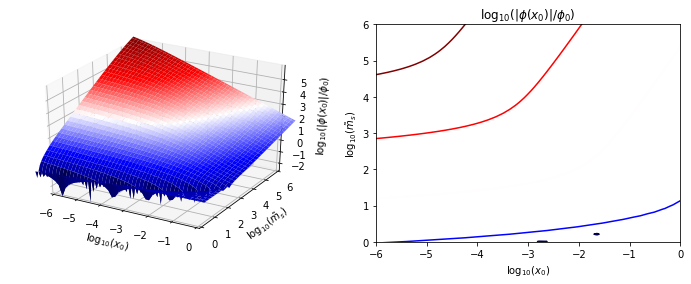

In [6]:
# Plot of field at surface

fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg,
                np.log10(abs(phi_rs_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg,
                np.log10(abs(phi_rs_array)),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

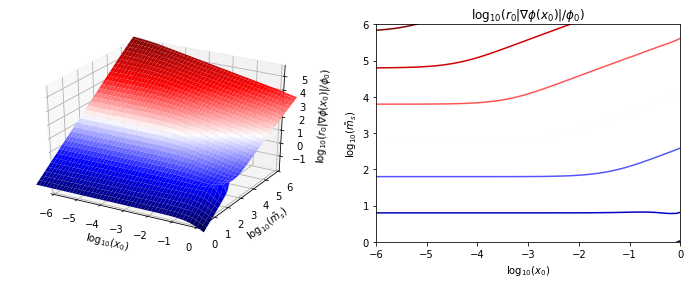

In [7]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg,
                np.log10(abs(grad_rs_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(r_0|\nabla\phi(x_0)|/\phi_0)$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg,
                np.log10(abs(grad_rs_array)),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(r_0|\nabla\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0.0, 6.0)

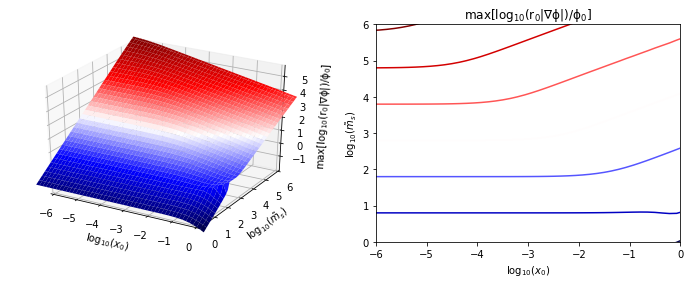

In [8]:
output = np.log10(abs(max_grad_array))
output_label = r'$\rm{max}[\log_{10}(r_0|\nabla\phi|)/\phi_0]$'

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, output,
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(output_label)

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, output,   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(output_label)

ax2.set_xlim(-6.,0.)
ax2.set_ylim(0.,6.)

(0, 6)

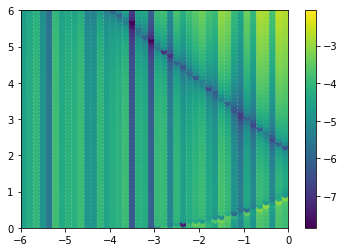

In [13]:
# Comparison of Derrick's theorem terms: should be equal

sm = np.sqrt( derrick1_array**2 + derrick2_array**2 )
rel_diff = abs( derrick1_array - derrick2_array ) / sm

cbar = plt.scatter( log_x0_mg, log_ms_mg, c=np.log10(rel_diff) )
plt.colorbar(cbar)

plt.xlim(-6,0)
plt.ylim(0,6)

(0.0, 6.0)

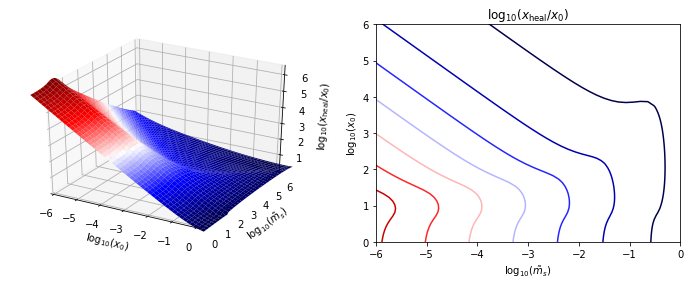

In [10]:
# Plot of healing length in units of source radius

output = np.log10(np.abs(healing_array))
output_label = r'$\log_{10}(x_{\rm heal}/x_0)$'

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, output,
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(output_label)

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg,
                output,   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_ylabel(r'$\log_{10}(x_0)$')
ax2.set_title(output_label)

ax2.set_xlim(-6.,0.)
ax2.set_ylim(0.,6.)

(0.0, 6.0)

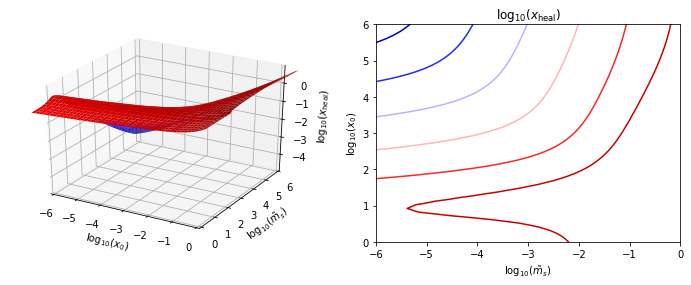

In [11]:
# Plot of healing length in units of 1/mu

output = np.log10(np.abs(Healing_array))
output_label = r'$\log_{10}(x_{\rm heal})$'

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, output,
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(output_label)

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, output,   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_ylabel(r'$\log_{10}(x_0)$')
ax2.set_title(output_label)

ax2.set_xlim(-6.,0.)
ax2.set_ylim(0.,6.)

(0.0, 6.0)

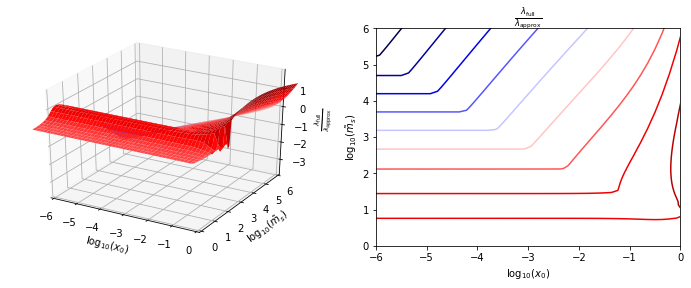

In [12]:
# Plot of scalar charge ratio

log_ratio = np.log10(np.abs(newcharges_array)) - \
        np.log10(np.abs(oldcharges_array))
    
output = log_ratio
output_label = r'$\frac{\lambda_{\rm full}}{\lambda_{\rm approx}}$'

levels = np.linspace( -3., 3., 13, endpoint=True )

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, output,
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(output_label)

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, output,   
                cmap='seismic', levels=levels )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(output_label)

ax2.set_xlim(-6.,0.)
ax2.set_ylim(0.,6.)